# **Global Trade Dependency Clustering:**

**1. Industry and Problem Type:**
      Our project navigates the complexities of global trade, sustainability, and economic development, utilizing Unsupervised Machine Learning methodologies, specifically clustering techniques.

**2. Business Objective and Desired Outcome:**
      At the heart of our endeavor lies the unraveling of the intricate web of global trade dependencies, with a keen focus on raw material imports and exports. The ultimate goal is to discern clusters among countries, illuminating unique trade patterns. This, in turn, aims to empower policymakers, economists, and environmentalists in making informed decisions.

While our project relies significantly on the Global Material Flows Database, challenges may arise in ensuring consistent data availability and quality across all parameters.

The proposed solution aims to construct a robust clustering model, capable of categorizing countries based on raw material dependencies. This model seeks to unlock insights into global resource distribution patterns, providing a nuanced understanding of the intricate dynamics over time.

## **Data Card:**

The Dataset is public and accessed from Wrold Bank Datasets and has the features as explained below:

1.   **Country** => Includes the country names

2.   **Category** => represents the category of the material
      
      (Domestic Extraction, Domestic Material Consumption, Domestic Material Input, Exports, Imports, Physical Trade Balance, etc.)

3.   **Flow name** => represents the flow of material

      ('Domestic Material Consumption','Domestic Material Input', 'Imports', 'Raw Material Equivalents of imports','Exports', 'Domestic Extraction', 'Raw Material Equivalents of exports', etc.)

4.   **Flow code** => code representation of flow name (e.g. **EXP** for Exports)

5.   **Flow unit** => unit used to quantify the material **t** (Tons)
6.   **1970 to 2019** => includes 50 columns for each year, which has information  for all countires, categories and their respective flow names


##**Data Collection**

In [1]:
!pip install requests beautifulsoup4

In [2]:
import warnings
# Ignore the FutureWarning about n_init in KMeans
warnings.filterwarnings("ignore", category=FutureWarning)

In [3]:
import requests
from bs4 import BeautifulSoup

# URL of the page
url = 'https://energydata.info/dataset/world-unep-irp-global-material-flows-database/resource/cb390844-66ec-4559-ac1a-e153bb94ee98?view_id=c8af74ec-f75a-4a4c-8eb3-dd8eb31b982b'  # Replace with the actual URL

# Send a GET request to the URL
response = requests.get(url)

# Check if the request was successful (status code 200)
if response.status_code == 200:
    # Parse the HTML content
    soup = BeautifulSoup(response.content, 'html.parser')

    # Find the download link within the HTML structure
    download_link = soup.find('a', class_='btn-primary')['href']

    # Print the download link
    print("Download Link:", download_link)

    # Download the file
    file_response = requests.get(download_link)
    with open('global-material-flows-database.csv', 'wb') as file:
        file.write(file_response.content)

    print("File downloaded successfully.")
else:
    print("Failed to retrieve the page. Status code:", response.status_code)

Download Link: https://energydata.info/dataset/8121a8bc-37b6-408a-91b4-b015c299b349/resource/cb390844-66ec-4559-ac1a-e153bb94ee98/download/global-material-flows-database.csv
File downloaded successfully.


In [4]:
import pandas as pd
df = pd.read_csv("/content/global-material-flows-database.csv")
df.head()

,Country,Category,Flow name,Flow code,Flow unit,1970,1971,1972,1973,1974,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Afghanistan,Biomass,Domestic Extraction,DE,t,29427854.0,28777035.0,27200896.0,29147772.0,30519158.0,...,37198019.0,34018329.0,37907859.0,38097802.0,39503300.0,37422531.0,37951985.0,35170079.0,33170392.0,33681475.0
1,Afghanistan,Biomass,Domestic Material Consumption,DMC,t,29476560.0,29136965.0,27290656.0,29112673.0,30433539.0,...,39001193.0,36654160.0,39953630.0,40324678.0,42368850.0,40730273.0,41903737.0,40132740.0,38165210.0,37202637.0
2,Afghanistan,Biomass,Domestic Material Input,DMI,t,29617873.0,29282898.0,27485608.0,29306247.0,30656605.0,...,39268631.0,36835574.0,40086686.0,40559216.0,42629687.0,41019516.0,42335796.0,40630738.0,39090334.0,38217826.0
3,Afghanistan,Biomass,Exports,EXP,t,141313.0,145933.0,194952.0,193574.0,223066.0,...,267439.0,181414.0,133056.0,234537.0,260837.0,289244.0,432059.0,497998.0,925124.0,1015189.0
4,Afghanistan,Biomass,Imports,IMP,t,190019.0,505863.0,284712.0,158475.0,137447.0,...,2070612.0,2817245.0,2178827.0,2461414.0,3126387.0,3596985.0,4383811.0,5460660.0,5919941.0,4536351.0


In [5]:
df['Category'].unique()

array(['Biomass', 'Excavated earthen materials (including soil) nec',
       'Fossil fuels', 'Metal ores', 'Mixed and complex products nec.',
       'Non-metallic minerals', 'Products from biomass',
       'Products from fossil fuels', 'Products from metals',
       'Products from non-metallic minerals',
       'Waste for final treatment and disposal'], dtype=object)

In [6]:
df.shape

(17094, 55)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17094 entries, 0 to 17093
Data columns (total 55 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Country    17094 non-null  object 
 1   Category   17094 non-null  object 
 2   Flow name  17094 non-null  object 
 3   Flow code  17094 non-null  object 
 4   Flow unit  17094 non-null  object 
 5   1970       17022 non-null  float64
 6   1971       17022 non-null  float64
 7   1972       17022 non-null  float64
 8   1973       17022 non-null  float64
 9   1974       17022 non-null  float64
 10  1975       17022 non-null  float64
 11  1976       17022 non-null  float64
 12  1977       17022 non-null  float64
 13  1978       17022 non-null  float64
 14  1979       17022 non-null  float64
 15  1980       17022 non-null  float64
 16  1981       17022 non-null  float64
 17  1982       17022 non-null  float64
 18  1983       17022 non-null  float64
 19  1984       17022 non-null  float64
 20  1985  

In [8]:
print("Total null values in dataset:")
print(df.isnull().sum())

Total null values in dataset:
Country       0
Category      0
Flow name     0
Flow code     0
Flow unit     0
1970         72
1971         72
1972         72
1973         72
1974         72
1975         72
1976         72
1977         72
1978         72
1979         72
1980         72
1981         72
1982         72
1983         72
1984         72
1985         72
1986         72
1987         72
1988         72
1989         72
1990         60
1991         60
1992         60
1993         60
1994         60
1995         60
1996         60
1997         60
1998         60
1999         60
2000         60
2001         60
2002         60
2003         60
2004         60
2005         60
2006         60
2007         60
2008         60
2009         60
2010         60
2011         60
2012         60
2013         60
2014         60
2015         60
2016         60
2017         60
2018         60
2019         60
dtype: int64


In [9]:
for i in range (1970, 2020):
    df[f'{i}'].fillna(0, inplace=True)

print("Total null values in dataset:")
print(df.isnull().sum())

Total null values in dataset:
Country      0
Category     0
Flow name    0
Flow code    0
Flow unit    0
1970         0
1971         0
1972         0
1973         0
1974         0
1975         0
1976         0
1977         0
1978         0
1979         0
1980         0
1981         0
1982         0
1983         0
1984         0
1985         0
1986         0
1987         0
1988         0
1989         0
1990         0
1991         0
1992         0
1993         0
1994         0
1995         0
1996         0
1997         0
1998         0
1999         0
2000         0
2001         0
2002         0
2003         0
2004         0
2005         0
2006         0
2007         0
2008         0
2009         0
2010         0
2011         0
2012         0
2013         0
2014         0
2015         0
2016         0
2017         0
2018         0
2019         0
dtype: int64


### **Figuring Data Extraction:**

In [10]:
import pandas as pd

# List of flow names to include
selected_flows = ['Domestic Material Consumption','Domestic Material Input', 'Imports', 'Raw Material Equivalents of imports',
                  'Exports', 'Domestic Extraction', 'Raw Material Equivalents of exports']

# Filter the DataFrame based on selected categories and flows
Afghanistan_df = df[(df['Country'] == 'Afghanistan') &
                              (df['Category']) &
                              (df['Flow name'].isin(selected_flows))]
Afghanistan_df = Afghanistan_df.drop(columns=['Flow code', 'Flow unit', 'Country'])

# Display the new DataFrame
Afghanistan_df.head()

,Category,Flow name,1970,1971,1972,1973,1974,1975,1976,1977,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Biomass,Domestic Extraction,29427854.0,28777035.0,27200896.0,29147772.0,30519158.0,32049875.0,33107085.0,31010917.0,...,37198019.0,34018329.0,37907859.0,38097802.0,39503300.0,37422531.0,37951985.0,35170079.0,33170392.0,33681475.0
1,Biomass,Domestic Material Consumption,29476560.0,29136965.0,27290656.0,29112673.0,30433539.0,31937999.0,32944294.0,30940758.0,...,39001193.0,36654160.0,39953630.0,40324678.0,42368850.0,40730273.0,41903737.0,40132740.0,38165210.0,37202637.0
2,Biomass,Domestic Material Input,29617873.0,29282898.0,27485608.0,29306247.0,30656605.0,32184560.0,33211150.0,31153757.0,...,39268631.0,36835574.0,40086686.0,40559216.0,42629687.0,41019516.0,42335796.0,40630738.0,39090334.0,38217826.0
3,Biomass,Exports,141313.0,145933.0,194952.0,193574.0,223066.0,246561.0,266856.0,212999.0,...,267439.0,181414.0,133056.0,234537.0,260837.0,289244.0,432059.0,497998.0,925124.0,1015189.0
4,Biomass,Imports,190019.0,505863.0,284712.0,158475.0,137447.0,134685.0,104065.0,142840.0,...,2070612.0,2817245.0,2178827.0,2461414.0,3126387.0,3596985.0,4383811.0,5460660.0,5919941.0,4536351.0


In [11]:
Afghanistan_df.columns

Index(['Category', 'Flow name', '1970', '1971', '1972', '1973', '1974', '1975',
       '1976', '1977', '1978', '1979', '1980', '1981', '1982', '1983', '1984',
       '1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993',
       '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002',
       '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011',
       '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019'],
      dtype='object')

In [12]:
# List of categories to include
selected_categories = ['Fossil fuels', 'Metal ores', 'Non-metallic minerals',
                       'Mixed and complex products nec.',  'Products from metals']


# Dictionary to store DataFrames for each category
category_dataframes = {}

# Iterate over selected categories
for category in selected_categories:
    # Filter the DataFrame for the current category
    current_category_df = Afghanistan_df[Afghanistan_df['Category'] == category]

    # Store the DataFrame in the dictionary
    category_dataframes[category] = current_category_df

afganistan_fossil_df = category_dataframes['Fossil fuels']
afganistan_fossil_df.reset_index(inplace= True)
afganistan_fossil_df = afganistan_fossil_df.drop(columns = ['Category', 'index'])
afganistan_fossil_df.head()

,Flow name,1970,1971,1972,1973,1974,1975,1976,1977,1978,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Domestic Extraction,1705428.0,1739818.0,1898704.0,1839998.0,1935038.0,1966952.0,1681102.0,1674604.0,1625014.0,...,824750.0,1593099.0,1352393.0,1455538.0,1617091.0,1467709.0,1814130.0,2300675.0,2552643.0,2725469.0
1,Domestic Material Consumption,112769.0,194831.0,148305.0,158713.0,184820.0,212450.0,142973.0,218913.0,140820.0,...,1009750.0,1752099.0,1354393.0,1429538.0,1570091.0,1242809.0,1281230.0,1489275.0,1638243.0,2156069.0
2,Domestic Material Input,1705428.0,1739818.0,1899704.0,1839998.0,1935038.0,1966952.0,1681102.0,1674604.0,1625014.0,...,1029750.0,1798099.0,1557393.0,1660538.0,1822091.0,1667809.0,2014230.0,2503275.0,2755243.0,2928069.0
3,Exports,1592659.0,1544987.0,1751399.0,1681285.0,1750218.0,1754502.0,1538129.0,1455691.0,1484194.0,...,20000.0,46000.0,203000.0,231000.0,252000.0,425000.0,733000.0,1014000.0,1117000.0,772000.0
4,Imports,0.0,0.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,...,205000.0,205000.0,205000.0,205000.0,205000.0,200100.0,200100.0,202600.0,202600.0,202600.0


In [13]:
# Transpose using the .T attribute
transposed_df_method2 = afganistan_fossil_df.T

# Reset the index to add a new index column
transposed_df_method2 = transposed_df_method2.reset_index(drop=True)

# Rename the columns using the values from row1
transposed_df_method2.columns = transposed_df_method2.iloc[0]

# Drop the first row (it now contains the column names)
transposed_df_method2 = transposed_df_method2[1:]

# Add a new index column
transposed_df_method2['NewIndex'] = range(1, len(transposed_df_method2) + 1)

transposed_df_method2 = transposed_df_method2.drop(columns = 'Domestic Material Consumption')

reordered_df = ['Domestic Extraction', 'Domestic Material Input', 'Imports', 'Exports', 'Raw Material Equivalents of imports',
                'Raw Material Equivalents of exports']
afganistan_fossil_df = transposed_df_method2[reordered_df]

afganistan_fossil_df.head()

,Domestic Extraction,Domestic Material Input,Imports,Exports,Raw Material Equivalents of imports,Raw Material Equivalents of exports
1,1705428.0,1705428.0,0.0,1592659.0,921691.0,278226.0
2,1739818.0,1739818.0,0.0,1544987.0,959610.0,283837.0
3,1898704.0,1899704.0,1000.0,1751399.0,965417.0,309757.0
4,1839998.0,1839998.0,0.0,1681285.0,1083178.0,300180.0
5,1935038.0,1935038.0,0.0,1750218.0,1130999.0,315685.0


In [14]:
df['Country'].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Asia + Pacific', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas',
       'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium',
       'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon', 'Canada',
       'Cape Verde', 'Cayman Islands', 'Central African Republic', 'Chad',
       'Chile', 'China', 'Colombia', 'Comoros', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curaçao',
       'Cyprus', 'Czechoslovakia', 'Czech Republic', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'DR Congo',
       'Ecuador', 'EECCA', 'Egypt', 'El Salvador', 'Equatorial Guinea',
       'Eritrea', 'Estonia', 'Ethiopia', 'Ethiopia (For

In [16]:
countries_to_keep = [
    'United States of America', 'China', 'Japan', 'Germany', 'India', 'United Kingdom', 'France', 'Russian Federation',
    'Canada', 'Italy', 'Brazil', 'Australia', 'South Korea', 'Taiwan', 'Mexico', 'Spain', 'Indonesia',
    'Saudi Arabia', 'Netherlands', 'Turkey', 'Switzerland', 'Poland', 'Argentina', 'Sweden', 'Norway',
    'Belgium', 'Ireland', 'Israel', 'United Arab Emirates', 'Thailand', 'Venezuela', 'Nigeria', 'Egypt',
    'Austria', 'Singapore', 'Bangladesh', 'Vietnam', 'Malaysia', 'South Africa', 'Philippines', 'Denmark',
    'Iran', 'Pakistan', 'Hong Kong', 'Colombia', 'Romania', 'Chile', 'Czechia', 'Finland', 'Iraq', 'Afghanistan', 'Armenia', 'Aruba', 'Cayman Islands', 'Portugal', 'Syria', 'Ukraine'
]

df = df[df['Country'].isin(countries_to_keep)]
df['Country'].unique()

array(['Afghanistan', 'Argentina', 'Armenia', 'Aruba', 'Australia',
       'Austria', 'Bangladesh', 'Belgium', 'Brazil', 'Canada',
       'Cayman Islands', 'Chile', 'China', 'Colombia', 'Denmark', 'Egypt',
       'Finland', 'France', 'Germany', 'Hong Kong', 'India', 'Indonesia',
       'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Japan', 'Malaysia',
       'Mexico', 'Netherlands', 'Nigeria', 'Norway', 'Pakistan',
       'Philippines', 'Poland', 'Portugal', 'Romania',
       'Russian Federation', 'Saudi Arabia', 'Singapore', 'South Africa',
       'South Korea', 'Spain', 'Sweden', 'Switzerland', 'Syria', 'Taiwan',
       'Thailand', 'Turkey', 'Ukraine', 'United Arab Emirates',
       'United Kingdom', 'United States of America', 'Venezuela'],
      dtype=object)

##**Data Extraction for top 49 Countries**

###**Automating the Data Extraction For All Countries:**

In [17]:
def filter_country_data(df, country_name, selected_flows):
    # Filter the DataFrame based on the selected country and flows
    country_df = df[(df['Country'] == country_name) & (df['Flow name'].isin(selected_flows))]
    return country_df.drop(columns=['Flow code', 'Flow unit', 'Country'])


def process_category_data(country_df, category_name, selected_flows):
    # Filter the DataFrame for the current category
    current_category_df = country_df[country_df['Category'] == category_name]

    # Reset the index
    current_category_df.reset_index(inplace=True)
    current_category_df = current_category_df.drop(columns=['Category', 'index'])

    # Transpose using the .T attribute
    transposed_df = current_category_df.T

    # Reset the index to add a new index column
    transposed_df = transposed_df.reset_index(drop=True)

    # Rename the columns using the values from row1
    transposed_df.columns = transposed_df.iloc[0]

    # Drop the first row (it now contains the column names)
    transposed_df = transposed_df[1:]

    # Check available flow names and include only those present in the DataFrame
    column_order = [flow for flow in selected_flows if flow in transposed_df.columns]

    # Reorder columns based on the specified order
    transposed_df = transposed_df[column_order]
    return transposed_df


selected_flows = ['Domestic Extraction', 'Domestic Material Input', 'Imports', 'Exports',
                'Raw Material Equivalents of imports', 'Raw Material Equivalents of exports']


country_df = filter_country_data(df, 'Argentina', selected_flows)


# List of countries
country_list = ['Afghanistan', 'Argentina', 'Australia', 'Austria', 'Bangladesh', 'Belgium',
                'Brazil', 'Canada', 'Chile', 'China', 'Colombia', 'Denmark',
                'Egypt', 'Finland', 'France', 'Germany', 'Hong Kong', 'India',
                'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Japan',
                'Malaysia', 'Mexico', 'Netherlands', 'Nigeria', 'Norway',
                'Pakistan', 'Philippines', 'Poland', 'Romania', 'Russian Federation', 'Saudi Arabia',
                'Singapore', 'South Africa', 'South Korea', 'Spain', 'Sweden',
                'Switzerland', 'Taiwan', 'Thailand', 'Turkey', 'Armenia', 'Aruba', 'Cayman Islands', 'Portugal', 'Syria', 'Ukraine',
                'United Arab Emirates', 'United States of America', 'United Kingdom', 'Venezuela']

# List of flows to include
selected_flows = ['Domestic Extraction', 'Domestic Material Input', 'Imports', 'Exports',
                  'Raw Material Equivalents of imports', 'Raw Material Equivalents of exports']

# List of categories to include
selected_categories = ['Fossil fuels', 'Metal ores', 'Non-metallic minerals', 'Mixed and complex products nec.', 'Products from metals']

# Dictionary to store DataFrames for each category for each country
category_dataframes_by_country = {}

# Iterate over countries
for country in country_list:
    # Filter the DataFrame for the current country
    country_df = filter_country_data(df, country, selected_flows)

    # Dictionary to store DataFrames for each category for the current country
    category_dataframes = {}

    # Iterate over selected categories
    for category in selected_categories:
        # Process data for the current category and country
        processed_df = process_category_data(country_df, category, selected_flows)

        # Store the DataFrame in the dictionary
        category_dataframes[category] = processed_df

    # Store the category DataFrames for the current country in the main dictionary
    category_dataframes_by_country[country] = category_dataframes


In [18]:
armenia_metalore_df = category_dataframes_by_country['Armenia']['Metal ores']
portugal_metalore_df = category_dataframes_by_country['Portugal']['Metal ores']
ukraine_metalore_df = category_dataframes_by_country['Ukraine']['Metal ores']

### **1. Argentina:**

In [19]:
argentina_fossil_df = category_dataframes_by_country['Argentina']['Fossil fuels']
argentina_metalore_df = category_dataframes_by_country['Argentina']['Metal ores']
argentina_nmm_df = category_dataframes_by_country['Argentina']['Non-metallic minerals']
argentina_mp_df = category_dataframes_by_country['Argentina']['Mixed and complex products nec.']
argentina_pfm_df = category_dataframes_by_country['Argentina']['Products from metals']

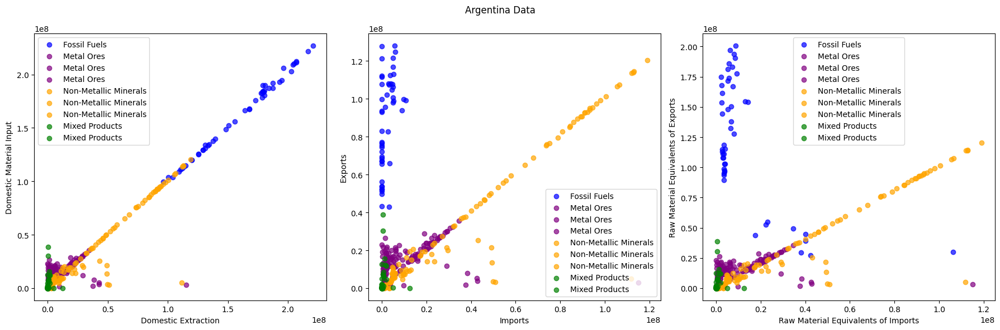

In [20]:
import matplotlib.pyplot as plt

argentina_fossil_df = category_dataframes['Fossil fuels']
argentina_metalore_df = category_dataframes['Metal ores']
argentina_nmm_df = category_dataframes['Non-metallic minerals']
argentina_mp_df = category_dataframes['Mixed and complex products nec.']
argentina_pfm_df = category_dataframes['Products from metals']


######## Fossil_data
arg_domestic_ext_fossil = argentina_fossil_df['Domestic Extraction']
arg_domestic_input_fossil = argentina_fossil_df['Domestic Material Input']
arg_imports_fossil = argentina_fossil_df['Imports']
arg_exports_fossil = argentina_fossil_df['Exports']
arg_raw_imports_fossil = argentina_fossil_df['Raw Material Equivalents of imports']
arg_raw_exports_fossil = argentina_fossil_df['Raw Material Equivalents of exports']


####### Metal Ores
arg_domestic_ext_metalore = argentina_metalore_df['Domestic Extraction']
arg_domestic_input_metalore = argentina_metalore_df['Domestic Material Input']
arg_imports_metalore = argentina_metalore_df['Imports']
arg_exports_metalore = argentina_metalore_df['Exports']
arg_raw_imports_metalore = argentina_metalore_df['Raw Material Equivalents of imports']
arg_raw_exports_metalore = argentina_metalore_df['Raw Material Equivalents of exports']


####### nonMetallic Minerals
arg_domestic_ext_nmm = argentina_nmm_df ['Domestic Extraction']
arg_domestic_input_nmm = argentina_nmm_df ['Domestic Material Input']
arg_imports_nmm = argentina_nmm_df ['Imports']
arg_exports_nmm = argentina_nmm_df ['Exports']
arg_raw_imports_nmm = argentina_nmm_df ['Raw Material Equivalents of imports']
arg_raw_exports_nmm = argentina_nmm_df ['Raw Material Equivalents of exports']


####### Mixed Products
arg_domestic_ext_mp = argentina_mp_df['Domestic Extraction']
arg_domestic_input_mp = argentina_mp_df['Domestic Material Input']
arg_imports_mp = argentina_mp_df['Imports']
arg_exports_mp = argentina_mp_df['Exports']


####### Products from metals
arg_domestic_ext_pfm = argentina_pfm_df['Domestic Extraction']
arg_domestic_input_pfm = argentina_pfm_df['Domestic Material Input']
arg_imports_pfm = argentina_pfm_df['Imports']
arg_exports_pfm = argentina_pfm_df['Exports']



# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Argentina Data')
# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], arg_domestic_ext_fossil, arg_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], arg_imports_fossil, arg_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], arg_raw_imports_fossil, arg_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (arg_domestic_ext_metalore, arg_domestic_input_metalore, 'purple', 'Metal Ores'),
    (arg_imports_metalore, arg_exports_metalore, 'purple', 'Metal Ores'),
    (arg_raw_imports_metalore, arg_raw_exports_metalore, 'purple', 'Metal Ores'),
    (arg_domestic_ext_nmm, arg_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (arg_imports_nmm, arg_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (arg_raw_imports_nmm, arg_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (arg_domestic_ext_mp, arg_domestic_input_mp, 'green', 'Mixed Products'),
    (arg_imports_mp, arg_exports_mp, 'green', 'Mixed Products'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **2. Australia:**

In [21]:
australia_fossil_df = category_dataframes_by_country['Australia']['Fossil fuels']
australia_metalore_df = category_dataframes_by_country['Australia']['Metal ores']
australia_nmm_df = category_dataframes_by_country['Australia']['Non-metallic minerals']
australia_mp_df = category_dataframes_by_country['Australia']['Mixed and complex products nec.']
australia_pfm_df = category_dataframes_by_country['Australia']['Products from metals']

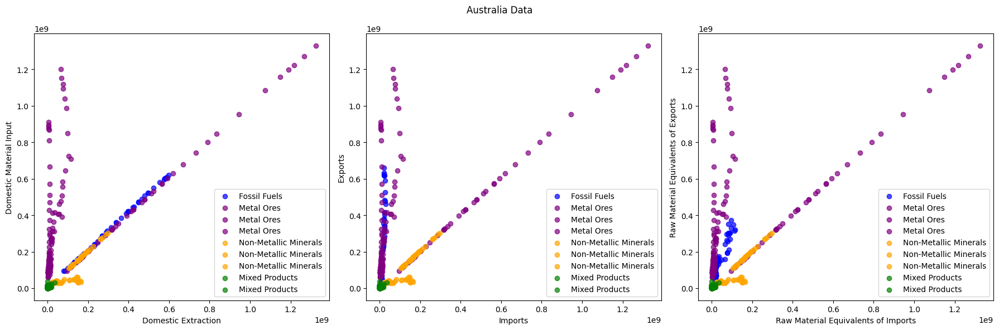

In [22]:
######## Fossil_data
aus_domestic_ext_fossil = australia_fossil_df['Domestic Extraction']
aus_domestic_input_fossil = australia_fossil_df['Domestic Material Input']
aus_imports_fossil = australia_fossil_df['Imports']
aus_exports_fossil = australia_fossil_df['Exports']
aus_raw_imports_fossil = australia_fossil_df['Raw Material Equivalents of imports']
aus_raw_exports_fossil = australia_fossil_df['Raw Material Equivalents of exports']


####### Metal Ores
aus_domestic_ext_metalore = australia_metalore_df['Domestic Extraction']
aus_domestic_input_metalore = australia_metalore_df['Domestic Material Input']
aus_imports_metalore = australia_metalore_df['Imports']
aus_exports_metalore = australia_metalore_df['Exports']
aus_raw_imports_metalore = australia_metalore_df['Raw Material Equivalents of imports']
aus_raw_exports_metalore = australia_metalore_df['Raw Material Equivalents of exports']


####### nonMetallic Minerals
aus_domestic_ext_nmm = australia_nmm_df ['Domestic Extraction']
aus_domestic_input_nmm = australia_nmm_df ['Domestic Material Input']
aus_imports_nmm = australia_nmm_df ['Imports']
aus_exports_nmm = australia_nmm_df ['Exports']
aus_raw_imports_nmm = australia_nmm_df ['Raw Material Equivalents of imports']
aus_raw_exports_nmm = australia_nmm_df ['Raw Material Equivalents of exports']


####### Mixed Products
aus_domestic_ext_mp = australia_mp_df['Domestic Extraction']
aus_domestic_input_mp = australia_mp_df['Domestic Material Input']
aus_imports_mp = australia_mp_df['Imports']
aus_exports_mp = australia_mp_df['Exports']


####### Products from metals
aus_domestic_ext_pfm = australia_pfm_df['Domestic Extraction']
aus_domestic_input_pfm = australia_pfm_df['Domestic Material Input']
aus_imports_pfm = australia_pfm_df['Imports']
aus_exports_pfm = australia_pfm_df['Exports']



# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Australia Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], aus_domestic_ext_fossil, aus_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], aus_imports_fossil, aus_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], aus_raw_imports_fossil, aus_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (aus_domestic_ext_metalore, aus_domestic_input_metalore, 'purple', 'Metal Ores'),
    (aus_imports_metalore, aus_exports_metalore, 'purple', 'Metal Ores'),
    (aus_raw_imports_metalore, aus_raw_exports_metalore, 'purple', 'Metal Ores'),
    (aus_domestic_ext_nmm, aus_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (aus_imports_nmm, aus_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (aus_raw_imports_nmm, aus_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (aus_domestic_ext_mp, aus_domestic_input_mp, 'green', 'Mixed Products'),
    (aus_imports_mp, aus_exports_mp, 'green', 'Mixed Products'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **3. Afghanistan:**

In [23]:
afghanistan_fossil_df = category_dataframes_by_country['Afghanistan']['Fossil fuels']
afghanistan_metalore_df = category_dataframes_by_country['Afghanistan']['Metal ores']
afghanistan_nmm_df = category_dataframes_by_country['Afghanistan']['Non-metallic minerals']
afghanistan_mp_df = category_dataframes_by_country['Afghanistan']['Mixed and complex products nec.']
afghanistan_pfm_df = category_dataframes_by_country['Afghanistan']['Products from metals']

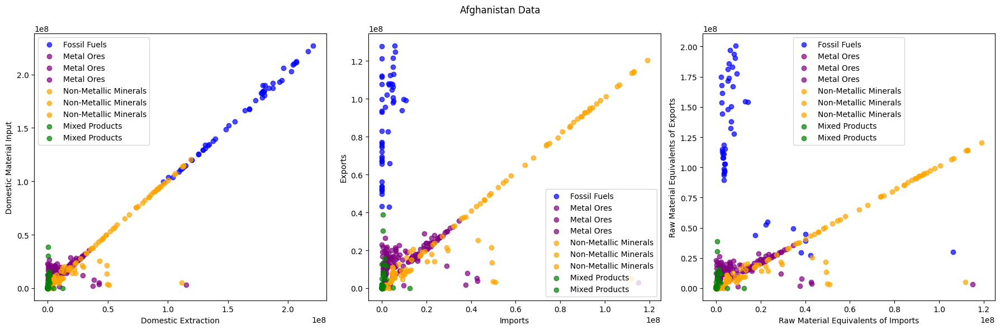

In [24]:
import matplotlib.pyplot as plt
# Country, Domestic Extraction, Domestic Material Input, Imports, Exports, Raw Material Equivalents of imports, Raw Material Equivalents of exports

afghanistan_fossil_df = category_dataframes['Fossil fuels']
afghanistan_metalore_df = category_dataframes['Metal ores']
afghanistan_nmm_df = category_dataframes['Non-metallic minerals']
afghanistan_mp_df = category_dataframes['Mixed and complex products nec.']
afghanistan_pfm_df = category_dataframes['Products from metals']


######## Fossil_data
afg_domestic_ext_fossil = afghanistan_fossil_df['Domestic Extraction']
afg_domestic_input_fossil = afghanistan_fossil_df['Domestic Material Input']
afg_imports_fossil = afghanistan_fossil_df['Imports']
afg_exports_fossil = afghanistan_fossil_df['Exports']
afg_raw_imports_fossil = afghanistan_fossil_df['Raw Material Equivalents of imports']
afg_raw_exports_fossil = afghanistan_fossil_df['Raw Material Equivalents of exports']


####### Metal Ores
afg_domestic_ext_metalore = afghanistan_metalore_df['Domestic Extraction']
afg_domestic_input_metalore = afghanistan_metalore_df['Domestic Material Input']
afg_imports_metalore = afghanistan_metalore_df['Imports']
afg_exports_metalore = afghanistan_metalore_df['Exports']
afg_raw_imports_metalore = afghanistan_metalore_df['Raw Material Equivalents of imports']
afg_raw_exports_metalore = afghanistan_metalore_df['Raw Material Equivalents of exports']


####### nonMetallic Minerals
afg_domestic_ext_nmm = afghanistan_nmm_df['Domestic Extraction']
afg_domestic_input_nmm = afghanistan_nmm_df['Domestic Material Input']
afg_imports_nmm = afghanistan_nmm_df['Imports']
afg_exports_nmm = afghanistan_nmm_df['Exports']
afg_raw_imports_nmm = afghanistan_nmm_df['Raw Material Equivalents of imports']
afg_raw_exports_nmm = afghanistan_nmm_df['Raw Material Equivalents of exports']


####### Mixed Products
afg_domestic_ext_mp = afghanistan_mp_df['Domestic Extraction']
afg_domestic_input_mp = afghanistan_mp_df['Domestic Material Input']
afg_imports_mp = afghanistan_mp_df['Imports']
afg_exports_mp = afghanistan_mp_df['Exports']


####### Products from metals
afg_domestic_ext_pfm = afghanistan_pfm_df['Domestic Extraction']
afg_domestic_input_pfm = afghanistan_pfm_df['Domestic Material Input']
afg_imports_pfm = afghanistan_pfm_df['Imports']
afg_exports_pfm = afghanistan_pfm_df['Exports']



# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Afghanistan Data')
# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], afg_domestic_ext_fossil, afg_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], afg_imports_fossil, afg_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], afg_raw_imports_fossil, afg_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (afg_domestic_ext_metalore, afg_domestic_input_metalore, 'purple', 'Metal Ores'),
    (afg_imports_metalore, afg_exports_metalore, 'purple', 'Metal Ores'),
    (afg_raw_imports_metalore, afg_raw_exports_metalore, 'purple', 'Metal Ores'),
    (afg_domestic_ext_nmm, afg_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (afg_imports_nmm, afg_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (afg_raw_imports_nmm, afg_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (afg_domestic_ext_mp, afg_domestic_input_mp, 'green', 'Mixed Products'),
    (afg_imports_mp, afg_exports_mp, 'green', 'Mixed Products'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **4. India:**

In [25]:
india_fossil_df = category_dataframes_by_country['India']['Fossil fuels']
india_metalore_df = category_dataframes_by_country['India']['Metal ores']
india_nmm_df = category_dataframes_by_country['India']['Non-metallic minerals']
india_mp_df = category_dataframes_by_country['India']['Mixed and complex products nec.']
india_pfm_df = category_dataframes_by_country['India']['Products from metals']

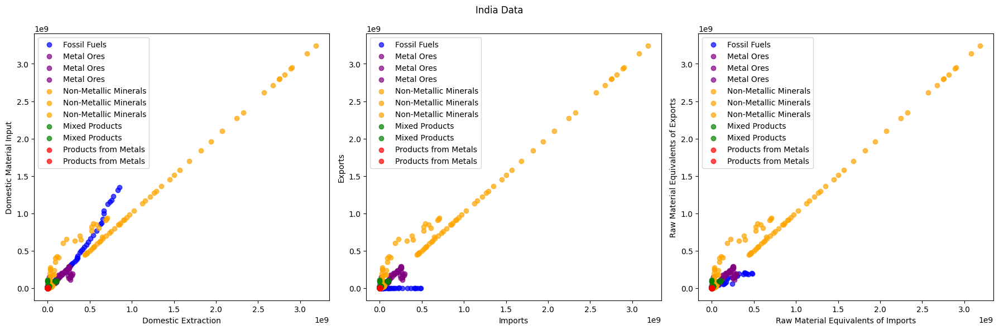

In [26]:
import matplotlib.pyplot as plt

# Fossil_data
ind_domestic_ext_fossil = india_fossil_df['Domestic Extraction']
ind_domestic_input_fossil = india_fossil_df['Domestic Material Input']
ind_imports_fossil = india_fossil_df['Imports']
ind_exports_fossil = india_fossil_df['Exports']
ind_raw_imports_fossil = india_fossil_df['Raw Material Equivalents of imports']
ind_raw_exports_fossil = india_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
ind_domestic_ext_metalore = india_metalore_df['Domestic Extraction']
ind_domestic_input_metalore = india_metalore_df['Domestic Material Input']
ind_imports_metalore = india_metalore_df['Imports']
ind_exports_metalore = india_metalore_df['Exports']
ind_raw_imports_metalore = india_metalore_df['Raw Material Equivalents of imports']
ind_raw_exports_metalore = india_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
ind_domestic_ext_nmm = india_nmm_df['Domestic Extraction']
ind_domestic_input_nmm = india_nmm_df['Domestic Material Input']
ind_imports_nmm = india_nmm_df['Imports']
ind_exports_nmm = india_nmm_df['Exports']
ind_raw_imports_nmm = india_nmm_df['Raw Material Equivalents of imports']
ind_raw_exports_nmm = india_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
ind_domestic_ext_mp = india_mp_df['Domestic Extraction']
ind_domestic_input_mp = india_mp_df['Domestic Material Input']
ind_imports_mp = india_mp_df['Imports']
ind_exports_mp = india_mp_df['Exports']

# Products from metals
ind_domestic_ext_pfm = india_pfm_df['Domestic Extraction']
ind_domestic_input_pfm = india_pfm_df['Domestic Material Input']
ind_imports_pfm = india_pfm_df['Imports']
ind_exports_pfm = india_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('India Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], ind_domestic_ext_fossil, ind_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], ind_imports_fossil, ind_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], ind_raw_imports_fossil, ind_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (ind_domestic_ext_metalore, ind_domestic_input_metalore, 'purple', 'Metal Ores'),
    (ind_imports_metalore, ind_exports_metalore, 'purple', 'Metal Ores'),
    (ind_raw_imports_metalore, ind_raw_exports_metalore, 'purple', 'Metal Ores'),

    (ind_domestic_ext_nmm, ind_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (ind_imports_nmm, ind_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (ind_raw_imports_nmm, ind_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (ind_domestic_ext_mp, ind_domestic_input_mp, 'green', 'Mixed Products'),
    (ind_imports_mp, ind_exports_mp, 'green', 'Mixed Products'),

    (ind_domestic_ext_pfm, ind_domestic_input_pfm, 'red', 'Products from Metals'),
    (ind_imports_pfm, ind_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **5. Austria:**

In [27]:
austria_fossil_df = category_dataframes_by_country['Austria']['Fossil fuels']
austria_metalore_df = category_dataframes_by_country['Austria']['Metal ores']
austria_nmm_df = category_dataframes_by_country['Austria']['Non-metallic minerals']
austria_mp_df = category_dataframes_by_country['Austria']['Mixed and complex products nec.']
austria_pfm_df = category_dataframes_by_country['Austria']['Products from metals']

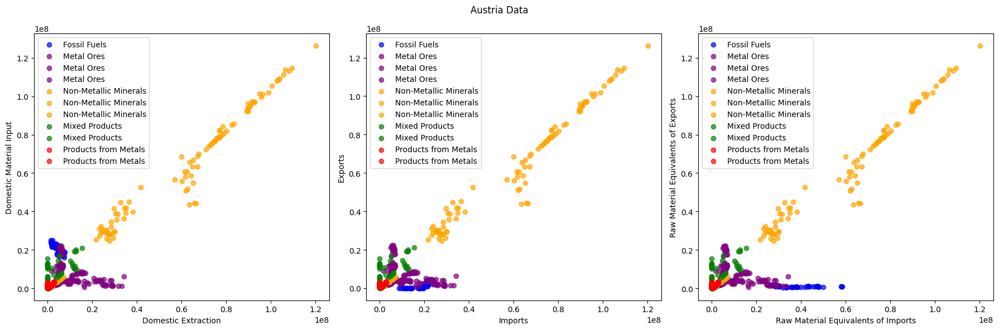

In [28]:
import matplotlib.pyplot as plt

# Fossil_data
aust_domestic_ext_fossil = austria_fossil_df['Domestic Extraction']
aust_domestic_input_fossil = austria_fossil_df['Domestic Material Input']
aust_imports_fossil = austria_fossil_df['Imports']
aust_exports_fossil = austria_fossil_df['Exports']
aust_raw_imports_fossil = austria_fossil_df['Raw Material Equivalents of imports']
aust_raw_exports_fossil = austria_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
aust_domestic_ext_metalore = austria_metalore_df['Domestic Extraction']
aust_domestic_input_metalore = austria_metalore_df['Domestic Material Input']
aust_imports_metalore = austria_metalore_df['Imports']
aust_exports_metalore = austria_metalore_df['Exports']
aust_raw_imports_metalore = austria_metalore_df['Raw Material Equivalents of imports']
aust_raw_exports_metalore = austria_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
aust_domestic_ext_nmm = austria_nmm_df['Domestic Extraction']
aust_domestic_input_nmm = austria_nmm_df['Domestic Material Input']
aust_imports_nmm = austria_nmm_df['Imports']
aust_exports_nmm = austria_nmm_df['Exports']
aust_raw_imports_nmm = austria_nmm_df['Raw Material Equivalents of imports']
aust_raw_exports_nmm = austria_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
aust_domestic_ext_mp = austria_mp_df['Domestic Extraction']
aust_domestic_input_mp = austria_mp_df['Domestic Material Input']
aust_imports_mp = austria_mp_df['Imports']
aust_exports_mp = austria_mp_df['Exports']

# Products from metals
aust_domestic_ext_pfm = austria_pfm_df['Domestic Extraction']
aust_domestic_input_pfm = austria_pfm_df['Domestic Material Input']
aust_imports_pfm = austria_pfm_df['Imports']
aust_exports_pfm = austria_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Austria Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], aust_domestic_ext_fossil, aust_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], aust_imports_fossil, aust_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], aust_raw_imports_fossil, aust_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (aust_domestic_ext_metalore, aust_domestic_input_metalore, 'purple', 'Metal Ores'),
    (aust_imports_metalore, aust_exports_metalore, 'purple', 'Metal Ores'),
    (aust_raw_imports_metalore, aust_raw_exports_metalore, 'purple', 'Metal Ores'),

    (aust_domestic_ext_nmm, aust_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (aust_imports_nmm, aust_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (aust_raw_imports_nmm, aust_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (aust_domestic_ext_mp, aust_domestic_input_mp, 'green', 'Mixed Products'),
    (aust_imports_mp, aust_exports_mp, 'green', 'Mixed Products'),

    (aust_domestic_ext_pfm, aust_domestic_input_pfm, 'red', 'Products from Metals'),
    (aust_imports_pfm, aust_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**6. Bangladesh:**

In [29]:
bangladesh_fossil_df = category_dataframes_by_country['Bangladesh']['Fossil fuels']
bangladesh_metalore_df = category_dataframes_by_country['Bangladesh']['Metal ores']
bangladesh_nmm_df = category_dataframes_by_country['Bangladesh']['Non-metallic minerals']
bangladesh_mp_df = category_dataframes_by_country['Bangladesh']['Mixed and complex products nec.']
bangladesh_pfm_df = category_dataframes_by_country['Bangladesh']['Products from metals']

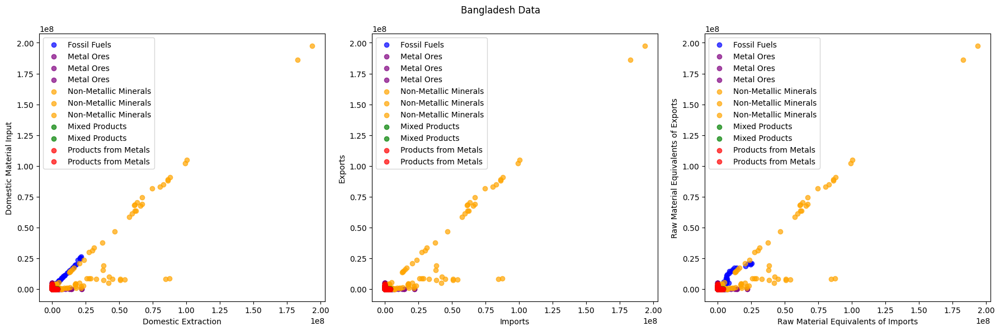

In [30]:
import matplotlib.pyplot as plt

# Fossil_data
bang_domestic_ext_fossil = bangladesh_fossil_df['Domestic Extraction']
bang_domestic_input_fossil = bangladesh_fossil_df['Domestic Material Input']
bang_imports_fossil = bangladesh_fossil_df['Imports']
bang_exports_fossil = bangladesh_fossil_df['Exports']
bang_raw_imports_fossil = bangladesh_fossil_df['Raw Material Equivalents of imports']
bang_raw_exports_fossil = bangladesh_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
bang_domestic_ext_metalore = bangladesh_metalore_df['Domestic Extraction']
bang_domestic_input_metalore = bangladesh_metalore_df['Domestic Material Input']
bang_imports_metalore = bangladesh_metalore_df['Imports']
bang_exports_metalore = bangladesh_metalore_df['Exports']
bang_raw_imports_metalore = bangladesh_metalore_df['Raw Material Equivalents of imports']
bang_raw_exports_metalore = bangladesh_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
bang_domestic_ext_nmm = bangladesh_nmm_df['Domestic Extraction']
bang_domestic_input_nmm = bangladesh_nmm_df['Domestic Material Input']
bang_imports_nmm = bangladesh_nmm_df['Imports']
bang_exports_nmm = bangladesh_nmm_df['Exports']
bang_raw_imports_nmm = bangladesh_nmm_df['Raw Material Equivalents of imports']
bang_raw_exports_nmm = bangladesh_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
bang_domestic_ext_mp = bangladesh_mp_df['Domestic Extraction']
bang_domestic_input_mp = bangladesh_mp_df['Domestic Material Input']
bang_imports_mp = bangladesh_mp_df['Imports']
bang_exports_mp = bangladesh_mp_df['Exports']

# Products from metals
bang_domestic_ext_pfm = bangladesh_pfm_df['Domestic Extraction']
bang_domestic_input_pfm = bangladesh_pfm_df['Domestic Material Input']
bang_imports_pfm = bangladesh_pfm_df['Imports']
bang_exports_pfm = bangladesh_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Bangladesh Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], bang_domestic_ext_fossil, bang_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], bang_imports_fossil, bang_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], bang_raw_imports_fossil, bang_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (bang_domestic_ext_metalore, bang_domestic_input_metalore, 'purple', 'Metal Ores'),
    (bang_imports_metalore, bang_exports_metalore, 'purple', 'Metal Ores'),
    (bang_raw_imports_metalore, bang_raw_exports_metalore, 'purple', 'Metal Ores'),

    (bang_domestic_ext_nmm, bang_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (bang_imports_nmm, bang_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (bang_raw_imports_nmm, bang_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (bang_domestic_ext_mp, bang_domestic_input_mp, 'green', 'Mixed Products'),
    (bang_imports_mp, bang_exports_mp, 'green', 'Mixed Products'),

    (bang_domestic_ext_pfm, bang_domestic_input_pfm, 'red', 'Products from Metals'),
    (bang_imports_pfm, bang_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**7. Belgium:**

In [31]:
belgium_fossil_df = category_dataframes_by_country['Bangladesh']['Fossil fuels']
belgium_metalore_df = category_dataframes_by_country['Bangladesh']['Metal ores']
belgium_nmm_df = category_dataframes_by_country['Bangladesh']['Non-metallic minerals']
belgium_mp_df = category_dataframes_by_country['Bangladesh']['Mixed and complex products nec.']
belgium_pfm_df = category_dataframes_by_country['Bangladesh']['Products from metals']

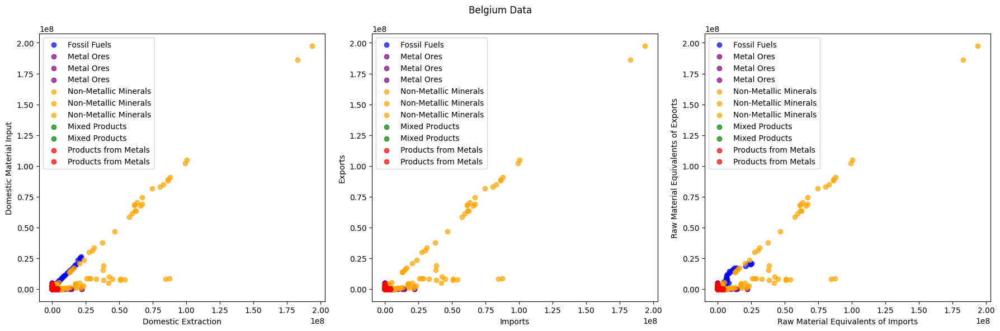

In [32]:
import matplotlib.pyplot as plt

# Fossil_data
bel_domestic_ext_fossil = belgium_fossil_df['Domestic Extraction']
bel_domestic_input_fossil = belgium_fossil_df['Domestic Material Input']
bel_imports_fossil = belgium_fossil_df['Imports']
bel_exports_fossil = belgium_fossil_df['Exports']
bel_raw_imports_fossil = belgium_fossil_df['Raw Material Equivalents of imports']
bel_raw_exports_fossil = belgium_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
bel_domestic_ext_metalore = belgium_metalore_df['Domestic Extraction']
bel_domestic_input_metalore = belgium_metalore_df['Domestic Material Input']
bel_imports_metalore = belgium_metalore_df['Imports']
bel_exports_metalore = belgium_metalore_df['Exports']
bel_raw_imports_metalore = belgium_metalore_df['Raw Material Equivalents of imports']
bel_raw_exports_metalore = belgium_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
bel_domestic_ext_nmm = belgium_nmm_df['Domestic Extraction']
bel_domestic_input_nmm = belgium_nmm_df['Domestic Material Input']
bel_imports_nmm = belgium_nmm_df['Imports']
bel_exports_nmm = belgium_nmm_df['Exports']
bel_raw_imports_nmm = belgium_nmm_df['Raw Material Equivalents of imports']
bel_raw_exports_nmm = belgium_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
bel_domestic_ext_mp = belgium_mp_df['Domestic Extraction']
bel_domestic_input_mp = belgium_mp_df['Domestic Material Input']
bel_imports_mp = belgium_mp_df['Imports']
bel_exports_mp = belgium_mp_df['Exports']

# Products from metals
bel_domestic_ext_pfm = belgium_pfm_df['Domestic Extraction']
bel_domestic_input_pfm = belgium_pfm_df['Domestic Material Input']
bel_imports_pfm = belgium_pfm_df['Imports']
bel_exports_pfm = belgium_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Belgium Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], bel_domestic_ext_fossil, bel_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], bel_imports_fossil, bel_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], bel_raw_imports_fossil, bel_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (bel_domestic_ext_metalore, bel_domestic_input_metalore, 'purple', 'Metal Ores'),
    (bel_imports_metalore, bel_exports_metalore, 'purple', 'Metal Ores'),
    (bel_raw_imports_metalore, bel_raw_exports_metalore, 'purple', 'Metal Ores'),

    (bel_domestic_ext_nmm, bel_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (bel_imports_nmm, bel_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (bel_raw_imports_nmm, bel_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (bel_domestic_ext_mp, bel_domestic_input_mp, 'green', 'Mixed Products'),
    (bel_imports_mp, bel_exports_mp, 'green', 'Mixed Products'),

    (bel_domestic_ext_pfm, bel_domestic_input_pfm, 'red', 'Products from Metals'),
    (bel_imports_pfm, bel_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**8. Brazil:**

In [33]:
brazil_fossil_df = category_dataframes_by_country['Brazil']['Fossil fuels']
brazil_metalore_df = category_dataframes_by_country['Brazil']['Metal ores']
brazil_nmm_df = category_dataframes_by_country['Brazil']['Non-metallic minerals']
brazil_mp_df = category_dataframes_by_country['Brazil']['Mixed and complex products nec.']
brazil_pfm_df = category_dataframes_by_country['Brazil']['Products from metals']

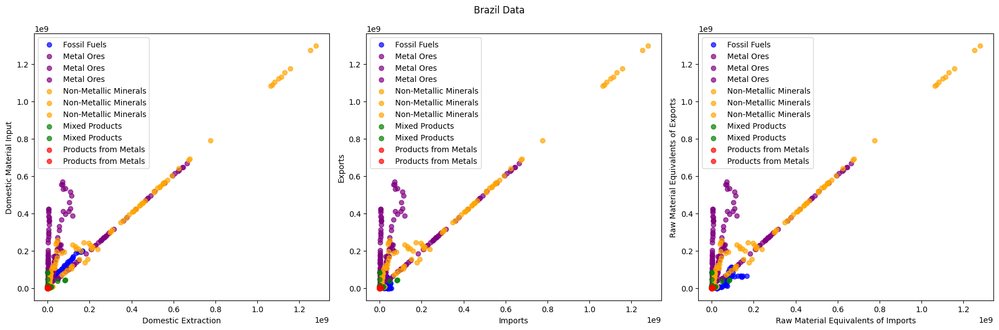

In [34]:
import matplotlib.pyplot as plt

# Fossil_data
bra_domestic_ext_fossil = brazil_fossil_df['Domestic Extraction']
bra_domestic_input_fossil = brazil_fossil_df['Domestic Material Input']
bra_imports_fossil = brazil_fossil_df['Imports']
bra_exports_fossil = brazil_fossil_df['Exports']
bra_raw_imports_fossil = brazil_fossil_df['Raw Material Equivalents of imports']
bra_raw_exports_fossil = brazil_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
bra_domestic_ext_metalore = brazil_metalore_df['Domestic Extraction']
bra_domestic_input_metalore = brazil_metalore_df['Domestic Material Input']
bra_imports_metalore = brazil_metalore_df['Imports']
bra_exports_metalore = brazil_metalore_df['Exports']
bra_raw_imports_metalore = brazil_metalore_df['Raw Material Equivalents of imports']
bra_raw_exports_metalore = brazil_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
bra_domestic_ext_nmm = brazil_nmm_df['Domestic Extraction']
bra_domestic_input_nmm = brazil_nmm_df['Domestic Material Input']
bra_imports_nmm = brazil_nmm_df['Imports']
bra_exports_nmm = brazil_nmm_df['Exports']
bra_raw_imports_nmm = brazil_nmm_df['Raw Material Equivalents of imports']
bra_raw_exports_nmm = brazil_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
bra_domestic_ext_mp = brazil_mp_df['Domestic Extraction']
bra_domestic_input_mp = brazil_mp_df['Domestic Material Input']
bra_imports_mp = brazil_mp_df['Imports']
bra_exports_mp = brazil_mp_df['Exports']

# Products from metals
bra_domestic_ext_pfm = brazil_pfm_df['Domestic Extraction']
bra_domestic_input_pfm = brazil_pfm_df['Domestic Material Input']
bra_imports_pfm = brazil_pfm_df['Imports']
bra_exports_pfm = brazil_pfm_df['Exports']


# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Brazil Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()


# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], bra_domestic_ext_fossil, bra_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], bra_imports_fossil, bra_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], bra_raw_imports_fossil, bra_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (bra_domestic_ext_metalore, bra_domestic_input_metalore, 'purple', 'Metal Ores'),
    (bra_imports_metalore, bra_exports_metalore, 'purple', 'Metal Ores'),
    (bra_raw_imports_metalore, bra_raw_exports_metalore, 'purple', 'Metal Ores'),

    (bra_domestic_ext_nmm, bra_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (bra_imports_nmm, bra_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (bra_raw_imports_nmm, bra_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (bra_domestic_ext_mp, bra_domestic_input_mp, 'green', 'Mixed Products'),
    (bra_imports_mp, bra_exports_mp, 'green', 'Mixed Products'),

    (bra_domestic_ext_pfm, bra_domestic_input_pfm, 'red', 'Products from Metals'),
    (bra_imports_pfm, bra_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, labra in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, labra, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, labra, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, labra, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**9. Canada:**

In [35]:
canada_fossil_df = category_dataframes_by_country['Canada']['Fossil fuels']
canada_metalore_df = category_dataframes_by_country['Canada']['Metal ores']
canada_nmm_df = category_dataframes_by_country['Canada']['Non-metallic minerals']
canada_mp_df = category_dataframes_by_country['Canada']['Mixed and complex products nec.']
canada_pfm_df = category_dataframes_by_country['Canada']['Products from metals']

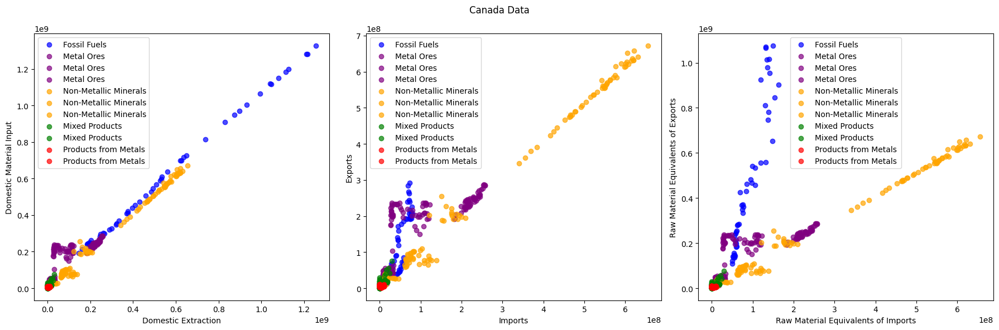

In [36]:
import matplotlib.pyplot as plt

# Fossil_data
can_domestic_ext_fossil = canada_fossil_df['Domestic Extraction']
can_domestic_input_fossil = canada_fossil_df['Domestic Material Input']
can_imports_fossil = canada_fossil_df['Imports']
can_exports_fossil = canada_fossil_df['Exports']
can_raw_imports_fossil = canada_fossil_df['Raw Material Equivalents of imports']
can_raw_exports_fossil = canada_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
can_domestic_ext_metalore = canada_metalore_df['Domestic Extraction']
can_domestic_input_metalore = canada_metalore_df['Domestic Material Input']
can_imports_metalore = canada_metalore_df['Imports']
can_exports_metalore = canada_metalore_df['Exports']
can_raw_imports_metalore = canada_metalore_df['Raw Material Equivalents of imports']
can_raw_exports_metalore = canada_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
can_domestic_ext_nmm = canada_nmm_df['Domestic Extraction']
can_domestic_input_nmm = canada_nmm_df['Domestic Material Input']
can_imports_nmm = canada_nmm_df['Imports']
can_exports_nmm = canada_nmm_df['Exports']
can_raw_imports_nmm = canada_nmm_df['Raw Material Equivalents of imports']
can_raw_exports_nmm = canada_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
can_domestic_ext_mp = canada_mp_df['Domestic Extraction']
can_domestic_input_mp = canada_mp_df['Domestic Material Input']
can_imports_mp = canada_mp_df['Imports']
can_exports_mp = canada_mp_df['Exports']

# Products from metals
can_domestic_ext_pfm = canada_pfm_df['Domestic Extraction']
can_domestic_input_pfm = canada_pfm_df['Domestic Material Input']
can_imports_pfm = canada_pfm_df['Imports']
can_exports_pfm = canada_pfm_df['Exports']


# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Canada Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()


# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], can_domestic_ext_fossil, can_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], can_imports_fossil, can_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], can_raw_imports_fossil, can_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (can_domestic_ext_metalore, can_domestic_input_metalore, 'purple', 'Metal Ores'),
    (can_imports_metalore, can_exports_metalore, 'purple', 'Metal Ores'),
    (can_raw_imports_metalore, can_raw_exports_metalore, 'purple', 'Metal Ores'),

    (can_domestic_ext_nmm, can_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (can_imports_nmm, can_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (can_raw_imports_nmm, can_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (can_domestic_ext_mp, can_domestic_input_mp, 'green', 'Mixed Products'),
    (can_imports_mp, can_exports_mp, 'green', 'Mixed Products'),

    (can_domestic_ext_pfm, can_domestic_input_pfm, 'red', 'Products from Metals'),
    (can_imports_pfm, can_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, labra in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, labra, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, labra, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, labra, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **10. Chile:**

In [37]:
chile_fossil_df = category_dataframes_by_country['Chile']['Fossil fuels']
chile_metalore_df = category_dataframes_by_country['Chile']['Metal ores']
chile_nmm_df = category_dataframes_by_country['Chile']['Non-metallic minerals']
chile_mp_df = category_dataframes_by_country['Chile']['Mixed and complex products nec.']
chile_pfm_df = category_dataframes_by_country['Chile']['Products from metals']

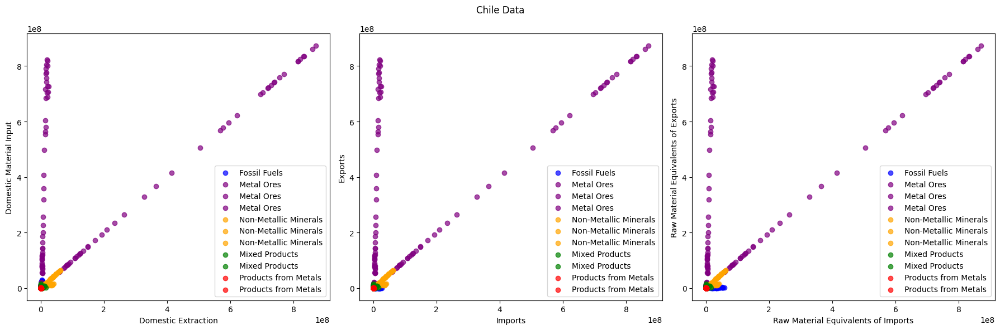

In [38]:
import matplotlib.pyplot as plt

# Fossil_data
chi_domestic_ext_fossil = chile_fossil_df['Domestic Extraction']
chi_domestic_input_fossil = chile_fossil_df['Domestic Material Input']
chi_imports_fossil = chile_fossil_df['Imports']
chi_exports_fossil = chile_fossil_df['Exports']
chi_raw_imports_fossil = chile_fossil_df['Raw Material Equivalents of imports']
chi_raw_exports_fossil = chile_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
chi_domestic_ext_metalore = chile_metalore_df['Domestic Extraction']
chi_domestic_input_metalore = chile_metalore_df['Domestic Material Input']
chi_imports_metalore = chile_metalore_df['Imports']
chi_exports_metalore = chile_metalore_df['Exports']
chi_raw_imports_metalore = chile_metalore_df['Raw Material Equivalents of imports']
chi_raw_exports_metalore = chile_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
chi_domestic_ext_nmm = chile_nmm_df['Domestic Extraction']
chi_domestic_input_nmm = chile_nmm_df['Domestic Material Input']
chi_imports_nmm = chile_nmm_df['Imports']
chi_exports_nmm = chile_nmm_df['Exports']
chi_raw_imports_nmm = chile_nmm_df['Raw Material Equivalents of imports']
chi_raw_exports_nmm = chile_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
chi_domestic_ext_mp = chile_mp_df['Domestic Extraction']
chi_domestic_input_mp = chile_mp_df['Domestic Material Input']
chi_imports_mp = chile_mp_df['Imports']
chi_exports_mp = chile_mp_df['Exports']

# Products from metals
chi_domestic_ext_pfm = chile_pfm_df['Domestic Extraction']
chi_domestic_input_pfm = chile_pfm_df['Domestic Material Input']
chi_imports_pfm = chile_pfm_df['Imports']
chi_exports_pfm = chile_pfm_df['Exports']


# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Chile Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()


# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], chi_domestic_ext_fossil, chi_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], chi_imports_fossil, chi_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], chi_raw_imports_fossil, chi_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (chi_domestic_ext_metalore, chi_domestic_input_metalore, 'purple', 'Metal Ores'),
    (chi_imports_metalore, chi_exports_metalore, 'purple', 'Metal Ores'),
    (chi_raw_imports_metalore, chi_raw_exports_metalore, 'purple', 'Metal Ores'),

    (chi_domestic_ext_nmm, chi_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (chi_imports_nmm, chi_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (chi_raw_imports_nmm, chi_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (chi_domestic_ext_mp, chi_domestic_input_mp, 'green', 'Mixed Products'),
    (chi_imports_mp, chi_exports_mp, 'green', 'Mixed Products'),

    (chi_domestic_ext_pfm, chi_domestic_input_pfm, 'red', 'Products from Metals'),
    (chi_imports_pfm, chi_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, labra in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, labra, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, labra, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, labra, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**11. China:**

In [39]:
china_fossil_df = category_dataframes_by_country['China']['Fossil fuels']
china_metalore_df = category_dataframes_by_country['China']['Metal ores']
china_nmm_df = category_dataframes_by_country['China']['Non-metallic minerals']
china_mp_df = category_dataframes_by_country['China']['Mixed and complex products nec.']
china_pfm_df = category_dataframes_by_country['China']['Products from metals']

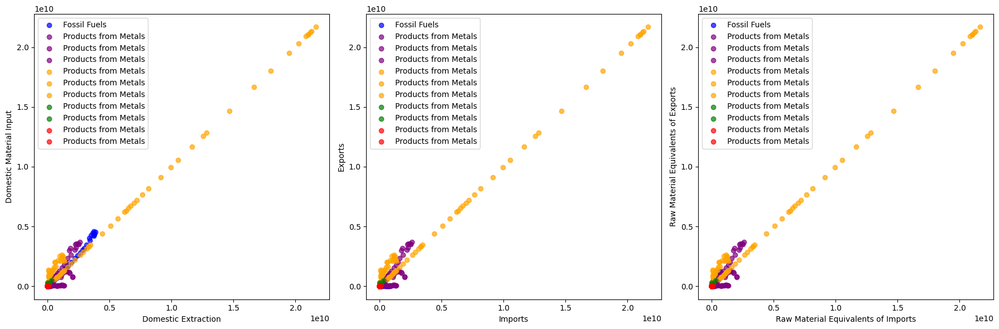

In [40]:
import matplotlib.pyplot as plt

# Fossil_data
chin_domestic_ext_fossil = china_fossil_df['Domestic Extraction']
chin_domestic_input_fossil = china_fossil_df['Domestic Material Input']
chin_imports_fossil = china_fossil_df['Imports']
chin_exports_fossil = china_fossil_df['Exports']
chin_raw_imports_fossil = china_fossil_df['Raw Material Equivalents of imports']
chin_raw_exports_fossil = china_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
chin_domestic_ext_metalore = china_metalore_df['Domestic Extraction']
chin_domestic_input_metalore = china_metalore_df['Domestic Material Input']
chin_imports_metalore = china_metalore_df['Imports']
chin_exports_metalore = china_metalore_df['Exports']
chin_raw_imports_metalore = china_metalore_df['Raw Material Equivalents of imports']
chin_raw_exports_metalore = china_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
chin_domestic_ext_nmm = china_nmm_df['Domestic Extraction']
chin_domestic_input_nmm = china_nmm_df['Domestic Material Input']
chin_imports_nmm = china_nmm_df['Imports']
chin_exports_nmm = china_nmm_df['Exports']
chin_raw_imports_nmm = china_nmm_df['Raw Material Equivalents of imports']
chin_raw_exports_nmm = china_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
chin_domestic_ext_mp = china_mp_df['Domestic Extraction']
chin_domestic_input_mp = china_mp_df['Domestic Material Input']
chin_imports_mp = china_mp_df['Imports']
chin_exports_mp = china_mp_df['Exports']

# Products from metals
chin_domestic_ext_pfm = china_pfm_df['Domestic Extraction']
chin_domestic_input_pfm = china_pfm_df['Domestic Material Input']
chin_imports_pfm = china_pfm_df['Imports']
chin_exports_pfm = china_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], chin_domestic_ext_fossil, chin_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], chin_imports_fossil, chin_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], chin_raw_imports_fossil, chin_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (chin_domestic_ext_metalore, chin_domestic_input_metalore, 'purple', 'Metal Ores'),
    (chin_imports_metalore, chin_exports_metalore, 'purple', 'Metal Ores'),
    (chin_raw_imports_metalore, chin_raw_exports_metalore, 'purple', 'Metal Ores'),

    (chin_domestic_ext_nmm, chin_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (chin_imports_nmm, chin_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (chin_raw_imports_nmm, chin_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (chin_domestic_ext_mp, chin_domestic_input_mp, 'green', 'Mixed Products'),
    (chin_imports_mp, chin_exports_mp, 'green', 'Mixed Products'),

    (chin_domestic_ext_pfm, chin_domestic_input_pfm, 'red', 'Products from Metals'),
    (chin_imports_pfm, chin_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, lachin in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**12. Colombia:**

In [41]:
colombia_fossil_df = category_dataframes_by_country['Colombia']['Fossil fuels']
colombia_metalore_df = category_dataframes_by_country['Colombia']['Metal ores']
colombia_nmm_df = category_dataframes_by_country['Colombia']['Non-metallic minerals']
colombia_mp_df = category_dataframes_by_country['Colombia']['Mixed and complex products nec.']
colombia_pfm_df = category_dataframes_by_country['Colombia']['Products from metals']

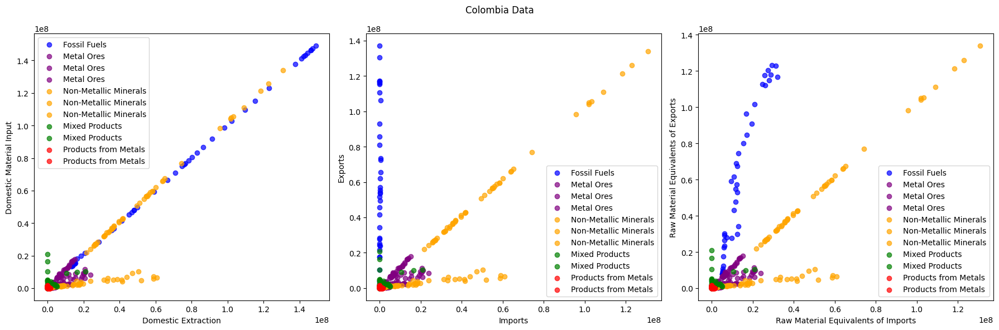

In [42]:
import matplotlib.pyplot as plt

# Fossil_data
col_domestic_ext_fossil = colombia_fossil_df['Domestic Extraction']
col_domestic_input_fossil = colombia_fossil_df['Domestic Material Input']
col_imports_fossil = colombia_fossil_df['Imports']
col_exports_fossil = colombia_fossil_df['Exports']
col_raw_imports_fossil = colombia_fossil_df['Raw Material Equivalents of imports']
col_raw_exports_fossil = colombia_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
col_domestic_ext_metalore = colombia_metalore_df['Domestic Extraction']
col_domestic_input_metalore = colombia_metalore_df['Domestic Material Input']
col_imports_metalore = colombia_metalore_df['Imports']
col_exports_metalore = colombia_metalore_df['Exports']
col_raw_imports_metalore = colombia_metalore_df['Raw Material Equivalents of imports']
col_raw_exports_metalore = colombia_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
col_domestic_ext_nmm = colombia_nmm_df['Domestic Extraction']
col_domestic_input_nmm = colombia_nmm_df['Domestic Material Input']
col_imports_nmm = colombia_nmm_df['Imports']
col_exports_nmm = colombia_nmm_df['Exports']
col_raw_imports_nmm = colombia_nmm_df['Raw Material Equivalents of imports']
col_raw_exports_nmm = colombia_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
col_domestic_ext_mp = colombia_mp_df['Domestic Extraction']
col_domestic_input_mp = colombia_mp_df['Domestic Material Input']
col_imports_mp = colombia_mp_df['Imports']
col_exports_mp = colombia_mp_df['Exports']

# Products from metals
col_domestic_ext_pfm = colombia_pfm_df['Domestic Extraction']
col_domestic_input_pfm = colombia_pfm_df['Domestic Material Input']
col_imports_pfm = colombia_pfm_df['Imports']
col_exports_pfm = colombia_pfm_df['Exports']


# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Colombia Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()


# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], col_domestic_ext_fossil, col_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], col_imports_fossil, col_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], col_raw_imports_fossil, col_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (col_domestic_ext_metalore, col_domestic_input_metalore, 'purple', 'Metal Ores'),
    (col_imports_metalore, col_exports_metalore, 'purple', 'Metal Ores'),
    (col_raw_imports_metalore, col_raw_exports_metalore, 'purple', 'Metal Ores'),

    (col_domestic_ext_nmm, col_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (col_imports_nmm, col_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (col_raw_imports_nmm, col_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (col_domestic_ext_mp, col_domestic_input_mp, 'green', 'Mixed Products'),
    (col_imports_mp, col_exports_mp, 'green', 'Mixed Products'),

    (col_domestic_ext_pfm, col_domestic_input_pfm, 'red', 'Products from Metals'),
    (col_imports_pfm, col_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, labra in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, labra, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, labra, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, labra, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**13. Denmark:**

In [43]:
denmark_fossil_df = category_dataframes_by_country['Denmark']['Fossil fuels']
denmark_metalore_df = category_dataframes_by_country['Denmark']['Metal ores']
denmark_nmm_df = category_dataframes_by_country['Denmark']['Non-metallic minerals']
denmark_mp_df = category_dataframes_by_country['Denmark']['Mixed and complex products nec.']
denmark_pfm_df = category_dataframes_by_country['Denmark']['Products from metals']

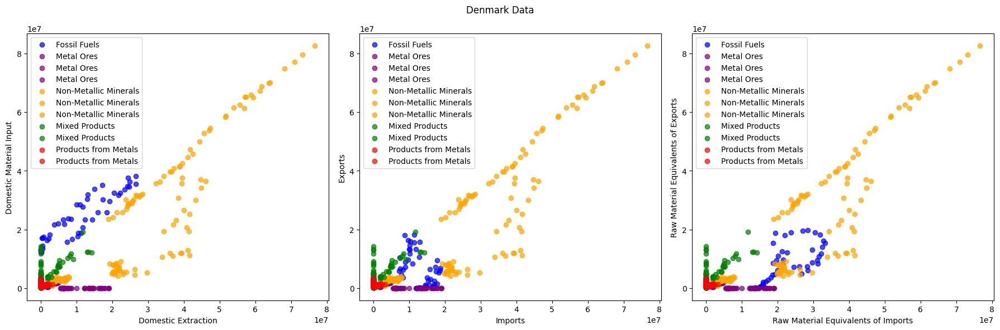

In [44]:
import matplotlib.pyplot as plt

# Fossil_data
den_domestic_ext_fossil = denmark_fossil_df['Domestic Extraction']
den_domestic_input_fossil = denmark_fossil_df['Domestic Material Input']
den_imports_fossil = denmark_fossil_df['Imports']
den_exports_fossil = denmark_fossil_df['Exports']
den_raw_imports_fossil = denmark_fossil_df['Raw Material Equivalents of imports']
den_raw_exports_fossil = denmark_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
den_domestic_ext_metalore = denmark_metalore_df['Domestic Extraction']
den_domestic_input_metalore = denmark_metalore_df['Domestic Material Input']
den_imports_metalore = denmark_metalore_df['Imports']
den_exports_metalore = denmark_metalore_df['Exports']
den_raw_imports_metalore = denmark_metalore_df['Raw Material Equivalents of imports']
den_raw_exports_metalore = denmark_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
den_domestic_ext_nmm = denmark_nmm_df['Domestic Extraction']
den_domestic_input_nmm = denmark_nmm_df['Domestic Material Input']
den_imports_nmm = denmark_nmm_df['Imports']
den_exports_nmm = denmark_nmm_df['Exports']
den_raw_imports_nmm = denmark_nmm_df['Raw Material Equivalents of imports']
den_raw_exports_nmm = denmark_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
den_domestic_ext_mp = denmark_mp_df['Domestic Extraction']
den_domestic_input_mp = denmark_mp_df['Domestic Material Input']
den_imports_mp = denmark_mp_df['Imports']
den_exports_mp = denmark_mp_df['Exports']

# Products from metals
den_domestic_ext_pfm = denmark_pfm_df['Domestic Extraction']
den_domestic_input_pfm = denmark_pfm_df['Domestic Material Input']
den_imports_pfm = denmark_pfm_df['Imports']
den_exports_pfm = denmark_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle("Denmark Data")
# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], den_domestic_ext_fossil, den_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], den_imports_fossil, den_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], den_raw_imports_fossil, den_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (den_domestic_ext_metalore, den_domestic_input_metalore, 'purple', 'Metal Ores'),
    (den_imports_metalore, den_exports_metalore, 'purple', 'Metal Ores'),
    (den_raw_imports_metalore, den_raw_exports_metalore, 'purple', 'Metal Ores'),

    (den_domestic_ext_nmm, den_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (den_imports_nmm, den_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (den_raw_imports_nmm, den_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (den_domestic_ext_mp, den_domestic_input_mp, 'green', 'Mixed Products'),
    (den_imports_mp, den_exports_mp, 'green', 'Mixed Products'),

    (den_domestic_ext_pfm, den_domestic_input_pfm, 'red', 'Products from Metals'),
    (den_imports_pfm, den_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **14. Eqypt:**

In [45]:
egypt_fossil_df = category_dataframes_by_country['Egypt']['Fossil fuels']
egypt_metalore_df = category_dataframes_by_country['Egypt']['Metal ores']
egypt_nmm_df = category_dataframes_by_country['Egypt']['Non-metallic minerals']
egypt_mp_df = category_dataframes_by_country['Egypt']['Mixed and complex products nec.']
egypt_pfm_df = category_dataframes_by_country['Egypt']['Products from metals']

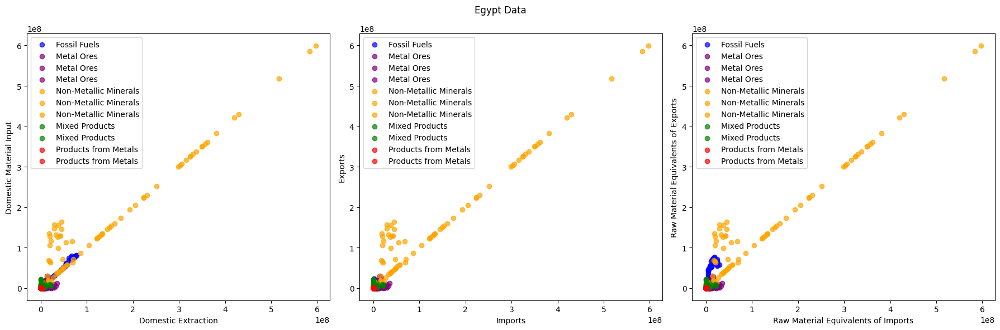

In [46]:
import matplotlib.pyplot as plt

# Fossil_data
egy_domestic_ext_fossil = egypt_fossil_df['Domestic Extraction']
egy_domestic_input_fossil = egypt_fossil_df['Domestic Material Input']
egy_imports_fossil = egypt_fossil_df['Imports']
egy_exports_fossil = egypt_fossil_df['Exports']
egy_raw_imports_fossil = egypt_fossil_df['Raw Material Equivalents of imports']
egy_raw_exports_fossil = egypt_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
egy_domestic_ext_metalore = egypt_metalore_df['Domestic Extraction']
egy_domestic_input_metalore = egypt_metalore_df['Domestic Material Input']
egy_imports_metalore = egypt_metalore_df['Imports']
egy_exports_metalore = egypt_metalore_df['Exports']
egy_raw_imports_metalore = egypt_metalore_df['Raw Material Equivalents of imports']
egy_raw_exports_metalore = egypt_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
egy_domestic_ext_nmm = egypt_nmm_df['Domestic Extraction']
egy_domestic_input_nmm = egypt_nmm_df['Domestic Material Input']
egy_imports_nmm = egypt_nmm_df['Imports']
egy_exports_nmm = egypt_nmm_df['Exports']
egy_raw_imports_nmm = egypt_nmm_df['Raw Material Equivalents of imports']
egy_raw_exports_nmm = egypt_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
egy_domestic_ext_mp = egypt_mp_df['Domestic Extraction']
egy_domestic_input_mp = egypt_mp_df['Domestic Material Input']
egy_imports_mp = egypt_mp_df['Imports']
egy_exports_mp = egypt_mp_df['Exports']

# Products from metals
egy_domestic_ext_pfm = egypt_pfm_df['Domestic Extraction']
egy_domestic_input_pfm = egypt_pfm_df['Domestic Material Input']
egy_imports_pfm = egypt_pfm_df['Imports']
egy_exports_pfm = egypt_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle("Egypt Data")
# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], egy_domestic_ext_fossil, egy_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], egy_imports_fossil, egy_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], egy_raw_imports_fossil, egy_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (egy_domestic_ext_metalore, egy_domestic_input_metalore, 'purple', 'Metal Ores'),
    (egy_imports_metalore, egy_exports_metalore, 'purple', 'Metal Ores'),
    (egy_raw_imports_metalore, egy_raw_exports_metalore, 'purple', 'Metal Ores'),

    (egy_domestic_ext_nmm, egy_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (egy_imports_nmm, egy_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (egy_raw_imports_nmm, egy_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (egy_domestic_ext_mp, egy_domestic_input_mp, 'green', 'Mixed Products'),
    (egy_imports_mp, egy_exports_mp, 'green', 'Mixed Products'),

    (egy_domestic_ext_pfm, egy_domestic_input_pfm, 'red', 'Products from Metals'),
    (egy_imports_pfm, egy_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **15. Finland:**

In [47]:
finland_fossil_df = category_dataframes_by_country['Finland']['Fossil fuels']
finland_metalore_df = category_dataframes_by_country['Finland']['Metal ores']
finland_nmm_df = category_dataframes_by_country['Finland']['Non-metallic minerals']
finland_mp_df = category_dataframes_by_country['Finland']['Mixed and complex products nec.']
finland_pfm_df = category_dataframes_by_country['Finland']['Products from metals']

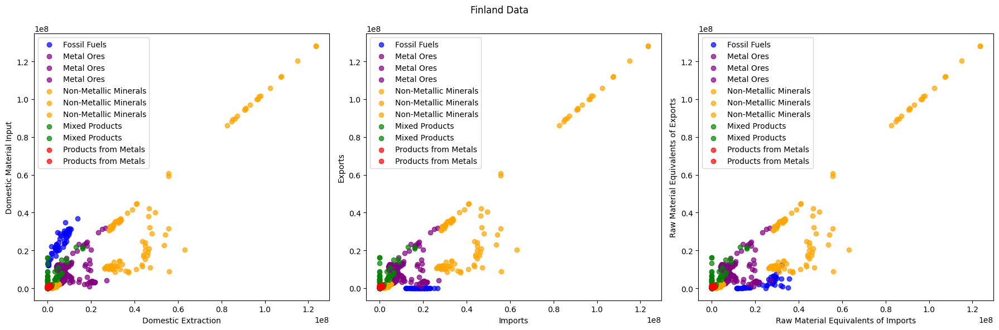

In [48]:
import matplotlib.pyplot as plt

# Fossil_data
fin_domestic_ext_fossil = finland_fossil_df['Domestic Extraction']
fin_domestic_input_fossil = finland_fossil_df['Domestic Material Input']
fin_imports_fossil = finland_fossil_df['Imports']
fin_exports_fossil = finland_fossil_df['Exports']
fin_raw_imports_fossil = finland_fossil_df['Raw Material Equivalents of imports']
fin_raw_exports_fossil = finland_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
fin_domestic_ext_metalore = finland_metalore_df['Domestic Extraction']
fin_domestic_input_metalore = finland_metalore_df['Domestic Material Input']
fin_imports_metalore = finland_metalore_df['Imports']
fin_exports_metalore = finland_metalore_df['Exports']
fin_raw_imports_metalore = finland_metalore_df['Raw Material Equivalents of imports']
fin_raw_exports_metalore = finland_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
fin_domestic_ext_nmm = finland_nmm_df['Domestic Extraction']
fin_domestic_input_nmm = finland_nmm_df['Domestic Material Input']
fin_imports_nmm = finland_nmm_df['Imports']
fin_exports_nmm = finland_nmm_df['Exports']
fin_raw_imports_nmm = finland_nmm_df['Raw Material Equivalents of imports']
fin_raw_exports_nmm = finland_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
fin_domestic_ext_mp = finland_mp_df['Domestic Extraction']
fin_domestic_input_mp = finland_mp_df['Domestic Material Input']
fin_imports_mp = finland_mp_df['Imports']
fin_exports_mp = finland_mp_df['Exports']

# Products from metals
fin_domestic_ext_pfm = finland_pfm_df['Domestic Extraction']
fin_domestic_input_pfm = finland_pfm_df['Domestic Material Input']
fin_imports_pfm = finland_pfm_df['Imports']
fin_exports_pfm = finland_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle("Finland Data")
# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], fin_domestic_ext_fossil, fin_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], fin_imports_fossil, fin_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], fin_raw_imports_fossil, fin_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (fin_domestic_ext_metalore, fin_domestic_input_metalore, 'purple', 'Metal Ores'),
    (fin_imports_metalore, fin_exports_metalore, 'purple', 'Metal Ores'),
    (fin_raw_imports_metalore, fin_raw_exports_metalore, 'purple', 'Metal Ores'),

    (fin_domestic_ext_nmm, fin_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (fin_imports_nmm, fin_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (fin_raw_imports_nmm, fin_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (fin_domestic_ext_mp, fin_domestic_input_mp, 'green', 'Mixed Products'),
    (fin_imports_mp, fin_exports_mp, 'green', 'Mixed Products'),

    (fin_domestic_ext_pfm, fin_domestic_input_pfm, 'red', 'Products from Metals'),
    (fin_imports_pfm, fin_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**16. France:**

In [49]:
france_fossil_df = category_dataframes_by_country['France']['Fossil fuels']
france_metalore_df = category_dataframes_by_country['France']['Metal ores']
france_nmm_df = category_dataframes_by_country['France']['Non-metallic minerals']
france_mp_df = category_dataframes_by_country['France']['Mixed and complex products nec.']
france_pfm_df = category_dataframes_by_country['France']['Products from metals']

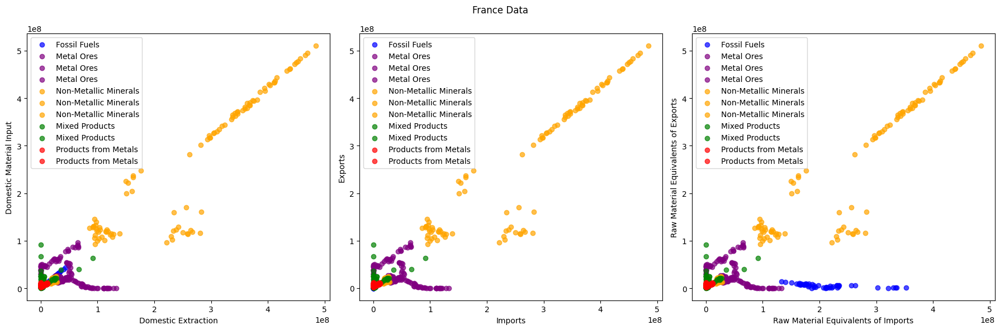

In [50]:
import matplotlib.pyplot as plt

# Fossil_data
fra_domestic_ext_fossil = france_fossil_df['Domestic Extraction']
fra_domestic_input_fossil = france_fossil_df['Domestic Material Input']
fra_imports_fossil = france_fossil_df['Imports']
fra_exports_fossil = france_fossil_df['Exports']
fra_raw_imports_fossil = france_fossil_df['Raw Material Equivalents of imports']
fra_raw_exports_fossil = france_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
fra_domestic_ext_metalore = france_metalore_df['Domestic Extraction']
fra_domestic_input_metalore = france_metalore_df['Domestic Material Input']
fra_imports_metalore = france_metalore_df['Imports']
fra_exports_metalore = france_metalore_df['Exports']
fra_raw_imports_metalore = france_metalore_df['Raw Material Equivalents of imports']
fra_raw_exports_metalore = france_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
fra_domestic_ext_nmm = france_nmm_df['Domestic Extraction']
fra_domestic_input_nmm = france_nmm_df['Domestic Material Input']
fra_imports_nmm = france_nmm_df['Imports']
fra_exports_nmm = france_nmm_df['Exports']
fra_raw_imports_nmm = france_nmm_df['Raw Material Equivalents of imports']
fra_raw_exports_nmm = france_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
fra_domestic_ext_mp = france_mp_df['Domestic Extraction']
fra_domestic_input_mp = france_mp_df['Domestic Material Input']
fra_imports_mp = france_mp_df['Imports']
fra_exports_mp = france_mp_df['Exports']

# Products from metals
fra_domestic_ext_pfm = france_pfm_df['Domestic Extraction']
fra_domestic_input_pfm = france_pfm_df['Domestic Material Input']
fra_imports_pfm = france_pfm_df['Imports']
fra_exports_pfm = france_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('France Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], fra_domestic_ext_fossil, fra_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], fra_imports_fossil, fra_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], fra_raw_imports_fossil, fra_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (fra_domestic_ext_metalore, fra_domestic_input_metalore, 'purple', 'Metal Ores'),
    (fra_imports_metalore, fra_exports_metalore, 'purple', 'Metal Ores'),
    (fra_raw_imports_metalore, fra_raw_exports_metalore, 'purple', 'Metal Ores'),

    (fra_domestic_ext_nmm, fra_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (fra_imports_nmm, fra_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (fra_raw_imports_nmm, fra_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (fra_domestic_ext_mp, fra_domestic_input_mp, 'green', 'Mixed Products'),
    (fra_imports_mp, fra_exports_mp, 'green', 'Mixed Products'),

    (fra_domestic_ext_pfm, fra_domestic_input_pfm, 'red', 'Products from Metals'),
    (fra_imports_pfm, fra_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**17. Germany:**

In [51]:
germany_fossil_df = category_dataframes_by_country['Germany']['Fossil fuels']
germany_metalore_df = category_dataframes_by_country['Germany']['Metal ores']
germany_nmm_df = category_dataframes_by_country['Germany']['Non-metallic minerals']
germany_mp_df = category_dataframes_by_country['Germany']['Mixed and complex products nec.']
germany_pfm_df = category_dataframes_by_country['Germany']['Products from metals']

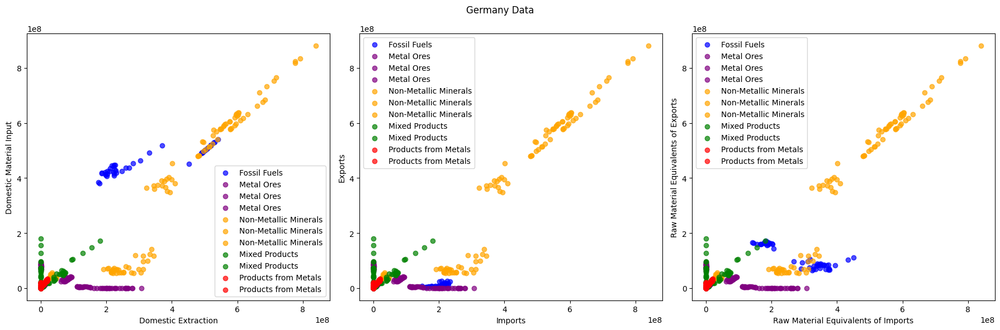

In [52]:
import matplotlib.pyplot as plt

# Fossil_data
ger_domestic_ext_fossil = germany_fossil_df['Domestic Extraction']
ger_domestic_input_fossil = germany_fossil_df['Domestic Material Input']
ger_imports_fossil = germany_fossil_df['Imports']
ger_exports_fossil = germany_fossil_df['Exports']
ger_raw_imports_fossil = germany_fossil_df['Raw Material Equivalents of imports']
ger_raw_exports_fossil = germany_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
ger_domestic_ext_metalore = germany_metalore_df['Domestic Extraction']
ger_domestic_input_metalore = germany_metalore_df['Domestic Material Input']
ger_imports_metalore = germany_metalore_df['Imports']
ger_exports_metalore = germany_metalore_df['Exports']
ger_raw_imports_metalore = germany_metalore_df['Raw Material Equivalents of imports']
ger_raw_exports_metalore = germany_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
ger_domestic_ext_nmm = germany_nmm_df['Domestic Extraction']
ger_domestic_input_nmm = germany_nmm_df['Domestic Material Input']
ger_imports_nmm = germany_nmm_df['Imports']
ger_exports_nmm = germany_nmm_df['Exports']
ger_raw_imports_nmm = germany_nmm_df['Raw Material Equivalents of imports']
ger_raw_exports_nmm = germany_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
ger_domestic_ext_mp = germany_mp_df['Domestic Extraction']
ger_domestic_input_mp = germany_mp_df['Domestic Material Input']
ger_imports_mp = germany_mp_df['Imports']
ger_exports_mp = germany_mp_df['Exports']

# Products from metals
ger_domestic_ext_pfm = germany_pfm_df['Domestic Extraction']
ger_domestic_input_pfm = germany_pfm_df['Domestic Material Input']
ger_imports_pfm = germany_pfm_df['Imports']
ger_exports_pfm = germany_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Germany Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], ger_domestic_ext_fossil, ger_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], ger_imports_fossil, ger_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], ger_raw_imports_fossil, ger_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (ger_domestic_ext_metalore, ger_domestic_input_metalore, 'purple', 'Metal Ores'),
    (ger_imports_metalore, ger_exports_metalore, 'purple', 'Metal Ores'),
    (ger_raw_imports_metalore, ger_raw_exports_metalore, 'purple', 'Metal Ores'),

    (ger_domestic_ext_nmm, ger_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (ger_imports_nmm, ger_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (ger_raw_imports_nmm, ger_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (ger_domestic_ext_mp, ger_domestic_input_mp, 'green', 'Mixed Products'),
    (ger_imports_mp, ger_exports_mp, 'green', 'Mixed Products'),

    (ger_domestic_ext_pfm, ger_domestic_input_pfm, 'red', 'Products from Metals'),
    (ger_imports_pfm, ger_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**18. HongKong:**

In [53]:
hongkong_fossil_df = category_dataframes_by_country['Hong Kong']['Fossil fuels']
hongkong_metalore_df = category_dataframes_by_country['Hong Kong']['Metal ores']
hongkong_nmm_df = category_dataframes_by_country['Hong Kong']['Non-metallic minerals']
hongkong_mp_df = category_dataframes_by_country['Hong Kong']['Mixed and complex products nec.']
hongkong_pfm_df = category_dataframes_by_country['Hong Kong']['Products from metals']

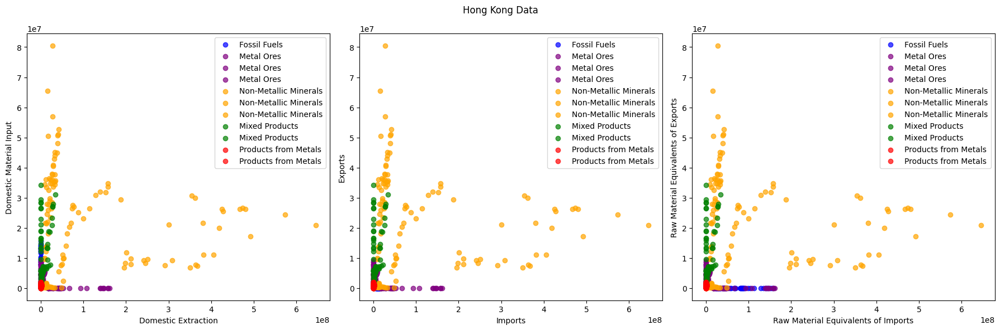

In [54]:
import matplotlib.pyplot as plt

# Fossil_data
hon_domestic_ext_fossil = hongkong_fossil_df['Domestic Extraction']
hon_domestic_input_fossil = hongkong_fossil_df['Domestic Material Input']
hon_imports_fossil = hongkong_fossil_df['Imports']
hon_exports_fossil = hongkong_fossil_df['Exports']
hon_raw_imports_fossil = hongkong_fossil_df['Raw Material Equivalents of imports']
hon_raw_exports_fossil = hongkong_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
hon_domestic_ext_metalore = hongkong_metalore_df['Domestic Extraction']
hon_domestic_input_metalore = hongkong_metalore_df['Domestic Material Input']
hon_imports_metalore = hongkong_metalore_df['Imports']
hon_exports_metalore = hongkong_metalore_df['Exports']
hon_raw_imports_metalore = hongkong_metalore_df['Raw Material Equivalents of imports']
hon_raw_exports_metalore = hongkong_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
hon_domestic_ext_nmm = hongkong_nmm_df['Domestic Extraction']
hon_domestic_input_nmm = hongkong_nmm_df['Domestic Material Input']
hon_imports_nmm = hongkong_nmm_df['Imports']
hon_exports_nmm = hongkong_nmm_df['Exports']
hon_raw_imports_nmm = hongkong_nmm_df['Raw Material Equivalents of imports']
hon_raw_exports_nmm = hongkong_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
hon_domestic_ext_mp = hongkong_mp_df['Domestic Extraction']
hon_domestic_input_mp = hongkong_mp_df['Domestic Material Input']
hon_imports_mp = hongkong_mp_df['Imports']
hon_exports_mp = hongkong_mp_df['Exports']

# Products from metals
hon_domestic_ext_pfm = hongkong_pfm_df['Domestic Extraction']
hon_domestic_input_pfm = hongkong_pfm_df['Domestic Material Input']
hon_imports_pfm = hongkong_pfm_df['Imports']
hon_exports_pfm = hongkong_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Hong Kong Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], hon_domestic_ext_fossil, hon_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], hon_imports_fossil, hon_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], hon_raw_imports_fossil, hon_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (hon_domestic_ext_metalore, hon_domestic_input_metalore, 'purple', 'Metal Ores'),
    (hon_imports_metalore, hon_exports_metalore, 'purple', 'Metal Ores'),
    (hon_raw_imports_metalore, hon_raw_exports_metalore, 'purple', 'Metal Ores'),

    (hon_domestic_ext_nmm, hon_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (hon_imports_nmm, hon_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (hon_raw_imports_nmm, hon_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (hon_domestic_ext_mp, hon_domestic_input_mp, 'green', 'Mixed Products'),
    (hon_imports_mp, hon_exports_mp, 'green', 'Mixed Products'),

    (hon_domestic_ext_pfm, hon_domestic_input_pfm, 'red', 'Products from Metals'),
    (hon_imports_pfm, hon_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**19. Indonesia:**

In [55]:
indonesia_fossil_df = category_dataframes_by_country['Indonesia']['Fossil fuels']
indonesia_metalore_df = category_dataframes_by_country['Indonesia']['Metal ores']
indonesia_nmm_df = category_dataframes_by_country['Indonesia']['Non-metallic minerals']
indonesia_mp_df = category_dataframes_by_country['Indonesia']['Mixed and complex products nec.']
indonesia_pfm_df = category_dataframes_by_country['Indonesia']['Products from metals']

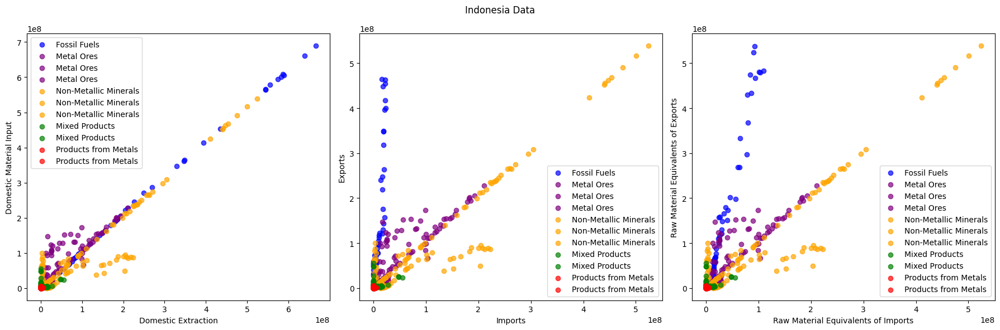

In [56]:
import matplotlib.pyplot as plt

# Fossil_data
indo_domestic_ext_fossil = indonesia_fossil_df['Domestic Extraction']
indo_domestic_input_fossil = indonesia_fossil_df['Domestic Material Input']
indo_imports_fossil = indonesia_fossil_df['Imports']
indo_exports_fossil = indonesia_fossil_df['Exports']
indo_raw_imports_fossil = indonesia_fossil_df['Raw Material Equivalents of imports']
indo_raw_exports_fossil = indonesia_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
indo_domestic_ext_metalore = indonesia_metalore_df['Domestic Extraction']
indo_domestic_input_metalore = indonesia_metalore_df['Domestic Material Input']
indo_imports_metalore = indonesia_metalore_df['Imports']
indo_exports_metalore = indonesia_metalore_df['Exports']
indo_raw_imports_metalore = indonesia_metalore_df['Raw Material Equivalents of imports']
indo_raw_exports_metalore = indonesia_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
indo_domestic_ext_nmm = indonesia_nmm_df['Domestic Extraction']
indo_domestic_input_nmm = indonesia_nmm_df['Domestic Material Input']
indo_imports_nmm = indonesia_nmm_df['Imports']
indo_exports_nmm = indonesia_nmm_df['Exports']
indo_raw_imports_nmm = indonesia_nmm_df['Raw Material Equivalents of imports']
indo_raw_exports_nmm = indonesia_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
indo_domestic_ext_mp = indonesia_mp_df['Domestic Extraction']
indo_domestic_input_mp = indonesia_mp_df['Domestic Material Input']
indo_imports_mp = indonesia_mp_df['Imports']
indo_exports_mp = indonesia_mp_df['Exports']

# Products from metals
indo_domestic_ext_pfm = indonesia_pfm_df['Domestic Extraction']
indo_domestic_input_pfm = indonesia_pfm_df['Domestic Material Input']
indo_imports_pfm = indonesia_pfm_df['Imports']
indo_exports_pfm = indonesia_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Indonesia Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], indo_domestic_ext_fossil, indo_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], indo_imports_fossil, indo_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], indo_raw_imports_fossil, indo_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (indo_domestic_ext_metalore, indo_domestic_input_metalore, 'purple', 'Metal Ores'),
    (indo_imports_metalore, indo_exports_metalore, 'purple', 'Metal Ores'),
    (indo_raw_imports_metalore, indo_raw_exports_metalore, 'purple', 'Metal Ores'),

    (indo_domestic_ext_nmm, indo_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (indo_imports_nmm, indo_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (indo_raw_imports_nmm, indo_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (indo_domestic_ext_mp, indo_domestic_input_mp, 'green', 'Mixed Products'),
    (indo_imports_mp, indo_exports_mp, 'green', 'Mixed Products'),

    (indo_domestic_ext_pfm, indo_domestic_input_pfm, 'red', 'Products from Metals'),
    (indo_imports_pfm, indo_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**20. Iran:**

In [57]:
iran_fossil_df = category_dataframes_by_country['Iran']['Fossil fuels']
iran_metalore_df = category_dataframes_by_country['Iran']['Metal ores']
iran_nmm_df = category_dataframes_by_country['Iran']['Non-metallic minerals']
iran_mp_df = category_dataframes_by_country['Iran']['Mixed and complex products nec.']
iran_pfm_df = category_dataframes_by_country['Iran']['Products from metals']

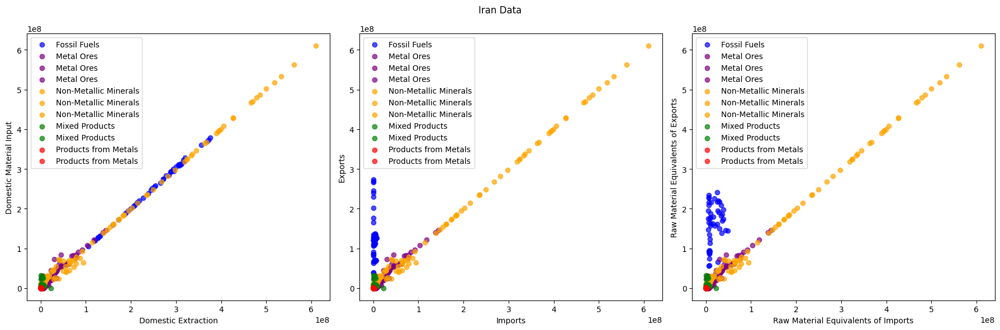

In [58]:
import matplotlib.pyplot as plt

# Fossil_data
irn_domestic_ext_fossil = iran_fossil_df['Domestic Extraction']
irn_domestic_input_fossil = iran_fossil_df['Domestic Material Input']
irn_imports_fossil = iran_fossil_df['Imports']
irn_exports_fossil = iran_fossil_df['Exports']
irn_raw_imports_fossil = iran_fossil_df['Raw Material Equivalents of imports']
irn_raw_exports_fossil = iran_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
irn_domestic_ext_metalore = iran_metalore_df['Domestic Extraction']
irn_domestic_input_metalore = iran_metalore_df['Domestic Material Input']
irn_imports_metalore = iran_metalore_df['Imports']
irn_exports_metalore = iran_metalore_df['Exports']
irn_raw_imports_metalore = iran_metalore_df['Raw Material Equivalents of imports']
irn_raw_exports_metalore = iran_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
irn_domestic_ext_nmm = iran_nmm_df['Domestic Extraction']
irn_domestic_input_nmm = iran_nmm_df['Domestic Material Input']
irn_imports_nmm = iran_nmm_df['Imports']
irn_exports_nmm = iran_nmm_df['Exports']
irn_raw_imports_nmm = iran_nmm_df['Raw Material Equivalents of imports']
irn_raw_exports_nmm = iran_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
irn_domestic_ext_mp = iran_mp_df['Domestic Extraction']
irn_domestic_input_mp = iran_mp_df['Domestic Material Input']
irn_imports_mp = iran_mp_df['Imports']
irn_exports_mp = iran_mp_df['Exports']

# Products from metals
irn_domestic_ext_pfm = iran_pfm_df['Domestic Extraction']
irn_domestic_input_pfm = iran_pfm_df['Domestic Material Input']
irn_imports_pfm = iran_pfm_df['Imports']
irn_exports_pfm = iran_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Iran Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], irn_domestic_ext_fossil, irn_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], irn_imports_fossil, irn_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], irn_raw_imports_fossil, irn_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (irn_domestic_ext_metalore, irn_domestic_input_metalore, 'purple', 'Metal Ores'),
    (irn_imports_metalore, irn_exports_metalore, 'purple', 'Metal Ores'),
    (irn_raw_imports_metalore, irn_raw_exports_metalore, 'purple', 'Metal Ores'),

    (irn_domestic_ext_nmm, irn_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (irn_imports_nmm, irn_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (irn_raw_imports_nmm, irn_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (irn_domestic_ext_mp, irn_domestic_input_mp, 'green', 'Mixed Products'),
    (irn_imports_mp, irn_exports_mp, 'green', 'Mixed Products'),

    (irn_domestic_ext_pfm, irn_domestic_input_pfm, 'red', 'Products from Metals'),
    (irn_imports_pfm, irn_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **21. Iraq:**

In [59]:
iraq_fossil_df = category_dataframes_by_country['Iraq']['Fossil fuels']
iraq_metalore_df = category_dataframes_by_country['Iraq']['Metal ores']
iraq_nmm_df = category_dataframes_by_country['Iraq']['Non-metallic minerals']
iraq_mp_df = category_dataframes_by_country['Iraq']['Mixed and complex products nec.']
iraq_pfm_df = category_dataframes_by_country['Iraq']['Products from metals']

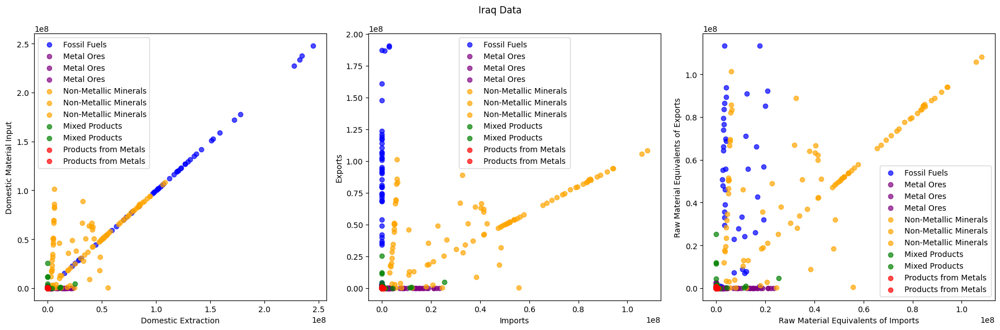

In [60]:
import matplotlib.pyplot as plt

# Fossil_data
irq_domestic_ext_fossil = iraq_fossil_df['Domestic Extraction']
irq_domestic_input_fossil = iraq_fossil_df['Domestic Material Input']
irq_imports_fossil = iraq_fossil_df['Imports']
irq_exports_fossil = iraq_fossil_df['Exports']
irq_raw_imports_fossil = iraq_fossil_df['Raw Material Equivalents of imports']
irq_raw_exports_fossil = iraq_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
irq_domestic_ext_metalore = iraq_metalore_df['Domestic Extraction']
irq_domestic_input_metalore = iraq_metalore_df['Domestic Material Input']
irq_imports_metalore = iraq_metalore_df['Imports']
irq_exports_metalore = iraq_metalore_df['Exports']
irq_raw_imports_metalore = iraq_metalore_df['Raw Material Equivalents of imports']
irq_raw_exports_metalore = iraq_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
irq_domestic_ext_nmm = iraq_nmm_df['Domestic Extraction']
irq_domestic_input_nmm = iraq_nmm_df['Domestic Material Input']
irq_imports_nmm = iraq_nmm_df['Imports']
irq_exports_nmm = iraq_nmm_df['Exports']
irq_raw_imports_nmm = iraq_nmm_df['Raw Material Equivalents of imports']
irq_raw_exports_nmm = iraq_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
irq_domestic_ext_mp = iraq_mp_df['Domestic Extraction']
irq_domestic_input_mp = iraq_mp_df['Domestic Material Input']
irq_imports_mp = iraq_mp_df['Imports']
irq_exports_mp = iraq_mp_df['Exports']

# Products from metals
irq_domestic_ext_pfm = iraq_pfm_df['Domestic Extraction']
irq_domestic_input_pfm = iraq_pfm_df['Domestic Material Input']
irq_imports_pfm = iraq_pfm_df['Imports']
irq_exports_pfm = iraq_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Iraq Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], irq_domestic_ext_fossil, irq_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], irq_imports_fossil, irq_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], irq_raw_imports_fossil, irq_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (irq_domestic_ext_metalore, irq_domestic_input_metalore, 'purple', 'Metal Ores'),
    (irq_imports_metalore, irq_exports_metalore, 'purple', 'Metal Ores'),
    (irq_raw_imports_metalore, irq_raw_exports_metalore, 'purple', 'Metal Ores'),

    (irq_domestic_ext_nmm, irq_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (irq_imports_nmm, irq_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (irq_raw_imports_nmm, irq_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (irq_domestic_ext_mp, irq_domestic_input_mp, 'green', 'Mixed Products'),
    (irq_imports_mp, irq_exports_mp, 'green', 'Mixed Products'),

    (irq_domestic_ext_pfm, irq_domestic_input_pfm, 'red', 'Products from Metals'),
    (irq_imports_pfm, irq_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **22. Ireland:**

In [61]:
ireland_fossil_df = category_dataframes_by_country['Ireland']['Fossil fuels']
ireland_metalore_df = category_dataframes_by_country['Ireland']['Metal ores']
ireland_nmm_df = category_dataframes_by_country['Ireland']['Non-metallic minerals']
ireland_mp_df = category_dataframes_by_country['Ireland']['Mixed and complex products nec.']
ireland_pfm_df = category_dataframes_by_country['Ireland']['Products from metals']

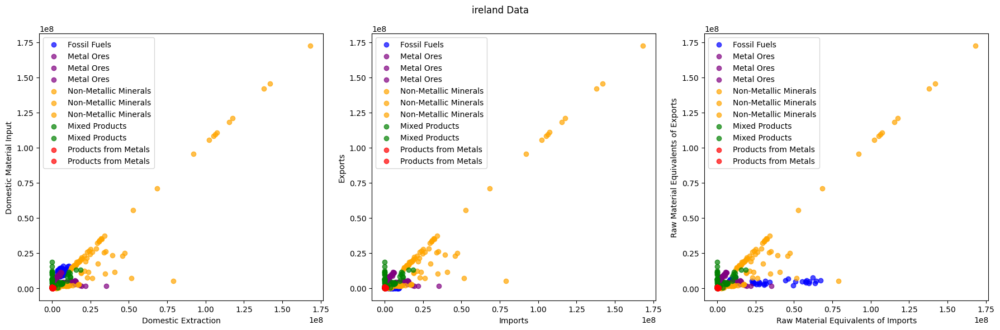

In [62]:
import matplotlib.pyplot as plt

# Fossil_data
ire_domestic_ext_fossil = ireland_fossil_df['Domestic Extraction']
ire_domestic_input_fossil = ireland_fossil_df['Domestic Material Input']
ire_imports_fossil = ireland_fossil_df['Imports']
ire_exports_fossil = ireland_fossil_df['Exports']
ire_raw_imports_fossil = ireland_fossil_df['Raw Material Equivalents of imports']
ire_raw_exports_fossil = ireland_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
ire_domestic_ext_metalore = ireland_metalore_df['Domestic Extraction']
ire_domestic_input_metalore = ireland_metalore_df['Domestic Material Input']
ire_imports_metalore = ireland_metalore_df['Imports']
ire_exports_metalore = ireland_metalore_df['Exports']
ire_raw_imports_metalore = ireland_metalore_df['Raw Material Equivalents of imports']
ire_raw_exports_metalore = ireland_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
ire_domestic_ext_nmm = ireland_nmm_df['Domestic Extraction']
ire_domestic_input_nmm = ireland_nmm_df['Domestic Material Input']
ire_imports_nmm = ireland_nmm_df['Imports']
ire_exports_nmm = ireland_nmm_df['Exports']
ire_raw_imports_nmm = ireland_nmm_df['Raw Material Equivalents of imports']
ire_raw_exports_nmm = ireland_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
ire_domestic_ext_mp = ireland_mp_df['Domestic Extraction']
ire_domestic_input_mp = ireland_mp_df['Domestic Material Input']
ire_imports_mp = ireland_mp_df['Imports']
ire_exports_mp = ireland_mp_df['Exports']

# Products from metals
ire_domestic_ext_pfm = ireland_pfm_df['Domestic Extraction']
ire_domestic_input_pfm = ireland_pfm_df['Domestic Material Input']
ire_imports_pfm = ireland_pfm_df['Imports']
ire_exports_pfm = ireland_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('ireland Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], ire_domestic_ext_fossil, ire_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], ire_imports_fossil, ire_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], ire_raw_imports_fossil, ire_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (ire_domestic_ext_metalore, ire_domestic_input_metalore, 'purple', 'Metal Ores'),
    (ire_imports_metalore, ire_exports_metalore, 'purple', 'Metal Ores'),
    (ire_raw_imports_metalore, ire_raw_exports_metalore, 'purple', 'Metal Ores'),

    (ire_domestic_ext_nmm, ire_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (ire_imports_nmm, ire_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (ire_raw_imports_nmm, ire_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (ire_domestic_ext_mp, ire_domestic_input_mp, 'green', 'Mixed Products'),
    (ire_imports_mp, ire_exports_mp, 'green', 'Mixed Products'),

    (ire_domestic_ext_pfm, ire_domestic_input_pfm, 'red', 'Products from Metals'),
    (ire_imports_pfm, ire_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**23. Israel:**

In [63]:
israel_fossil_df = category_dataframes_by_country['Israel']['Fossil fuels']
israel_metalore_df = category_dataframes_by_country['Israel']['Metal ores']
israel_nmm_df = category_dataframes_by_country['Israel']['Non-metallic minerals']
israel_mp_df = category_dataframes_by_country['Israel']['Mixed and complex products nec.']
israel_pfm_df = category_dataframes_by_country['Israel']['Products from metals']

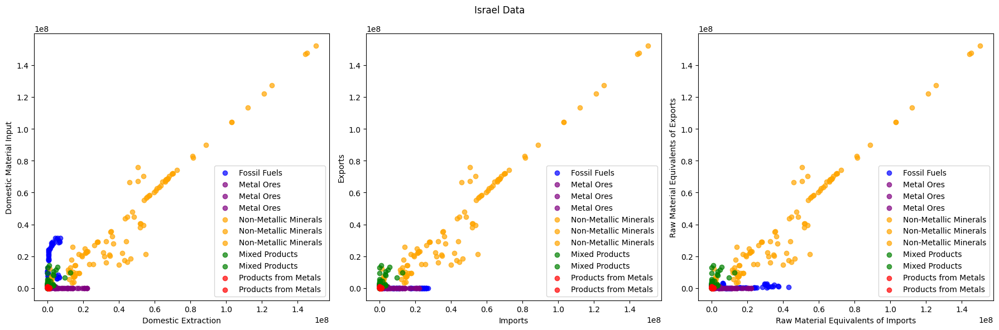

In [64]:
import matplotlib.pyplot as plt

# Fossil_data
isr_domestic_ext_fossil = israel_fossil_df['Domestic Extraction']
isr_domestic_input_fossil = israel_fossil_df['Domestic Material Input']
isr_imports_fossil = israel_fossil_df['Imports']
isr_exports_fossil = israel_fossil_df['Exports']
isr_raw_imports_fossil = israel_fossil_df['Raw Material Equivalents of imports']
isr_raw_exports_fossil = israel_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
isr_domestic_ext_metalore = israel_metalore_df['Domestic Extraction']
isr_domestic_input_metalore = israel_metalore_df['Domestic Material Input']
isr_imports_metalore = israel_metalore_df['Imports']
isr_exports_metalore = israel_metalore_df['Exports']
isr_raw_imports_metalore = israel_metalore_df['Raw Material Equivalents of imports']
isr_raw_exports_metalore = israel_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
isr_domestic_ext_nmm = israel_nmm_df['Domestic Extraction']
isr_domestic_input_nmm = israel_nmm_df['Domestic Material Input']
isr_imports_nmm = israel_nmm_df['Imports']
isr_exports_nmm = israel_nmm_df['Exports']
isr_raw_imports_nmm = israel_nmm_df['Raw Material Equivalents of imports']
isr_raw_exports_nmm = israel_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
isr_domestic_ext_mp = israel_mp_df['Domestic Extraction']
isr_domestic_input_mp = israel_mp_df['Domestic Material Input']
isr_imports_mp = israel_mp_df['Imports']
isr_exports_mp = israel_mp_df['Exports']

# Products from metals
isr_domestic_ext_pfm = israel_pfm_df['Domestic Extraction']
isr_domestic_input_pfm = israel_pfm_df['Domestic Material Input']
isr_imports_pfm = israel_pfm_df['Imports']
isr_exports_pfm = israel_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Israel Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], isr_domestic_ext_fossil, isr_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], isr_imports_fossil, isr_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], isr_raw_imports_fossil, isr_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (isr_domestic_ext_metalore, isr_domestic_input_metalore, 'purple', 'Metal Ores'),
    (isr_imports_metalore, isr_exports_metalore, 'purple', 'Metal Ores'),
    (isr_raw_imports_metalore, isr_raw_exports_metalore, 'purple', 'Metal Ores'),

    (isr_domestic_ext_nmm, isr_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (isr_imports_nmm, isr_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (isr_raw_imports_nmm, isr_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (isr_domestic_ext_mp, isr_domestic_input_mp, 'green', 'Mixed Products'),
    (isr_imports_mp, isr_exports_mp, 'green', 'Mixed Products'),

    (isr_domestic_ext_pfm, isr_domestic_input_pfm, 'red', 'Products from Metals'),
    (isr_imports_pfm, isr_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **24. Italy:**

In [65]:
italy_fossil_df = category_dataframes_by_country['Italy']['Fossil fuels']
italy_metalore_df = category_dataframes_by_country['Italy']['Metal ores']
italy_nmm_df = category_dataframes_by_country['Italy']['Non-metallic minerals']
italy_mp_df = category_dataframes_by_country['Italy']['Mixed and complex products nec.']
italy_pfm_df = category_dataframes_by_country['Italy']['Products from metals']

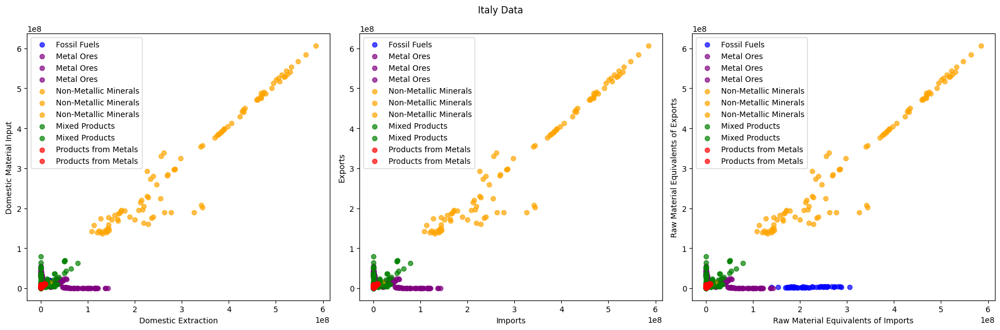

In [66]:
import matplotlib.pyplot as plt

# Fossil_data
ita_domestic_ext_fossil = italy_fossil_df['Domestic Extraction']
ita_domestic_input_fossil = italy_fossil_df['Domestic Material Input']
ita_imports_fossil = italy_fossil_df['Imports']
ita_exports_fossil = italy_fossil_df['Exports']
ita_raw_imports_fossil = italy_fossil_df['Raw Material Equivalents of imports']
ita_raw_exports_fossil = italy_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
ita_domestic_ext_metalore = italy_metalore_df['Domestic Extraction']
ita_domestic_input_metalore = italy_metalore_df['Domestic Material Input']
ita_imports_metalore = italy_metalore_df['Imports']
ita_exports_metalore = italy_metalore_df['Exports']
ita_raw_imports_metalore = italy_metalore_df['Raw Material Equivalents of imports']
ita_raw_exports_metalore = italy_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
ita_domestic_ext_nmm = italy_nmm_df['Domestic Extraction']
ita_domestic_input_nmm = italy_nmm_df['Domestic Material Input']
ita_imports_nmm = italy_nmm_df['Imports']
ita_exports_nmm = italy_nmm_df['Exports']
ita_raw_imports_nmm = italy_nmm_df['Raw Material Equivalents of imports']
ita_raw_exports_nmm = italy_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
ita_domestic_ext_mp = italy_mp_df['Domestic Extraction']
ita_domestic_input_mp = italy_mp_df['Domestic Material Input']
ita_imports_mp = italy_mp_df['Imports']
ita_exports_mp = italy_mp_df['Exports']

# Products from metals
ita_domestic_ext_pfm = italy_pfm_df['Domestic Extraction']
ita_domestic_input_pfm = italy_pfm_df['Domestic Material Input']
ita_imports_pfm = italy_pfm_df['Imports']
ita_exports_pfm = italy_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Italy Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], ita_domestic_ext_fossil, ita_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], ita_imports_fossil, ita_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], ita_raw_imports_fossil, ita_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (ita_domestic_ext_metalore, ita_domestic_input_metalore, 'purple', 'Metal Ores'),
    (ita_imports_metalore, ita_exports_metalore, 'purple', 'Metal Ores'),
    (ita_raw_imports_metalore, ita_raw_exports_metalore, 'purple', 'Metal Ores'),

    (ita_domestic_ext_nmm, ita_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (ita_imports_nmm, ita_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (ita_raw_imports_nmm, ita_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (ita_domestic_ext_mp, ita_domestic_input_mp, 'green', 'Mixed Products'),
    (ita_imports_mp, ita_exports_mp, 'green', 'Mixed Products'),

    (ita_domestic_ext_pfm, ita_domestic_input_pfm, 'red', 'Products from Metals'),
    (ita_imports_pfm, ita_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, color, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, color, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, color, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, color, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**25. Japan:**

In [67]:
japan_fossil_df = category_dataframes_by_country['Japan']['Fossil fuels']
japan_metalore_df = category_dataframes_by_country['Japan']['Metal ores']
japan_nmm_df = category_dataframes_by_country['Japan']['Non-metallic minerals']
japan_mp_df = category_dataframes_by_country['Japan']['Mixed and complex products nec.']
japan_pfm_df = category_dataframes_by_country['Japan']['Products from metals']

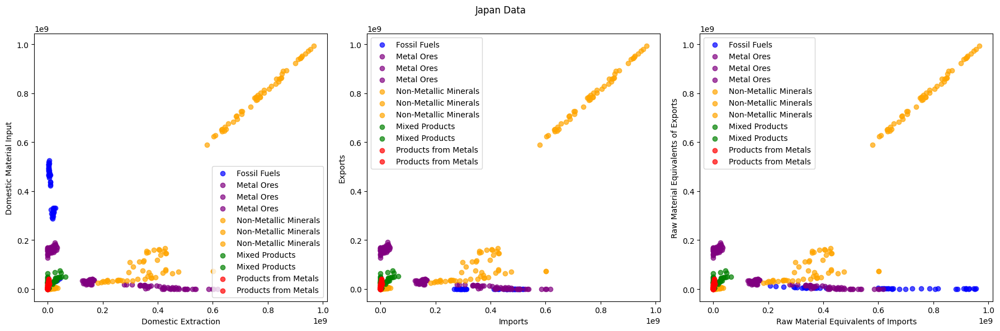

In [68]:
import matplotlib.pyplot as plt

# Fossil_data
jap_domestic_ext_fossil = japan_fossil_df['Domestic Extraction']
jap_domestic_input_fossil = japan_fossil_df['Domestic Material Input']
jap_imports_fossil = japan_fossil_df['Imports']
jap_exports_fossil = japan_fossil_df['Exports']
jap_raw_imports_fossil = japan_fossil_df['Raw Material Equivalents of imports']
jap_raw_exports_fossil = japan_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
jap_domestic_ext_metalore = japan_metalore_df['Domestic Extraction']
jap_domestic_input_metalore = japan_metalore_df['Domestic Material Input']
jap_imports_metalore = japan_metalore_df['Imports']
jap_exports_metalore = japan_metalore_df['Exports']
jap_raw_imports_metalore = japan_metalore_df['Raw Material Equivalents of imports']
jap_raw_exports_metalore = japan_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
jap_domestic_ext_nmm = japan_nmm_df['Domestic Extraction']
jap_domestic_input_nmm = japan_nmm_df['Domestic Material Input']
jap_imports_nmm = japan_nmm_df['Imports']
jap_exports_nmm = japan_nmm_df['Exports']
jap_raw_imports_nmm = japan_nmm_df['Raw Material Equivalents of imports']
jap_raw_exports_nmm = japan_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
jap_domestic_ext_mp = japan_mp_df['Domestic Extraction']
jap_domestic_input_mp = japan_mp_df['Domestic Material Input']
jap_imports_mp = japan_mp_df['Imports']
jap_exports_mp = japan_mp_df['Exports']

# Products from metals
jap_domestic_ext_pfm = japan_pfm_df['Domestic Extraction']
jap_domestic_input_pfm = japan_pfm_df['Domestic Material Input']
jap_imports_pfm = japan_pfm_df['Imports']
jap_exports_pfm = japan_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Japan Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], jap_domestic_ext_fossil, jap_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], jap_imports_fossil, jap_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], jap_raw_imports_fossil, jap_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (jap_domestic_ext_metalore, jap_domestic_input_metalore, 'purple', 'Metal Ores'),
    (jap_imports_metalore, jap_exports_metalore, 'purple', 'Metal Ores'),
    (jap_raw_imports_metalore, jap_raw_exports_metalore, 'purple', 'Metal Ores'),

    (jap_domestic_ext_nmm, jap_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (jap_imports_nmm, jap_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (jap_raw_imports_nmm, jap_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (jap_domestic_ext_mp, jap_domestic_input_mp, 'green', 'Mixed Products'),
    (jap_imports_mp, jap_exports_mp, 'green', 'Mixed Products'),

    (jap_domestic_ext_pfm, jap_domestic_input_pfm, 'red', 'Products from Metals'),
    (jap_imports_pfm, jap_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, japor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, japor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, japor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, japor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**26. Malaysia:**

In [69]:
malaysia_fossil_df = category_dataframes_by_country['Malaysia']['Fossil fuels']
malaysia_metalore_df = category_dataframes_by_country['Malaysia']['Metal ores']
malaysia_nmm_df = category_dataframes_by_country['Malaysia']['Non-metallic minerals']
malaysia_mp_df = category_dataframes_by_country['Malaysia']['Mixed and complex products nec.']
malaysia_pfm_df = category_dataframes_by_country['Malaysia']['Products from metals']

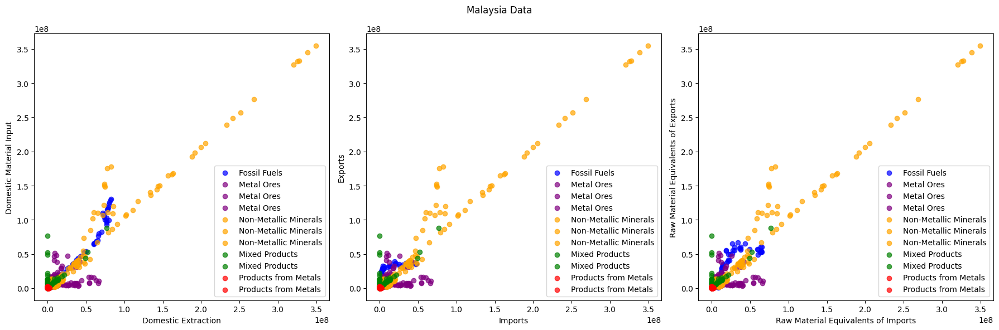

In [70]:
import matplotlib.pyplot as plt

# Fossil_data
mal_domestic_ext_fossil = malaysia_fossil_df['Domestic Extraction']
mal_domestic_input_fossil = malaysia_fossil_df['Domestic Material Input']
mal_imports_fossil = malaysia_fossil_df['Imports']
mal_exports_fossil = malaysia_fossil_df['Exports']
mal_raw_imports_fossil = malaysia_fossil_df['Raw Material Equivalents of imports']
mal_raw_exports_fossil = malaysia_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
mal_domestic_ext_metalore = malaysia_metalore_df['Domestic Extraction']
mal_domestic_input_metalore = malaysia_metalore_df['Domestic Material Input']
mal_imports_metalore = malaysia_metalore_df['Imports']
mal_exports_metalore = malaysia_metalore_df['Exports']
mal_raw_imports_metalore = malaysia_metalore_df['Raw Material Equivalents of imports']
mal_raw_exports_metalore = malaysia_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
mal_domestic_ext_nmm = malaysia_nmm_df['Domestic Extraction']
mal_domestic_input_nmm = malaysia_nmm_df['Domestic Material Input']
mal_imports_nmm = malaysia_nmm_df['Imports']
mal_exports_nmm = malaysia_nmm_df['Exports']
mal_raw_imports_nmm = malaysia_nmm_df['Raw Material Equivalents of imports']
mal_raw_exports_nmm = malaysia_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
mal_domestic_ext_mp = malaysia_mp_df['Domestic Extraction']
mal_domestic_input_mp = malaysia_mp_df['Domestic Material Input']
mal_imports_mp = malaysia_mp_df['Imports']
mal_exports_mp = malaysia_mp_df['Exports']

# Products from metals
mal_domestic_ext_pfm = malaysia_pfm_df['Domestic Extraction']
mal_domestic_input_pfm = malaysia_pfm_df['Domestic Material Input']
mal_imports_pfm = malaysia_pfm_df['Imports']
mal_exports_pfm = malaysia_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Malaysia Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], mal_domestic_ext_fossil, mal_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], mal_imports_fossil, mal_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], mal_raw_imports_fossil, mal_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (mal_domestic_ext_metalore, mal_domestic_input_metalore, 'purple', 'Metal Ores'),
    (mal_imports_metalore, mal_exports_metalore, 'purple', 'Metal Ores'),
    (mal_raw_imports_metalore, mal_raw_exports_metalore, 'purple', 'Metal Ores'),

    (mal_domestic_ext_nmm, mal_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (mal_imports_nmm, mal_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (mal_raw_imports_nmm, mal_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (mal_domestic_ext_mp, mal_domestic_input_mp, 'green', 'Mixed Products'),
    (mal_imports_mp, mal_exports_mp, 'green', 'Mixed Products'),

    (mal_domestic_ext_pfm, mal_domestic_input_pfm, 'red', 'Products from Metals'),
    (mal_imports_pfm, mal_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, malor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, malor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, malor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, malor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **27. Mexico:**

In [71]:
mexico_fossil_df = category_dataframes_by_country['Mexico']['Fossil fuels']
mexico_metalore_df = category_dataframes_by_country['Mexico']['Metal ores']
mexico_nmm_df = category_dataframes_by_country['Mexico']['Non-metallic minerals']
mexico_mp_df = category_dataframes_by_country['Mexico']['Mixed and complex products nec.']
mexico_pfm_df = category_dataframes_by_country['Mexico']['Products from metals']

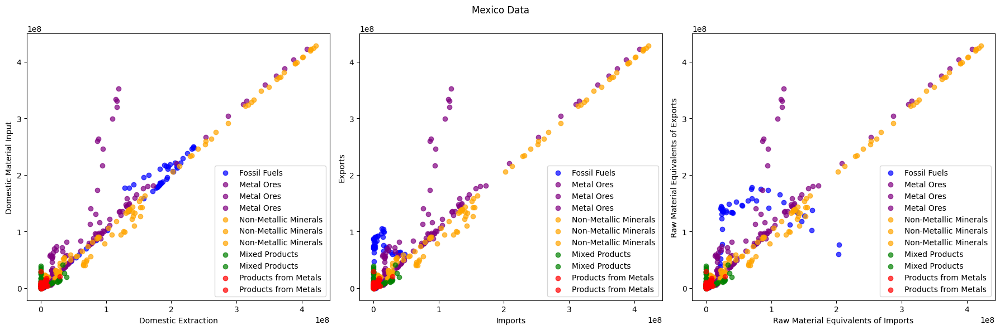

In [72]:
import matplotlib.pyplot as plt

# Fossil_data
mex_domestic_ext_fossil = mexico_fossil_df['Domestic Extraction']
mex_domestic_input_fossil = mexico_fossil_df['Domestic Material Input']
mex_imports_fossil = mexico_fossil_df['Imports']
mex_exports_fossil = mexico_fossil_df['Exports']
mex_raw_imports_fossil = mexico_fossil_df['Raw Material Equivalents of imports']
mex_raw_exports_fossil = mexico_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
mex_domestic_ext_metalore = mexico_metalore_df['Domestic Extraction']
mex_domestic_input_metalore = mexico_metalore_df['Domestic Material Input']
mex_imports_metalore = mexico_metalore_df['Imports']
mex_exports_metalore = mexico_metalore_df['Exports']
mex_raw_imports_metalore = mexico_metalore_df['Raw Material Equivalents of imports']
mex_raw_exports_metalore = mexico_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
mex_domestic_ext_nmm = mexico_nmm_df['Domestic Extraction']
mex_domestic_input_nmm = mexico_nmm_df['Domestic Material Input']
mex_imports_nmm = mexico_nmm_df['Imports']
mex_exports_nmm = mexico_nmm_df['Exports']
mex_raw_imports_nmm = mexico_nmm_df['Raw Material Equivalents of imports']
mex_raw_exports_nmm = mexico_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
mex_domestic_ext_mp = mexico_mp_df['Domestic Extraction']
mex_domestic_input_mp = mexico_mp_df['Domestic Material Input']
mex_imports_mp = mexico_mp_df['Imports']
mex_exports_mp = mexico_mp_df['Exports']

# Products from metals
mex_domestic_ext_pfm = mexico_pfm_df['Domestic Extraction']
mex_domestic_input_pfm = mexico_pfm_df['Domestic Material Input']
mex_imports_pfm = mexico_pfm_df['Imports']
mex_exports_pfm = mexico_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Mexico Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], mex_domestic_ext_fossil, mex_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], mex_imports_fossil, mex_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], mex_raw_imports_fossil, mex_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (mex_domestic_ext_metalore, mex_domestic_input_metalore, 'purple', 'Metal Ores'),
    (mex_imports_metalore, mex_exports_metalore, 'purple', 'Metal Ores'),
    (mex_raw_imports_metalore, mex_raw_exports_metalore, 'purple', 'Metal Ores'),

    (mex_domestic_ext_nmm, mex_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (mex_imports_nmm, mex_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (mex_raw_imports_nmm, mex_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (mex_domestic_ext_mp, mex_domestic_input_mp, 'green', 'Mixed Products'),
    (mex_imports_mp, mex_exports_mp, 'green', 'Mixed Products'),

    (mex_domestic_ext_pfm, mex_domestic_input_pfm, 'red', 'Products from Metals'),
    (mex_imports_pfm, mex_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, mexor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, mexor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, mexor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, mexor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **28. Netherlands:**

In [73]:
netherlands_fossil_df = category_dataframes_by_country['Netherlands']['Fossil fuels']
netherlands_metalore_df = category_dataframes_by_country['Netherlands']['Metal ores']
netherlands_nmm_df = category_dataframes_by_country['Netherlands']['Non-metallic minerals']
netherlands_mp_df = category_dataframes_by_country['Netherlands']['Mixed and complex products nec.']
netherlands_pfm_df = category_dataframes_by_country['Netherlands']['Products from metals']

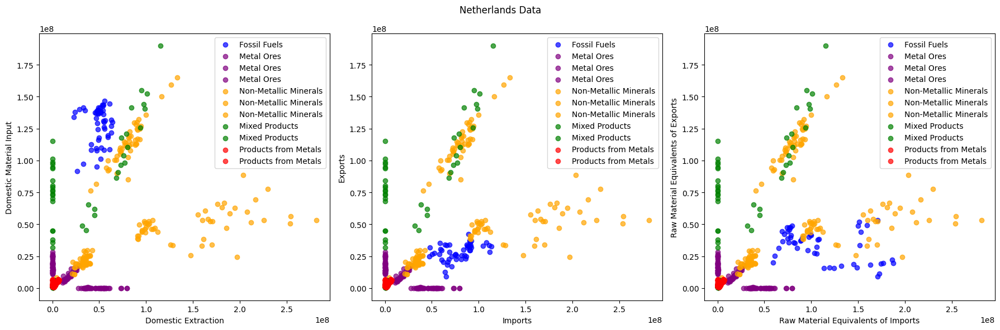

In [74]:
import matplotlib.pyplot as plt

# Fossil_data
neth_domestic_ext_fossil = netherlands_fossil_df['Domestic Extraction']
neth_domestic_input_fossil = netherlands_fossil_df['Domestic Material Input']
neth_imports_fossil = netherlands_fossil_df['Imports']
neth_exports_fossil = netherlands_fossil_df['Exports']
neth_raw_imports_fossil = netherlands_fossil_df['Raw Material Equivalents of imports']
neth_raw_exports_fossil = netherlands_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
neth_domestic_ext_metalore = netherlands_metalore_df['Domestic Extraction']
neth_domestic_input_metalore = netherlands_metalore_df['Domestic Material Input']
neth_imports_metalore = netherlands_metalore_df['Imports']
neth_exports_metalore = netherlands_metalore_df['Exports']
neth_raw_imports_metalore = netherlands_metalore_df['Raw Material Equivalents of imports']
neth_raw_exports_metalore = netherlands_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
neth_domestic_ext_nmm = netherlands_nmm_df['Domestic Extraction']
neth_domestic_input_nmm = netherlands_nmm_df['Domestic Material Input']
neth_imports_nmm = netherlands_nmm_df['Imports']
neth_exports_nmm = netherlands_nmm_df['Exports']
neth_raw_imports_nmm = netherlands_nmm_df['Raw Material Equivalents of imports']
neth_raw_exports_nmm = netherlands_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
neth_domestic_ext_mp = netherlands_mp_df['Domestic Extraction']
neth_domestic_input_mp = netherlands_mp_df['Domestic Material Input']
neth_imports_mp = netherlands_mp_df['Imports']
neth_exports_mp = netherlands_mp_df['Exports']

# Products from metals
neth_domestic_ext_pfm = netherlands_pfm_df['Domestic Extraction']
neth_domestic_input_pfm = netherlands_pfm_df['Domestic Material Input']
neth_imports_pfm = netherlands_pfm_df['Imports']
neth_exports_pfm = netherlands_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Netherlands Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], neth_domestic_ext_fossil, neth_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], neth_imports_fossil, neth_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], neth_raw_imports_fossil, neth_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (neth_domestic_ext_metalore, neth_domestic_input_metalore, 'purple', 'Metal Ores'),
    (neth_imports_metalore, neth_exports_metalore, 'purple', 'Metal Ores'),
    (neth_raw_imports_metalore, neth_raw_exports_metalore, 'purple', 'Metal Ores'),

    (neth_domestic_ext_nmm, neth_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (neth_imports_nmm, neth_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (neth_raw_imports_nmm, neth_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (neth_domestic_ext_mp, neth_domestic_input_mp, 'green', 'Mixed Products'),
    (neth_imports_mp, neth_exports_mp, 'green', 'Mixed Products'),

    (neth_domestic_ext_pfm, neth_domestic_input_pfm, 'red', 'Products from Metals'),
    (neth_imports_pfm, neth_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, nethor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, nethor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, nethor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, nethor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **29. Nigeria:**

In [75]:
nigeria_fossil_df = category_dataframes_by_country['Nigeria']['Fossil fuels']
nigeria_metalore_df = category_dataframes_by_country['Nigeria']['Metal ores']
nigeria_nmm_df = category_dataframes_by_country['Nigeria']['Non-metallic minerals']
nigeria_mp_df = category_dataframes_by_country['Nigeria']['Mixed and complex products nec.']
nigeria_pfm_df = category_dataframes_by_country['Nigeria']['Products from metals']

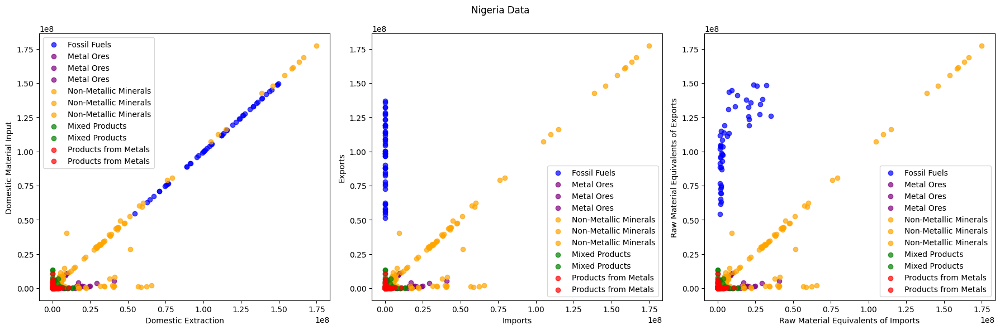

In [76]:
import matplotlib.pyplot as plt

# Fossil_data
nig_domestic_ext_fossil = nigeria_fossil_df['Domestic Extraction']
nig_domestic_input_fossil = nigeria_fossil_df['Domestic Material Input']
nig_imports_fossil = nigeria_fossil_df['Imports']
nig_exports_fossil = nigeria_fossil_df['Exports']
nig_raw_imports_fossil = nigeria_fossil_df['Raw Material Equivalents of imports']
nig_raw_exports_fossil = nigeria_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
nig_domestic_ext_metalore = nigeria_metalore_df['Domestic Extraction']
nig_domestic_input_metalore = nigeria_metalore_df['Domestic Material Input']
nig_imports_metalore = nigeria_metalore_df['Imports']
nig_exports_metalore = nigeria_metalore_df['Exports']
nig_raw_imports_metalore = nigeria_metalore_df['Raw Material Equivalents of imports']
nig_raw_exports_metalore = nigeria_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
nig_domestic_ext_nmm = nigeria_nmm_df['Domestic Extraction']
nig_domestic_input_nmm = nigeria_nmm_df['Domestic Material Input']
nig_imports_nmm = nigeria_nmm_df['Imports']
nig_exports_nmm = nigeria_nmm_df['Exports']
nig_raw_imports_nmm = nigeria_nmm_df['Raw Material Equivalents of imports']
nig_raw_exports_nmm = nigeria_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
nig_domestic_ext_mp = nigeria_mp_df['Domestic Extraction']
nig_domestic_input_mp = nigeria_mp_df['Domestic Material Input']
nig_imports_mp = nigeria_mp_df['Imports']
nig_exports_mp = nigeria_mp_df['Exports']

# Products from metals
nig_domestic_ext_pfm = nigeria_pfm_df['Domestic Extraction']
nig_domestic_input_pfm = nigeria_pfm_df['Domestic Material Input']
nig_imports_pfm = nigeria_pfm_df['Imports']
nig_exports_pfm = nigeria_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Nigeria Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], nig_domestic_ext_fossil, nig_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], nig_imports_fossil, nig_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], nig_raw_imports_fossil, nig_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (nig_domestic_ext_metalore, nig_domestic_input_metalore, 'purple', 'Metal Ores'),
    (nig_imports_metalore, nig_exports_metalore, 'purple', 'Metal Ores'),
    (nig_raw_imports_metalore, nig_raw_exports_metalore, 'purple', 'Metal Ores'),

    (nig_domestic_ext_nmm, nig_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (nig_imports_nmm, nig_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (nig_raw_imports_nmm, nig_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (nig_domestic_ext_mp, nig_domestic_input_mp, 'green', 'Mixed Products'),
    (nig_imports_mp, nig_exports_mp, 'green', 'Mixed Products'),

    (nig_domestic_ext_pfm, nig_domestic_input_pfm, 'red', 'Products from Metals'),
    (nig_imports_pfm, nig_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, nigor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, nigor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, nigor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, nigor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **30. Norway:**

In [77]:
norway_fossil_df = category_dataframes_by_country['Norway']['Fossil fuels']
norway_metalore_df = category_dataframes_by_country['Norway']['Metal ores']
norway_nmm_df = category_dataframes_by_country['Norway']['Non-metallic minerals']
norway_mp_df = category_dataframes_by_country['Norway']['Mixed and complex products nec.']
norway_pfm_df = category_dataframes_by_country['Norway']['Products from metals']

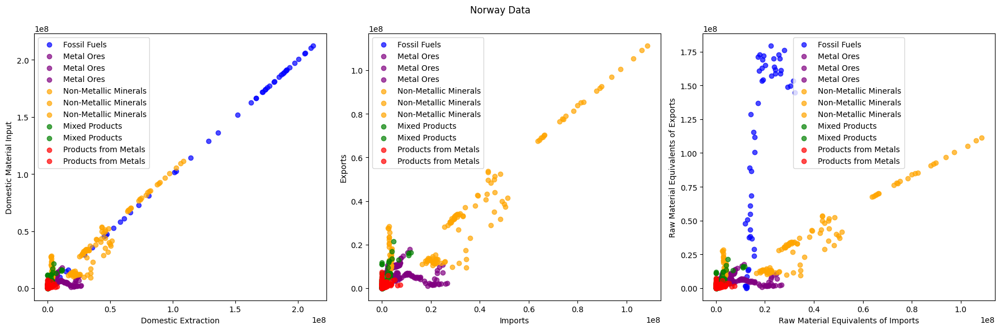

In [78]:
import matplotlib.pyplot as plt

# Fossil_data
nor_domestic_ext_fossil = norway_fossil_df['Domestic Extraction']
nor_domestic_input_fossil = norway_fossil_df['Domestic Material Input']
nor_imports_fossil = norway_fossil_df['Imports']
nor_exports_fossil = norway_fossil_df['Exports']
nor_raw_imports_fossil = norway_fossil_df['Raw Material Equivalents of imports']
nor_raw_exports_fossil = norway_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
nor_domestic_ext_metalore = norway_metalore_df['Domestic Extraction']
nor_domestic_input_metalore = norway_metalore_df['Domestic Material Input']
nor_imports_metalore = norway_metalore_df['Imports']
nor_exports_metalore = norway_metalore_df['Exports']
nor_raw_imports_metalore = norway_metalore_df['Raw Material Equivalents of imports']
nor_raw_exports_metalore = norway_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
nor_domestic_ext_nmm = norway_nmm_df['Domestic Extraction']
nor_domestic_input_nmm = norway_nmm_df['Domestic Material Input']
nor_imports_nmm = norway_nmm_df['Imports']
nor_exports_nmm = norway_nmm_df['Exports']
nor_raw_imports_nmm = norway_nmm_df['Raw Material Equivalents of imports']
nor_raw_exports_nmm = norway_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
nor_domestic_ext_mp = norway_mp_df['Domestic Extraction']
nor_domestic_input_mp = norway_mp_df['Domestic Material Input']
nor_imports_mp = norway_mp_df['Imports']
nor_exports_mp = norway_mp_df['Exports']

# Products from metals
nor_domestic_ext_pfm = norway_pfm_df['Domestic Extraction']
nor_domestic_input_pfm = norway_pfm_df['Domestic Material Input']
nor_imports_pfm = norway_pfm_df['Imports']
nor_exports_pfm = norway_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Norway Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], nor_domestic_ext_fossil, nor_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], nor_imports_fossil, nor_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], nor_raw_imports_fossil, nor_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (nor_domestic_ext_metalore, nor_domestic_input_metalore, 'purple', 'Metal Ores'),
    (nor_imports_metalore, nor_exports_metalore, 'purple', 'Metal Ores'),
    (nor_raw_imports_metalore, nor_raw_exports_metalore, 'purple', 'Metal Ores'),

    (nor_domestic_ext_nmm, nor_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (nor_imports_nmm, nor_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (nor_raw_imports_nmm, nor_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (nor_domestic_ext_mp, nor_domestic_input_mp, 'green', 'Mixed Products'),
    (nor_imports_mp, nor_exports_mp, 'green', 'Mixed Products'),

    (nor_domestic_ext_pfm, nor_domestic_input_pfm, 'red', 'Products from Metals'),
    (nor_imports_pfm, nor_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, noror, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, noror, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, noror, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, noror, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **31. Pakistan:**

In [79]:
pakistan_fossil_df = category_dataframes_by_country['Pakistan']['Fossil fuels']
pakistan_metalore_df = category_dataframes_by_country['Pakistan']['Metal ores']
pakistan_nmm_df = category_dataframes_by_country['Pakistan']['Non-metallic minerals']
pakistan_mp_df = category_dataframes_by_country['Pakistan']['Mixed and complex products nec.']
pakistan_pfm_df = category_dataframes_by_country['Pakistan']['Products from metals']

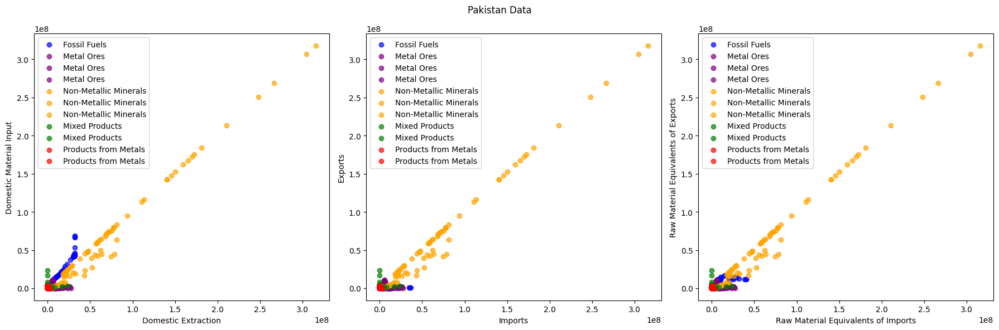

In [80]:
import matplotlib.pyplot as plt

# Fossil_data
pak_domestic_ext_fossil = pakistan_fossil_df['Domestic Extraction']
pak_domestic_input_fossil = pakistan_fossil_df['Domestic Material Input']
pak_imports_fossil = pakistan_fossil_df['Imports']
pak_exports_fossil = pakistan_fossil_df['Exports']
pak_raw_imports_fossil = pakistan_fossil_df['Raw Material Equivalents of imports']
pak_raw_exports_fossil = pakistan_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
pak_domestic_ext_metalore = pakistan_metalore_df['Domestic Extraction']
pak_domestic_input_metalore = pakistan_metalore_df['Domestic Material Input']
pak_imports_metalore = pakistan_metalore_df['Imports']
pak_exports_metalore = pakistan_metalore_df['Exports']
pak_raw_imports_metalore = pakistan_metalore_df['Raw Material Equivalents of imports']
pak_raw_exports_metalore = pakistan_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
pak_domestic_ext_nmm = pakistan_nmm_df['Domestic Extraction']
pak_domestic_input_nmm = pakistan_nmm_df['Domestic Material Input']
pak_imports_nmm = pakistan_nmm_df['Imports']
pak_exports_nmm = pakistan_nmm_df['Exports']
pak_raw_imports_nmm = pakistan_nmm_df['Raw Material Equivalents of imports']
pak_raw_exports_nmm = pakistan_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
pak_domestic_ext_mp = pakistan_mp_df['Domestic Extraction']
pak_domestic_input_mp = pakistan_mp_df['Domestic Material Input']
pak_imports_mp = pakistan_mp_df['Imports']
pak_exports_mp = pakistan_mp_df['Exports']

# Products from metals
pak_domestic_ext_pfm = pakistan_pfm_df['Domestic Extraction']
pak_domestic_input_pfm = pakistan_pfm_df['Domestic Material Input']
pak_imports_pfm = pakistan_pfm_df['Imports']
pak_exports_pfm = pakistan_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Pakistan Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], pak_domestic_ext_fossil, pak_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], pak_imports_fossil, pak_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], pak_raw_imports_fossil, pak_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (pak_domestic_ext_metalore, pak_domestic_input_metalore, 'purple', 'Metal Ores'),
    (pak_imports_metalore, pak_exports_metalore, 'purple', 'Metal Ores'),
    (pak_raw_imports_metalore, pak_raw_exports_metalore, 'purple', 'Metal Ores'),

    (pak_domestic_ext_nmm, pak_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (pak_imports_nmm, pak_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (pak_raw_imports_nmm, pak_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (pak_domestic_ext_mp, pak_domestic_input_mp, 'green', 'Mixed Products'),
    (pak_imports_mp, pak_exports_mp, 'green', 'Mixed Products'),

    (pak_domestic_ext_pfm, pak_domestic_input_pfm, 'red', 'Products from Metals'),
    (pak_imports_pfm, pak_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, pakor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, pakor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, pakor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, pakor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **32. Philippines:**

In [81]:
philippines_fossil_df = category_dataframes_by_country['Philippines']['Fossil fuels']
philippines_metalore_df = category_dataframes_by_country['Philippines']['Metal ores']
philippines_nmm_df = category_dataframes_by_country['Philippines']['Non-metallic minerals']
philippines_mp_df = category_dataframes_by_country['Philippines']['Mixed and complex products nec.']
philippines_pfm_df = category_dataframes_by_country['Philippines']['Products from metals']

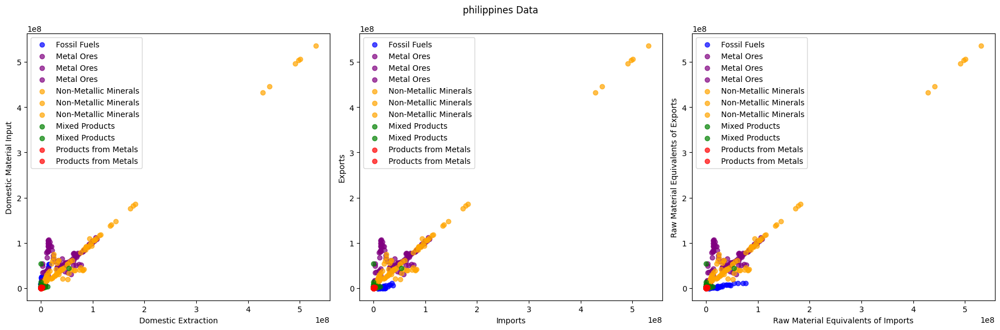

In [82]:
import matplotlib.pyplot as plt

# Fossil_data
phi_domestic_ext_fossil = philippines_fossil_df['Domestic Extraction']
phi_domestic_input_fossil = philippines_fossil_df['Domestic Material Input']
phi_imports_fossil = philippines_fossil_df['Imports']
phi_exports_fossil = philippines_fossil_df['Exports']
phi_raw_imports_fossil = philippines_fossil_df['Raw Material Equivalents of imports']
phi_raw_exports_fossil = philippines_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
phi_domestic_ext_metalore = philippines_metalore_df['Domestic Extraction']
phi_domestic_input_metalore = philippines_metalore_df['Domestic Material Input']
phi_imports_metalore = philippines_metalore_df['Imports']
phi_exports_metalore = philippines_metalore_df['Exports']
phi_raw_imports_metalore = philippines_metalore_df['Raw Material Equivalents of imports']
phi_raw_exports_metalore = philippines_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
phi_domestic_ext_nmm = philippines_nmm_df['Domestic Extraction']
phi_domestic_input_nmm = philippines_nmm_df['Domestic Material Input']
phi_imports_nmm = philippines_nmm_df['Imports']
phi_exports_nmm = philippines_nmm_df['Exports']
phi_raw_imports_nmm = philippines_nmm_df['Raw Material Equivalents of imports']
phi_raw_exports_nmm = philippines_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
phi_domestic_ext_mp = philippines_mp_df['Domestic Extraction']
phi_domestic_input_mp = philippines_mp_df['Domestic Material Input']
phi_imports_mp = philippines_mp_df['Imports']
phi_exports_mp = philippines_mp_df['Exports']

# Products from metals
phi_domestic_ext_pfm = philippines_pfm_df['Domestic Extraction']
phi_domestic_input_pfm = philippines_pfm_df['Domestic Material Input']
phi_imports_pfm = philippines_pfm_df['Imports']
phi_exports_pfm = philippines_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('philippines Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], phi_domestic_ext_fossil, phi_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], phi_imports_fossil, phi_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], phi_raw_imports_fossil, phi_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (phi_domestic_ext_metalore, phi_domestic_input_metalore, 'purple', 'Metal Ores'),
    (phi_imports_metalore, phi_exports_metalore, 'purple', 'Metal Ores'),
    (phi_raw_imports_metalore, phi_raw_exports_metalore, 'purple', 'Metal Ores'),

    (phi_domestic_ext_nmm, phi_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (phi_imports_nmm, phi_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (phi_raw_imports_nmm, phi_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (phi_domestic_ext_mp, phi_domestic_input_mp, 'green', 'Mixed Products'),
    (phi_imports_mp, phi_exports_mp, 'green', 'Mixed Products'),

    (phi_domestic_ext_pfm, phi_domestic_input_pfm, 'red', 'Products from Metals'),
    (phi_imports_pfm, phi_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, phior, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, phior, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, phior, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, phior, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **33. Poland:**

In [83]:
poland_fossil_df = category_dataframes_by_country['Poland']['Fossil fuels']
poland_metalore_df = category_dataframes_by_country['Poland']['Metal ores']
poland_nmm_df = category_dataframes_by_country['Poland']['Non-metallic minerals']
poland_mp_df = category_dataframes_by_country['Poland']['Mixed and complex products nec.']
poland_pfm_df = category_dataframes_by_country['Poland']['Products from metals']

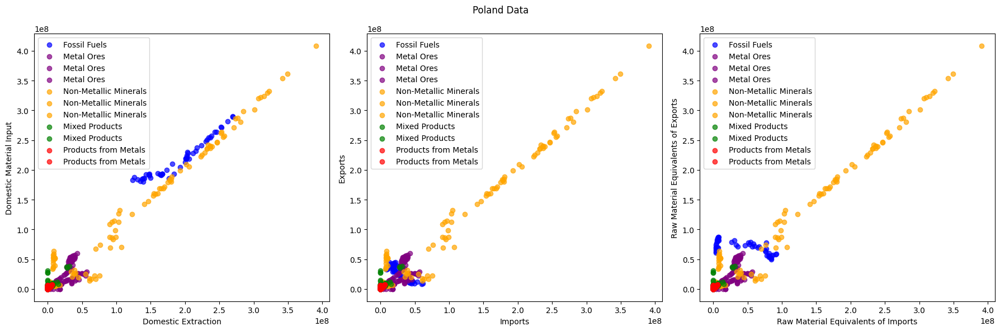

In [84]:
import matplotlib.pyplot as plt

# Fossil_data
pol_domestic_ext_fossil = poland_fossil_df['Domestic Extraction']
pol_domestic_input_fossil = poland_fossil_df['Domestic Material Input']
pol_imports_fossil = poland_fossil_df['Imports']
pol_exports_fossil = poland_fossil_df['Exports']
pol_raw_imports_fossil = poland_fossil_df['Raw Material Equivalents of imports']
pol_raw_exports_fossil = poland_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
pol_domestic_ext_metalore = poland_metalore_df['Domestic Extraction']
pol_domestic_input_metalore = poland_metalore_df['Domestic Material Input']
pol_imports_metalore = poland_metalore_df['Imports']
pol_exports_metalore = poland_metalore_df['Exports']
pol_raw_imports_metalore = poland_metalore_df['Raw Material Equivalents of imports']
pol_raw_exports_metalore = poland_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
pol_domestic_ext_nmm = poland_nmm_df['Domestic Extraction']
pol_domestic_input_nmm = poland_nmm_df['Domestic Material Input']
pol_imports_nmm = poland_nmm_df['Imports']
pol_exports_nmm = poland_nmm_df['Exports']
pol_raw_imports_nmm = poland_nmm_df['Raw Material Equivalents of imports']
pol_raw_exports_nmm = poland_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
pol_domestic_ext_mp = poland_mp_df['Domestic Extraction']
pol_domestic_input_mp = poland_mp_df['Domestic Material Input']
pol_imports_mp = poland_mp_df['Imports']
pol_exports_mp = poland_mp_df['Exports']

# Products from metals
pol_domestic_ext_pfm = poland_pfm_df['Domestic Extraction']
pol_domestic_input_pfm = poland_pfm_df['Domestic Material Input']
pol_imports_pfm = poland_pfm_df['Imports']
pol_exports_pfm = poland_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Poland Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], pol_domestic_ext_fossil, pol_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], pol_imports_fossil, pol_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], pol_raw_imports_fossil, pol_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (pol_domestic_ext_metalore, pol_domestic_input_metalore, 'purple', 'Metal Ores'),
    (pol_imports_metalore, pol_exports_metalore, 'purple', 'Metal Ores'),
    (pol_raw_imports_metalore, pol_raw_exports_metalore, 'purple', 'Metal Ores'),

    (pol_domestic_ext_nmm, pol_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (pol_imports_nmm, pol_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (pol_raw_imports_nmm, pol_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (pol_domestic_ext_mp, pol_domestic_input_mp, 'green', 'Mixed Products'),
    (pol_imports_mp, pol_exports_mp, 'green', 'Mixed Products'),

    (pol_domestic_ext_pfm, pol_domestic_input_pfm, 'red', 'Products from Metals'),
    (pol_imports_pfm, pol_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, polor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, polor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, polor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, polor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **34. Romania:**

In [85]:
romania_fossil_df = category_dataframes_by_country['Romania']['Fossil fuels']
romania_metalore_df = category_dataframes_by_country['Romania']['Metal ores']
romania_nmm_df = category_dataframes_by_country['Romania']['Non-metallic minerals']
romania_mp_df = category_dataframes_by_country['Romania']['Mixed and complex products nec.']
romania_pfm_df = category_dataframes_by_country['Romania']['Products from metals']

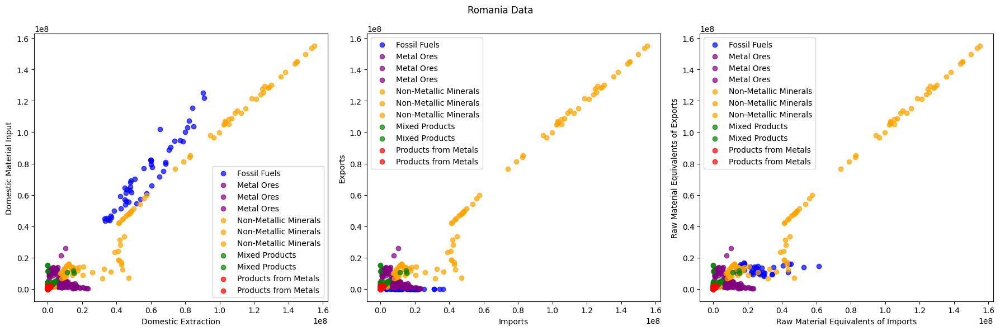

In [86]:
import matplotlib.pyplot as plt

# Fossil_data
rom_domestic_ext_fossil = romania_fossil_df['Domestic Extraction']
rom_domestic_input_fossil = romania_fossil_df['Domestic Material Input']
rom_imports_fossil = romania_fossil_df['Imports']
rom_exports_fossil = romania_fossil_df['Exports']
rom_raw_imports_fossil = romania_fossil_df['Raw Material Equivalents of imports']
rom_raw_exports_fossil = romania_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
rom_domestic_ext_metalore = romania_metalore_df['Domestic Extraction']
rom_domestic_input_metalore = romania_metalore_df['Domestic Material Input']
rom_imports_metalore = romania_metalore_df['Imports']
rom_exports_metalore = romania_metalore_df['Exports']
rom_raw_imports_metalore = romania_metalore_df['Raw Material Equivalents of imports']
rom_raw_exports_metalore = romania_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
rom_domestic_ext_nmm = romania_nmm_df['Domestic Extraction']
rom_domestic_input_nmm = romania_nmm_df['Domestic Material Input']
rom_imports_nmm = romania_nmm_df['Imports']
rom_exports_nmm = romania_nmm_df['Exports']
rom_raw_imports_nmm = romania_nmm_df['Raw Material Equivalents of imports']
rom_raw_exports_nmm = romania_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
rom_domestic_ext_mp = romania_mp_df['Domestic Extraction']
rom_domestic_input_mp = romania_mp_df['Domestic Material Input']
rom_imports_mp = romania_mp_df['Imports']
rom_exports_mp = romania_mp_df['Exports']

# Products from metals
rom_domestic_ext_pfm = romania_pfm_df['Domestic Extraction']
rom_domestic_input_pfm = romania_pfm_df['Domestic Material Input']
rom_imports_pfm = romania_pfm_df['Imports']
rom_exports_pfm = romania_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Romania Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], rom_domestic_ext_fossil, rom_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], rom_imports_fossil, rom_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], rom_raw_imports_fossil, rom_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (rom_domestic_ext_metalore, rom_domestic_input_metalore, 'purple', 'Metal Ores'),
    (rom_imports_metalore, rom_exports_metalore, 'purple', 'Metal Ores'),
    (rom_raw_imports_metalore, rom_raw_exports_metalore, 'purple', 'Metal Ores'),

    (rom_domestic_ext_nmm, rom_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (rom_imports_nmm, rom_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (rom_raw_imports_nmm, rom_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (rom_domestic_ext_mp, rom_domestic_input_mp, 'green', 'Mixed Products'),
    (rom_imports_mp, rom_exports_mp, 'green', 'Mixed Products'),

    (rom_domestic_ext_pfm, rom_domestic_input_pfm, 'red', 'Products from Metals'),
    (rom_imports_pfm, rom_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, romor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, romor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, romor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, romor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **35. Saudi Arabia:**

In [87]:
saudiarabia_fossil_df = category_dataframes_by_country['Saudi Arabia']['Fossil fuels']
saudiarabia_metalore_df = category_dataframes_by_country['Saudi Arabia']['Metal ores']
saudiarabia_nmm_df = category_dataframes_by_country['Saudi Arabia']['Non-metallic minerals']
saudiarabia_mp_df = category_dataframes_by_country['Saudi Arabia']['Mixed and complex products nec.']
saudiarabia_pfm_df = category_dataframes_by_country['Saudi Arabia']['Products from metals']

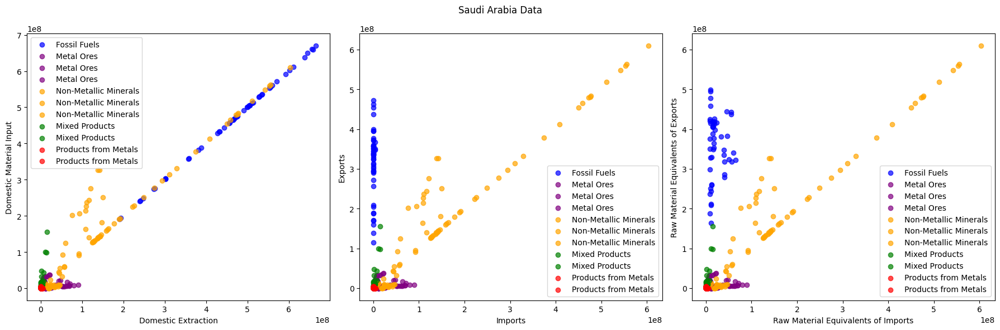

In [88]:
import matplotlib.pyplot as plt

# Fossil_data
sau_domestic_ext_fossil = saudiarabia_fossil_df['Domestic Extraction']
sau_domestic_input_fossil = saudiarabia_fossil_df['Domestic Material Input']
sau_imports_fossil = saudiarabia_fossil_df['Imports']
sau_exports_fossil = saudiarabia_fossil_df['Exports']
sau_raw_imports_fossil = saudiarabia_fossil_df['Raw Material Equivalents of imports']
sau_raw_exports_fossil = saudiarabia_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
sau_domestic_ext_metalore = saudiarabia_metalore_df['Domestic Extraction']
sau_domestic_input_metalore = saudiarabia_metalore_df['Domestic Material Input']
sau_imports_metalore = saudiarabia_metalore_df['Imports']
sau_exports_metalore = saudiarabia_metalore_df['Exports']
sau_raw_imports_metalore = saudiarabia_metalore_df['Raw Material Equivalents of imports']
sau_raw_exports_metalore = saudiarabia_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
sau_domestic_ext_nmm = saudiarabia_nmm_df['Domestic Extraction']
sau_domestic_input_nmm = saudiarabia_nmm_df['Domestic Material Input']
sau_imports_nmm = saudiarabia_nmm_df['Imports']
sau_exports_nmm = saudiarabia_nmm_df['Exports']
sau_raw_imports_nmm = saudiarabia_nmm_df['Raw Material Equivalents of imports']
sau_raw_exports_nmm = saudiarabia_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
sau_domestic_ext_mp = saudiarabia_mp_df['Domestic Extraction']
sau_domestic_input_mp = saudiarabia_mp_df['Domestic Material Input']
sau_imports_mp = saudiarabia_mp_df['Imports']
sau_exports_mp = saudiarabia_mp_df['Exports']

# Products from metals
sau_domestic_ext_pfm = saudiarabia_pfm_df['Domestic Extraction']
sau_domestic_input_pfm = saudiarabia_pfm_df['Domestic Material Input']
sau_imports_pfm = saudiarabia_pfm_df['Imports']
sau_exports_pfm = saudiarabia_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Saudi Arabia Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], sau_domestic_ext_fossil, sau_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], sau_imports_fossil, sau_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], sau_raw_imports_fossil, sau_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (sau_domestic_ext_metalore, sau_domestic_input_metalore, 'purple', 'Metal Ores'),
    (sau_imports_metalore, sau_exports_metalore, 'purple', 'Metal Ores'),
    (sau_raw_imports_metalore, sau_raw_exports_metalore, 'purple', 'Metal Ores'),

    (sau_domestic_ext_nmm, sau_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (sau_imports_nmm, sau_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (sau_raw_imports_nmm, sau_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (sau_domestic_ext_mp, sau_domestic_input_mp, 'green', 'Mixed Products'),
    (sau_imports_mp, sau_exports_mp, 'green', 'Mixed Products'),

    (sau_domestic_ext_pfm, sau_domestic_input_pfm, 'red', 'Products from Metals'),
    (sau_imports_pfm, sau_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, sauor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, sauor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, sauor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, sauor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **36. Singapore:**

In [89]:
singapore_fossil_df = category_dataframes_by_country['Singapore']['Fossil fuels']
singapore_metalore_df = category_dataframes_by_country['Singapore']['Metal ores']
singapore_nmm_df = category_dataframes_by_country['Singapore']['Non-metallic minerals']
singapore_mp_df = category_dataframes_by_country['Singapore']['Mixed and complex products nec.']
singapore_pfm_df = category_dataframes_by_country['Singapore']['Products from metals']

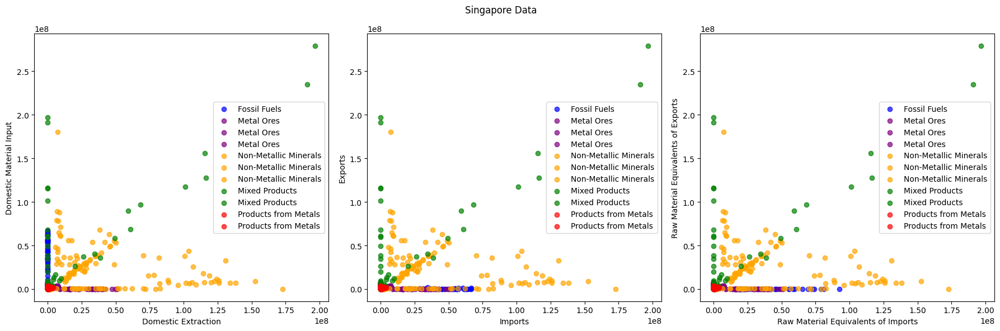

In [90]:
import matplotlib.pyplot as plt

# Fossil_data
sin_domestic_ext_fossil = singapore_fossil_df['Domestic Extraction']
sin_domestic_input_fossil = singapore_fossil_df['Domestic Material Input']
sin_imports_fossil = singapore_fossil_df['Imports']
sin_exports_fossil = singapore_fossil_df['Exports']
sin_raw_imports_fossil = singapore_fossil_df['Raw Material Equivalents of imports']
sin_raw_exports_fossil = singapore_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
sin_domestic_ext_metalore = singapore_metalore_df['Domestic Extraction']
sin_domestic_input_metalore = singapore_metalore_df['Domestic Material Input']
sin_imports_metalore = singapore_metalore_df['Imports']
sin_exports_metalore = singapore_metalore_df['Exports']
sin_raw_imports_metalore = singapore_metalore_df['Raw Material Equivalents of imports']
sin_raw_exports_metalore = singapore_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
sin_domestic_ext_nmm = singapore_nmm_df['Domestic Extraction']
sin_domestic_input_nmm = singapore_nmm_df['Domestic Material Input']
sin_imports_nmm = singapore_nmm_df['Imports']
sin_exports_nmm = singapore_nmm_df['Exports']
sin_raw_imports_nmm = singapore_nmm_df['Raw Material Equivalents of imports']
sin_raw_exports_nmm = singapore_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
sin_domestic_ext_mp = singapore_mp_df['Domestic Extraction']
sin_domestic_input_mp = singapore_mp_df['Domestic Material Input']
sin_imports_mp = singapore_mp_df['Imports']
sin_exports_mp = singapore_mp_df['Exports']

# Products from metals
sin_domestic_ext_pfm = singapore_pfm_df['Domestic Extraction']
sin_domestic_input_pfm = singapore_pfm_df['Domestic Material Input']
sin_imports_pfm = singapore_pfm_df['Imports']
sin_exports_pfm = singapore_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Singapore Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], sin_domestic_ext_fossil, sin_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], sin_imports_fossil, sin_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], sin_raw_imports_fossil, sin_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (sin_domestic_ext_metalore, sin_domestic_input_metalore, 'purple', 'Metal Ores'),
    (sin_imports_metalore, sin_exports_metalore, 'purple', 'Metal Ores'),
    (sin_raw_imports_metalore, sin_raw_exports_metalore, 'purple', 'Metal Ores'),

    (sin_domestic_ext_nmm, sin_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (sin_imports_nmm, sin_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (sin_raw_imports_nmm, sin_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (sin_domestic_ext_mp, sin_domestic_input_mp, 'green', 'Mixed Products'),
    (sin_imports_mp, sin_exports_mp, 'green', 'Mixed Products'),

    (sin_domestic_ext_pfm, sin_domestic_input_pfm, 'red', 'Products from Metals'),
    (sin_imports_pfm, sin_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, sinor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, sinor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, sinor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, sinor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **37. South Africa:**

In [91]:
southafrica_fossil_df = category_dataframes_by_country['South Africa']['Fossil fuels']
southafrica_metalore_df = category_dataframes_by_country['South Africa']['Metal ores']
southafrica_nmm_df = category_dataframes_by_country['South Africa']['Non-metallic minerals']
southafrica_mp_df = category_dataframes_by_country['South Africa']['Mixed and complex products nec.']
southafrica_pfm_df = category_dataframes_by_country['South Africa']['Products from metals']

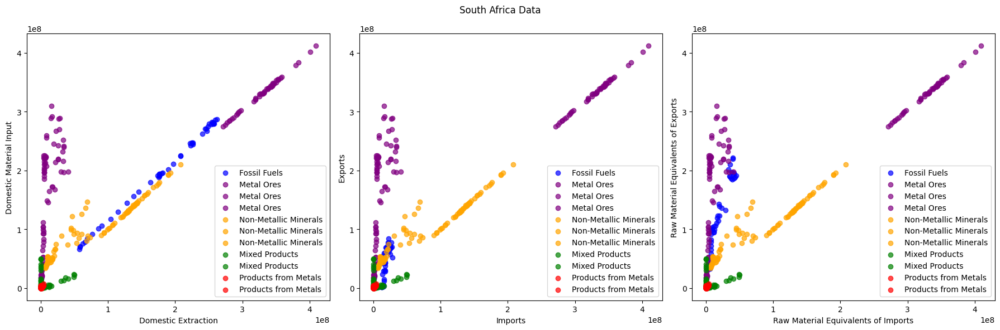

In [92]:
import matplotlib.pyplot as plt

# Fossil_data
sou_domestic_ext_fossil = southafrica_fossil_df['Domestic Extraction']
sou_domestic_input_fossil = southafrica_fossil_df['Domestic Material Input']
sou_imports_fossil = southafrica_fossil_df['Imports']
sou_exports_fossil = southafrica_fossil_df['Exports']
sou_raw_imports_fossil = southafrica_fossil_df['Raw Material Equivalents of imports']
sou_raw_exports_fossil = southafrica_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
sou_domestic_ext_metalore = southafrica_metalore_df['Domestic Extraction']
sou_domestic_input_metalore = southafrica_metalore_df['Domestic Material Input']
sou_imports_metalore = southafrica_metalore_df['Imports']
sou_exports_metalore = southafrica_metalore_df['Exports']
sou_raw_imports_metalore = southafrica_metalore_df['Raw Material Equivalents of imports']
sou_raw_exports_metalore = southafrica_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
sou_domestic_ext_nmm = southafrica_nmm_df['Domestic Extraction']
sou_domestic_input_nmm = southafrica_nmm_df['Domestic Material Input']
sou_imports_nmm = southafrica_nmm_df['Imports']
sou_exports_nmm = southafrica_nmm_df['Exports']
sou_raw_imports_nmm = southafrica_nmm_df['Raw Material Equivalents of imports']
sou_raw_exports_nmm = southafrica_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
sou_domestic_ext_mp = southafrica_mp_df['Domestic Extraction']
sou_domestic_input_mp = southafrica_mp_df['Domestic Material Input']
sou_imports_mp = southafrica_mp_df['Imports']
sou_exports_mp = southafrica_mp_df['Exports']

# Products from metals
sou_domestic_ext_pfm = southafrica_pfm_df['Domestic Extraction']
sou_domestic_input_pfm = southafrica_pfm_df['Domestic Material Input']
sou_imports_pfm = southafrica_pfm_df['Imports']
sou_exports_pfm = southafrica_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('South Africa Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], sou_domestic_ext_fossil, sou_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], sou_imports_fossil, sou_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], sou_raw_imports_fossil, sou_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (sou_domestic_ext_metalore, sou_domestic_input_metalore, 'purple', 'Metal Ores'),
    (sou_imports_metalore, sou_exports_metalore, 'purple', 'Metal Ores'),
    (sou_raw_imports_metalore, sou_raw_exports_metalore, 'purple', 'Metal Ores'),

    (sou_domestic_ext_nmm, sou_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (sou_imports_nmm, sou_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (sou_raw_imports_nmm, sou_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (sou_domestic_ext_mp, sou_domestic_input_mp, 'green', 'Mixed Products'),
    (sou_imports_mp, sou_exports_mp, 'green', 'Mixed Products'),

    (sou_domestic_ext_pfm, sou_domestic_input_pfm, 'red', 'Products from Metals'),
    (sou_imports_pfm, sou_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, souor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, souor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, souor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, souor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **38. South korea:**

In [93]:
southkorea_fossil_df = category_dataframes_by_country['South Korea']['Fossil fuels']
southkorea_metalore_df = category_dataframes_by_country['South Korea']['Metal ores']
southkorea_nmm_df = category_dataframes_by_country['South Korea']['Non-metallic minerals']
southkorea_mp_df = category_dataframes_by_country['South Korea']['Mixed and complex products nec.']
southkorea_pfm_df = category_dataframes_by_country['South Korea']['Products from metals']

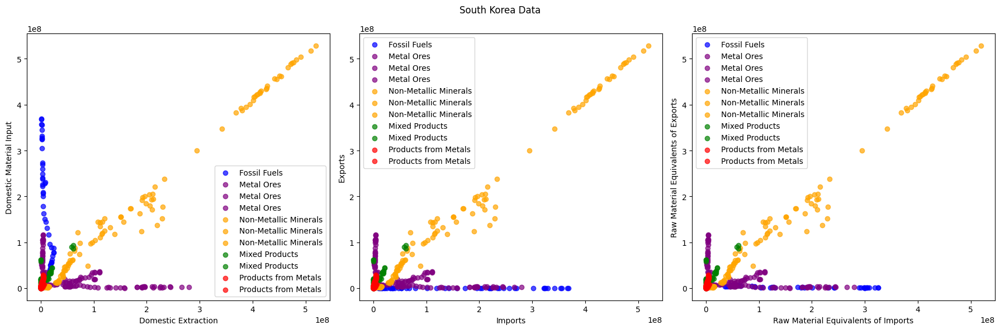

In [94]:
import matplotlib.pyplot as plt

# Fossil_data
souk_domestic_ext_fossil = southkorea_fossil_df['Domestic Extraction']
souk_domestic_input_fossil = southkorea_fossil_df['Domestic Material Input']
souk_imports_fossil = southkorea_fossil_df['Imports']
souk_exports_fossil = southkorea_fossil_df['Exports']
souk_raw_imports_fossil = southkorea_fossil_df['Raw Material Equivalents of imports']
souk_raw_exports_fossil = southkorea_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
souk_domestic_ext_metalore = southkorea_metalore_df['Domestic Extraction']
souk_domestic_input_metalore = southkorea_metalore_df['Domestic Material Input']
souk_imports_metalore = southkorea_metalore_df['Imports']
souk_exports_metalore = southkorea_metalore_df['Exports']
souk_raw_imports_metalore = southkorea_metalore_df['Raw Material Equivalents of imports']
souk_raw_exports_metalore = southkorea_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
souk_domestic_ext_nmm = southkorea_nmm_df['Domestic Extraction']
souk_domestic_input_nmm = southkorea_nmm_df['Domestic Material Input']
souk_imports_nmm = southkorea_nmm_df['Imports']
souk_exports_nmm = southkorea_nmm_df['Exports']
souk_raw_imports_nmm = southkorea_nmm_df['Raw Material Equivalents of imports']
souk_raw_exports_nmm = southkorea_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
souk_domestic_ext_mp = southkorea_mp_df['Domestic Extraction']
souk_domestic_input_mp = southkorea_mp_df['Domestic Material Input']
souk_imports_mp = southkorea_mp_df['Imports']
souk_exports_mp = southkorea_mp_df['Exports']

# Products from metals
souk_domestic_ext_pfm = southkorea_pfm_df['Domestic Extraction']
souk_domestic_input_pfm = southkorea_pfm_df['Domestic Material Input']
souk_imports_pfm = southkorea_pfm_df['Imports']
souk_exports_pfm = southkorea_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('South Korea Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], souk_domestic_ext_fossil, souk_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], souk_imports_fossil, souk_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], souk_raw_imports_fossil, souk_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (souk_domestic_ext_metalore, souk_domestic_input_metalore, 'purple', 'Metal Ores'),
    (souk_imports_metalore, souk_exports_metalore, 'purple', 'Metal Ores'),
    (souk_raw_imports_metalore, souk_raw_exports_metalore, 'purple', 'Metal Ores'),

    (souk_domestic_ext_nmm, souk_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (souk_imports_nmm, souk_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (souk_raw_imports_nmm, souk_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (souk_domestic_ext_mp, souk_domestic_input_mp, 'green', 'Mixed Products'),
    (souk_imports_mp, souk_exports_mp, 'green', 'Mixed Products'),

    (souk_domestic_ext_pfm, souk_domestic_input_pfm, 'red', 'Products from Metals'),
    (souk_imports_pfm, souk_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, soukor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, soukor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, soukor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, soukor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **39. Spain:**

In [95]:
spain_fossil_df = category_dataframes_by_country['Spain']['Fossil fuels']
spain_metalore_df = category_dataframes_by_country['Spain']['Metal ores']
spain_nmm_df = category_dataframes_by_country['Spain']['Non-metallic minerals']
spain_mp_df = category_dataframes_by_country['Spain']['Mixed and complex products nec.']
spain_pfm_df = category_dataframes_by_country['Spain']['Products from metals']

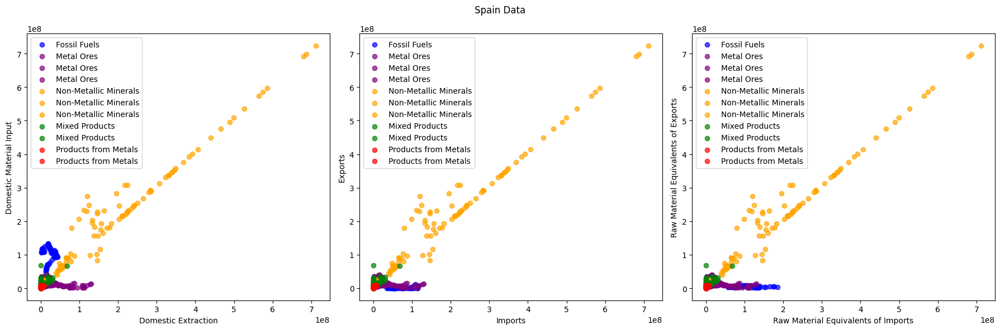

In [96]:
import matplotlib.pyplot as plt

# Fossil_data
spa_domestic_ext_fossil = spain_fossil_df['Domestic Extraction']
spa_domestic_input_fossil = spain_fossil_df['Domestic Material Input']
spa_imports_fossil = spain_fossil_df['Imports']
spa_exports_fossil = spain_fossil_df['Exports']
spa_raw_imports_fossil = spain_fossil_df['Raw Material Equivalents of imports']
spa_raw_exports_fossil = spain_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
spa_domestic_ext_metalore = spain_metalore_df['Domestic Extraction']
spa_domestic_input_metalore = spain_metalore_df['Domestic Material Input']
spa_imports_metalore = spain_metalore_df['Imports']
spa_exports_metalore = spain_metalore_df['Exports']
spa_raw_imports_metalore = spain_metalore_df['Raw Material Equivalents of imports']
spa_raw_exports_metalore = spain_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
spa_domestic_ext_nmm = spain_nmm_df['Domestic Extraction']
spa_domestic_input_nmm = spain_nmm_df['Domestic Material Input']
spa_imports_nmm = spain_nmm_df['Imports']
spa_exports_nmm = spain_nmm_df['Exports']
spa_raw_imports_nmm = spain_nmm_df['Raw Material Equivalents of imports']
spa_raw_exports_nmm = spain_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
spa_domestic_ext_mp = spain_mp_df['Domestic Extraction']
spa_domestic_input_mp = spain_mp_df['Domestic Material Input']
spa_imports_mp = spain_mp_df['Imports']
spa_exports_mp = spain_mp_df['Exports']

# Products from metals
spa_domestic_ext_pfm = spain_pfm_df['Domestic Extraction']
spa_domestic_input_pfm = spain_pfm_df['Domestic Material Input']
spa_imports_pfm = spain_pfm_df['Imports']
spa_exports_pfm = spain_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Spain Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], spa_domestic_ext_fossil, spa_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], spa_imports_fossil, spa_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], spa_raw_imports_fossil, spa_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (spa_domestic_ext_metalore, spa_domestic_input_metalore, 'purple', 'Metal Ores'),
    (spa_imports_metalore, spa_exports_metalore, 'purple', 'Metal Ores'),
    (spa_raw_imports_metalore, spa_raw_exports_metalore, 'purple', 'Metal Ores'),

    (spa_domestic_ext_nmm, spa_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (spa_imports_nmm, spa_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (spa_raw_imports_nmm, spa_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (spa_domestic_ext_mp, spa_domestic_input_mp, 'green', 'Mixed Products'),
    (spa_imports_mp, spa_exports_mp, 'green', 'Mixed Products'),

    (spa_domestic_ext_pfm, spa_domestic_input_pfm, 'red', 'Products from Metals'),
    (spa_imports_pfm, spa_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, spaor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, spaor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, spaor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, spaor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **40. Sweden:**

In [97]:
sweden_fossil_df = category_dataframes_by_country['Sweden']['Fossil fuels']
sweden_metalore_df = category_dataframes_by_country['Sweden']['Metal ores']
sweden_nmm_df = category_dataframes_by_country['Sweden']['Non-metallic minerals']
sweden_mp_df = category_dataframes_by_country['Sweden']['Mixed and complex products nec.']
sweden_pfm_df = category_dataframes_by_country['Sweden']['Products from metals']

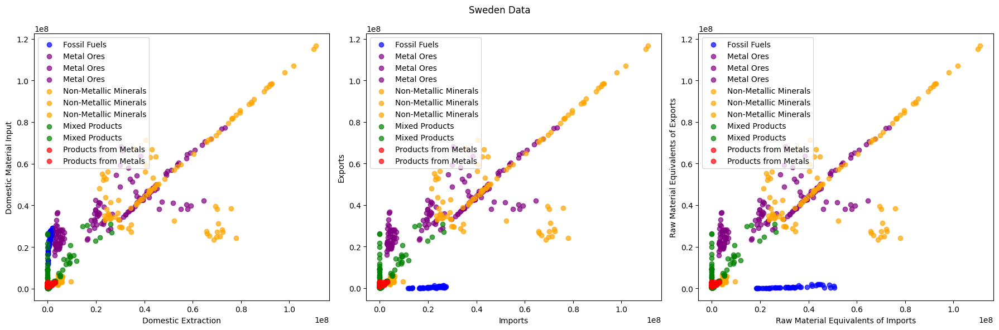

In [98]:
import matplotlib.pyplot as plt

# Fossil_data
swe_domestic_ext_fossil = sweden_fossil_df['Domestic Extraction']
swe_domestic_input_fossil = sweden_fossil_df['Domestic Material Input']
swe_imports_fossil = sweden_fossil_df['Imports']
swe_exports_fossil = sweden_fossil_df['Exports']
swe_raw_imports_fossil = sweden_fossil_df['Raw Material Equivalents of imports']
swe_raw_exports_fossil = sweden_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
swe_domestic_ext_metalore = sweden_metalore_df['Domestic Extraction']
swe_domestic_input_metalore = sweden_metalore_df['Domestic Material Input']
swe_imports_metalore = sweden_metalore_df['Imports']
swe_exports_metalore = sweden_metalore_df['Exports']
swe_raw_imports_metalore = sweden_metalore_df['Raw Material Equivalents of imports']
swe_raw_exports_metalore = sweden_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
swe_domestic_ext_nmm = sweden_nmm_df['Domestic Extraction']
swe_domestic_input_nmm = sweden_nmm_df['Domestic Material Input']
swe_imports_nmm = sweden_nmm_df['Imports']
swe_exports_nmm = sweden_nmm_df['Exports']
swe_raw_imports_nmm = sweden_nmm_df['Raw Material Equivalents of imports']
swe_raw_exports_nmm = sweden_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
swe_domestic_ext_mp = sweden_mp_df['Domestic Extraction']
swe_domestic_input_mp = sweden_mp_df['Domestic Material Input']
swe_imports_mp = sweden_mp_df['Imports']
swe_exports_mp = sweden_mp_df['Exports']

# Products from metals
swe_domestic_ext_pfm = sweden_pfm_df['Domestic Extraction']
swe_domestic_input_pfm = sweden_pfm_df['Domestic Material Input']
swe_imports_pfm = sweden_pfm_df['Imports']
swe_exports_pfm = sweden_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Sweden Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], swe_domestic_ext_fossil, swe_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], swe_imports_fossil, swe_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], swe_raw_imports_fossil, swe_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (swe_domestic_ext_metalore, swe_domestic_input_metalore, 'purple', 'Metal Ores'),
    (swe_imports_metalore, swe_exports_metalore, 'purple', 'Metal Ores'),
    (swe_raw_imports_metalore, swe_raw_exports_metalore, 'purple', 'Metal Ores'),

    (swe_domestic_ext_nmm, swe_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (swe_imports_nmm, swe_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (swe_raw_imports_nmm, swe_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (swe_domestic_ext_mp, swe_domestic_input_mp, 'green', 'Mixed Products'),
    (swe_imports_mp, swe_exports_mp, 'green', 'Mixed Products'),

    (swe_domestic_ext_pfm, swe_domestic_input_pfm, 'red', 'Products from Metals'),
    (swe_imports_pfm, swe_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, sweor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, sweor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, sweor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, sweor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**41. Switzerland:**

In [99]:
switzerland_fossil_df = category_dataframes_by_country['Switzerland']['Fossil fuels']
switzerland_metalore_df = category_dataframes_by_country['Switzerland']['Metal ores']
switzerland_nmm_df = category_dataframes_by_country['Switzerland']['Non-metallic minerals']
switzerland_mp_df = category_dataframes_by_country['Switzerland']['Mixed and complex products nec.']
switzerland_pfm_df = category_dataframes_by_country['Switzerland']['Products from metals']

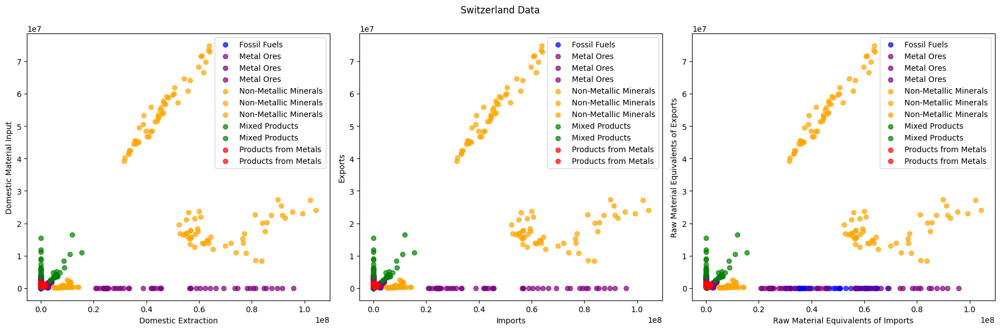

In [100]:
import matplotlib.pyplot as plt

# Fossil_data
swi_domestic_ext_fossil = switzerland_fossil_df['Domestic Extraction']
swi_domestic_input_fossil = switzerland_fossil_df['Domestic Material Input']
swi_imports_fossil = switzerland_fossil_df['Imports']
swi_exports_fossil = switzerland_fossil_df['Exports']
swi_raw_imports_fossil = switzerland_fossil_df['Raw Material Equivalents of imports']
swi_raw_exports_fossil = switzerland_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
swi_domestic_ext_metalore = switzerland_metalore_df['Domestic Extraction']
swi_domestic_input_metalore = switzerland_metalore_df['Domestic Material Input']
swi_imports_metalore = switzerland_metalore_df['Imports']
swi_exports_metalore = switzerland_metalore_df['Exports']
swi_raw_imports_metalore = switzerland_metalore_df['Raw Material Equivalents of imports']
swi_raw_exports_metalore = switzerland_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
swi_domestic_ext_nmm = switzerland_nmm_df['Domestic Extraction']
swi_domestic_input_nmm = switzerland_nmm_df['Domestic Material Input']
swi_imports_nmm = switzerland_nmm_df['Imports']
swi_exports_nmm = switzerland_nmm_df['Exports']
swi_raw_imports_nmm = switzerland_nmm_df['Raw Material Equivalents of imports']
swi_raw_exports_nmm = switzerland_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
swi_domestic_ext_mp = switzerland_mp_df['Domestic Extraction']
swi_domestic_input_mp = switzerland_mp_df['Domestic Material Input']
swi_imports_mp = switzerland_mp_df['Imports']
swi_exports_mp = switzerland_mp_df['Exports']

# Products from metals
swi_domestic_ext_pfm = switzerland_pfm_df['Domestic Extraction']
swi_domestic_input_pfm = switzerland_pfm_df['Domestic Material Input']
swi_imports_pfm = switzerland_pfm_df['Imports']
swi_exports_pfm = switzerland_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Switzerland Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], swi_domestic_ext_fossil, swi_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], swi_imports_fossil, swi_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], swi_raw_imports_fossil, swi_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (swi_domestic_ext_metalore, swi_domestic_input_metalore, 'purple', 'Metal Ores'),
    (swi_imports_metalore, swi_exports_metalore, 'purple', 'Metal Ores'),
    (swi_raw_imports_metalore, swi_raw_exports_metalore, 'purple', 'Metal Ores'),

    (swi_domestic_ext_nmm, swi_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (swi_imports_nmm, swi_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (swi_raw_imports_nmm, swi_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (swi_domestic_ext_mp, swi_domestic_input_mp, 'green', 'Mixed Products'),
    (swi_imports_mp, swi_exports_mp, 'green', 'Mixed Products'),

    (swi_domestic_ext_pfm, swi_domestic_input_pfm, 'red', 'Products from Metals'),
    (swi_imports_pfm, swi_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, swior, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, swior, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, swior, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, swior, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **42. Taiwan:**

In [101]:
taiwan_fossil_df = category_dataframes_by_country['Taiwan']['Fossil fuels']
taiwan_metalore_df = category_dataframes_by_country['Taiwan']['Metal ores']
taiwan_nmm_df = category_dataframes_by_country['Taiwan']['Non-metallic minerals']
taiwan_mp_df = category_dataframes_by_country['Taiwan']['Mixed and complex products nec.']
taiwan_pfm_df = category_dataframes_by_country['Taiwan']['Products from metals']

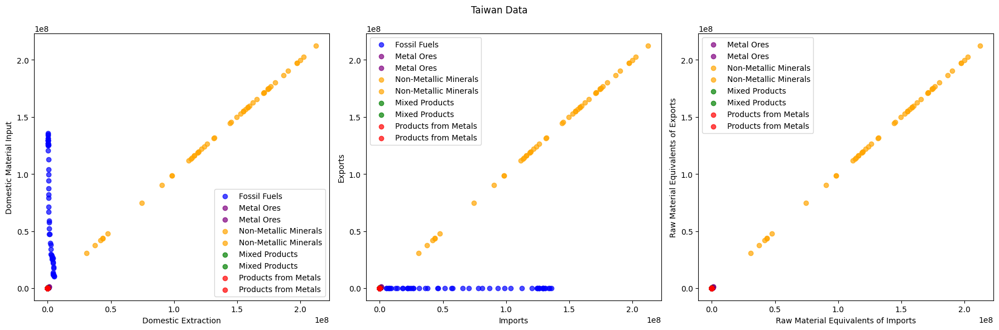

In [102]:
import matplotlib.pyplot as plt

# Fossil_data
tai_domestic_ext_fossil = taiwan_fossil_df['Domestic Extraction']
tai_domestic_input_fossil = taiwan_fossil_df['Domestic Material Input']
tai_imports_fossil = taiwan_fossil_df['Imports']
tai_exports_fossil = taiwan_fossil_df['Exports']

# Metal Ores
tai_domestic_ext_metalore = taiwan_metalore_df['Domestic Extraction']
tai_domestic_input_metalore = taiwan_metalore_df['Domestic Material Input']
tai_imports_metalore = taiwan_metalore_df['Imports']
tai_exports_metalore = taiwan_metalore_df['Exports']

# Non-Metallic Minerals
tai_domestic_ext_nmm = taiwan_nmm_df['Domestic Extraction']
tai_domestic_input_nmm = taiwan_nmm_df['Domestic Material Input']
tai_imports_nmm = taiwan_nmm_df['Imports']
tai_exports_nmm = taiwan_nmm_df['Exports']

# Mixed Products
tai_domestic_ext_mp = taiwan_mp_df['Domestic Extraction']
tai_domestic_input_mp = taiwan_mp_df['Domestic Material Input']
tai_imports_mp = taiwan_mp_df['Imports']
tai_exports_mp = taiwan_mp_df['Exports']

# Products from metals
tai_domestic_ext_pfm = taiwan_pfm_df['Domestic Extraction']
tai_domestic_input_pfm = taiwan_pfm_df['Domestic Material Input']
tai_imports_pfm = taiwan_pfm_df['Imports']
tai_exports_pfm = taiwan_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Taiwan Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], tai_domestic_ext_fossil, tai_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], tai_imports_fossil, tai_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (tai_domestic_ext_metalore, tai_domestic_input_metalore, 'purple', 'Metal Ores'),
    (tai_imports_metalore, tai_exports_metalore, 'purple', 'Metal Ores'),

    (tai_domestic_ext_nmm, tai_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (tai_imports_nmm, tai_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (tai_domestic_ext_mp, tai_domestic_input_mp, 'green', 'Mixed Products'),
    (tai_imports_mp, tai_exports_mp, 'green', 'Mixed Products'),

    (tai_domestic_ext_pfm, tai_domestic_input_pfm, 'red', 'Products from Metals'),
    (tai_imports_pfm, tai_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, taior, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, taior, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, taior, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, taior, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **43. Thailand:**

In [103]:
thailand_fossil_df = category_dataframes_by_country['Thailand']['Fossil fuels']
thailand_metalore_df = category_dataframes_by_country['Thailand']['Metal ores']
thailand_nmm_df = category_dataframes_by_country['Thailand']['Non-metallic minerals']
thailand_mp_df = category_dataframes_by_country['Thailand']['Mixed and complex products nec.']
thailand_pfm_df = category_dataframes_by_country['Thailand']['Products from metals']

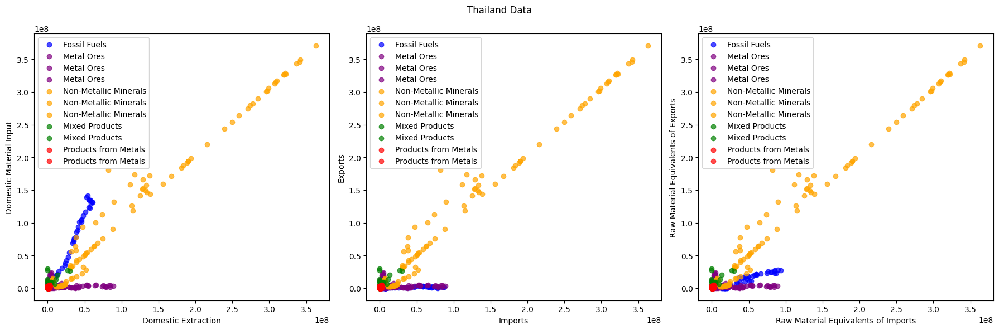

In [104]:
import matplotlib.pyplot as plt

# Fossil_data
thai_domestic_ext_fossil = thailand_fossil_df['Domestic Extraction']
thai_domestic_input_fossil = thailand_fossil_df['Domestic Material Input']
thai_imports_fossil = thailand_fossil_df['Imports']
thai_exports_fossil = thailand_fossil_df['Exports']
thai_raw_imports_fossil = thailand_fossil_df['Raw Material Equivalents of imports']
thai_raw_exports_fossil = thailand_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
thai_domestic_ext_metalore = thailand_metalore_df['Domestic Extraction']
thai_domestic_input_metalore = thailand_metalore_df['Domestic Material Input']
thai_imports_metalore = thailand_metalore_df['Imports']
thai_exports_metalore = thailand_metalore_df['Exports']
thai_raw_imports_metalore = thailand_metalore_df['Raw Material Equivalents of imports']
thai_raw_exports_metalore = thailand_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
thai_domestic_ext_nmm = thailand_nmm_df['Domestic Extraction']
thai_domestic_input_nmm = thailand_nmm_df['Domestic Material Input']
thai_imports_nmm = thailand_nmm_df['Imports']
thai_exports_nmm = thailand_nmm_df['Exports']
thai_raw_imports_nmm = thailand_nmm_df['Raw Material Equivalents of imports']
thai_raw_exports_nmm = thailand_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
thai_domestic_ext_mp = thailand_mp_df['Domestic Extraction']
thai_domestic_input_mp = thailand_mp_df['Domestic Material Input']
thai_imports_mp = thailand_mp_df['Imports']
thai_exports_mp = thailand_mp_df['Exports']

# Products from metals
thai_domestic_ext_pfm = thailand_pfm_df['Domestic Extraction']
thai_domestic_input_pfm = thailand_pfm_df['Domestic Material Input']
thai_imports_pfm = thailand_pfm_df['Imports']
thai_exports_pfm = thailand_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Thailand Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], thai_domestic_ext_fossil, thai_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], thai_imports_fossil, thai_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], thai_raw_imports_fossil, thai_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (thai_domestic_ext_metalore, thai_domestic_input_metalore, 'purple', 'Metal Ores'),
    (thai_imports_metalore, thai_exports_metalore, 'purple', 'Metal Ores'),
    (thai_raw_imports_metalore, thai_raw_exports_metalore, 'purple', 'Metal Ores'),

    (thai_domestic_ext_nmm, thai_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (thai_imports_nmm, thai_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (thai_raw_imports_nmm, thai_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (thai_domestic_ext_mp, thai_domestic_input_mp, 'green', 'Mixed Products'),
    (thai_imports_mp, thai_exports_mp, 'green', 'Mixed Products'),

    (thai_domestic_ext_pfm, thai_domestic_input_pfm, 'red', 'Products from Metals'),
    (thai_imports_pfm, thai_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, thaior, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, thaior, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, thaior, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, thaior, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **44. Turkey:**

In [105]:
turkey_fossil_df = category_dataframes_by_country['Turkey']['Fossil fuels']
turkey_metalore_df = category_dataframes_by_country['Turkey']['Metal ores']
turkey_nmm_df = category_dataframes_by_country['Turkey']['Non-metallic minerals']
turkey_mp_df = category_dataframes_by_country['Turkey']['Mixed and complex products nec.']
turkey_pfm_df = category_dataframes_by_country['Turkey']['Products from metals']

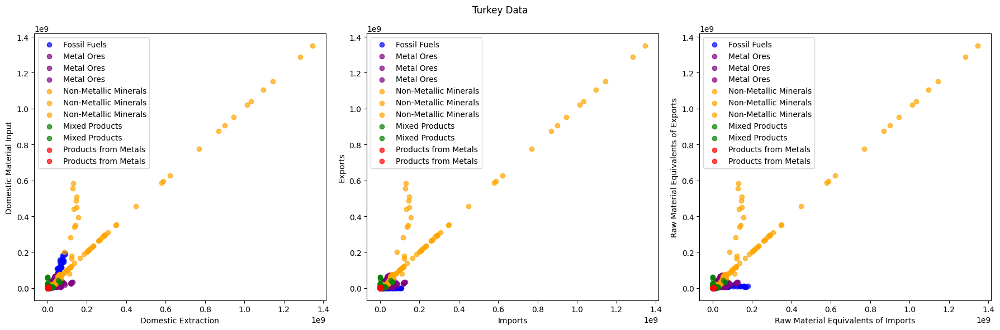

In [106]:
import matplotlib.pyplot as plt

# Fossil_data
tur_domestic_ext_fossil = turkey_fossil_df['Domestic Extraction']
tur_domestic_input_fossil = turkey_fossil_df['Domestic Material Input']
tur_imports_fossil = turkey_fossil_df['Imports']
tur_exports_fossil = turkey_fossil_df['Exports']
tur_raw_imports_fossil = turkey_fossil_df['Raw Material Equivalents of imports']
tur_raw_exports_fossil = turkey_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
tur_domestic_ext_metalore = turkey_metalore_df['Domestic Extraction']
tur_domestic_input_metalore = turkey_metalore_df['Domestic Material Input']
tur_imports_metalore = turkey_metalore_df['Imports']
tur_exports_metalore = turkey_metalore_df['Exports']
tur_raw_imports_metalore = turkey_metalore_df['Raw Material Equivalents of imports']
tur_raw_exports_metalore = turkey_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
tur_domestic_ext_nmm = turkey_nmm_df['Domestic Extraction']
tur_domestic_input_nmm = turkey_nmm_df['Domestic Material Input']
tur_imports_nmm = turkey_nmm_df['Imports']
tur_exports_nmm = turkey_nmm_df['Exports']
tur_raw_imports_nmm = turkey_nmm_df['Raw Material Equivalents of imports']
tur_raw_exports_nmm = turkey_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
tur_domestic_ext_mp = turkey_mp_df['Domestic Extraction']
tur_domestic_input_mp = turkey_mp_df['Domestic Material Input']
tur_imports_mp = turkey_mp_df['Imports']
tur_exports_mp = turkey_mp_df['Exports']

# Products from metals
tur_domestic_ext_pfm = turkey_pfm_df['Domestic Extraction']
tur_domestic_input_pfm = turkey_pfm_df['Domestic Material Input']
tur_imports_pfm = turkey_pfm_df['Imports']
tur_exports_pfm = turkey_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Turkey Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], tur_domestic_ext_fossil, tur_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], tur_imports_fossil, tur_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], tur_raw_imports_fossil, tur_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (tur_domestic_ext_metalore, tur_domestic_input_metalore, 'purple', 'Metal Ores'),
    (tur_imports_metalore, tur_exports_metalore, 'purple', 'Metal Ores'),
    (tur_raw_imports_metalore, tur_raw_exports_metalore, 'purple', 'Metal Ores'),

    (tur_domestic_ext_nmm, tur_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (tur_imports_nmm, tur_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (tur_raw_imports_nmm, tur_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (tur_domestic_ext_mp, tur_domestic_input_mp, 'green', 'Mixed Products'),
    (tur_imports_mp, tur_exports_mp, 'green', 'Mixed Products'),

    (tur_domestic_ext_pfm, tur_domestic_input_pfm, 'red', 'Products from Metals'),
    (tur_imports_pfm, tur_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, turor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, turor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, turor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, turor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **45. United Arab Emirates:**

In [107]:
unitedarabemirates_fossil_df = category_dataframes_by_country['United Arab Emirates']['Fossil fuels']
unitedarabemirates_metalore_df = category_dataframes_by_country['United Arab Emirates']['Metal ores']
unitedarabemirates_nmm_df = category_dataframes_by_country['United Arab Emirates']['Non-metallic minerals']
unitedarabemirates_mp_df = category_dataframes_by_country['United Arab Emirates']['Mixed and complex products nec.']
unitedarabemirates_pfm_df = category_dataframes_by_country['United Arab Emirates']['Products from metals']

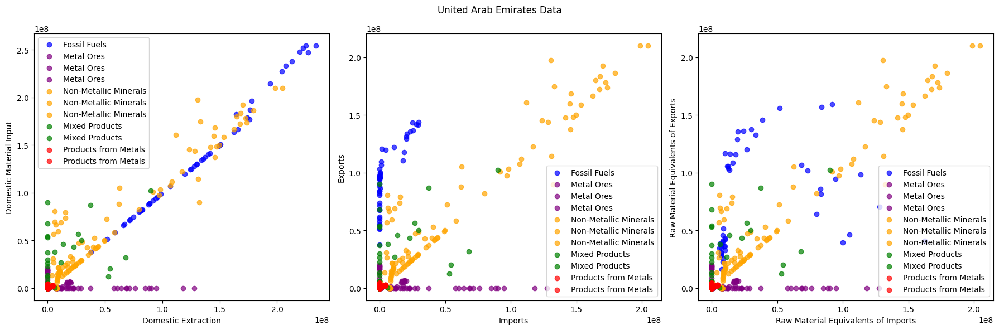

In [108]:
import matplotlib.pyplot as plt

# Fossil_data
uae_domestic_ext_fossil = unitedarabemirates_fossil_df['Domestic Extraction']
uae_domestic_input_fossil = unitedarabemirates_fossil_df['Domestic Material Input']
uae_imports_fossil = unitedarabemirates_fossil_df['Imports']
uae_exports_fossil = unitedarabemirates_fossil_df['Exports']
uae_raw_imports_fossil = unitedarabemirates_fossil_df['Raw Material Equivalents of imports']
uae_raw_exports_fossil = unitedarabemirates_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
uae_domestic_ext_metalore = unitedarabemirates_metalore_df['Domestic Extraction']
uae_domestic_input_metalore = unitedarabemirates_metalore_df['Domestic Material Input']
uae_imports_metalore = unitedarabemirates_metalore_df['Imports']
uae_exports_metalore = unitedarabemirates_metalore_df['Exports']
uae_raw_imports_metalore = unitedarabemirates_metalore_df['Raw Material Equivalents of imports']
uae_raw_exports_metalore = unitedarabemirates_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
uae_domestic_ext_nmm = unitedarabemirates_nmm_df['Domestic Extraction']
uae_domestic_input_nmm = unitedarabemirates_nmm_df['Domestic Material Input']
uae_imports_nmm = unitedarabemirates_nmm_df['Imports']
uae_exports_nmm = unitedarabemirates_nmm_df['Exports']
uae_raw_imports_nmm = unitedarabemirates_nmm_df['Raw Material Equivalents of imports']
uae_raw_exports_nmm = unitedarabemirates_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
uae_domestic_ext_mp = unitedarabemirates_mp_df['Domestic Extraction']
uae_domestic_input_mp = unitedarabemirates_mp_df['Domestic Material Input']
uae_imports_mp = unitedarabemirates_mp_df['Imports']
uae_exports_mp = unitedarabemirates_mp_df['Exports']

# Products from metals
uae_domestic_ext_pfm = unitedarabemirates_pfm_df['Domestic Extraction']
uae_domestic_input_pfm = unitedarabemirates_pfm_df['Domestic Material Input']
uae_imports_pfm = unitedarabemirates_pfm_df['Imports']
uae_exports_pfm = unitedarabemirates_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('United Arab Emirates Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], uae_domestic_ext_fossil, uae_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], uae_imports_fossil, uae_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], uae_raw_imports_fossil, uae_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (uae_domestic_ext_metalore, uae_domestic_input_metalore, 'purple', 'Metal Ores'),
    (uae_imports_metalore, uae_exports_metalore, 'purple', 'Metal Ores'),
    (uae_raw_imports_metalore, uae_raw_exports_metalore, 'purple', 'Metal Ores'),

    (uae_domestic_ext_nmm, uae_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (uae_imports_nmm, uae_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (uae_raw_imports_nmm, uae_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (uae_domestic_ext_mp, uae_domestic_input_mp, 'green', 'Mixed Products'),
    (uae_imports_mp, uae_exports_mp, 'green', 'Mixed Products'),

    (uae_domestic_ext_pfm, uae_domestic_input_pfm, 'red', 'Products from Metals'),
    (uae_imports_pfm, uae_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, uaeor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, uaeor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, uaeor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, uaeor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **46. United States Of America:**

In [109]:
unitedstates_fossil_df = category_dataframes_by_country['United States of America']['Fossil fuels']
unitedstates_metalore_df = category_dataframes_by_country['United States of America']['Metal ores']
unitedstates_nmm_df = category_dataframes_by_country['United States of America']['Non-metallic minerals']
unitedstates_mp_df = category_dataframes_by_country['United States of America']['Mixed and complex products nec.']
unitedstates_pfm_df = category_dataframes_by_country['United States of America']['Products from metals']

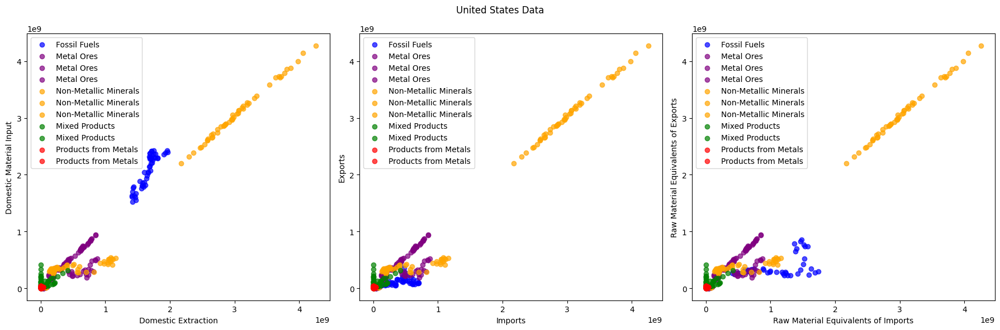

In [110]:
import matplotlib.pyplot as plt

# Fossil_data
usa_domestic_ext_fossil = unitedstates_fossil_df['Domestic Extraction']
usa_domestic_input_fossil = unitedstates_fossil_df['Domestic Material Input']
usa_imports_fossil = unitedstates_fossil_df['Imports']
usa_exports_fossil = unitedstates_fossil_df['Exports']
usa_raw_imports_fossil = unitedstates_fossil_df['Raw Material Equivalents of imports']
usa_raw_exports_fossil = unitedstates_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
usa_domestic_ext_metalore = unitedstates_metalore_df['Domestic Extraction']
usa_domestic_input_metalore = unitedstates_metalore_df['Domestic Material Input']
usa_imports_metalore = unitedstates_metalore_df['Imports']
usa_exports_metalore = unitedstates_metalore_df['Exports']
usa_raw_imports_metalore = unitedstates_metalore_df['Raw Material Equivalents of imports']
usa_raw_exports_metalore = unitedstates_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
usa_domestic_ext_nmm = unitedstates_nmm_df['Domestic Extraction']
usa_domestic_input_nmm = unitedstates_nmm_df['Domestic Material Input']
usa_imports_nmm = unitedstates_nmm_df['Imports']
usa_exports_nmm = unitedstates_nmm_df['Exports']
usa_raw_imports_nmm = unitedstates_nmm_df['Raw Material Equivalents of imports']
usa_raw_exports_nmm = unitedstates_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
usa_domestic_ext_mp = unitedstates_mp_df['Domestic Extraction']
usa_domestic_input_mp = unitedstates_mp_df['Domestic Material Input']
usa_imports_mp = unitedstates_mp_df['Imports']
usa_exports_mp = unitedstates_mp_df['Exports']

# Products from metals
usa_domestic_ext_pfm = unitedstates_pfm_df['Domestic Extraction']
usa_domestic_input_pfm = unitedstates_pfm_df['Domestic Material Input']
usa_imports_pfm = unitedstates_pfm_df['Imports']
usa_exports_pfm = unitedstates_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('United States Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], usa_domestic_ext_fossil, usa_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], usa_imports_fossil, usa_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], usa_raw_imports_fossil, usa_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (usa_domestic_ext_metalore, usa_domestic_input_metalore, 'purple', 'Metal Ores'),
    (usa_imports_metalore, usa_exports_metalore, 'purple', 'Metal Ores'),
    (usa_raw_imports_metalore, usa_raw_exports_metalore, 'purple', 'Metal Ores'),

    (usa_domestic_ext_nmm, usa_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (usa_imports_nmm, usa_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (usa_raw_imports_nmm, usa_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (usa_domestic_ext_mp, usa_domestic_input_mp, 'green', 'Mixed Products'),
    (usa_imports_mp, usa_exports_mp, 'green', 'Mixed Products'),

    (usa_domestic_ext_pfm, usa_domestic_input_pfm, 'red', 'Products from Metals'),
    (usa_imports_pfm, usa_exports_pfm, 'red', 'Products from Metals'),
    # No data available for Mixed Products in the provided example for raw imports and exports
]

for x, y, usaor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, usaor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, usaor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, usaor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **47. United Kingdom:**

In [111]:
unitedkingdom_fossil_df = category_dataframes_by_country['United Kingdom']['Fossil fuels']
unitedkingdom_metalore_df = category_dataframes_by_country['United Kingdom']['Metal ores']
unitedkingdom_nmm_df = category_dataframes_by_country['United Kingdom']['Non-metallic minerals']
unitedkingdom_mp_df = category_dataframes_by_country['United Kingdom']['Mixed and complex products nec.']
unitedkingdom_pfm_df = category_dataframes_by_country['United Kingdom']['Products from metals']

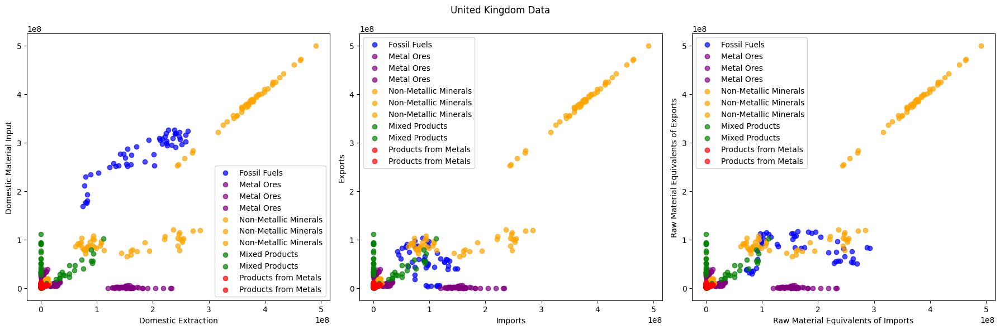

In [112]:
import matplotlib.pyplot as plt

# Fossil_data
uk_domestic_ext_fossil = unitedkingdom_fossil_df['Domestic Extraction']
uk_domestic_input_fossil = unitedkingdom_fossil_df['Domestic Material Input']
uk_imports_fossil = unitedkingdom_fossil_df['Imports']
uk_exports_fossil = unitedkingdom_fossil_df['Exports']
uk_raw_imports_fossil = unitedkingdom_fossil_df['Raw Material Equivalents of imports']
uk_raw_exports_fossil = unitedkingdom_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
uk_domestic_ext_metalore = unitedkingdom_metalore_df['Domestic Extraction']
uk_domestic_input_metalore = unitedkingdom_metalore_df['Domestic Material Input']
uk_imports_metalore = unitedkingdom_metalore_df['Imports']
uk_exports_metalore = unitedkingdom_metalore_df['Exports']
uk_raw_imports_metalore = unitedkingdom_metalore_df['Raw Material Equivalents of imports']
uk_raw_exports_metalore = unitedkingdom_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
uk_domestic_ext_nmm = unitedkingdom_nmm_df['Domestic Extraction']
uk_domestic_input_nmm = unitedkingdom_nmm_df['Domestic Material Input']
uk_imports_nmm = unitedkingdom_nmm_df['Imports']
uk_exports_nmm = unitedkingdom_nmm_df['Exports']
uk_raw_imports_nmm = unitedkingdom_nmm_df['Raw Material Equivalents of imports']
uk_raw_exports_nmm = unitedkingdom_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
uk_domestic_ext_mp = unitedkingdom_mp_df['Domestic Extraction']
uk_domestic_input_mp = unitedkingdom_mp_df['Domestic Material Input']
uk_imports_mp = unitedkingdom_mp_df['Imports']
uk_exports_mp = unitedkingdom_mp_df['Exports']

# Products from metals
uk_domestic_ext_pfm = unitedkingdom_pfm_df['Domestic Extraction']
uk_domestic_input_pfm = unitedkingdom_pfm_df['Domestic Material Input']
uk_imports_pfm = unitedkingdom_pfm_df['Imports']
uk_exports_pfm = unitedkingdom_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('United Kingdom Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], uk_domestic_ext_fossil, uk_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], uk_imports_fossil, uk_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], uk_raw_imports_fossil, uk_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (uk_domestic_ext_metalore, uk_domestic_input_metalore, 'purple', 'Metal Ores'),
    (uk_imports_metalore, uk_exports_metalore, 'purple', 'Metal Ores'),
    (uk_raw_imports_metalore, uk_raw_exports_metalore, 'purple', 'Metal Ores'),

    (uk_domestic_ext_nmm, uk_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (uk_imports_nmm, uk_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (uk_raw_imports_nmm, uk_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (uk_domestic_ext_mp, uk_domestic_input_mp, 'green', 'Mixed Products'),
    (uk_imports_mp, uk_exports_mp, 'green', 'Mixed Products'),

    (uk_domestic_ext_pfm, uk_domestic_input_pfm, 'red', 'Products from Metals'),
    (uk_imports_pfm, uk_exports_pfm, 'red', 'Products from Metals'),

]

for x, y, ukor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, ukor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, ukor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, ukor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

### **48. Venezuela:**

In [113]:
venezuela_fossil_df = category_dataframes_by_country['Venezuela']['Fossil fuels']
venezuela_metalore_df = category_dataframes_by_country['Venezuela']['Metal ores']
venezuela_nmm_df = category_dataframes_by_country['Venezuela']['Non-metallic minerals']
venezuela_mp_df = category_dataframes_by_country['Venezuela']['Mixed and complex products nec.']
venezuela_pfm_df = category_dataframes_by_country['Venezuela']['Products from metals']

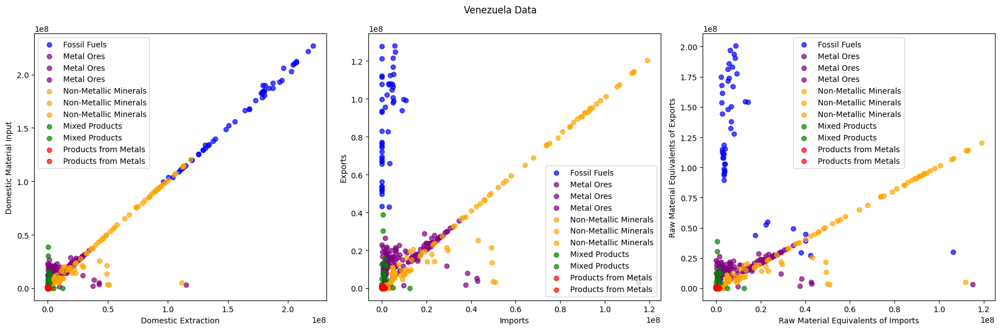

In [114]:
import matplotlib.pyplot as plt

# Fossil_data
ven_domestic_ext_fossil = venezuela_fossil_df['Domestic Extraction']
ven_domestic_input_fossil = venezuela_fossil_df['Domestic Material Input']
ven_imports_fossil = venezuela_fossil_df['Imports']
ven_exports_fossil = venezuela_fossil_df['Exports']
ven_raw_imports_fossil = venezuela_fossil_df['Raw Material Equivalents of imports']
ven_raw_exports_fossil = venezuela_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
ven_domestic_ext_metalore = venezuela_metalore_df['Domestic Extraction']
ven_domestic_input_metalore = venezuela_metalore_df['Domestic Material Input']
ven_imports_metalore = venezuela_metalore_df['Imports']
ven_exports_metalore = venezuela_metalore_df['Exports']
ven_raw_imports_metalore = venezuela_metalore_df['Raw Material Equivalents of imports']
ven_raw_exports_metalore = venezuela_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
ven_domestic_ext_nmm = venezuela_nmm_df['Domestic Extraction']
ven_domestic_input_nmm = venezuela_nmm_df['Domestic Material Input']
ven_imports_nmm = venezuela_nmm_df['Imports']
ven_exports_nmm = venezuela_nmm_df['Exports']
ven_raw_imports_nmm = venezuela_nmm_df['Raw Material Equivalents of imports']
ven_raw_exports_nmm = venezuela_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
ven_domestic_ext_mp = venezuela_mp_df['Domestic Extraction']
ven_domestic_input_mp = venezuela_mp_df['Domestic Material Input']
ven_imports_mp = venezuela_mp_df['Imports']
ven_exports_mp = venezuela_mp_df['Exports']

# Products from metals
ven_domestic_ext_pfm = venezuela_pfm_df['Domestic Extraction']
ven_domestic_input_pfm = venezuela_pfm_df['Domestic Material Input']
ven_imports_pfm = venezuela_pfm_df['Imports']
ven_exports_pfm = venezuela_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Venezuela Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], ven_domestic_ext_fossil, ven_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], ven_imports_fossil, ven_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], ven_raw_imports_fossil, ven_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (ven_domestic_ext_metalore, ven_domestic_input_metalore, 'purple', 'Metal Ores'),
    (ven_imports_metalore, ven_exports_metalore, 'purple', 'Metal Ores'),
    (ven_raw_imports_metalore, ven_raw_exports_metalore, 'purple', 'Metal Ores'),

    (ven_domestic_ext_nmm, ven_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (ven_imports_nmm, ven_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (ven_raw_imports_nmm, ven_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (ven_domestic_ext_mp, ven_domestic_input_mp, 'green', 'Mixed Products'),
    (ven_imports_mp, ven_exports_mp, 'green', 'Mixed Products'),

    (ven_domestic_ext_pfm, ven_domestic_input_pfm, 'red', 'Products from Metals'),
    (ven_imports_pfm, ven_exports_pfm, 'red', 'Products from Metals'),

]

for x, y, venor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, venor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, venor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, venor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

###**49. Russia:**

In [115]:
russia_fossil_df = category_dataframes_by_country['Russian Federation']['Fossil fuels']
russia_metalore_df = category_dataframes_by_country['Russian Federation']['Metal ores']
russia_nmm_df = category_dataframes_by_country['Russian Federation']['Non-metallic minerals']
russia_mp_df = category_dataframes_by_country['Russian Federation']['Mixed and complex products nec.']
russia_pfm_df = category_dataframes_by_country['Russian Federation']['Products from metals']

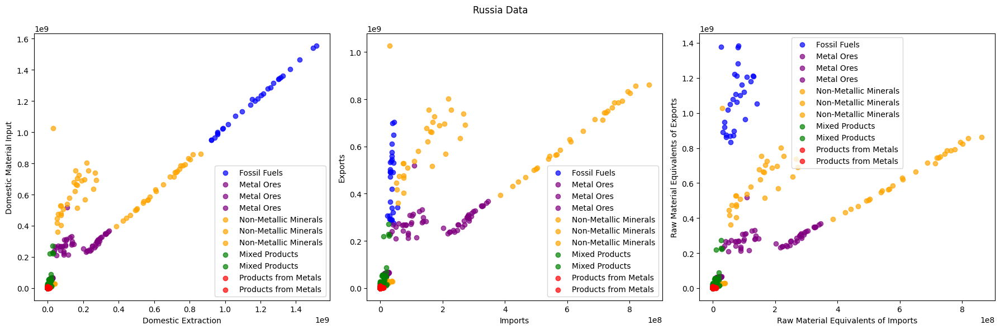

In [116]:
import matplotlib.pyplot as plt

# Fossil_data
rus_domestic_ext_fossil = russia_fossil_df['Domestic Extraction']
rus_domestic_input_fossil = russia_fossil_df['Domestic Material Input']
rus_imports_fossil = russia_fossil_df['Imports']
rus_exports_fossil = russia_fossil_df['Exports']
rus_raw_imports_fossil = russia_fossil_df['Raw Material Equivalents of imports']
rus_raw_exports_fossil = russia_fossil_df['Raw Material Equivalents of exports']

# Metal Ores
rus_domestic_ext_metalore = russia_metalore_df['Domestic Extraction']
rus_domestic_input_metalore = russia_metalore_df['Domestic Material Input']
rus_imports_metalore = russia_metalore_df['Imports']
rus_exports_metalore = russia_metalore_df['Exports']
rus_raw_imports_metalore = russia_metalore_df['Raw Material Equivalents of imports']
rus_raw_exports_metalore = russia_metalore_df['Raw Material Equivalents of exports']

# Non-Metallic Minerals
rus_domestic_ext_nmm = russia_nmm_df['Domestic Extraction']
rus_domestic_input_nmm = russia_nmm_df['Domestic Material Input']
rus_imports_nmm = russia_nmm_df['Imports']
rus_exports_nmm = russia_nmm_df['Exports']
rus_raw_imports_nmm = russia_nmm_df['Raw Material Equivalents of imports']
rus_raw_exports_nmm = russia_nmm_df['Raw Material Equivalents of exports']

# Mixed Products
rus_domestic_ext_mp = russia_mp_df['Domestic Extraction']
rus_domestic_input_mp = russia_mp_df['Domestic Material Input']
rus_imports_mp = russia_mp_df['Imports']
rus_exports_mp = russia_mp_df['Exports']

# Products from metals
rus_domestic_ext_pfm = russia_pfm_df['Domestic Extraction']
rus_domestic_input_pfm = russia_pfm_df['Domestic Material Input']
rus_imports_pfm = russia_pfm_df['Imports']
rus_exports_pfm = russia_pfm_df['Exports']

# Set up the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Russia Data')

# Function to plot scatter for each category
def plot_scatter(ax, x, y, color, label, x_label, y_label):
    ax.scatter(x, y, c=color, alpha=0.7, label=label)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend()

# Plot Domestic Extraction vs Domestic Material Input for Fossil Fuels
plot_scatter(axs[0], rus_domestic_ext_fossil, rus_domestic_input_fossil, 'blue', 'Fossil Fuels', 'Domestic Extraction', 'Domestic Material Input')

# Plot Imports vs Exports for Fossil Fuels
plot_scatter(axs[1], rus_imports_fossil, rus_exports_fossil, 'blue', 'Fossil Fuels', 'Imports', 'Exports')

# Plot Raw Material Equivalents of Imports vs Raw Material Equivalents of Exports for Fossil Fuels
plot_scatter(axs[2], rus_raw_imports_fossil, rus_raw_exports_fossil, 'blue', 'Fossil Fuels', 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

# Additional Plots for other categories
categories = ['Metal Ores', 'Non-Metallic Minerals', 'Mixed Products', 'Products from Metals']
variables = [
    (rus_domestic_ext_metalore, rus_domestic_input_metalore, 'purple', 'Metal Ores'),
    (rus_imports_metalore, rus_exports_metalore, 'purple', 'Metal Ores'),
    (rus_raw_imports_metalore, rus_raw_exports_metalore, 'purple', 'Metal Ores'),

    (rus_domestic_ext_nmm, rus_domestic_input_nmm, 'orange', 'Non-Metallic Minerals'),
    (rus_imports_nmm, rus_exports_nmm, 'orange', 'Non-Metallic Minerals'),
    (rus_raw_imports_nmm, rus_raw_exports_nmm, 'orange', 'Non-Metallic Minerals'),

    (rus_domestic_ext_mp, rus_domestic_input_mp, 'green', 'Mixed Products'),
    (rus_imports_mp, rus_exports_mp, 'green', 'Mixed Products'),

    (rus_domestic_ext_pfm, rus_domestic_input_pfm, 'red', 'Products from Metals'),
    (rus_imports_pfm, rus_exports_pfm, 'red', 'Products from Metals'),

]

for x, y, rusor, label in variables:
    if x is not None and y is not None:
        plot_scatter(axs[0], x, y, rusor, label, 'Domestic Extraction', 'Domestic Material Input')
        plot_scatter(axs[1], x, y, rusor, label, 'Imports', 'Exports')
        plot_scatter(axs[2], x, y, rusor, label, 'Raw Material Equivalents of Imports', 'Raw Material Equivalents of Exports')

plt.tight_layout()
plt.show()

##**Exploratory Data Analysis:**

### **1. How has the total volume of raw material imports and exports changed over the years?**

In [117]:
df.head()

,Country,Category,Flow name,Flow code,Flow unit,1970,1971,1972,1973,1974,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Afghanistan,Biomass,Domestic Extraction,DE,t,29427854.0,28777035.0,27200896.0,29147772.0,30519158.0,...,37198019.0,34018329.0,37907859.0,38097802.0,39503300.0,37422531.0,37951985.0,35170079.0,33170392.0,33681475.0
1,Afghanistan,Biomass,Domestic Material Consumption,DMC,t,29476560.0,29136965.0,27290656.0,29112673.0,30433539.0,...,39001193.0,36654160.0,39953630.0,40324678.0,42368850.0,40730273.0,41903737.0,40132740.0,38165210.0,37202637.0
2,Afghanistan,Biomass,Domestic Material Input,DMI,t,29617873.0,29282898.0,27485608.0,29306247.0,30656605.0,...,39268631.0,36835574.0,40086686.0,40559216.0,42629687.0,41019516.0,42335796.0,40630738.0,39090334.0,38217826.0
3,Afghanistan,Biomass,Exports,EXP,t,141313.0,145933.0,194952.0,193574.0,223066.0,...,267439.0,181414.0,133056.0,234537.0,260837.0,289244.0,432059.0,497998.0,925124.0,1015189.0
4,Afghanistan,Biomass,Imports,IMP,t,190019.0,505863.0,284712.0,158475.0,137447.0,...,2070612.0,2817245.0,2178827.0,2461414.0,3126387.0,3596985.0,4383811.0,5460660.0,5919941.0,4536351.0


In [118]:
df['Flow name'].unique()

array(['Domestic Extraction', 'Domestic Material Consumption',
       'Domestic Material Input', 'Exports', 'Imports',
       'Physical Trade Balance', 'Raw Material Consumption',
       'Raw Material Equivalents of exports',
       'Raw Material Equivalents of imports'], dtype=object)

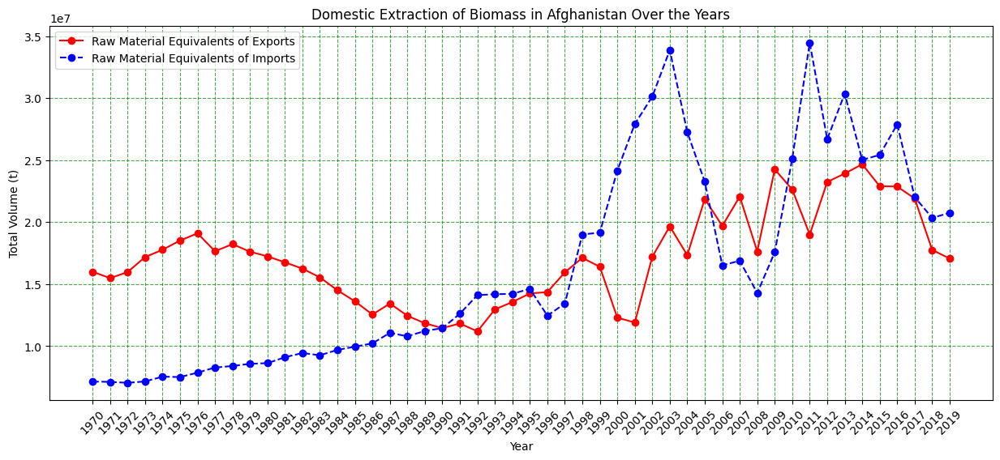

In [119]:
# Filter data for Afghanistan, Biomass, Domestic Extraction
overall_raw_exports = df[(df['Flow name'] == 'Raw Material Equivalents of exports')]
overall_raw_imports = df[(df['Flow name'] == 'Raw Material Equivalents of imports')]

# Extract relevant columns for plotting
years = df.columns[5:]
value1 = overall_raw_exports.iloc[0, 5:]
value2 = overall_raw_imports.iloc[0, 5:]

# Plotting
plt.figure(figsize=(15, 6))
plt.plot(years, value1, marker='o', linestyle='-', color='red', label='Raw Material Equivalents of Exports')
plt.plot(years, value2, marker='o', linestyle='--', color='blue', label='Raw Material Equivalents of Imports')
plt.title('Domestic Extraction of Biomass in Afghanistan Over the Years')
plt.xlabel('Year')
plt.ylabel('Total Volume (t)')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', color='green', alpha=0.7)
plt.legend()
plt.show()

It can be observed from the line graphs
1.   Global Imports Suddenly started increasing in period (1996-2003) and after the dip in peaked in 2011
2.   Global Exports observed overall steady flow in average range of 1.3 to 2.3 tons with peak volume of global export of 2.5 tons.



### **2. Which categories (e.g., Fossil fuels, Metal ores) dominate the global trade landscape?**

In [120]:
# List of flow names to include
selected_flows = ['Imports', 'Exports']

# Filter the DataFrame based on selected flows
category_trade_df = df[df['Flow name'].isin(selected_flows)]
category_trade_df = category_trade_df.drop(columns=['Country', 'Flow code', 'Flow unit'])

# Group the data by 'Category' and 'Flow name' and sum the values
grouped_df = category_trade_df.groupby(['Category', 'Flow name']).sum()

# Get the exact flow names from the DataFrame
actual_flows = list(grouped_df.index.levels[1])

# Create an empty DataFrame for global categories
global_categories = pd.DataFrame(index=grouped_df.index.levels[0], columns=actual_flows)

# Iterate over categories and flows to fill the global_categories DataFrame
for category in grouped_df.index.levels[0]:
    for flow in actual_flows:
        global_categories.loc[category, flow] = grouped_df.loc[category].loc[flow].sum()

# Extracting data for Imports and Exports
imports = grouped_df.xs('Imports', level='Flow name')
exports = grouped_df.xs('Exports', level='Flow name')

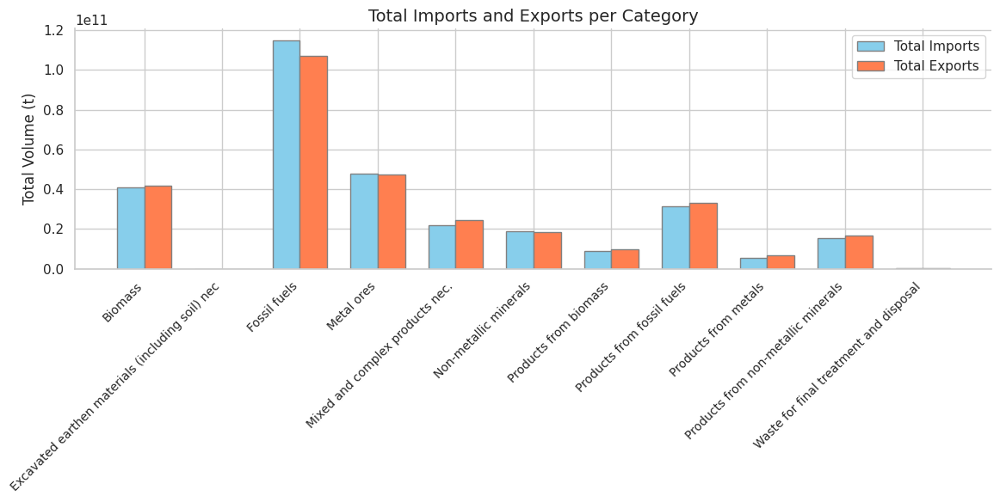

In [121]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Extracting data for Imports and Exports
imports = grouped_df.xs('Imports', level='Flow name')
exports = grouped_df.xs('Exports', level='Flow name')
# Summing values across all years
total_imports = imports.sum(axis=1)
total_exports = exports.sum(axis=1)

# Setting up Seaborn style
sns.set(style="whitegrid")
# Plotting
fig, ax = plt.subplots(figsize=(12, 6))
# Bar width for each category
bar_width = 0.35

# Positions of bars on X-axis
r1 = range(len(total_imports))
r2 = [x + bar_width for x in r1]
# Bar plots for Total Imports and Total Exports
ax.bar(r1, total_imports, color='skyblue', width=bar_width, edgecolor='grey', label='Total Imports')
ax.bar(r2, total_exports, color='coral', width=bar_width, edgecolor='grey', label='Total Exports')
# X-axis labels
ax.set_xticks([r + bar_width/2 for r in r1])
ax.set_xticklabels(total_imports.index, rotation=45, ha='right', fontsize=10)
# Y-axis label
ax.set_ylabel('Total Volume (t)', fontsize=12)
# Title
ax.set_title('Total Imports and Exports per Category', fontsize=14)
# Legend
ax.legend()
# Remove top and right spines
sns.despine()
# Show the plot
plt.tight_layout()
plt.show()


It can be observed from the above graph,

*   The top three most Dominant Material Categories are
    1. Fossil Fuels
    2. Metal Ores
    3. Biomass


###**3. Which countries are the largest importers and exporters of raw materials?**

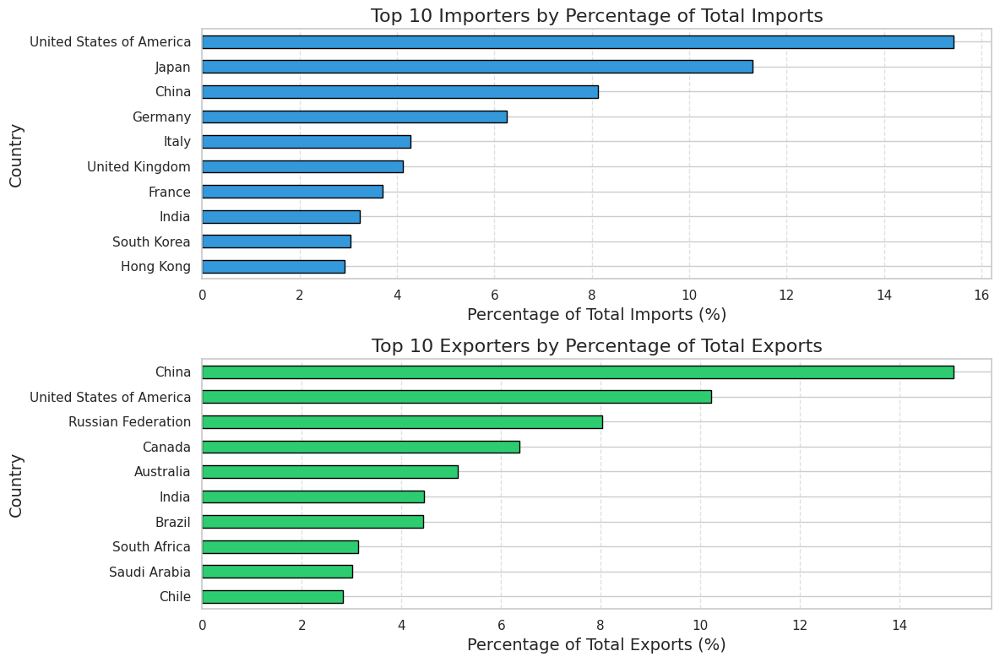

In [122]:
import pandas as pd
import matplotlib.pyplot as plt

# Select relevant flow names
import_flow = 'Raw Material Equivalents of imports'
export_flow = 'Raw Material Equivalents of exports'

# Filter data for importers and exporters
import_data = df[df['Flow name'] == import_flow]
export_data = df[df['Flow name'] == export_flow]

# Aggregate data by country
importers = import_data.groupby('Country')['1970',
       '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979',
       '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988',
       '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997',
       '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006',
       '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015',
       '2016', '2017', '2018', '2019'].sum().sum(axis=1)

exporters = export_data.groupby('Country')['1970',
       '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979',
       '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988',
       '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997',
       '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006',
       '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015',
       '2016', '2017', '2018', '2019'].sum().sum(axis=1)

# Calculate total imports
total_imports = importers.sum()
# Calculate total exports
total_exports = exporters.sum()

# Calculate percentage imports for each country
importers_percent = (importers / total_imports) * 100
exporters_percent = (exporters / total_exports) * 100

# Identify top N importers
top_importers_percent = importers_percent.nlargest(10)
top_exporters_percent = exporters_percent.nlargest(10)

# Set up the figure
plt.figure(figsize=(12, 8))

# Plot top importers
plt.subplot(2, 1, 1)
top_importers_percent.sort_values().plot(kind='barh', color='#3498db', edgecolor='black')
plt.title('Top 10 Importers by Percentage of Total Imports', fontsize=16)
plt.xlabel('Percentage of Total Imports (%)', fontsize=14)
plt.ylabel('Country', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Plot top exporters
plt.subplot(2, 1, 2)
top_exporters_percent.sort_values().plot(kind='barh', color='#2ecc71', edgecolor='black')
plt.title('Top 10 Exporters by Percentage of Total Exports', fontsize=16)
plt.xlabel('Percentage of Total Exports (%)', fontsize=14)
plt.ylabel('Country', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()


Considering **Raw Imports**, the top countries are

1.   USA with ≈ 16%
2.   Japan with ≈ 11.5%
1.   China with ≈ 8.5%

Considering **Raw Exports**, the top countries are

1.   China with ≈ 17%
2.   USA with ≈ 11.5%
1.   Canada ≈ 7%



###**4. How do the physical trade balances (exports minus imports) vary across different countries?**

In [123]:
import pandas as pd
import matplotlib.pyplot as plt

# Select relevant flow names
import_flow = 'Imports'
export_flow = 'Exports'
# Filter data for importers and exporters
import_data = df[df['Flow name'] == import_flow]
export_data = df[df['Flow name'] == export_flow]
# Aggregate data by country
importers = import_data.groupby('Country')[df.columns[5:]].sum().sum(axis=1)
exporters = export_data.groupby('Country')[df.columns[5:]].sum().sum(axis=1)
# Calculate total imports and exports
total_imports = importers.sum()
total_exports = exporters.sum()

# Calculate physical trade balances
trade_balances = exporters - importers
# Calculate percentage exports and imports for each country
exporters_percent = (exporters / total_exports) * 100
importers_percent = (importers / total_imports) * 100
# Calculate percentage trade balance for each country
trade_balances_percent = (trade_balances / total_exports) * 100

# Create a DataFrame to store the results
trade_balance_df = pd.DataFrame({
    'Country': trade_balances.index,
    'Trade Balance': trade_balances.values,
    'Trade Balance Percentage': trade_balances_percent.values,
    'Exports Percentage': exporters_percent.values,
    'Imports Percentage': importers_percent.values
})
# Display the trade balance DataFrame
trade_balance_df.head()

,Country,Trade Balance,Trade Balance Percentage,Exports Percentage,Imports Percentage
0,Afghanistan,-9.894981e+07,-0.032287,0.015238,0.047494
1,Argentina,1.936073e+09,0.631736,0.960978,0.329030
2,Armenia,-7.211460e+07,-0.023531,0.004055,0.027568
3,Aruba,-2.450735e+07,-0.007997,0.043570,0.051533
4,Australia,2.614675e+10,8.531619,9.384577,0.852408


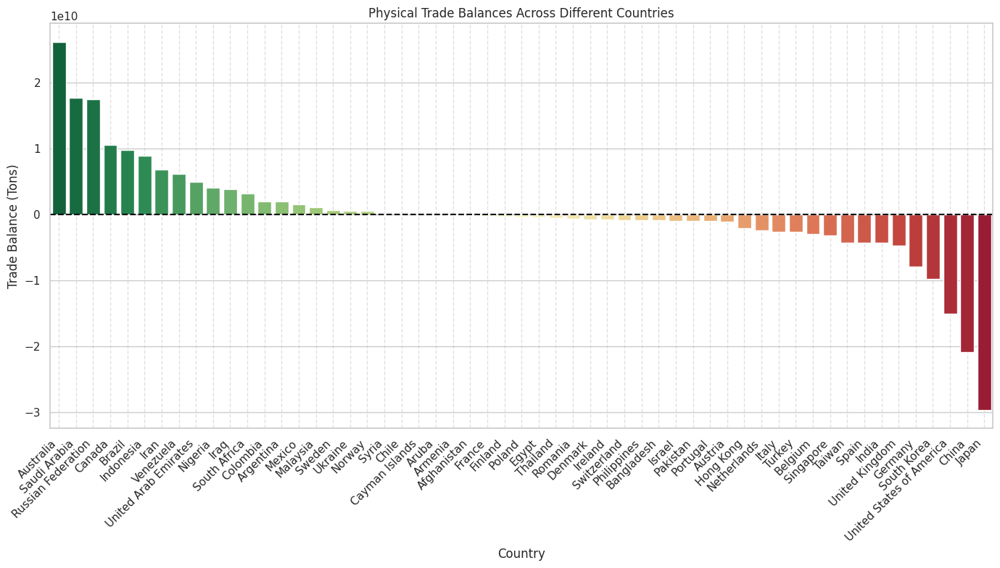

In [124]:
# Sort the DataFrame by trade balance
trade_balance_df = trade_balance_df.sort_values(by='Trade Balance', ascending=False)

# Set seaborn style
sns.set(style="whitegrid")

# Plotting trade balances
plt.figure(figsize=(14, 8))
bars = sns.barplot(x='Country', y='Trade Balance', data=trade_balance_df, palette='RdYlGn_r')
bars.set(xlabel='Country', ylabel='Trade Balance (Tons)', title='Physical Trade Balances Across Different Countries')
bars.set_xticklabels(bars.get_xticklabels(), rotation=45, horizontalalignment='right')
bars.axhline(0, color='black', linewidth=1.5, linestyle='--')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

Countries with the most **balanced trade** are

1.   Afghanistan
1.   Chile
2.   France
2.   Norway
2.   Sweden

Countires with max **deflect from trade balance** are
1.   Japan
1.   Australia
2.   China
2.   Saudi Arabia
2.   United States of America




### **5.Are there countries highly dependent on biomass imports or exports?**

In [125]:
import pandas as pd
import matplotlib.pyplot as plt

# Select relevant flow names
biomass_export_flow = 'Exports'
biomass_import_flow = 'Imports'

# Filter data for biomass exports and imports
biomass_export_data = df.loc[(df['Category'] == 'Biomass') & (df['Flow name'] == biomass_export_flow)]
biomass_import_data = df.loc[(df['Category'] == 'Biomass') & (df['Flow name'] == biomass_import_flow)]

# Aggregate data by country
biomass_exporters = biomass_export_data.groupby('Country')[df.columns[5:]].sum().sum(axis=1)
biomass_importers = biomass_import_data.groupby('Country')[df.columns[5:]].sum().sum(axis=1)

# Calculate total exports and imports
total_exports = df[df['Flow name'] == 'Exports'].groupby('Country')[df.columns[5:]].sum().sum(axis=1)
total_imports = df[df['Flow name'] == 'Imports'].groupby('Country')[df.columns[5:]].sum().sum(axis=1)

# Calculate ratios
biomass_export_ratio = (biomass_exporters / total_exports) * 100
biomass_import_ratio = (biomass_importers / total_imports) * 100

# Threshold for considering a country highly dependent
dependency_threshold = 10

# Identify highly dependent countries
highly_dependent_exporters = biomass_export_ratio[biomass_export_ratio > dependency_threshold]
highly_dependent_importers = biomass_import_ratio[biomass_import_ratio > dependency_threshold]

<ipython-input-126-a5c0e2f3be9a>:21: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


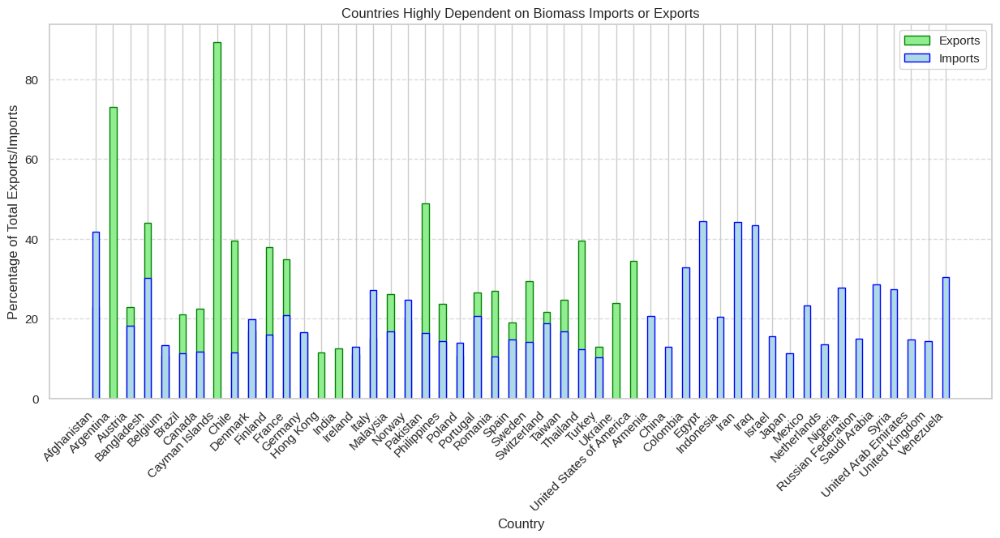

In [126]:
# Plotting
plt.figure(figsize=(15, 6))

bar_width = 0.4

# Bar plots for highly dependent exporters and importers
plt.bar(
    highly_dependent_exporters.index, highly_dependent_exporters,
    color='lightgreen', edgecolor='green', width=bar_width, label='Exports'
)
plt.bar(
    highly_dependent_importers.index, highly_dependent_importers,
    color='lightblue', edgecolor='blue', width=bar_width, label='Imports'
)
plt.xlabel('Country')
plt.ylabel('Percentage of Total Exports/Imports')
plt.title('Countries Highly Dependent on Biomass Imports or Exports')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.style.use('seaborn-whitegrid')
plt.show()

Countries heavily dependent on biomass imports or exports are

1.   Argentina => Totally Dependent on Exports
1.   Pakistan => 60% more exports than Imports
2.   Bangladesh => 30% more exports than Imports
2.   Egypt => Totally Dependent on Imports
1.   Iran => Totally Dependent on Imports



###**6. How has the trade pattern evolved for these transformed products?**

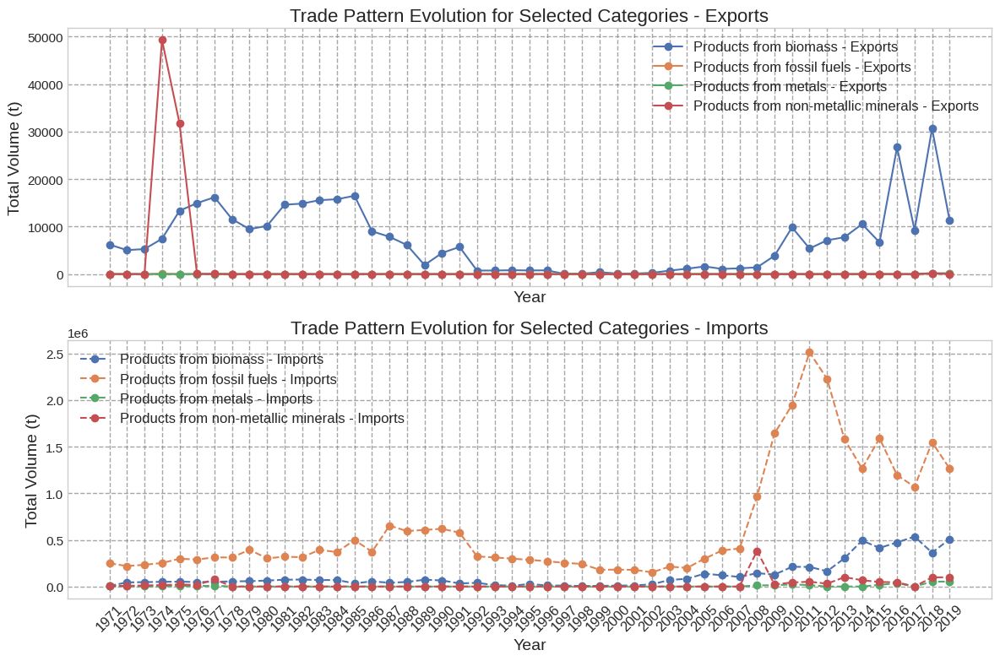

In [127]:
import matplotlib.pyplot as plt

# Modify these variables based on your actual data
selected_categories = ['Products from biomass', 'Products from fossil fuels', 'Products from metals', 'Products from non-metallic minerals']
selected_flows = ['Exports', 'Imports']

# Filter data for the selected categories and flows
filtered_data = df[(df['Category'].isin(selected_categories)) & (df['Flow name'].isin(selected_flows))]
filtered_data = filtered_data.drop(columns=['Flow code', 'Flow unit'])

# Set up two figures, one for exports and one for imports
fig, (ax_exports, ax_imports) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

# Iterate over selected categories and plot for exports
for category in selected_categories:
    category_data = filtered_data[(filtered_data['Category'] == category) & (filtered_data['Flow name'] == 'Exports')]
    exports_data = category_data.iloc[0, 4:]
    ax_exports.plot(exports_data, marker='o', linestyle='-', label=f'{category} - Exports')

# Iterate over selected categories and plot for imports
for category in selected_categories:
    category_data = filtered_data[(filtered_data['Category'] == category) & (filtered_data['Flow name'] == 'Imports')]
    imports_data = category_data.iloc[0, 4:]
    ax_imports.plot(imports_data, marker='o', linestyle='--', label=f'{category} - Imports')

# Finalize the plot for exports
ax_exports.set_title('Trade Pattern Evolution for Selected Categories - Exports', fontsize=16)
ax_exports.set_xlabel('Year', fontsize=14)
ax_exports.set_ylabel('Total Volume (t)', fontsize=14)
ax_exports.grid(True, linestyle='--', color='gray', alpha=0.7)
ax_exports.legend(fontsize=12)

# Finalize the plot for imports
ax_imports.set_title('Trade Pattern Evolution for Selected Categories - Imports', fontsize=16)
ax_imports.set_xlabel('Year', fontsize=14)
ax_imports.set_ylabel('Total Volume (t)', fontsize=14)
ax_imports.grid(True, linestyle='--', color='gray', alpha=0.7)
ax_imports.legend(fontsize=12)

plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()
plt.show()


Considering Exports, materials with Highest exports are
1. Products from Biomass
2. Products from non-metallic minerals(peaked in 1974)

Considering Imports, materials with Highest imports are
1. Products from Fossil Fuels (steadying after dip in 2014  | Peaked in 2011)
2. Products from Biomass(Slight upward trend from 2001)

###**7. Are there countries specializing in the export of environmentally sensitive raw materials?**

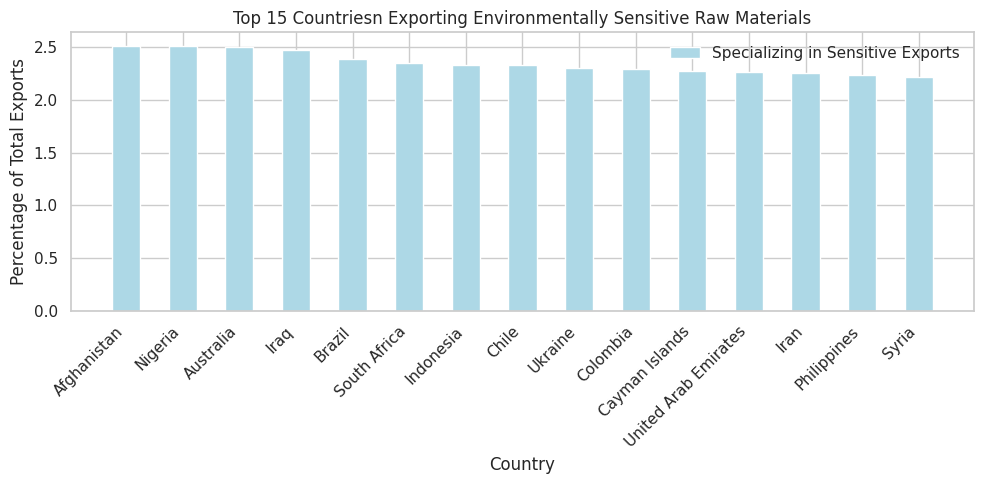

In [128]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the environmentally sensitive raw materials categories
sensitive_categories = ['Biomass', 'Excavated earthen materials (including soil) nec', 'Fossil fuels',
                        'Metal ores', 'Mixed and complex products nec.', 'Non-metallic minerals', 'Raw Material Equivalents of exports']
# Select relevant flow names
export_flow = 'Exports'
# Filter data for sensitive categories and exports
sensitive_export_data = df[(df['Category'].isin(sensitive_categories)) & (df['Flow name'] == export_flow)]
# Aggregate data by country
sensitive_exporters = sensitive_export_data.groupby('Country')[df.columns[5:]].sum().sum(axis=1)
# Calculate total exports
total_exports = df[df['Flow name'] == export_flow].groupby('Country')[df.columns[5:]].sum().sum(axis=1)

# Calculate the percentage of exports for each country
exporters_percent = (sensitive_exporters / total_exports) * 100
# Identify countries specializing in sensitive exports
specializing_exporters = exporters_percent[exporters_percent > 10]
# Normalize percentages to ensure the total does not exceed 100%
normalized_exporters = specializing_exporters / specializing_exporters.sum() * 100
# Sort countries by percentage of exports and select the top 15
top_countries = normalized_exporters.sort_values(ascending=False).head(15)

# Set Seaborn style
sns.set(style="whitegrid")
# Plotting
plt.figure(figsize=(10, 5))
# Use a bar plot with color and labels
bars = plt.bar(top_countries.index, top_countries, color='lightblue', width=0.5, label='Specializing in Sensitive Exports')
plt.xlabel('Country')
plt.ylabel('Percentage of Total Exports')
plt.title('Top 15 Countriesn Exporting Environmentally Sensitive Raw Materials')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Top Countries exporting environmetally sensitive raw materials are
1. Afghanistan
2. Nigeria
3. Australia
4. Iraq


###**8. Are there countries relying more on raw material equivalents for their industrial processes?**

In [129]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant flow name
raw_equivalents_import_flow = 'Raw Material Equivalents of imports'

# Filter data for the raw material equivalents of imports
raw_equivalents_import_data = df[df['Flow name'] == raw_equivalents_import_flow]

# Aggregate data by country
raw_equivalents_importers = raw_equivalents_import_data.groupby('Country')[df.columns[5:]].sum().sum(axis=1)

# Calculate total raw equivalents imports
total_raw_equivalents_imports = raw_equivalents_import_data[df.columns[5:]].sum().sum()

# Calculate the percentage of raw equivalents imports for each country
raw_importers_percent = (raw_equivalents_importers / total_raw_equivalents_imports) * 100

# Identify countries relying more on raw material equivalents
reliant_countries = raw_importers_percent[raw_importers_percent > 2]

# Sort countries by percentage of raw equivalents imports
top_reliant_countries = reliant_countries.sort_values(ascending=False)

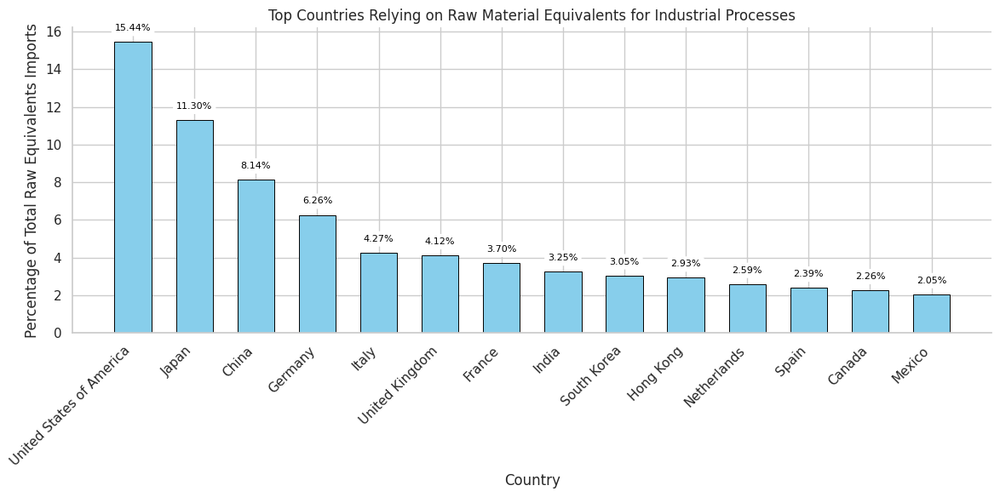

In [130]:
# Set Seaborn style
sns.set(style="whitegrid")
# Plotting
plt.figure(figsize=(12, 6))
# Use a bar plot with color and labels
bars = plt.bar(top_reliant_countries.index, top_reliant_countries, width=0.6, color='skyblue', edgecolor='black', linewidth=0.7, label='Relying on Raw Material Equivalents')

# Add data labels on each bar with a white background
for bar, label in zip(bars, top_reliant_countries):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5, f'{label:.2f}%', ha='center', va='bottom', color='black', fontsize=8, bbox=dict(facecolor='white', edgecolor='white', boxstyle='round,pad=0.3'))

plt.xlabel('Country')
plt.ylabel('Percentage of Total Raw Equivalents Imports')
plt.title('Top Countries Relying on Raw Material Equivalents for Industrial Processes')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
sns.despine()
# Display the plot
plt.show()


Top Countires Relying on Raw Material Imports are:

1.   United States of America
2.   Japan
1.   China
2.   Germany
1.   Italy








## **Data Creation for Clustering**

### **Data For Fossil_fuel Category:**

In [131]:
import pandas as pd

#######  AFGHANISTAN
afg_means_data_fossils = {
    'Country': 'Afghanistan',
    'Domestic_Ext': afg_domestic_ext_fossil.mean(),
    'Domestic_Input': afg_domestic_input_fossil.mean(),
    'Imports': afg_imports_fossil.mean(),
    'Exports': afg_exports_fossil.mean(),
    'Raw_imports': afg_raw_imports_fossil.mean(),
    'Raw_exports': afg_raw_exports_fossil.mean()
}
# Create a new dataframe
clustering_data_fossil = pd.DataFrame([afg_means_data_fossils])


#######  INDIA
ind_means_data_fossils = {
    'Country': 'India',
    'Domestic_Ext': ind_domestic_ext_fossil.mean(),
    'Domestic_Input': ind_domestic_input_fossil.mean(),
    'Imports': ind_imports_fossil.mean(),
    'Exports': ind_exports_fossil.mean(),
    'Raw_imports': ind_raw_imports_fossil.mean(),
    'Raw_exports': ind_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(ind_means_data_fossils, ignore_index=True)


#######  ARGENTINA
arg_means_data_fossils = {
    'Country': 'Argentina',
    'Domestic_Ext': arg_domestic_ext_fossil.mean(),
    'Domestic_Input': arg_domestic_input_fossil.mean(),
    'Imports': arg_imports_fossil.mean(),
    'Exports': arg_exports_fossil.mean(),
    'Raw_imports': arg_raw_imports_fossil.mean(),
    'Raw_exports': arg_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(arg_means_data_fossils, ignore_index=True)


#######  AUSTRALIA
aus_means_data_fossils = {
    'Country': 'Australia',
    'Domestic_Ext': aus_domestic_ext_fossil.mean(),
    'Domestic_Input': aus_domestic_input_fossil.mean(),
    'Imports': aus_imports_fossil.mean(),
    'Exports': aus_exports_fossil.mean(),
    'Raw_imports': aus_raw_imports_fossil.mean(),
    'Raw_exports': aus_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(aus_means_data_fossils, ignore_index=True)


#######  AUSTRIA
aust_means_data_fossils = {
    'Country': 'Austria',
    'Domestic_Ext': aust_domestic_ext_fossil.mean(),
    'Domestic_Input': aust_domestic_input_fossil.mean(),
    'Imports': aust_imports_fossil.mean(),
    'Exports': aust_exports_fossil.mean(),
    'Raw_imports': aust_raw_imports_fossil.mean(),
    'Raw_exports': aust_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(aust_means_data_fossils, ignore_index=True)


#######  BANGLADESH
bang_means_data_fossils = {
    'Country': 'Bangladesh',
    'Domestic_Ext': bang_domestic_ext_fossil.mean(),
    'Domestic_Input': bang_domestic_input_fossil.mean(),
    'Imports': bang_imports_fossil.mean(),
    'Exports': bang_exports_fossil.mean(),
    'Raw_imports': bang_raw_imports_fossil.mean(),
    'Raw_exports': bang_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(bang_means_data_fossils, ignore_index=True)


#######  BELGIUM
bel_means_data_fossils = {
    'Country': 'Belgium',
    'Domestic_Ext': bel_domestic_ext_fossil.mean(),
    'Domestic_Input': bel_domestic_input_fossil.mean(),
    'Imports': bel_imports_fossil.mean(),
    'Exports': bel_exports_fossil.mean(),
    'Raw_imports': bel_raw_imports_fossil.mean(),
    'Raw_exports': bel_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(bel_means_data_fossils, ignore_index=True)


#######  BRAZIL
bra_means_data_fossils = {
    'Country': 'Brazil',
    'Domestic_Ext': bra_domestic_ext_fossil.mean(),
    'Domestic_Input': bra_domestic_input_fossil.mean(),
    'Imports': bra_imports_fossil.mean(),
    'Exports': bra_exports_fossil.mean(),
    'Raw_imports': bra_raw_imports_fossil.mean(),
    'Raw_exports': bra_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(bra_means_data_fossils, ignore_index=True)


#######  CANADA
can_means_data_fossils = {
    'Country': 'Canada',
    'Domestic_Ext': can_domestic_ext_fossil.mean(),
    'Domestic_Input': can_domestic_input_fossil.mean(),
    'Imports': can_imports_fossil.mean(),
    'Exports': can_exports_fossil.mean(),
    'Raw_imports': can_raw_imports_fossil.mean(),
    'Raw_exports': can_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(can_means_data_fossils, ignore_index=True)


#######  CHILE
chi_means_data_fossils = {
    'Country': 'Chile',
    'Domestic_Ext': chi_domestic_ext_fossil.mean(),
    'Domestic_Input': chi_domestic_input_fossil.mean(),
    'Imports': chi_imports_fossil.mean(),
    'Exports': chi_exports_fossil.mean(),
    'Raw_imports': chi_raw_imports_fossil.mean(),
    'Raw_exports': chi_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(chi_means_data_fossils, ignore_index=True)


#######  CHINA
chin_means_data_fossils = {
    'Country': 'China',
    'Domestic_Ext': chin_domestic_ext_fossil.mean(),
    'Domestic_Input': chin_domestic_input_fossil.mean(),
    'Imports': chin_imports_fossil.mean(),
    'Exports': chin_exports_fossil.mean(),
    'Raw_imports': chin_raw_imports_fossil.mean(),
    'Raw_exports': chin_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(chin_means_data_fossils, ignore_index=True)


#######  COLOMBIA
col_means_data_fossils = {
    'Country': 'Colombia',
    'Domestic_Ext': col_domestic_ext_fossil.mean(),
    'Domestic_Input': col_domestic_input_fossil.mean(),
    'Imports': col_imports_fossil.mean(),
    'Exports': col_exports_fossil.mean(),
    'Raw_imports': col_raw_imports_fossil.mean(),
    'Raw_exports': col_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(col_means_data_fossils, ignore_index=True)


#######  DENMARK
den_means_data_fossils = {
    'Country': 'Denmark',
    'Domestic_Ext': den_domestic_ext_fossil.mean(),
    'Domestic_Input': den_domestic_input_fossil.mean(),
    'Imports': den_imports_fossil.mean(),
    'Exports': den_exports_fossil.mean(),
    'Raw_imports': den_raw_imports_fossil.mean(),
    'Raw_exports': den_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(den_means_data_fossils, ignore_index=True)


#######  EGYPT
egy_means_data_fossils = {
    'Country': 'Egypt',
    'Domestic_Ext': egy_domestic_ext_fossil.mean(),
    'Domestic_Input': egy_domestic_input_fossil.mean(),
    'Imports': egy_imports_fossil.mean(),
    'Exports': egy_exports_fossil.mean(),
    'Raw_imports': egy_raw_imports_fossil.mean(),
    'Raw_exports': egy_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(egy_means_data_fossils, ignore_index=True)


#######  FINLAND
fin_means_data_fossils = {
    'Country': 'Finland',
    'Domestic_Ext': fin_domestic_ext_fossil.mean(),
    'Domestic_Input': fin_domestic_input_fossil.mean(),
    'Imports': fin_imports_fossil.mean(),
    'Exports': fin_exports_fossil.mean(),
    'Raw_imports': fin_raw_imports_fossil.mean(),
    'Raw_exports': fin_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(fin_means_data_fossils, ignore_index=True)


#######  FRANCE
fra_means_data_fossils = {
    'Country': 'France',
    'Domestic_Ext': fra_domestic_ext_fossil.mean(),
    'Domestic_Input': fra_domestic_input_fossil.mean(),
    'Imports': fra_imports_fossil.mean(),
    'Exports': fra_exports_fossil.mean(),
    'Raw_imports': fra_raw_imports_fossil.mean(),
    'Raw_exports': fra_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(fra_means_data_fossils, ignore_index=True)


#######  GERMANY
ger_means_data_fossils = {
    'Country': 'Germany',
    'Domestic_Ext': ger_domestic_ext_fossil.mean(),
    'Domestic_Input': ger_domestic_input_fossil.mean(),
    'Imports': ger_imports_fossil.mean(),
    'Exports': ger_exports_fossil.mean(),
    'Raw_imports': ger_raw_imports_fossil.mean(),
    'Raw_exports': ger_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(ger_means_data_fossils, ignore_index=True)


#######  HongKong
hon_means_data_fossils = {
    'Country': 'HongKong',
    'Domestic_Ext': hon_domestic_ext_fossil.mean(),
    'Domestic_Input': hon_domestic_input_fossil.mean(),
    'Imports': hon_imports_fossil.mean(),
    'Exports': hon_exports_fossil.mean(),
    'Raw_imports': hon_raw_imports_fossil.mean(),
    'Raw_exports': hon_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(hon_means_data_fossils, ignore_index=True)


#######  INDONESIA
indo_means_data_fossils = {
    'Country': 'Indonesia',
    'Domestic_Ext': indo_domestic_ext_fossil.mean(),
    'Domestic_Input': indo_domestic_input_fossil.mean(),
    'Imports': indo_imports_fossil.mean(),
    'Exports': indo_exports_fossil.mean(),
    'Raw_imports': indo_raw_imports_fossil.mean(),
    'Raw_exports': indo_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(indo_means_data_fossils, ignore_index=True)


#######  IRAN
irn_means_data_fossils = {
    'Country': 'Iran',
    'Domestic_Ext': irn_domestic_ext_fossil.mean(),
    'Domestic_Input': irn_domestic_input_fossil.mean(),
    'Imports': irn_imports_fossil.mean(),
    'Exports': irn_exports_fossil.mean(),
    'Raw_imports': irn_raw_imports_fossil.mean(),
    'Raw_exports': irn_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(irn_means_data_fossils, ignore_index=True)


#######  IRAQ
irq_means_data_fossils = {
    'Country': 'Iraq',
    'Domestic_Ext': irq_domestic_ext_fossil.mean(),
    'Domestic_Input': irq_domestic_input_fossil.mean(),
    'Imports': irq_imports_fossil.mean(),
    'Exports': irq_exports_fossil.mean(),
    'Raw_imports': irq_raw_imports_fossil.mean(),
    'Raw_exports': irq_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(irq_means_data_fossils, ignore_index=True)


#######  IRELAND
ire_means_data_fossils = {
    'Country': 'Ireland',
    'Domestic_Ext': ire_domestic_ext_fossil.mean(),
    'Domestic_Input': ire_domestic_input_fossil.mean(),
    'Imports': ire_imports_fossil.mean(),
    'Exports': ire_exports_fossil.mean(),
    'Raw_imports': ire_raw_imports_fossil.mean(),
    'Raw_exports': ire_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(ire_means_data_fossils, ignore_index=True)


#######  ISRAEL
isr_means_data_fossils = {
    'Country': 'Israel',
    'Domestic_Ext': isr_domestic_ext_fossil.mean(),
    'Domestic_Input': isr_domestic_input_fossil.mean(),
    'Imports': isr_imports_fossil.mean(),
    'Exports': isr_exports_fossil.mean(),
    'Raw_imports': isr_raw_imports_fossil.mean(),
    'Raw_exports': isr_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(isr_means_data_fossils, ignore_index=True)


#######  ITALY
ita_means_data_fossils = {
    'Country': 'Italy',
    'Domestic_Ext': ita_domestic_ext_fossil.mean(),
    'Domestic_Input': ita_domestic_input_fossil.mean(),
    'Imports': ita_imports_fossil.mean(),
    'Exports': ita_exports_fossil.mean(),
    'Raw_imports': ita_raw_imports_fossil.mean(),
    'Raw_exports': ita_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(ita_means_data_fossils, ignore_index=True)


#######  JAPAN
jap_means_data_fossils = {
    'Country': 'Japan',
    'Domestic_Ext': jap_domestic_ext_fossil.mean(),
    'Domestic_Input': jap_domestic_input_fossil.mean(),
    'Imports': jap_imports_fossil.mean(),
    'Exports': jap_exports_fossil.mean(),
    'Raw_imports': jap_raw_imports_fossil.mean(),
    'Raw_exports': jap_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(jap_means_data_fossils, ignore_index=True)


#######  MALAYSIA
mal_means_data_fossils = {
    'Country': 'Malaysia',
    'Domestic_Ext': mal_domestic_ext_fossil.mean(),
    'Domestic_Input': mal_domestic_input_fossil.mean(),
    'Imports': mal_imports_fossil.mean(),
    'Exports': mal_exports_fossil.mean(),
    'Raw_imports': mal_raw_imports_fossil.mean(),
    'Raw_exports': mal_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(mal_means_data_fossils, ignore_index=True)


#######  MEXICO
mex_means_data_fossils = {
    'Country': 'Mexico',
    'Domestic_Ext': mex_domestic_ext_fossil.mean(),
    'Domestic_Input': mex_domestic_input_fossil.mean(),
    'Imports': mex_imports_fossil.mean(),
    'Exports': mex_exports_fossil.mean(),
    'Raw_imports': mex_raw_imports_fossil.mean(),
    'Raw_exports': mex_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(mex_means_data_fossils, ignore_index=True)


#######  NETHERLANDS
neth_means_data_fossils = {
    'Country': 'Netherlands',
    'Domestic_Ext': neth_domestic_ext_fossil.mean(),
    'Domestic_Input': neth_domestic_input_fossil.mean(),
    'Imports': neth_imports_fossil.mean(),
    'Exports': neth_exports_fossil.mean(),
    'Raw_imports': neth_raw_imports_fossil.mean(),
    'Raw_exports': neth_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(neth_means_data_fossils, ignore_index=True)


#######  NIGERIA
nig_means_data_fossils = {
    'Country': 'Nigeria',
    'Domestic_Ext': nig_domestic_ext_fossil.mean(),
    'Domestic_Input': nig_domestic_input_fossil.mean(),
    'Imports': nig_imports_fossil.mean(),
    'Exports': nig_exports_fossil.mean(),
    'Raw_imports': nig_raw_imports_fossil.mean(),
    'Raw_exports': nig_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(nig_means_data_fossils, ignore_index=True)


#######  NORWAY
nor_means_data_fossils = {
    'Country': 'Norway',
    'Domestic_Ext': nor_domestic_ext_fossil.mean(),
    'Domestic_Input': nor_domestic_input_fossil.mean(),
    'Imports': nor_imports_fossil.mean(),
    'Exports': nor_exports_fossil.mean(),
    'Raw_imports': nor_raw_imports_fossil.mean(),
    'Raw_exports': nor_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(nor_means_data_fossils, ignore_index=True)


#######  PAKISTAN
pak_means_data_fossils = {
    'Country': 'Pakistan',
    'Domestic_Ext': pak_domestic_ext_fossil.mean(),
    'Domestic_Input': pak_domestic_input_fossil.mean(),
    'Imports': pak_imports_fossil.mean(),
    'Exports': pak_exports_fossil.mean(),
    'Raw_imports': pak_raw_imports_fossil.mean(),
    'Raw_exports': pak_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(pak_means_data_fossils, ignore_index=True)


#######  PHILIPPINES
phi_means_data_fossils = {
    'Country': 'Philippines',
    'Domestic_Ext': phi_domestic_ext_fossil.mean(),
    'Domestic_Input': phi_domestic_input_fossil.mean(),
    'Imports': phi_imports_fossil.mean(),
    'Exports': phi_exports_fossil.mean(),
    'Raw_imports': phi_raw_imports_fossil.mean(),
    'Raw_exports': phi_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(phi_means_data_fossils, ignore_index=True)


#######  POLAND
pol_means_data_fossils = {
    'Country': 'Poland',
    'Domestic_Ext': pol_domestic_ext_fossil.mean(),
    'Domestic_Input': pol_domestic_input_fossil.mean(),
    'Imports': pol_imports_fossil.mean(),
    'Exports': pol_exports_fossil.mean(),
    'Raw_imports': pol_raw_imports_fossil.mean(),
    'Raw_exports': pol_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(pol_means_data_fossils, ignore_index=True)


#######  ROMANIA
rom_means_data_fossils = {
    'Country': 'Romania',
    'Domestic_Ext': rom_domestic_ext_fossil.mean(),
    'Domestic_Input': rom_domestic_input_fossil.mean(),
    'Imports': rom_imports_fossil.mean(),
    'Exports': rom_exports_fossil.mean(),
    'Raw_imports': rom_raw_imports_fossil.mean(),
    'Raw_exports': rom_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(rom_means_data_fossils, ignore_index=True)


#######  RUSSIA
rus_means_data_fossils = {
    'Country': 'Russia',
    'Domestic_Ext': rus_domestic_ext_fossil.mean(),
    'Domestic_Input': rus_domestic_input_fossil.mean(),
    'Imports': rus_imports_fossil.mean(),
    'Exports': rus_exports_fossil.mean(),
    'Raw_imports': rus_raw_imports_fossil.mean(),
    'Raw_exports': rus_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(rus_means_data_fossils, ignore_index=True)


#######  SAUDI ARABIA
sau_means_data_fossils = {
    'Country': 'Saudi Arabia',
    'Domestic_Ext': sau_domestic_ext_fossil.mean(),
    'Domestic_Input': sau_domestic_input_fossil.mean(),
    'Imports': sau_imports_fossil.mean(),
    'Exports': sau_exports_fossil.mean(),
    'Raw_imports': sau_raw_imports_fossil.mean(),
    'Raw_exports': sau_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(sau_means_data_fossils, ignore_index=True)


#######  SINGAPORE
sin_means_data_fossils = {
    'Country': 'Singapore',
    'Domestic_Ext': sin_domestic_ext_fossil.mean(),
    'Domestic_Input': sin_domestic_input_fossil.mean(),
    'Imports': sin_imports_fossil.mean(),
    'Exports': sin_exports_fossil.mean(),
    'Raw_imports': sin_raw_imports_fossil.mean(),
    'Raw_exports': sin_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(sin_means_data_fossils, ignore_index=True)


#######  SOUTH AFRICA
sou_means_data_fossils = {
    'Country': 'South Africa',
    'Domestic_Ext': sou_domestic_ext_fossil.mean(),
    'Domestic_Input': sou_domestic_input_fossil.mean(),
    'Imports': sou_imports_fossil.mean(),
    'Exports': sou_exports_fossil.mean(),
    'Raw_imports': sou_raw_imports_fossil.mean(),
    'Raw_exports': sou_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(sou_means_data_fossils, ignore_index=True)


#######  SOUTH KOREA
souk_means_data_fossils = {
    'Country': 'South Korea',
    'Domestic_Ext': souk_domestic_ext_fossil.mean(),
    'Domestic_Input': souk_domestic_input_fossil.mean(),
    'Imports': souk_imports_fossil.mean(),
    'Exports': souk_exports_fossil.mean(),
    'Raw_imports': souk_raw_imports_fossil.mean(),
    'Raw_exports': souk_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(souk_means_data_fossils, ignore_index=True)


#######  SPAIN
spa_means_data_fossils = {
    'Country': 'Spain',
    'Domestic_Ext': spa_domestic_ext_fossil.mean(),
    'Domestic_Input': spa_domestic_input_fossil.mean(),
    'Imports': spa_imports_fossil.mean(),
    'Exports': spa_exports_fossil.mean(),
    'Raw_imports': spa_raw_imports_fossil.mean(),
    'Raw_exports': spa_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(spa_means_data_fossils, ignore_index=True)


#######  Sweden
swe_means_data_fossils = {
    'Country': 'Sweden',
    'Domestic_Ext': swe_domestic_ext_fossil.mean(),
    'Domestic_Input': swe_domestic_input_fossil.mean(),
    'Imports': swe_imports_fossil.mean(),
    'Exports': swe_exports_fossil.mean(),
    'Raw_imports': swe_raw_imports_fossil.mean(),
    'Raw_exports': swe_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(swe_means_data_fossils, ignore_index=True)


#######  Switzerland
swi_means_data_fossils = {
    'Country': 'Switzerland',
    'Domestic_Ext': swi_domestic_ext_fossil.mean(),
    'Domestic_Input': swi_domestic_input_fossil.mean(),
    'Imports': swi_imports_fossil.mean(),
    'Exports': swi_exports_fossil.mean(),
    'Raw_imports': swi_raw_imports_fossil.mean(),
    'Raw_exports': swi_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(swi_means_data_fossils, ignore_index=True)


#######  TAIWAN
tai_means_data_fossils = {
    'Country': 'Taiwan',
    'Domestic_Ext': tai_domestic_ext_fossil.mean(),
    'Domestic_Input': tai_domestic_input_fossil.mean(),
    'Imports': tai_imports_fossil.mean(),
    'Exports': tai_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(tai_means_data_fossils, ignore_index=True)


#######  THAILAND
thai_means_data_fossils = {
    'Country': 'Thailand',
    'Domestic_Ext': thai_domestic_ext_fossil.mean(),
    'Domestic_Input': thai_domestic_input_fossil.mean(),
    'Imports': thai_imports_fossil.mean(),
    'Exports': thai_exports_fossil.mean(),
    'Raw_imports': thai_raw_imports_fossil.mean(),
    'Raw_exports': thai_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(thai_means_data_fossils, ignore_index=True)


#######  TURKEY
tur_means_data_fossils = {
    'Country': 'Turkey',
    'Domestic_Ext': tur_domestic_ext_fossil.mean(),
    'Domestic_Input': tur_domestic_input_fossil.mean(),
    'Imports': tur_imports_fossil.mean(),
    'Exports': tur_exports_fossil.mean(),
    'Raw_imports': tur_raw_imports_fossil.mean(),
    'Raw_exports': tur_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(tur_means_data_fossils, ignore_index=True)


#######  UNITED ARAB EMIRATES
uae_means_data_fossils = {
    'Country': 'United Arab Emirates',
    'Domestic_Ext': uae_domestic_ext_fossil.mean(),
    'Domestic_Input': uae_domestic_input_fossil.mean(),
    'Imports': uae_imports_fossil.mean(),
    'Exports': uae_exports_fossil.mean(),
    'Raw_imports': uae_raw_imports_fossil.mean(),
    'Raw_exports': uae_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(uae_means_data_fossils, ignore_index=True)


#######  UNITED STATES OF AMERICA
usa_means_data_fossils = {
    'Country': 'United States of America',
    'Domestic_Ext': usa_domestic_ext_fossil.mean(),
    'Domestic_Input': usa_domestic_input_fossil.mean(),
    'Imports': usa_imports_fossil.mean(),
    'Exports': usa_exports_fossil.mean(),
    'Raw_imports': usa_raw_imports_fossil.mean(),
    'Raw_exports': usa_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(usa_means_data_fossils, ignore_index=True)


#######  UNITED KINGDOM
uk_means_data_fossils = {
    'Country': 'United Kingdom',
    'Domestic_Ext': uk_domestic_ext_fossil.mean(),
    'Domestic_Input': uk_domestic_input_fossil.mean(),
    'Imports': uk_imports_fossil.mean(),
    'Exports': uk_exports_fossil.mean(),
    'Raw_imports': uk_raw_imports_fossil.mean(),
    'Raw_exports': uk_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(uk_means_data_fossils, ignore_index=True)


#######  VENEZUELA
ven_means_data_fossils = {
    'Country': 'Venezuela',
    'Domestic_Ext': ven_domestic_ext_fossil.mean(),
    'Domestic_Input': ven_domestic_input_fossil.mean(),
    'Imports': ven_imports_fossil.mean(),
    'Exports': ven_exports_fossil.mean(),
    'Raw_imports': ven_raw_imports_fossil.mean(),
    'Raw_exports': ven_raw_exports_fossil.mean()
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_fossil = clustering_data_fossil.append(ven_means_data_fossils, ignore_index=True)

# Display the updated dataframe
clustering_data_fossil

,Country,Domestic_Ext,Domestic_Input,Imports,Exports,Raw_imports,Raw_exports
0,Afghanistan,1.589082e+08,1.611928e+08,2.284632e+06,8.833299e+07,1.147981e+07,1.176471e+08
1,India,3.578848e+08,4.783602e+08,1.204754e+08,1.376659e+06,1.409598e+08,7.325853e+07
2,Argentina,1.589082e+08,1.611928e+08,2.284632e+06,8.833299e+07,1.147981e+07,1.176471e+08
3,Australia,3.091473e+08,3.254742e+08,1.632686e+07,2.537590e+08,4.868829e+07,1.762256e+08
4,Austria,4.040540e+06,2.103534e+07,1.699480e+07,8.834900e+05,3.654765e+07,1.082720e+06
5,Bangladesh,6.966991e+06,8.743108e+06,1.776117e+06,4.240000e+03,6.643455e+06,6.859310e+06
6,Belgium,6.966991e+06,8.743108e+06,1.776117e+06,4.240000e+03,6.643455e+06,6.859310e+06
7,Brazil,6.190478e+07,1.013854e+08,3.948059e+07,1.094974e+07,6.175699e+07,3.128893e+07
8,Canada,5.518264e+08,6.091033e+08,5.727686e+07,1.457679e+08,9.071706e+07,4.719199e+08
9,Chile,3.359923e+06,1.517152e+07,1.181159e+07,1.792892e+05,2.210845e+07,1.365606e+06


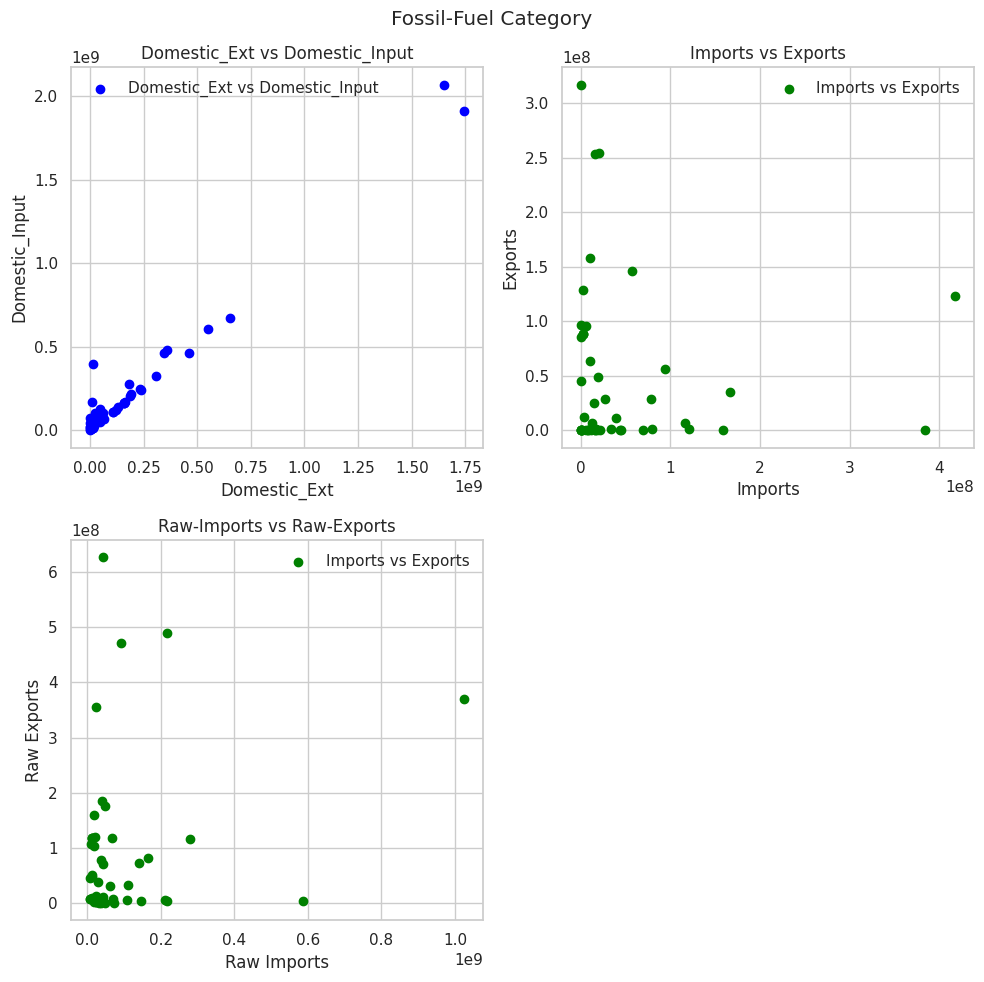

In [132]:
# Plotting Domestic_Ext vs Domestic_Input
plt.figure(figsize=(10, 10))
plt.suptitle("Fossil-Fuel Category")

# Scatter plot 1
plt.subplot(2, 2, 1)
scatter1 = plt.scatter(clustering_data_fossil['Domestic_Ext'], clustering_data_fossil['Domestic_Input'], color='blue', label='Domestic_Ext vs Domestic_Input')
plt.title('Domestic_Ext vs Domestic_Input')
plt.xlabel('Domestic_Ext')
plt.ylabel('Domestic_Input')
plt.legend()

# Scatter plot 2
plt.subplot(2, 2, 2)
scatter2 = plt.scatter(clustering_data_fossil['Imports'], clustering_data_fossil['Exports'], color='green', label='Imports vs Exports')
plt.title('Imports vs Exports')
plt.xlabel('Imports')
plt.ylabel('Exports')
plt.legend()

# Scatter plot 3
plt.subplot(2, 2, 3)
scatter3 = plt.scatter(clustering_data_fossil['Raw_imports'], clustering_data_fossil['Raw_exports'], color='green', label='Imports vs Exports')
plt.title('Raw-Imports vs Raw-Exports')
plt.xlabel('Raw Imports')
plt.ylabel('Raw Exports')
plt.legend()

plt.tight_layout()
plt.show()

### **Data for Metal_Ore Category:**

In [133]:
import pandas as pd

#######  AFGHANISTAN
afg_means_data_metalore = {
    'Country': 'Afghanistan',
    'Domestic_Ext': afg_domestic_ext_metalore.mean(),
    'Domestic_Input': afg_domestic_input_metalore.mean(),
    'Imports': afg_imports_metalore.mean(),
    'Exports': afg_exports_metalore.mean(),
    'Raw_imports': afg_raw_imports_metalore.mean(),
    'Raw_exports': afg_raw_exports_metalore.mean()
}
# Create a new dataframe
clustering_data_metalore = pd.DataFrame([afg_means_data_metalore])


#######  INDIA
ind_means_data_metalore = {
    'Country': 'India',
    'Domestic_Ext': ind_domestic_ext_metalore.mean(),
    'Domestic_Input': ind_domestic_input_metalore.mean(),
    'Imports': ind_imports_metalore.mean(),
    'Exports': ind_exports_metalore.mean(),
    'Raw_imports': ind_raw_imports_metalore.mean(),
    'Raw_exports': ind_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(ind_means_data_metalore, ignore_index=True)


#######  ARGENTINA
arg_means_data_metalore = {
    'Country': 'Argentina',
    'Domestic_Ext': arg_domestic_ext_metalore.mean(),
    'Domestic_Input': arg_domestic_input_metalore.mean(),
    'Imports': arg_imports_metalore.mean(),
    'Exports': arg_exports_metalore.mean(),
    'Raw_imports': arg_raw_imports_metalore.mean(),
    'Raw_exports': arg_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(arg_means_data_metalore, ignore_index=True)


#######  AUSTRALIA
aus_means_data_metalore = {
    'Country': 'Australia',
    'Domestic_Ext': aus_domestic_ext_metalore.mean(),
    'Domestic_Input': aus_domestic_input_metalore.mean(),
    'Imports': aus_imports_metalore.mean(),
    'Exports': aus_exports_metalore.mean(),
    'Raw_imports': aus_raw_imports_metalore.mean(),
    'Raw_exports': aus_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(aus_means_data_metalore, ignore_index=True)


#######  AUSTRIA
aust_means_data_metalore = {
    'Country': 'Austria',
    'Domestic_Ext': aust_domestic_ext_metalore.mean(),
    'Domestic_Input': aust_domestic_input_metalore.mean(),
    'Imports': aust_imports_metalore.mean(),
    'Exports': aust_exports_metalore.mean(),
    'Raw_imports': aust_raw_imports_metalore.mean(),
    'Raw_exports': aust_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(aust_means_data_metalore, ignore_index=True)


#######  BANGLADESH
bang_means_data_metalore = {
    'Country': 'Bangladesh',
    'Domestic_Ext': bang_domestic_ext_metalore.mean(),
    'Domestic_Input': bang_domestic_input_metalore.mean(),
    'Imports': bang_imports_metalore.mean(),
    'Exports': bang_exports_metalore.mean(),
    'Raw_imports': bang_raw_imports_metalore.mean(),
    'Raw_exports': bang_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(bang_means_data_metalore, ignore_index=True)


#######  BELGIUM
bel_means_data_metalore = {
    'Country': 'Belgium',
    'Domestic_Ext': bel_domestic_ext_metalore.mean(),
    'Domestic_Input': bel_domestic_input_metalore.mean(),
    'Imports': bel_imports_metalore.mean(),
    'Exports': bel_exports_metalore.mean(),
    'Raw_imports': bel_raw_imports_metalore.mean(),
    'Raw_exports': bel_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(bel_means_data_metalore, ignore_index=True)


#######  BRAZIL
bra_means_data_metalore = {
    'Country': 'Brazil',
    'Domestic_Ext': bra_domestic_ext_metalore.mean(),
    'Domestic_Input': bra_domestic_input_metalore.mean(),
    'Imports': bra_imports_metalore.mean(),
    'Exports': bra_exports_metalore.mean(),
    'Raw_imports': bra_raw_imports_metalore.mean(),
    'Raw_exports': bra_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(bra_means_data_metalore, ignore_index=True)


#######  CANADA
can_means_data_metalore = {
    'Country': 'Canada',
    'Domestic_Ext': can_domestic_ext_metalore.mean(),
    'Domestic_Input': can_domestic_input_metalore.mean(),
    'Imports': can_imports_metalore.mean(),
    'Exports': can_exports_metalore.mean(),
    'Raw_imports': can_raw_imports_metalore.mean(),
    'Raw_exports': can_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(can_means_data_metalore, ignore_index=True)


#######  CHILE
chi_means_data_metalore = {
    'Country': 'Chile',
    'Domestic_Ext': chi_domestic_ext_metalore.mean(),
    'Domestic_Input': chi_domestic_input_metalore.mean(),
    'Imports': chi_imports_metalore.mean(),
    'Exports': chi_exports_metalore.mean(),
    'Raw_imports': chi_raw_imports_metalore.mean(),
    'Raw_exports': chi_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(chi_means_data_metalore, ignore_index=True)


#######  CHINA
chin_means_data_metalore = {
    'Country': 'China',
    'Domestic_Ext': chin_domestic_ext_metalore.mean(),
    'Domestic_Input': chin_domestic_input_metalore.mean(),
    'Imports': chin_imports_metalore.mean(),
    'Exports': chin_exports_metalore.mean(),
    'Raw_imports': chin_raw_imports_metalore.mean(),
    'Raw_exports': chin_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(chin_means_data_metalore, ignore_index=True)


#######  COLOMBIA
col_means_data_metalore = {
    'Country': 'Colombia',
    'Domestic_Ext': col_domestic_ext_metalore.mean(),
    'Domestic_Input': col_domestic_input_metalore.mean(),
    'Imports': col_imports_metalore.mean(),
    'Exports': col_exports_metalore.mean(),
    'Raw_imports': col_raw_imports_metalore.mean(),
    'Raw_exports': col_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(col_means_data_metalore, ignore_index=True)


#######  DENMARK
den_means_data_metalore = {
    'Country': 'Denmark',
    'Domestic_Ext': den_domestic_ext_metalore.mean(),
    'Domestic_Input': den_domestic_input_metalore.mean(),
    'Imports': den_imports_metalore.mean(),
    'Exports': den_exports_metalore.mean(),
    'Raw_imports': den_raw_imports_metalore.mean(),
    'Raw_exports': den_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(den_means_data_metalore, ignore_index=True)


#######  EGYPT
egy_means_data_metalore = {
    'Country': 'Egypt',
    'Domestic_Ext': egy_domestic_ext_metalore.mean(),
    'Domestic_Input': egy_domestic_input_metalore.mean(),
    'Imports': egy_imports_metalore.mean(),
    'Exports': egy_exports_metalore.mean(),
    'Raw_imports': egy_raw_imports_metalore.mean(),
    'Raw_exports': egy_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(egy_means_data_metalore, ignore_index=True)


#######  FINLAND
fin_means_data_metalore = {
    'Country': 'Finland',
    'Domestic_Ext': fin_domestic_ext_metalore.mean(),
    'Domestic_Input': fin_domestic_input_metalore.mean(),
    'Imports': fin_imports_metalore.mean(),
    'Exports': fin_exports_metalore.mean(),
    'Raw_imports': fin_raw_imports_metalore.mean(),
    'Raw_exports': fin_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(fin_means_data_metalore, ignore_index=True)


#######  FRANCE
fra_means_data_metalore = {
    'Country': 'France',
    'Domestic_Ext': fra_domestic_ext_metalore.mean(),
    'Domestic_Input': fra_domestic_input_metalore.mean(),
    'Imports': fra_imports_metalore.mean(),
    'Exports': fra_exports_metalore.mean(),
    'Raw_imports': fra_raw_imports_metalore.mean(),
    'Raw_exports': fra_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(fra_means_data_metalore, ignore_index=True)


#######  GERMANY
ger_means_data_metalore = {
    'Country': 'Germany',
    'Domestic_Ext': ger_domestic_ext_metalore.mean(),
    'Domestic_Input': ger_domestic_input_metalore.mean(),
    'Imports': ger_imports_metalore.mean(),
    'Exports': ger_exports_metalore.mean(),
    'Raw_imports': ger_raw_imports_metalore.mean(),
    'Raw_exports': ger_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(ger_means_data_metalore, ignore_index=True)


#######  HongKong
hon_means_data_metalore = {
    'Country': 'HongKong',
    'Domestic_Ext': hon_domestic_ext_metalore.mean(),
    'Domestic_Input': hon_domestic_input_metalore.mean(),
    'Imports': hon_imports_metalore.mean(),
    'Exports': hon_exports_metalore.mean(),
    'Raw_imports': hon_raw_imports_metalore.mean(),
    'Raw_exports': hon_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(hon_means_data_metalore, ignore_index=True)


#######  INDONESIA
indo_means_data_metalore = {
    'Country': 'Indonesia',
    'Domestic_Ext': indo_domestic_ext_metalore.mean(),
    'Domestic_Input': indo_domestic_input_metalore.mean(),
    'Imports': indo_imports_metalore.mean(),
    'Exports': indo_exports_metalore.mean(),
    'Raw_imports': indo_raw_imports_metalore.mean(),
    'Raw_exports': indo_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(indo_means_data_metalore, ignore_index=True)


#######  IRAN
irn_means_data_metalore = {
    'Country': 'Iran',
    'Domestic_Ext': irn_domestic_ext_metalore.mean(),
    'Domestic_Input': irn_domestic_input_metalore.mean(),
    'Imports': irn_imports_metalore.mean(),
    'Exports': irn_exports_metalore.mean(),
    'Raw_imports': irn_raw_imports_metalore.mean(),
    'Raw_exports': irn_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(irn_means_data_metalore, ignore_index=True)


#######  IRAQ
irq_means_data_metalore = {
    'Country': 'Iraq',
    'Domestic_Ext': irq_domestic_ext_metalore.mean(),
    'Domestic_Input': irq_domestic_input_metalore.mean(),
    'Imports': irq_imports_metalore.mean(),
    'Exports': irq_exports_metalore.mean(),
    'Raw_imports': irq_raw_imports_metalore.mean(),
    'Raw_exports': irq_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(irq_means_data_metalore, ignore_index=True)


#######  IRELAND
ire_means_data_metalore = {
    'Country': 'Ireland',
    'Domestic_Ext': ire_domestic_ext_metalore.mean(),
    'Domestic_Input': ire_domestic_input_metalore.mean(),
    'Imports': ire_imports_metalore.mean(),
    'Exports': ire_exports_metalore.mean(),
    'Raw_imports': ire_raw_imports_metalore.mean(),
    'Raw_exports': ire_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(ire_means_data_metalore, ignore_index=True)


#######  ISRAEL
isr_means_data_metalore = {
    'Country': 'Israel',
    'Domestic_Ext': isr_domestic_ext_metalore.mean(),
    'Domestic_Input': isr_domestic_input_metalore.mean(),
    'Imports': isr_imports_metalore.mean(),
    'Exports': isr_exports_metalore.mean(),
    'Raw_imports': isr_raw_imports_metalore.mean(),
    'Raw_exports': isr_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(isr_means_data_metalore, ignore_index=True)


#######  ITALY
ita_means_data_metalore = {
    'Country': 'Italy',
    'Domestic_Ext': ita_domestic_ext_metalore.mean(),
    'Domestic_Input': ita_domestic_input_metalore.mean(),
    'Imports': ita_imports_metalore.mean(),
    'Exports': ita_exports_metalore.mean(),
    'Raw_imports': ita_raw_imports_metalore.mean(),
    'Raw_exports': ita_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(ita_means_data_metalore, ignore_index=True)


#######  JAPAN
jap_means_data_metalore = {
    'Country': 'Japan',
    'Domestic_Ext': jap_domestic_ext_metalore.mean(),
    'Domestic_Input': jap_domestic_input_metalore.mean(),
    'Imports': jap_imports_metalore.mean(),
    'Exports': jap_exports_metalore.mean(),
    'Raw_imports': jap_raw_imports_metalore.mean(),
    'Raw_exports': jap_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(jap_means_data_metalore, ignore_index=True)


#######  MALAYSIA
mal_means_data_metalore = {
    'Country': 'Malaysia',
    'Domestic_Ext': mal_domestic_ext_metalore.mean(),
    'Domestic_Input': mal_domestic_input_metalore.mean(),
    'Imports': mal_imports_metalore.mean(),
    'Exports': mal_exports_metalore.mean(),
    'Raw_imports': mal_raw_imports_metalore.mean(),
    'Raw_exports': mal_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(mal_means_data_metalore, ignore_index=True)


#######  MEXICO
mex_means_data_metalore = {
    'Country': 'Mexico',
    'Domestic_Ext': mex_domestic_ext_metalore.mean(),
    'Domestic_Input': mex_domestic_input_metalore.mean(),
    'Imports': mex_imports_metalore.mean(),
    'Exports': mex_exports_metalore.mean(),
    'Raw_imports': mex_raw_imports_metalore.mean(),
    'Raw_exports': mex_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(mex_means_data_metalore, ignore_index=True)


#######  NETHERLANDS
neth_means_data_metalore = {
    'Country': 'Netherlands',
    'Domestic_Ext': neth_domestic_ext_metalore.mean(),
    'Domestic_Input': neth_domestic_input_metalore.mean(),
    'Imports': neth_imports_metalore.mean(),
    'Exports': neth_exports_metalore.mean(),
    'Raw_imports': neth_raw_imports_metalore.mean(),
    'Raw_exports': neth_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(neth_means_data_metalore, ignore_index=True)


#######  NIGERIA
nig_means_data_metalore = {
    'Country': 'Nigeria',
    'Domestic_Ext': nig_domestic_ext_metalore.mean(),
    'Domestic_Input': nig_domestic_input_metalore.mean(),
    'Imports': nig_imports_metalore.mean(),
    'Exports': nig_exports_metalore.mean(),
    'Raw_imports': nig_raw_imports_metalore.mean(),
    'Raw_exports': nig_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(nig_means_data_metalore, ignore_index=True)


#######  NORWAY
nor_means_data_metalore = {
    'Country': 'Norway',
    'Domestic_Ext': nor_domestic_ext_metalore.mean(),
    'Domestic_Input': nor_domestic_input_metalore.mean(),
    'Imports': nor_imports_metalore.mean(),
    'Exports': nor_exports_metalore.mean(),
    'Raw_imports': nor_raw_imports_metalore.mean(),
    'Raw_exports': nor_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(nor_means_data_metalore, ignore_index=True)


#######  PAKISTAN
pak_means_data_metalore = {
    'Country': 'Pakistan',
    'Domestic_Ext': pak_domestic_ext_metalore.mean(),
    'Domestic_Input': pak_domestic_input_metalore.mean(),
    'Imports': pak_imports_metalore.mean(),
    'Exports': pak_exports_metalore.mean(),
    'Raw_imports': pak_raw_imports_metalore.mean(),
    'Raw_exports': pak_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(pak_means_data_metalore, ignore_index=True)


#######  PHILIPPINES
phi_means_data_metalore = {
    'Country': 'Philippines',
    'Domestic_Ext': phi_domestic_ext_metalore.mean(),
    'Domestic_Input': phi_domestic_input_metalore.mean(),
    'Imports': phi_imports_metalore.mean(),
    'Exports': phi_exports_metalore.mean(),
    'Raw_imports': phi_raw_imports_metalore.mean(),
    'Raw_exports': phi_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(phi_means_data_metalore, ignore_index=True)


#######  POLAND
pol_means_data_metalore = {
    'Country': 'Poland',
    'Domestic_Ext': pol_domestic_ext_metalore.mean(),
    'Domestic_Input': pol_domestic_input_metalore.mean(),
    'Imports': pol_imports_metalore.mean(),
    'Exports': pol_exports_metalore.mean(),
    'Raw_imports': pol_raw_imports_metalore.mean(),
    'Raw_exports': pol_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(pol_means_data_metalore, ignore_index=True)


#######  ROMANIA
rom_means_data_metalore = {
    'Country': 'Romania',
    'Domestic_Ext': rom_domestic_ext_metalore.mean(),
    'Domestic_Input': rom_domestic_input_metalore.mean(),
    'Imports': rom_imports_metalore.mean(),
    'Exports': rom_exports_metalore.mean(),
    'Raw_imports': rom_raw_imports_metalore.mean(),
    'Raw_exports': rom_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(rom_means_data_metalore, ignore_index=True)


#######  RUSSIA
rus_means_data_metalore = {
    'Country': 'Russia',
    'Domestic_Ext': rus_domestic_ext_metalore.mean(),
    'Domestic_Input': rus_domestic_input_metalore.mean(),
    'Imports': rus_imports_metalore.mean(),
    'Exports': rus_exports_metalore.mean(),
    'Raw_imports': rus_raw_imports_metalore.mean(),
    'Raw_exports': rus_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(rus_means_data_metalore, ignore_index=True)


#######  SAUDI ARABIA
sau_means_data_metalore = {
    'Country': 'Saudi Arabia',
    'Domestic_Ext': sau_domestic_ext_metalore.mean(),
    'Domestic_Input': sau_domestic_input_metalore.mean(),
    'Imports': sau_imports_metalore.mean(),
    'Exports': sau_exports_metalore.mean(),
    'Raw_imports': sau_raw_imports_metalore.mean(),
    'Raw_exports': sau_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(sau_means_data_metalore, ignore_index=True)


#######  SINGAPORE
sin_means_data_metalore = {
    'Country': 'Singapore',
    'Domestic_Ext': sin_domestic_ext_metalore.mean(),
    'Domestic_Input': sin_domestic_input_metalore.mean(),
    'Imports': sin_imports_metalore.mean(),
    'Exports': sin_exports_metalore.mean(),
    'Raw_imports': sin_raw_imports_metalore.mean(),
    'Raw_exports': sin_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(sin_means_data_metalore, ignore_index=True)


#######  SOUTH AFRICA
sou_means_data_metalore = {
    'Country': 'South Africa',
    'Domestic_Ext': sou_domestic_ext_metalore.mean(),
    'Domestic_Input': sou_domestic_input_metalore.mean(),
    'Imports': sou_imports_metalore.mean(),
    'Exports': sou_exports_metalore.mean(),
    'Raw_imports': sou_raw_imports_metalore.mean(),
    'Raw_exports': sou_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(sou_means_data_metalore, ignore_index=True)


#######  SOUTH KOREA
souk_means_data_metalore = {
    'Country': 'South Korea',
    'Domestic_Ext': souk_domestic_ext_metalore.mean(),
    'Domestic_Input': souk_domestic_input_metalore.mean(),
    'Imports': souk_imports_metalore.mean(),
    'Exports': souk_exports_metalore.mean(),
    'Raw_imports': souk_raw_imports_metalore.mean(),
    'Raw_exports': souk_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(souk_means_data_metalore, ignore_index=True)


#######  SPAIN
spa_means_data_metalore = {
    'Country': 'Spain',
    'Domestic_Ext': spa_domestic_ext_metalore.mean(),
    'Domestic_Input': spa_domestic_input_metalore.mean(),
    'Imports': spa_imports_metalore.mean(),
    'Exports': spa_exports_metalore.mean(),
    'Raw_imports': spa_raw_imports_metalore.mean(),
    'Raw_exports': spa_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(spa_means_data_metalore, ignore_index=True)


#######  Sweden
swe_means_data_metalore = {
    'Country': 'Sweden',
    'Domestic_Ext': swe_domestic_ext_metalore.mean(),
    'Domestic_Input': swe_domestic_input_metalore.mean(),
    'Imports': swe_imports_metalore.mean(),
    'Exports': swe_exports_metalore.mean(),
    'Raw_imports': swe_raw_imports_metalore.mean(),
    'Raw_exports': swe_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(swe_means_data_metalore, ignore_index=True)


#######  Switzerland
swi_means_data_metalore = {
    'Country': 'Switzerland',
    'Domestic_Ext': swi_domestic_ext_metalore.mean(),
    'Domestic_Input': swi_domestic_input_metalore.mean(),
    'Imports': swi_imports_metalore.mean(),
    'Exports': swi_exports_metalore.mean(),
    'Raw_imports': swi_raw_imports_metalore.mean(),
    'Raw_exports': swi_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(swi_means_data_metalore, ignore_index=True)


#######  TAIWAN
tai_means_data_metalore = {
    'Country': 'Taiwan',
    'Domestic_Ext': tai_domestic_ext_metalore.mean(),
    'Domestic_Input': tai_domestic_input_metalore.mean(),
    'Imports': tai_imports_metalore.mean(),
    'Exports': tai_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(tai_means_data_metalore, ignore_index=True)


#######  THAILAND
thai_means_data_metalore = {
    'Country': 'Thailand',
    'Domestic_Ext': thai_domestic_ext_metalore.mean(),
    'Domestic_Input': thai_domestic_input_metalore.mean(),
    'Imports': thai_imports_metalore.mean(),
    'Exports': thai_exports_metalore.mean(),
    'Raw_imports': thai_raw_imports_metalore.mean(),
    'Raw_exports': thai_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(thai_means_data_metalore, ignore_index=True)


#######  TURKEY
tur_means_data_metalore = {
    'Country': 'Turkey',
    'Domestic_Ext': tur_domestic_ext_metalore.mean(),
    'Domestic_Input': tur_domestic_input_metalore.mean(),
    'Imports': tur_imports_metalore.mean(),
    'Exports': tur_exports_metalore.mean(),
    'Raw_imports': tur_raw_imports_metalore.mean(),
    'Raw_exports': tur_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(tur_means_data_metalore, ignore_index=True)


#######  UNITED ARAB EMIRATES
uae_means_data_metalore = {
    'Country': 'United Arab Emirates',
    'Domestic_Ext': uae_domestic_ext_metalore.mean(),
    'Domestic_Input': uae_domestic_input_metalore.mean(),
    'Imports': uae_imports_metalore.mean(),
    'Exports': uae_exports_metalore.mean(),
    'Raw_imports': uae_raw_imports_metalore.mean(),
    'Raw_exports': uae_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(uae_means_data_metalore, ignore_index=True)


#######  UNITED STATES OF AMERICA
usa_means_data_metalore = {
    'Country': 'United States of America',
    'Domestic_Ext': usa_domestic_ext_metalore.mean(),
    'Domestic_Input': usa_domestic_input_metalore.mean(),
    'Imports': usa_imports_metalore.mean(),
    'Exports': usa_exports_metalore.mean(),
    'Raw_imports': usa_raw_imports_metalore.mean(),
    'Raw_exports': usa_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(usa_means_data_metalore, ignore_index=True)


#######  UNITED KINGDOM
uk_means_data_metalore = {
    'Country': 'United Kingdom',
    'Domestic_Ext': uk_domestic_ext_metalore.mean(),
    'Domestic_Input': uk_domestic_input_metalore.mean(),
    'Imports': uk_imports_metalore.mean(),
    'Exports': uk_exports_metalore.mean(),
    'Raw_imports': uk_raw_imports_metalore.mean(),
    'Raw_exports': uk_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(uk_means_data_metalore, ignore_index=True)


#######  VENEZUELA
ven_means_data_metalore = {
    'Country': 'Venezuela',
    'Domestic_Ext': ven_domestic_ext_metalore.mean(),
    'Domestic_Input': ven_domestic_input_metalore.mean(),
    'Imports': ven_imports_metalore.mean(),
    'Exports': ven_exports_metalore.mean(),
    'Raw_imports': ven_raw_imports_metalore.mean(),
    'Raw_exports': ven_raw_exports_metalore.mean()
}
# Append India's data to the clustering_data_metalore dataframe
clustering_data_metalore = clustering_data_metalore.append(ven_means_data_metalore, ignore_index=True)

# Display the updated dataframe
clustering_data_metalore

,Country,Domestic_Ext,Domestic_Input,Imports,Exports,Raw_imports,Raw_exports
0,Afghanistan,1.994528e+07,2.174855e+07,1.803263e+06,1.016914e+07,1.045904e+07,1.404663e+07
1,India,1.167134e+08,1.244720e+08,7.758568e+06,4.169922e+07,9.778024e+07,9.157779e+07
2,Argentina,1.994528e+07,2.174855e+07,1.803263e+06,1.016914e+07,1.045904e+07,1.404663e+07
3,Australia,4.603327e+08,4.649189e+08,4.586293e+06,2.693864e+08,3.879686e+07,3.947599e+08
4,Austria,5.752074e+06,1.354959e+07,7.797517e+06,4.664071e+06,1.875246e+07,3.137868e+06
5,Bangladesh,0.000000e+00,1.170331e+06,1.170331e+06,1.757052e+04,4.440559e+06,0.000000e+00
6,Belgium,0.000000e+00,1.170331e+06,1.170331e+06,1.757052e+04,4.440559e+06,0.000000e+00
7,Brazil,3.004321e+08,3.032302e+08,2.798072e+06,1.868566e+08,5.207402e+07,2.448140e+08
8,Canada,2.241020e+08,2.432720e+08,1.917006e+07,4.283372e+07,6.721880e+07,2.093517e+08
9,Chile,3.899439e+08,3.908804e+08,9.364696e+05,1.074818e+07,1.078627e+07,3.779936e+08


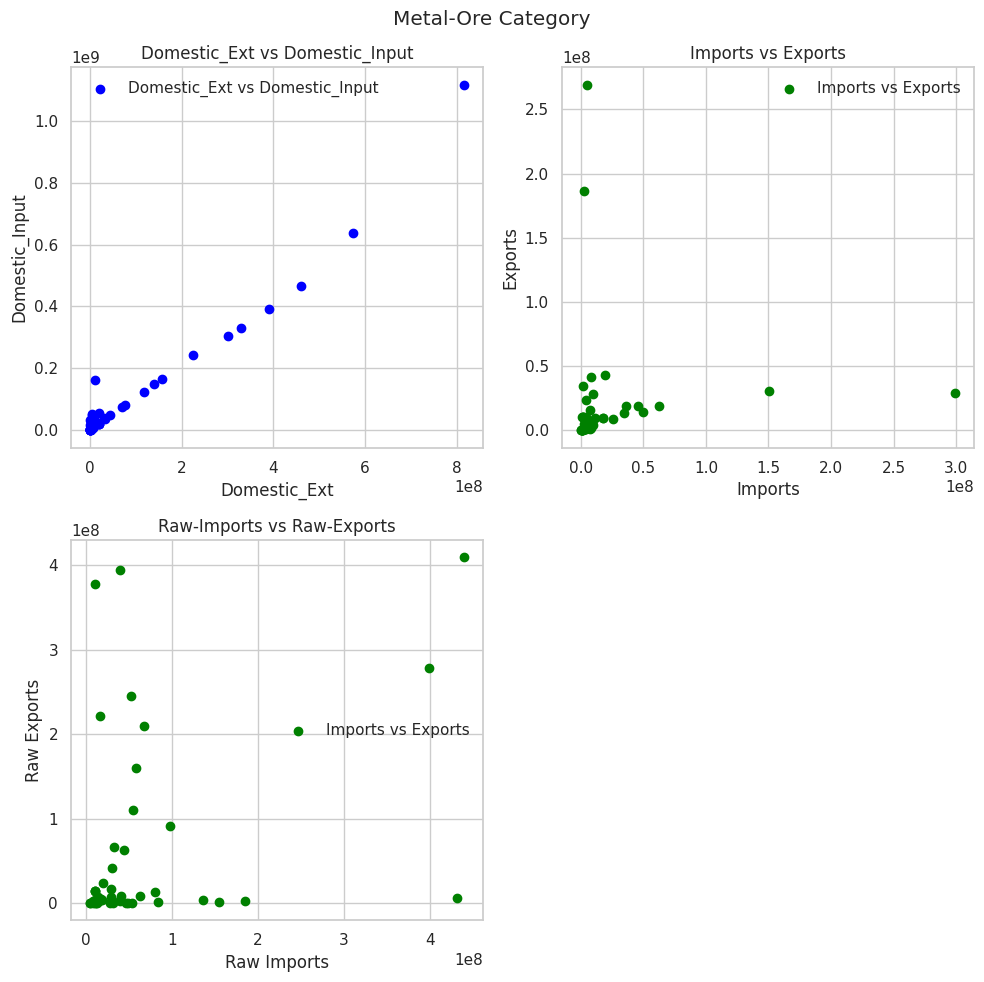

In [134]:
# Plotting Domestic_Ext vs Domestic_Input
plt.figure(figsize=(10, 10))
plt.suptitle("Metal-Ore Category")

# Scatter plot 1
plt.subplot(2, 2, 1)
scatter1 = plt.scatter(clustering_data_metalore['Domestic_Ext'], clustering_data_metalore['Domestic_Input'], color='blue', label='Domestic_Ext vs Domestic_Input')
plt.title('Domestic_Ext vs Domestic_Input')
plt.xlabel('Domestic_Ext')
plt.ylabel('Domestic_Input')
plt.legend()

# Scatter plot 2
plt.subplot(2, 2, 2)
scatter2 = plt.scatter(clustering_data_metalore['Imports'], clustering_data_metalore['Exports'], color='green', label='Imports vs Exports')
plt.title('Imports vs Exports')
plt.xlabel('Imports')
plt.ylabel('Exports')
plt.legend()

# Scatter plot 3
plt.subplot(2, 2, 3)
scatter3 = plt.scatter(clustering_data_metalore['Raw_imports'], clustering_data_metalore['Raw_exports'], color='green', label='Imports vs Exports')
plt.title('Raw-Imports vs Raw-Exports')
plt.xlabel('Raw Imports')
plt.ylabel('Raw Exports')
plt.legend()

plt.tight_layout()
plt.show()


### **Data For Non_Metallic_Material Category:**

In [135]:
import pandas as pd

#######  AFGHANISTAN
afg_means_data_nmm = {
    'Country': 'Afghanistan',
    'Domestic_Ext': afg_domestic_ext_nmm.mean(),
    'Domestic_Input': afg_domestic_input_nmm.mean(),
    'Imports': afg_imports_nmm.mean(),
    'Exports': afg_exports_nmm.mean(),
    'Raw_imports': afg_raw_imports_nmm.mean(),
    'Raw_exports': afg_raw_exports_nmm.mean()
}
# Create a new dataframe
clustering_data_nmm = pd.DataFrame([afg_means_data_nmm])


#######  INDIA
ind_means_data_nmm = {
    'Country': 'India',
    'Domestic_Ext': ind_domestic_ext_nmm.mean(),
    'Domestic_Input': ind_domestic_input_nmm.mean(),
    'Imports': ind_imports_nmm.mean(),
    'Exports': ind_exports_nmm.mean(),
    'Raw_imports': ind_raw_imports_nmm.mean(),
    'Raw_exports': ind_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(ind_means_data_nmm, ignore_index=True)


#######  ARGENTINA
arg_means_data_nmm = {
    'Country': 'Argentina',
    'Domestic_Ext': arg_domestic_ext_nmm.mean(),
    'Domestic_Input': arg_domestic_input_nmm.mean(),
    'Imports': arg_imports_nmm.mean(),
    'Exports': arg_exports_nmm.mean(),
    'Raw_imports': arg_raw_imports_nmm.mean(),
    'Raw_exports': arg_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(arg_means_data_nmm, ignore_index=True)


#######  AUSTRALIA
aus_means_data_nmm = {
    'Country': 'Australia',
    'Domestic_Ext': aus_domestic_ext_nmm.mean(),
    'Domestic_Input': aus_domestic_input_nmm.mean(),
    'Imports': aus_imports_nmm.mean(),
    'Exports': aus_exports_nmm.mean(),
    'Raw_imports': aus_raw_imports_nmm.mean(),
    'Raw_exports': aus_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(aus_means_data_nmm, ignore_index=True)


#######  AUSTRIA
aust_means_data_nmm = {
    'Country': 'Austria',
    'Domestic_Ext': aust_domestic_ext_nmm.mean(),
    'Domestic_Input': aust_domestic_input_nmm.mean(),
    'Imports': aust_imports_nmm.mean(),
    'Exports': aust_exports_nmm.mean(),
    'Raw_imports': aust_raw_imports_nmm.mean(),
    'Raw_exports': aust_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(aust_means_data_nmm, ignore_index=True)


#######  BANGLADESH
bang_means_data_nmm = {
    'Country': 'Bangladesh',
    'Domestic_Ext': bang_domestic_ext_nmm.mean(),
    'Domestic_Input': bang_domestic_input_nmm.mean(),
    'Imports': bang_imports_nmm.mean(),
    'Exports': bang_exports_nmm.mean(),
    'Raw_imports': bang_raw_imports_nmm.mean(),
    'Raw_exports': bang_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(bang_means_data_nmm, ignore_index=True)


#######  BELGIUM
bel_means_data_nmm = {
    'Country': 'Belgium',
    'Domestic_Ext': bel_domestic_ext_nmm.mean(),
    'Domestic_Input': bel_domestic_input_nmm.mean(),
    'Imports': bel_imports_nmm.mean(),
    'Exports': bel_exports_nmm.mean(),
    'Raw_imports': bel_raw_imports_nmm.mean(),
    'Raw_exports': bel_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(bel_means_data_nmm, ignore_index=True)


#######  BRAZIL
bra_means_data_nmm = {
    'Country': 'Brazil',
    'Domestic_Ext': bra_domestic_ext_nmm.mean(),
    'Domestic_Input': bra_domestic_input_nmm.mean(),
    'Imports': bra_imports_nmm.mean(),
    'Exports': bra_exports_nmm.mean(),
    'Raw_imports': bra_raw_imports_nmm.mean(),
    'Raw_exports': bra_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(bra_means_data_nmm, ignore_index=True)


#######  CANADA
can_means_data_nmm = {
    'Country': 'Canada',
    'Domestic_Ext': can_domestic_ext_nmm.mean(),
    'Domestic_Input': can_domestic_input_nmm.mean(),
    'Imports': can_imports_nmm.mean(),
    'Exports': can_exports_nmm.mean(),
    'Raw_imports': can_raw_imports_nmm.mean(),
    'Raw_exports': can_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(can_means_data_nmm, ignore_index=True)


#######  CHILE
chi_means_data_nmm = {
    'Country': 'Chile',
    'Domestic_Ext': chi_domestic_ext_nmm.mean(),
    'Domestic_Input': chi_domestic_input_nmm.mean(),
    'Imports': chi_imports_nmm.mean(),
    'Exports': chi_exports_nmm.mean(),
    'Raw_imports': chi_raw_imports_nmm.mean(),
    'Raw_exports': chi_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(chi_means_data_nmm, ignore_index=True)


#######  CHINA
chin_means_data_nmm = {
    'Country': 'China',
    'Domestic_Ext': chin_domestic_ext_nmm.mean(),
    'Domestic_Input': chin_domestic_input_nmm.mean(),
    'Imports': chin_imports_nmm.mean(),
    'Exports': chin_exports_nmm.mean(),
    'Raw_imports': chin_raw_imports_nmm.mean(),
    'Raw_exports': chin_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(chin_means_data_nmm, ignore_index=True)


#######  COLOMBIA
col_means_data_nmm = {
    'Country': 'Colombia',
    'Domestic_Ext': col_domestic_ext_nmm.mean(),
    'Domestic_Input': col_domestic_input_nmm.mean(),
    'Imports': col_imports_nmm.mean(),
    'Exports': col_exports_nmm.mean(),
    'Raw_imports': col_raw_imports_nmm.mean(),
    'Raw_exports': col_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(col_means_data_nmm, ignore_index=True)


#######  DENMARK
den_means_data_nmm = {
    'Country': 'Denmark',
    'Domestic_Ext': den_domestic_ext_nmm.mean(),
    'Domestic_Input': den_domestic_input_nmm.mean(),
    'Imports': den_imports_nmm.mean(),
    'Exports': den_exports_nmm.mean(),
    'Raw_imports': den_raw_imports_nmm.mean(),
    'Raw_exports': den_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(den_means_data_nmm, ignore_index=True)


#######  EGYPT
egy_means_data_nmm = {
    'Country': 'Egypt',
    'Domestic_Ext': egy_domestic_ext_nmm.mean(),
    'Domestic_Input': egy_domestic_input_nmm.mean(),
    'Imports': egy_imports_nmm.mean(),
    'Exports': egy_exports_nmm.mean(),
    'Raw_imports': egy_raw_imports_nmm.mean(),
    'Raw_exports': egy_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(egy_means_data_nmm, ignore_index=True)


#######  FINLAND
fin_means_data_nmm = {
    'Country': 'Finland',
    'Domestic_Ext': fin_domestic_ext_nmm.mean(),
    'Domestic_Input': fin_domestic_input_nmm.mean(),
    'Imports': fin_imports_nmm.mean(),
    'Exports': fin_exports_nmm.mean(),
    'Raw_imports': fin_raw_imports_nmm.mean(),
    'Raw_exports': fin_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(fin_means_data_nmm, ignore_index=True)


#######  FRANCE
fra_means_data_nmm = {
    'Country': 'France',
    'Domestic_Ext': fra_domestic_ext_nmm.mean(),
    'Domestic_Input': fra_domestic_input_nmm.mean(),
    'Imports': fra_imports_nmm.mean(),
    'Exports': fra_exports_nmm.mean(),
    'Raw_imports': fra_raw_imports_nmm.mean(),
    'Raw_exports': fra_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(fra_means_data_nmm, ignore_index=True)


#######  GERMANY
ger_means_data_nmm = {
    'Country': 'Germany',
    'Domestic_Ext': ger_domestic_ext_nmm.mean(),
    'Domestic_Input': ger_domestic_input_nmm.mean(),
    'Imports': ger_imports_nmm.mean(),
    'Exports': ger_exports_nmm.mean(),
    'Raw_imports': ger_raw_imports_nmm.mean(),
    'Raw_exports': ger_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(ger_means_data_nmm, ignore_index=True)


#######  HongKong
hon_means_data_nmm = {
    'Country': 'HongKong',
    'Domestic_Ext': hon_domestic_ext_nmm.mean(),
    'Domestic_Input': hon_domestic_input_nmm.mean(),
    'Imports': hon_imports_nmm.mean(),
    'Exports': hon_exports_nmm.mean(),
    'Raw_imports': hon_raw_imports_nmm.mean(),
    'Raw_exports': hon_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(hon_means_data_nmm, ignore_index=True)


#######  INDONESIA
indo_means_data_nmm = {
    'Country': 'Indonesia',
    'Domestic_Ext': indo_domestic_ext_nmm.mean(),
    'Domestic_Input': indo_domestic_input_nmm.mean(),
    'Imports': indo_imports_nmm.mean(),
    'Exports': indo_exports_nmm.mean(),
    'Raw_imports': indo_raw_imports_nmm.mean(),
    'Raw_exports': indo_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(indo_means_data_nmm, ignore_index=True)


#######  IRAN
irn_means_data_nmm = {
    'Country': 'Iran',
    'Domestic_Ext': irn_domestic_ext_nmm.mean(),
    'Domestic_Input': irn_domestic_input_nmm.mean(),
    'Imports': irn_imports_nmm.mean(),
    'Exports': irn_exports_nmm.mean(),
    'Raw_imports': irn_raw_imports_nmm.mean(),
    'Raw_exports': irn_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(irn_means_data_nmm, ignore_index=True)


#######  IRAQ
irq_means_data_nmm = {
    'Country': 'Iraq',
    'Domestic_Ext': irq_domestic_ext_nmm.mean(),
    'Domestic_Input': irq_domestic_input_nmm.mean(),
    'Imports': irq_imports_nmm.mean(),
    'Exports': irq_exports_nmm.mean(),
    'Raw_imports': irq_raw_imports_nmm.mean(),
    'Raw_exports': irq_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(irq_means_data_nmm, ignore_index=True)


#######  IRELAND
ire_means_data_nmm = {
    'Country': 'Ireland',
    'Domestic_Ext': ire_domestic_ext_nmm.mean(),
    'Domestic_Input': ire_domestic_input_nmm.mean(),
    'Imports': ire_imports_nmm.mean(),
    'Exports': ire_exports_nmm.mean(),
    'Raw_imports': ire_raw_imports_nmm.mean(),
    'Raw_exports': ire_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(ire_means_data_nmm, ignore_index=True)


#######  ISRAEL
isr_means_data_nmm = {
    'Country': 'Israel',
    'Domestic_Ext': isr_domestic_ext_nmm.mean(),
    'Domestic_Input': isr_domestic_input_nmm.mean(),
    'Imports': isr_imports_nmm.mean(),
    'Exports': isr_exports_nmm.mean(),
    'Raw_imports': isr_raw_imports_nmm.mean(),
    'Raw_exports': isr_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(isr_means_data_nmm, ignore_index=True)


#######  ITALY
ita_means_data_nmm = {
    'Country': 'Italy',
    'Domestic_Ext': ita_domestic_ext_nmm.mean(),
    'Domestic_Input': ita_domestic_input_nmm.mean(),
    'Imports': ita_imports_nmm.mean(),
    'Exports': ita_exports_nmm.mean(),
    'Raw_imports': ita_raw_imports_nmm.mean(),
    'Raw_exports': ita_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(ita_means_data_nmm, ignore_index=True)


#######  JAPAN
jap_means_data_nmm = {
    'Country': 'Japan',
    'Domestic_Ext': jap_domestic_ext_nmm.mean(),
    'Domestic_Input': jap_domestic_input_nmm.mean(),
    'Imports': jap_imports_nmm.mean(),
    'Exports': jap_exports_nmm.mean(),
    'Raw_imports': jap_raw_imports_nmm.mean(),
    'Raw_exports': jap_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(jap_means_data_nmm, ignore_index=True)


#######  MALAYSIA
mal_means_data_nmm = {
    'Country': 'Malaysia',
    'Domestic_Ext': mal_domestic_ext_nmm.mean(),
    'Domestic_Input': mal_domestic_input_nmm.mean(),
    'Imports': mal_imports_nmm.mean(),
    'Exports': mal_exports_nmm.mean(),
    'Raw_imports': mal_raw_imports_nmm.mean(),
    'Raw_exports': mal_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(mal_means_data_nmm, ignore_index=True)


#######  MEXICO
mex_means_data_nmm = {
    'Country': 'Mexico',
    'Domestic_Ext': mex_domestic_ext_nmm.mean(),
    'Domestic_Input': mex_domestic_input_nmm.mean(),
    'Imports': mex_imports_nmm.mean(),
    'Exports': mex_exports_nmm.mean(),
    'Raw_imports': mex_raw_imports_nmm.mean(),
    'Raw_exports': mex_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(mex_means_data_nmm, ignore_index=True)


#######  NETHERLANDS
neth_means_data_nmm = {
    'Country': 'Netherlands',
    'Domestic_Ext': neth_domestic_ext_nmm.mean(),
    'Domestic_Input': neth_domestic_input_nmm.mean(),
    'Imports': neth_imports_nmm.mean(),
    'Exports': neth_exports_nmm.mean(),
    'Raw_imports': neth_raw_imports_nmm.mean(),
    'Raw_exports': neth_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(neth_means_data_nmm, ignore_index=True)


#######  NIGERIA
nig_means_data_nmm = {
    'Country': 'Nigeria',
    'Domestic_Ext': nig_domestic_ext_nmm.mean(),
    'Domestic_Input': nig_domestic_input_nmm.mean(),
    'Imports': nig_imports_nmm.mean(),
    'Exports': nig_exports_nmm.mean(),
    'Raw_imports': nig_raw_imports_nmm.mean(),
    'Raw_exports': nig_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(nig_means_data_nmm, ignore_index=True)


#######  NORWAY
nor_means_data_nmm = {
    'Country': 'Norway',
    'Domestic_Ext': nor_domestic_ext_nmm.mean(),
    'Domestic_Input': nor_domestic_input_nmm.mean(),
    'Imports': nor_imports_nmm.mean(),
    'Exports': nor_exports_nmm.mean(),
    'Raw_imports': nor_raw_imports_nmm.mean(),
    'Raw_exports': nor_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(nor_means_data_nmm, ignore_index=True)


#######  PAKISTAN
pak_means_data_nmm = {
    'Country': 'Pakistan',
    'Domestic_Ext': pak_domestic_ext_nmm.mean(),
    'Domestic_Input': pak_domestic_input_nmm.mean(),
    'Imports': pak_imports_nmm.mean(),
    'Exports': pak_exports_nmm.mean(),
    'Raw_imports': pak_raw_imports_nmm.mean(),
    'Raw_exports': pak_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(pak_means_data_nmm, ignore_index=True)


#######  PHILIPPINES
phi_means_data_nmm = {
    'Country': 'Philippines',
    'Domestic_Ext': phi_domestic_ext_nmm.mean(),
    'Domestic_Input': phi_domestic_input_nmm.mean(),
    'Imports': phi_imports_nmm.mean(),
    'Exports': phi_exports_nmm.mean(),
    'Raw_imports': phi_raw_imports_nmm.mean(),
    'Raw_exports': phi_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(phi_means_data_nmm, ignore_index=True)


#######  POLAND
pol_means_data_nmm = {
    'Country': 'Poland',
    'Domestic_Ext': pol_domestic_ext_nmm.mean(),
    'Domestic_Input': pol_domestic_input_nmm.mean(),
    'Imports': pol_imports_nmm.mean(),
    'Exports': pol_exports_nmm.mean(),
    'Raw_imports': pol_raw_imports_nmm.mean(),
    'Raw_exports': pol_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(pol_means_data_nmm, ignore_index=True)


#######  ROMANIA
rom_means_data_nmm = {
    'Country': 'Romania',
    'Domestic_Ext': rom_domestic_ext_nmm.mean(),
    'Domestic_Input': rom_domestic_input_nmm.mean(),
    'Imports': rom_imports_nmm.mean(),
    'Exports': rom_exports_nmm.mean(),
    'Raw_imports': rom_raw_imports_nmm.mean(),
    'Raw_exports': rom_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(rom_means_data_nmm, ignore_index=True)


#######  RUSSIA
rus_means_data_nmm = {
    'Country': 'Russia',
    'Domestic_Ext': rus_domestic_ext_nmm.mean(),
    'Domestic_Input': rus_domestic_input_nmm.mean(),
    'Imports': rus_imports_nmm.mean(),
    'Exports': rus_exports_nmm.mean(),
    'Raw_imports': rus_raw_imports_nmm.mean(),
    'Raw_exports': rus_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(rus_means_data_nmm, ignore_index=True)


#######  SAUDI ARABIA
sau_means_data_nmm = {
    'Country': 'Saudi Arabia',
    'Domestic_Ext': sau_domestic_ext_nmm.mean(),
    'Domestic_Input': sau_domestic_input_nmm.mean(),
    'Imports': sau_imports_nmm.mean(),
    'Exports': sau_exports_nmm.mean(),
    'Raw_imports': sau_raw_imports_nmm.mean(),
    'Raw_exports': sau_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(sau_means_data_nmm, ignore_index=True)


#######  SINGAPORE
sin_means_data_nmm = {
    'Country': 'Singapore',
    'Domestic_Ext': sin_domestic_ext_nmm.mean(),
    'Domestic_Input': sin_domestic_input_nmm.mean(),
    'Imports': sin_imports_nmm.mean(),
    'Exports': sin_exports_nmm.mean(),
    'Raw_imports': sin_raw_imports_nmm.mean(),
    'Raw_exports': sin_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(sin_means_data_nmm, ignore_index=True)


#######  SOUTH AFRICA
sou_means_data_nmm = {
    'Country': 'South Africa',
    'Domestic_Ext': sou_domestic_ext_nmm.mean(),
    'Domestic_Input': sou_domestic_input_nmm.mean(),
    'Imports': sou_imports_nmm.mean(),
    'Exports': sou_exports_nmm.mean(),
    'Raw_imports': sou_raw_imports_nmm.mean(),
    'Raw_exports': sou_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(sou_means_data_nmm, ignore_index=True)


#######  SOUTH KOREA
souk_means_data_nmm = {
    'Country': 'South Korea',
    'Domestic_Ext': souk_domestic_ext_nmm.mean(),
    'Domestic_Input': souk_domestic_input_nmm.mean(),
    'Imports': souk_imports_nmm.mean(),
    'Exports': souk_exports_nmm.mean(),
    'Raw_imports': souk_raw_imports_nmm.mean(),
    'Raw_exports': souk_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(souk_means_data_nmm, ignore_index=True)


#######  SPAIN
spa_means_data_nmm = {
    'Country': 'Spain',
    'Domestic_Ext': spa_domestic_ext_nmm.mean(),
    'Domestic_Input': spa_domestic_input_nmm.mean(),
    'Imports': spa_imports_nmm.mean(),
    'Exports': spa_exports_nmm.mean(),
    'Raw_imports': spa_raw_imports_nmm.mean(),
    'Raw_exports': spa_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(spa_means_data_nmm, ignore_index=True)


#######  Sweden
swe_means_data_nmm = {
    'Country': 'Sweden',
    'Domestic_Ext': swe_domestic_ext_nmm.mean(),
    'Domestic_Input': swe_domestic_input_nmm.mean(),
    'Imports': swe_imports_nmm.mean(),
    'Exports': swe_exports_nmm.mean(),
    'Raw_imports': swe_raw_imports_nmm.mean(),
    'Raw_exports': swe_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(swe_means_data_nmm, ignore_index=True)


#######  Switzerland
swi_means_data_nmm = {
    'Country': 'Switzerland',
    'Domestic_Ext': swi_domestic_ext_nmm.mean(),
    'Domestic_Input': swi_domestic_input_nmm.mean(),
    'Imports': swi_imports_nmm.mean(),
    'Exports': swi_exports_nmm.mean(),
    'Raw_imports': swi_raw_imports_nmm.mean(),
    'Raw_exports': swi_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(swi_means_data_nmm, ignore_index=True)


#######  TAIWAN
tai_means_data_nmm = {
    'Country': 'Taiwan',
    'Domestic_Ext': tai_domestic_ext_nmm.mean(),
    'Domestic_Input': tai_domestic_input_nmm.mean(),
    'Imports': tai_imports_nmm.mean(),
    'Exports': tai_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(tai_means_data_nmm, ignore_index=True)


#######  THAILAND
thai_means_data_nmm = {
    'Country': 'Thailand',
    'Domestic_Ext': thai_domestic_ext_nmm.mean(),
    'Domestic_Input': thai_domestic_input_nmm.mean(),
    'Imports': thai_imports_nmm.mean(),
    'Exports': thai_exports_nmm.mean(),
    'Raw_imports': thai_raw_imports_nmm.mean(),
    'Raw_exports': thai_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(thai_means_data_nmm, ignore_index=True)


#######  TURKEY
tur_means_data_nmm = {
    'Country': 'Turkey',
    'Domestic_Ext': tur_domestic_ext_nmm.mean(),
    'Domestic_Input': tur_domestic_input_nmm.mean(),
    'Imports': tur_imports_nmm.mean(),
    'Exports': tur_exports_nmm.mean(),
    'Raw_imports': tur_raw_imports_nmm.mean(),
    'Raw_exports': tur_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(tur_means_data_nmm, ignore_index=True)


#######  UNITED ARAB EMIRATES
uae_means_data_nmm = {
    'Country': 'United Arab Emirates',
    'Domestic_Ext': uae_domestic_ext_nmm.mean(),
    'Domestic_Input': uae_domestic_input_nmm.mean(),
    'Imports': uae_imports_nmm.mean(),
    'Exports': uae_exports_nmm.mean(),
    'Raw_imports': uae_raw_imports_nmm.mean(),
    'Raw_exports': uae_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(uae_means_data_nmm, ignore_index=True)


#######  UNITED STATES OF AMERICA
usa_means_data_nmm = {
    'Country': 'United States of America',
    'Domestic_Ext': usa_domestic_ext_nmm.mean(),
    'Domestic_Input': usa_domestic_input_nmm.mean(),
    'Imports': usa_imports_nmm.mean(),
    'Exports': usa_exports_nmm.mean(),
    'Raw_imports': usa_raw_imports_nmm.mean(),
    'Raw_exports': usa_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(usa_means_data_nmm, ignore_index=True)


#######  UNITED KINGDOM
uk_means_data_nmm = {
    'Country': 'United Kingdom',
    'Domestic_Ext': uk_domestic_ext_nmm.mean(),
    'Domestic_Input': uk_domestic_input_nmm.mean(),
    'Imports': uk_imports_nmm.mean(),
    'Exports': uk_exports_nmm.mean(),
    'Raw_imports': uk_raw_imports_nmm.mean(),
    'Raw_exports': uk_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(uk_means_data_nmm, ignore_index=True)


#######  VENEZUELA
ven_means_data_nmm = {
    'Country': 'Venezuela',
    'Domestic_Ext': ven_domestic_ext_nmm.mean(),
    'Domestic_Input': ven_domestic_input_nmm.mean(),
    'Imports': ven_imports_nmm.mean(),
    'Exports': ven_exports_nmm.mean(),
    'Raw_imports': ven_raw_imports_nmm.mean(),
    'Raw_exports': ven_raw_exports_nmm.mean()
}
# Append India's data to the clustering_data_nmm dataframe
clustering_data_nmm = clustering_data_nmm.append(ven_means_data_nmm, ignore_index=True)

# Display the updated dataframe
clustering_data_nmm

,Country,Domestic_Ext,Domestic_Input,Imports,Exports,Raw_imports,Raw_exports
0,Afghanistan,6.783669e+07,6.888902e+07,1052328.32,503873.88,1.535578e+07,9.591770e+06
1,India,1.339665e+09,1.354991e+09,15326507.74,7933324.64,1.824169e+08,3.413335e+08
2,Argentina,6.783669e+07,6.888902e+07,1052328.32,503873.88,1.535578e+07,9.591770e+06
3,Australia,1.730397e+08,1.778465e+08,4806733.22,7449331.14,6.723289e+07,3.487839e+07
4,Austria,8.607190e+07,8.964548e+07,3573578.62,3287958.60,3.922027e+07,4.000592e+07
5,Bangladesh,4.051837e+07,4.243424e+07,1915868.80,163893.68,2.004711e+07,3.589500e+06
6,Belgium,4.051837e+07,4.243424e+07,1915868.80,163893.68,2.004711e+07,3.589500e+06
7,Brazil,5.432889e+08,5.517116e+08,8422721.42,3549090.50,6.037574e+07,1.229944e+08
8,Canada,5.308106e+08,5.453574e+08,14546778.46,21164942.90,1.124049e+08,1.196511e+08
9,Chile,2.884681e+07,2.999570e+07,1148897.08,2708305.04,1.618229e+07,6.939379e+06


In [136]:
!pip install mplcursors

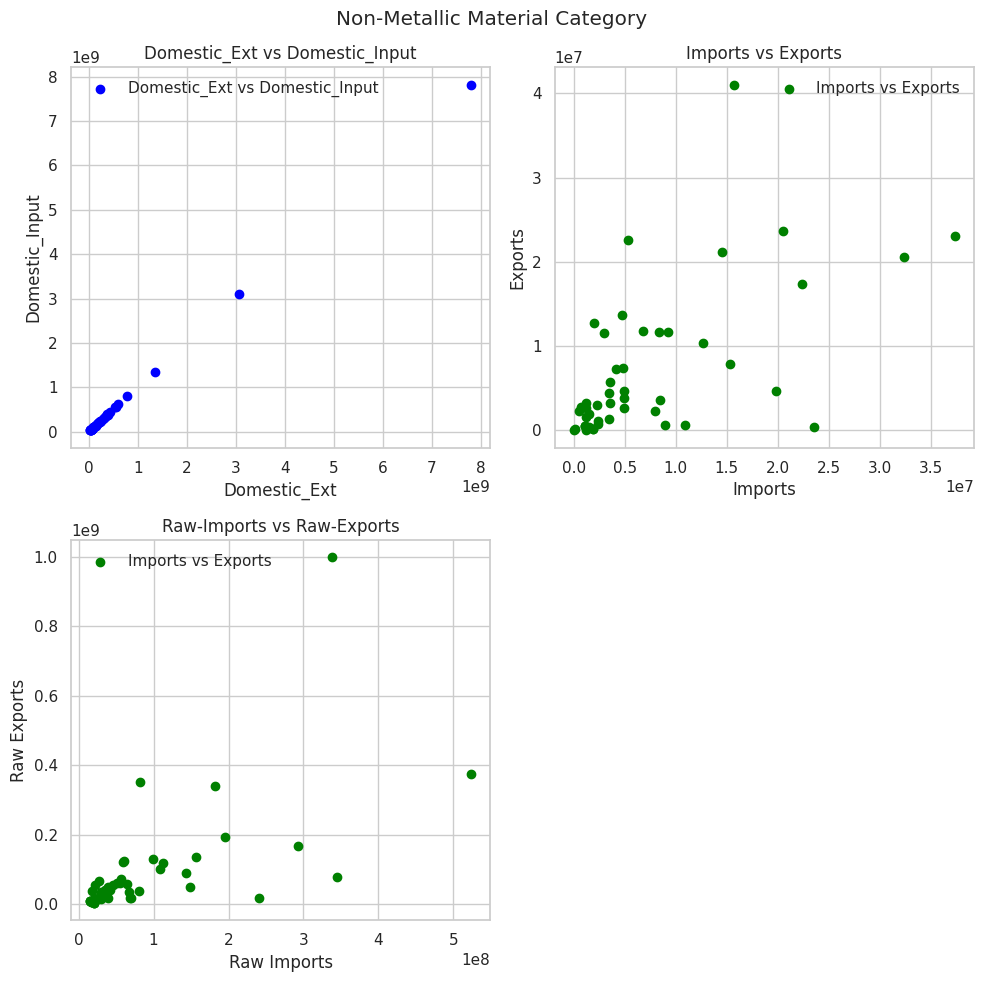

In [137]:
import mplcursors

# Plotting Domestic_Ext vs Domestic_Input
plt.figure(figsize=(10, 10))
plt.suptitle("Non-Metallic Material Category")

# Scatter plot 1
plt.subplot(2, 2, 1)
scatter1 = plt.scatter(clustering_data_nmm['Domestic_Ext'], clustering_data_nmm['Domestic_Input'], color='blue', label='Domestic_Ext vs Domestic_Input')
plt.title('Domestic_Ext vs Domestic_Input')
plt.xlabel('Domestic_Ext')
plt.ylabel('Domestic_Input')
plt.legend()

# Scatter plot 2
plt.subplot(2, 2, 2)
scatter2 = plt.scatter(clustering_data_nmm['Imports'], clustering_data_nmm['Exports'], color='green', label='Imports vs Exports')
plt.title('Imports vs Exports')
plt.xlabel('Imports')
plt.ylabel('Exports')
plt.legend()

# Scatter plot 3
plt.subplot(2, 2, 3)
scatter3 = plt.scatter(clustering_data_nmm['Raw_imports'], clustering_data_nmm['Raw_exports'], color='green', label='Imports vs Exports')
plt.title('Raw-Imports vs Raw-Exports')
plt.xlabel('Raw Imports')
plt.ylabel('Raw Exports')
plt.legend()

# Cursor hover functionality for each scatter plot
mplcursors.cursor(hover=True).connect("add", lambda sel: sel.annotation.set_text(f"{sel.artist.get_label()}: {sel.target[0]:.2f}, {sel.target[1]:.2f}"))

plt.tight_layout()
plt.show()


### **Data for Mixed_and_Complex_Products category:**

In [138]:
import pandas as pd

#######  AFGHANISTAN
afg_means_data_mp = {
    'Country': 'Afghanistan',
    'Domestic_Ext': afg_domestic_ext_mp.mean(),
    'Domestic_Input': afg_domestic_input_mp.mean(),
    'Imports': afg_imports_mp.mean(),
    'Exports': afg_exports_mp.mean(),
}
# Create a new dataframe
clustering_data_mp = pd.DataFrame([afg_means_data_mp])


#######  INDIA
ind_means_data_mp = {
    'Country': 'India',
    'Domestic_Ext': ind_domestic_ext_mp.mean(),
    'Domestic_Input': ind_domestic_input_mp.mean(),
    'Imports': ind_imports_mp.mean(),
    'Exports': ind_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(ind_means_data_mp, ignore_index=True)


#######  ARGENTINA
arg_means_data_mp = {
    'Country': 'Argentina',
    'Domestic_Ext': arg_domestic_ext_mp.mean(),
    'Domestic_Input': arg_domestic_input_mp.mean(),
    'Imports': arg_imports_mp.mean(),
    'Exports': arg_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(arg_means_data_mp, ignore_index=True)


#######  AUSTRALIA
aus_means_data_mp = {
    'Country': 'Australia',
    'Domestic_Ext': aus_domestic_ext_mp.mean(),
    'Domestic_Input': aus_domestic_input_mp.mean(),
    'Imports': aus_imports_mp.mean(),
    'Exports': aus_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(aus_means_data_mp, ignore_index=True)


#######  AUSTRIA
aust_means_data_mp = {
    'Country': 'Austria',
    'Domestic_Ext': aust_domestic_ext_mp.mean(),
    'Domestic_Input': aust_domestic_input_mp.mean(),
    'Imports': aust_imports_mp.mean(),
    'Exports': aust_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(aust_means_data_mp, ignore_index=True)


#######  BANGLADESH
bang_means_data_mp = {
    'Country': 'Bangladesh',
    'Domestic_Ext': bang_domestic_ext_mp.mean(),
    'Domestic_Input': bang_domestic_input_mp.mean(),
    'Imports': bang_imports_mp.mean(),
    'Exports': bang_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(bang_means_data_mp, ignore_index=True)


#######  BELGIUM
bel_means_data_mp = {
    'Country': 'Belgium',
    'Domestic_Ext': bel_domestic_ext_mp.mean(),
    'Domestic_Input': bel_domestic_input_mp.mean(),
    'Imports': bel_imports_mp.mean(),
    'Exports': bel_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(bel_means_data_mp, ignore_index=True)


#######  BRAZIL
bra_means_data_mp = {
    'Country': 'Brazil',
    'Domestic_Ext': bra_domestic_ext_mp.mean(),
    'Domestic_Input': bra_domestic_input_mp.mean(),
    'Imports': bra_imports_mp.mean(),
    'Exports': bra_exports_mp.mean(),

}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(bra_means_data_mp, ignore_index=True)


#######  CANADA
can_means_data_mp = {
    'Country': 'Canada',
    'Domestic_Ext': can_domestic_ext_mp.mean(),
    'Domestic_Input': can_domestic_input_mp.mean(),
    'Imports': can_imports_mp.mean(),
    'Exports': can_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(can_means_data_mp, ignore_index=True)


#######  CHILE
chi_means_data_mp = {
    'Country': 'Chile',
    'Domestic_Ext': chi_domestic_ext_mp.mean(),
    'Domestic_Input': chi_domestic_input_mp.mean(),
    'Imports': chi_imports_mp.mean(),
    'Exports': chi_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(chi_means_data_mp, ignore_index=True)


#######  CHINA
chin_means_data_mp = {
    'Country': 'China',
    'Domestic_Ext': chin_domestic_ext_mp.mean(),
    'Domestic_Input': chin_domestic_input_mp.mean(),
    'Imports': chin_imports_mp.mean(),
    'Exports': chin_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(chin_means_data_mp, ignore_index=True)


#######  COLOMBIA
col_means_data_mp = {
    'Country': 'Colombia',
    'Domestic_Ext': col_domestic_ext_mp.mean(),
    'Domestic_Input': col_domestic_input_mp.mean(),
    'Imports': col_imports_mp.mean(),
    'Exports': col_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(col_means_data_mp, ignore_index=True)


#######  DENMARK
den_means_data_mp = {
    'Country': 'Denmark',
    'Domestic_Ext': den_domestic_ext_mp.mean(),
    'Domestic_Input': den_domestic_input_mp.mean(),
    'Imports': den_imports_mp.mean(),
    'Exports': den_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(den_means_data_mp, ignore_index=True)


#######  EGYPT
egy_means_data_mp = {
    'Country': 'Egypt',
    'Domestic_Ext': egy_domestic_ext_mp.mean(),
    'Domestic_Input': egy_domestic_input_mp.mean(),
    'Imports': egy_imports_mp.mean(),
    'Exports': egy_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(egy_means_data_mp, ignore_index=True)


#######  FINLAND
fin_means_data_mp = {
    'Country': 'Finland',
    'Domestic_Ext': fin_domestic_ext_mp.mean(),
    'Domestic_Input': fin_domestic_input_mp.mean(),
    'Imports': fin_imports_mp.mean(),
    'Exports': fin_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(fin_means_data_mp, ignore_index=True)


#######  FRANCE
fra_means_data_mp = {
    'Country': 'France',
    'Domestic_Ext': fra_domestic_ext_mp.mean(),
    'Domestic_Input': fra_domestic_input_mp.mean(),
    'Imports': fra_imports_mp.mean(),
    'Exports': fra_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(fra_means_data_mp, ignore_index=True)


#######  GERMANY
ger_means_data_mp = {
    'Country': 'Germany',
    'Domestic_Ext': ger_domestic_ext_mp.mean(),
    'Domestic_Input': ger_domestic_input_mp.mean(),
    'Imports': ger_imports_mp.mean(),
    'Exports': ger_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(ger_means_data_mp, ignore_index=True)


#######  HongKong
hon_means_data_mp = {
    'Country': 'HongKong',
    'Domestic_Ext': hon_domestic_ext_mp.mean(),
    'Domestic_Input': hon_domestic_input_mp.mean(),
    'Imports': hon_imports_mp.mean(),
    'Exports': hon_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(hon_means_data_mp, ignore_index=True)


#######  INDONESIA
indo_means_data_mp = {
    'Country': 'Indonesia',
    'Domestic_Ext': indo_domestic_ext_mp.mean(),
    'Domestic_Input': indo_domestic_input_mp.mean(),
    'Imports': indo_imports_mp.mean(),
    'Exports': indo_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(indo_means_data_mp, ignore_index=True)


#######  IRAN
irn_means_data_mp = {
    'Country': 'Iran',
    'Domestic_Ext': irn_domestic_ext_mp.mean(),
    'Domestic_Input': irn_domestic_input_mp.mean(),
    'Imports': irn_imports_mp.mean(),
    'Exports': irn_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(irn_means_data_mp, ignore_index=True)


#######  IRAQ
irq_means_data_mp = {
    'Country': 'Iraq',
    'Domestic_Ext': irq_domestic_ext_mp.mean(),
    'Domestic_Input': irq_domestic_input_mp.mean(),
    'Imports': irq_imports_mp.mean(),
    'Exports': irq_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(irq_means_data_mp, ignore_index=True)


#######  IRELAND
ire_means_data_mp = {
    'Country': 'Ireland',
    'Domestic_Ext': ire_domestic_ext_mp.mean(),
    'Domestic_Input': ire_domestic_input_mp.mean(),
    'Imports': ire_imports_mp.mean(),
    'Exports': ire_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(ire_means_data_mp, ignore_index=True)


#######  ISRAEL
isr_means_data_mp = {
    'Country': 'Israel',
    'Domestic_Ext': isr_domestic_ext_mp.mean(),
    'Domestic_Input': isr_domestic_input_mp.mean(),
    'Imports': isr_imports_mp.mean(),
    'Exports': isr_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(isr_means_data_mp, ignore_index=True)


#######  ITALY
ita_means_data_mp = {
    'Country': 'Italy',
    'Domestic_Ext': ita_domestic_ext_mp.mean(),
    'Domestic_Input': ita_domestic_input_mp.mean(),
    'Imports': ita_imports_mp.mean(),
    'Exports': ita_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(ita_means_data_mp, ignore_index=True)


#######  JAPAN
jap_means_data_mp = {
    'Country': 'Japan',
    'Domestic_Ext': jap_domestic_ext_mp.mean(),
    'Domestic_Input': jap_domestic_input_mp.mean(),
    'Imports': jap_imports_mp.mean(),
    'Exports': jap_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(jap_means_data_mp, ignore_index=True)


#######  MALAYSIA
mal_means_data_mp = {
    'Country': 'Malaysia',
    'Domestic_Ext': mal_domestic_ext_mp.mean(),
    'Domestic_Input': mal_domestic_input_mp.mean(),
    'Imports': mal_imports_mp.mean(),
    'Exports': mal_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(mal_means_data_mp, ignore_index=True)


#######  MEXICO
mex_means_data_mp = {
    'Country': 'Mexico',
    'Domestic_Ext': mex_domestic_ext_mp.mean(),
    'Domestic_Input': mex_domestic_input_mp.mean(),
    'Imports': mex_imports_mp.mean(),
    'Exports': mex_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(mex_means_data_mp, ignore_index=True)


#######  NETHERLANDS
neth_means_data_mp = {
    'Country': 'Netherlands',
    'Domestic_Ext': neth_domestic_ext_mp.mean(),
    'Domestic_Input': neth_domestic_input_mp.mean(),
    'Imports': neth_imports_mp.mean(),
    'Exports': neth_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(neth_means_data_mp, ignore_index=True)


#######  NIGERIA
nig_means_data_mp = {
    'Country': 'Nigeria',
    'Domestic_Ext': nig_domestic_ext_mp.mean(),
    'Domestic_Input': nig_domestic_input_mp.mean(),
    'Imports': nig_imports_mp.mean(),
    'Exports': nig_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(nig_means_data_mp, ignore_index=True)


#######  NORWAY
nor_means_data_mp = {
    'Country': 'Norway',
    'Domestic_Ext': nor_domestic_ext_mp.mean(),
    'Domestic_Input': nor_domestic_input_mp.mean(),
    'Imports': nor_imports_mp.mean(),
    'Exports': nor_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(nor_means_data_mp, ignore_index=True)


#######  PAKISTAN
pak_means_data_mp = {
    'Country': 'Pakistan',
    'Domestic_Ext': pak_domestic_ext_mp.mean(),
    'Domestic_Input': pak_domestic_input_mp.mean(),
    'Imports': pak_imports_mp.mean(),
    'Exports': pak_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(pak_means_data_mp, ignore_index=True)


#######  PHILIPPINES
phi_means_data_mp = {
    'Country': 'Philippines',
    'Domestic_Ext': phi_domestic_ext_mp.mean(),
    'Domestic_Input': phi_domestic_input_mp.mean(),
    'Imports': phi_imports_mp.mean(),
    'Exports': phi_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(phi_means_data_mp, ignore_index=True)


#######  POLAND
pol_means_data_mp = {
    'Country': 'Poland',
    'Domestic_Ext': pol_domestic_ext_mp.mean(),
    'Domestic_Input': pol_domestic_input_mp.mean(),
    'Imports': pol_imports_mp.mean(),
    'Exports': pol_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(pol_means_data_mp, ignore_index=True)


#######  ROMANIA
rom_means_data_mp = {
    'Country': 'Romania',
    'Domestic_Ext': rom_domestic_ext_mp.mean(),
    'Domestic_Input': rom_domestic_input_mp.mean(),
    'Imports': rom_imports_mp.mean(),
    'Exports': rom_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(rom_means_data_mp, ignore_index=True)


#######  RUSSIA
rus_means_data_mp = {
    'Country': 'Russia',
    'Domestic_Ext': rus_domestic_ext_mp.mean(),
    'Domestic_Input': rus_domestic_input_mp.mean(),
    'Imports': rus_imports_mp.mean(),
    'Exports': rus_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(rus_means_data_mp, ignore_index=True)


#######  SAUDI ARABIA
sau_means_data_mp = {
    'Country': 'Saudi Arabia',
    'Domestic_Ext': sau_domestic_ext_mp.mean(),
    'Domestic_Input': sau_domestic_input_mp.mean(),
    'Imports': sau_imports_mp.mean(),
    'Exports': sau_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(sau_means_data_mp, ignore_index=True)


#######  SINGAPORE
sin_means_data_mp = {
    'Country': 'Singapore',
    'Domestic_Ext': sin_domestic_ext_mp.mean(),
    'Domestic_Input': sin_domestic_input_mp.mean(),
    'Imports': sin_imports_mp.mean(),
    'Exports': sin_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(sin_means_data_mp, ignore_index=True)


#######  SOUTH AFRICA
sou_means_data_mp = {
    'Country': 'South Africa',
    'Domestic_Ext': sou_domestic_ext_mp.mean(),
    'Domestic_Input': sou_domestic_input_mp.mean(),
    'Imports': sou_imports_mp.mean(),
    'Exports': sou_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(sou_means_data_mp, ignore_index=True)


#######  SOUTH KOREA
souk_means_data_mp = {
    'Country': 'South Korea',
    'Domestic_Ext': souk_domestic_ext_mp.mean(),
    'Domestic_Input': souk_domestic_input_mp.mean(),
    'Imports': souk_imports_mp.mean(),
    'Exports': souk_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(souk_means_data_mp, ignore_index=True)


#######  SPAIN
spa_means_data_mp = {
    'Country': 'Spain',
    'Domestic_Ext': spa_domestic_ext_mp.mean(),
    'Domestic_Input': spa_domestic_input_mp.mean(),
    'Imports': spa_imports_mp.mean(),
    'Exports': spa_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(spa_means_data_mp, ignore_index=True)


#######  Sweden
swe_means_data_mp = {
    'Country': 'Sweden',
    'Domestic_Ext': swe_domestic_ext_mp.mean(),
    'Domestic_Input': swe_domestic_input_mp.mean(),
    'Imports': swe_imports_mp.mean(),
    'Exports': swe_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(swe_means_data_mp, ignore_index=True)


#######  Switzerland
swi_means_data_mp = {
    'Country': 'Switzerland',
    'Domestic_Ext': swi_domestic_ext_mp.mean(),
    'Domestic_Input': swi_domestic_input_mp.mean(),
    'Imports': swi_imports_mp.mean(),
    'Exports': swi_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(swi_means_data_mp, ignore_index=True)


#######  TAIWAN
tai_means_data_mp = {
    'Country': 'Taiwan',
    'Domestic_Ext': tai_domestic_ext_mp.mean(),
    'Domestic_Input': tai_domestic_input_mp.mean(),
    'Imports': tai_imports_mp.mean(),
    'Exports': tai_exports_mp.mean()
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(tai_means_data_mp, ignore_index=True)


#######  THAILAND
thai_means_data_mp = {
    'Country': 'Thailand',
    'Domestic_Ext': thai_domestic_ext_mp.mean(),
    'Domestic_Input': thai_domestic_input_mp.mean(),
    'Imports': thai_imports_mp.mean(),
    'Exports': thai_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(thai_means_data_mp, ignore_index=True)


#######  TURKEY
tur_means_data_mp = {
    'Country': 'Turkey',
    'Domestic_Ext': tur_domestic_ext_mp.mean(),
    'Domestic_Input': tur_domestic_input_mp.mean(),
    'Imports': tur_imports_mp.mean(),
    'Exports': tur_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(tur_means_data_mp, ignore_index=True)


#######  UNITED ARAB EMIRATES
uae_means_data_mp = {
    'Country': 'United Arab Emirates',
    'Domestic_Ext': uae_domestic_ext_mp.mean(),
    'Domestic_Input': uae_domestic_input_mp.mean(),
    'Imports': uae_imports_mp.mean(),
    'Exports': uae_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(uae_means_data_mp, ignore_index=True)


#######  UNITED STATES OF AMERICA
usa_means_data_mp = {
    'Country': 'United States of America',
    'Domestic_Ext': usa_domestic_ext_mp.mean(),
    'Domestic_Input': usa_domestic_input_mp.mean(),
    'Imports': usa_imports_mp.mean(),
    'Exports': usa_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(usa_means_data_mp, ignore_index=True)


#######  UNITED KINGDOM
uk_means_data_mp = {
    'Country': 'United Kingdom',
    'Domestic_Ext': uk_domestic_ext_mp.mean(),
    'Domestic_Input': uk_domestic_input_mp.mean(),
    'Imports': uk_imports_mp.mean(),
    'Exports': uk_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(uk_means_data_mp, ignore_index=True)


#######  VENEZUELA
ven_means_data_mp = {
    'Country': 'Venezuela',
    'Domestic_Ext': ven_domestic_ext_mp.mean(),
    'Domestic_Input': ven_domestic_input_mp.mean(),
    'Imports': ven_imports_mp.mean(),
    'Exports': ven_exports_mp.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_mp = clustering_data_mp.append(ven_means_data_mp, ignore_index=True)

# Display the updated dataframe
clustering_data_mp

,Country,Domestic_Ext,Domestic_Input,Imports,Exports
0,Afghanistan,0.0,659978.60,659978.60,2896114.22
1,India,0.0,9774461.96,9774461.96,12317181.40
2,Argentina,0.0,659978.60,659978.60,2896114.22
3,Australia,0.0,5100300.56,5100300.56,4372504.82
4,Austria,0.0,3814879.54,3814879.54,5161624.72
5,Bangladesh,0.0,456860.48,456860.48,111831.28
6,Belgium,0.0,456860.48,456860.48,111831.28
7,Brazil,0.0,6515418.96,6515418.96,4690765.40
8,Canada,0.0,7282909.94,7282909.94,11664553.46
9,Chile,0.0,2179412.06,2179412.06,1033234.34


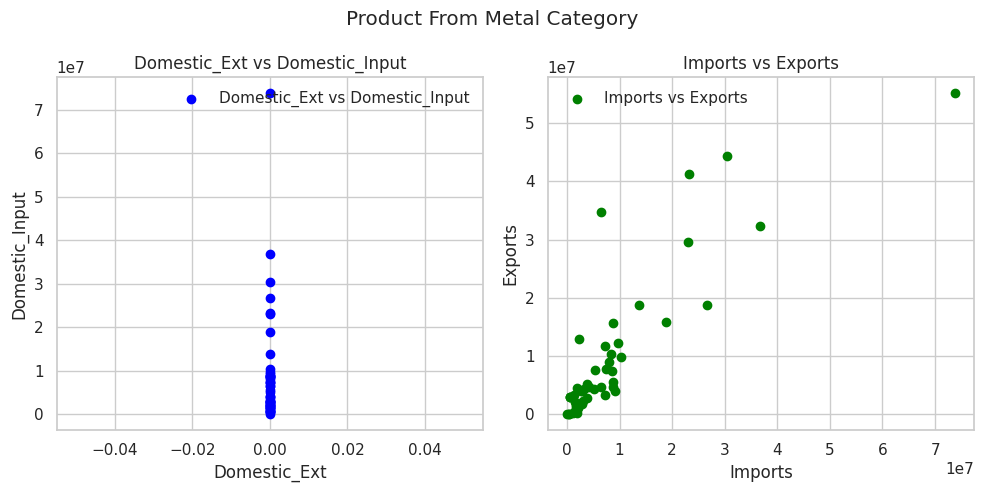

In [139]:
# Plotting Domestic_Ext vs Domestic_Input
plt.figure(figsize=(10, 5))
plt.suptitle("Product From Metal Category")
plt.subplot(1, 2, 1)
plt.scatter(clustering_data_mp['Domestic_Ext'], clustering_data_mp['Domestic_Input'], color='blue', label='Domestic_Ext vs Domestic_Input')
plt.title('Domestic_Ext vs Domestic_Input')
plt.xlabel('Domestic_Ext')
plt.ylabel('Domestic_Input')
plt.legend()

# Plotting Imports vs Exports
plt.subplot(1, 2, 2)
plt.scatter(clustering_data_mp['Imports'], clustering_data_mp['Exports'], color='green', label='Imports vs Exports')
plt.title('Imports vs Exports')
plt.xlabel('Imports')
plt.ylabel('Exports')
plt.legend()

plt.tight_layout()
plt.show()

### **Data for Products_from_Metals Category:**

In [140]:
import pandas as pd

#######  AFGHANISTAN
afg_means_data_pfm = {
    'Country': 'Afghanistan',
    'Domestic_Ext': afg_domestic_ext_pfm.mean(),
    'Domestic_Input': afg_domestic_input_pfm.mean(),
    'Imports': afg_imports_pfm.mean(),
    'Exports': afg_exports_pfm.mean(),
}
# Create a new dataframe
clustering_data_pfm = pd.DataFrame([afg_means_data_pfm])


#######  INDIA
ind_means_data_pfm = {
    'Country': 'India',
    'Domestic_Ext': ind_domestic_ext_pfm.mean(),
    'Domestic_Input': ind_domestic_input_pfm.mean(),
    'Imports': ind_imports_pfm.mean(),
    'Exports': ind_exports_pfm.mean(),
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_pfm = clustering_data_pfm.append(ind_means_data_pfm, ignore_index=True)


#######  ARGENTINA
arg_means_data_pfm = {
    'Country': 'Argentina',
    'Domestic_Ext': arg_domestic_ext_pfm.mean(),
    'Domestic_Input': arg_domestic_input_pfm.mean(),
    'Imports': arg_imports_pfm.mean(),
    'Exports': arg_exports_pfm.mean(),
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_pfm = clustering_data_pfm.append(arg_means_data_pfm, ignore_index=True)


#######  AUSTRALIA
aus_means_data_pfm = {
    'Country': 'Australia',
    'Domestic_Ext': aus_domestic_ext_pfm.mean(),
    'Domestic_Input': aus_domestic_input_pfm.mean(),
    'Imports': aus_imports_pfm.mean(),
    'Exports': aus_exports_pfm.mean(),
}
# Append India's data to the clustering_data_fossil dataframe
clustering_data_pfm = clustering_data_pfm.append(aus_means_data_pfm, ignore_index=True)


#######  BANGLADESH
bang_means_data_pfm = {
    'Country': 'Bangladesh',
    'Domestic_Ext': bang_domestic_ext_pfm.mean(),
    'Domestic_Input': bang_domestic_input_pfm.mean(),
    'Imports': bang_imports_pfm.mean(),
    'Exports': bang_exports_pfm.mean(),
}
# Append India's data to the clustering_data_mp dataframe
clustering_data_pfm = clustering_data_pfm.append(bang_means_data_pfm, ignore_index=True)


#######  BELGIUM
bel_means_data_pfm = {
    'Country': 'Belgium',
    'Domestic_Ext': bel_domestic_ext_pfm.mean(),
    'Domestic_Input': bel_domestic_input_pfm.mean(),
    'Imports': bel_imports_pfm.mean(),
    'Exports': bel_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(bel_means_data_pfm, ignore_index=True)


#######  BRAZIL
bra_means_data_pfm = {
    'Country': 'Brazil',
    'Domestic_Ext': bra_domestic_ext_pfm.mean(),
    'Domestic_Input': bra_domestic_input_pfm.mean(),
    'Imports': bra_imports_pfm.mean(),
    'Exports': bra_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(bra_means_data_pfm, ignore_index=True)


#######  CANADA
can_means_data_pfm = {
    'Country': 'Canada',
    'Domestic_Ext': can_domestic_ext_pfm.mean(),
    'Domestic_Input': can_domestic_input_pfm.mean(),
    'Imports': can_imports_pfm.mean(),
    'Exports': can_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(can_means_data_pfm, ignore_index=True)


#######  CHILE
chi_means_data_pfm = {
    'Country': 'Chile',
    'Domestic_Ext': chi_domestic_ext_pfm.mean(),
    'Domestic_Input': chi_domestic_input_pfm.mean(),
    'Imports': chi_imports_pfm.mean(),
    'Exports': chi_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(chi_means_data_pfm, ignore_index=True)


#######  CHINA
chin_means_data_pfm = {
    'Country': 'China',
    'Domestic_Ext': chin_domestic_ext_pfm.mean(),
    'Domestic_Input': chin_domestic_input_pfm.mean(),
    'Imports': chin_imports_pfm.mean(),
    'Exports': chin_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(chin_means_data_pfm, ignore_index=True)


#######  COLOMBIA
col_means_data_pfm = {
    'Country': 'Colombia',
    'Domestic_Ext': col_domestic_ext_pfm.mean(),
    'Domestic_Input': col_domestic_input_pfm.mean(),
    'Imports': col_imports_pfm.mean(),
    'Exports': col_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(col_means_data_pfm, ignore_index=True)


#######  DENMARK
den_means_data_pfm = {
    'Country': 'Denmark',
    'Domestic_Ext': den_domestic_ext_pfm.mean(),
    'Domestic_Input': den_domestic_input_pfm.mean(),
    'Imports': den_imports_pfm.mean(),
    'Exports': den_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(den_means_data_pfm, ignore_index=True)


#######  EGYPT
egy_means_data_pfm = {
    'Country': 'Egypt',
    'Domestic_Ext': egy_domestic_ext_pfm.mean(),
    'Domestic_Input': egy_domestic_input_pfm.mean(),
    'Imports': egy_imports_pfm.mean(),
    'Exports': egy_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(egy_means_data_pfm, ignore_index=True)


#######  FINLAND
fin_means_data_pfm = {
    'Country': 'Finland',
    'Domestic_Ext': fin_domestic_ext_pfm.mean(),
    'Domestic_Input': fin_domestic_input_pfm.mean(),
    'Imports': fin_imports_pfm.mean(),
    'Exports': fin_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(fin_means_data_pfm, ignore_index=True)


#######  FRANCE
fra_means_data_pfm = {
    'Country': 'France',
    'Domestic_Ext': fra_domestic_ext_pfm.mean(),
    'Domestic_Input': fra_domestic_input_pfm.mean(),
    'Imports': fra_imports_pfm.mean(),
    'Exports': fra_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(fra_means_data_pfm, ignore_index=True)


#######  GERMANY
ger_means_data_pfm = {
    'Country': 'Germany',
    'Domestic_Ext': ger_domestic_ext_pfm.mean(),
    'Domestic_Input': ger_domestic_input_pfm.mean(),
    'Imports': ger_imports_pfm.mean(),
    'Exports': ger_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(ger_means_data_pfm, ignore_index=True)


#######  HongKong
hon_means_data_pfm = {
    'Country': 'HongKong',
    'Domestic_Ext': hon_domestic_ext_pfm.mean(),
    'Domestic_Input': hon_domestic_input_pfm.mean(),
    'Imports': hon_imports_pfm.mean(),
    'Exports': hon_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(hon_means_data_pfm, ignore_index=True)


#######  INDONESIA
indo_means_data_pfm = {
    'Country': 'Indonesia',
    'Domestic_Ext': indo_domestic_ext_pfm.mean(),
    'Domestic_Input': indo_domestic_input_pfm.mean(),
    'Imports': indo_imports_pfm.mean(),
    'Exports': indo_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(indo_means_data_pfm, ignore_index=True)


#######  IRAN
irn_means_data_pfm = {
    'Country': 'Iran',
    'Domestic_Ext': irn_domestic_ext_pfm.mean(),
    'Domestic_Input': irn_domestic_input_pfm.mean(),
    'Imports': irn_imports_pfm.mean(),
    'Exports': irn_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(irn_means_data_pfm, ignore_index=True)


#######  IRAQ
irq_means_data_pfm = {
    'Country': 'Iraq',
    'Domestic_Ext': irq_domestic_ext_pfm.mean(),
    'Domestic_Input': irq_domestic_input_pfm.mean(),
    'Imports': irq_imports_pfm.mean(),
    'Exports': irq_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(irq_means_data_pfm, ignore_index=True)


#######  IRELAND
ire_means_data_pfm = {
    'Country': 'Ireland',
    'Domestic_Ext': ire_domestic_ext_pfm.mean(),
    'Domestic_Input': ire_domestic_input_pfm.mean(),
    'Imports': ire_imports_pfm.mean(),
    'Exports': ire_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(ire_means_data_pfm, ignore_index=True)


#######  ISRAEL
isr_means_data_pfm = {
    'Country': 'Israel',
    'Domestic_Ext': isr_domestic_ext_pfm.mean(),
    'Domestic_Input': isr_domestic_input_pfm.mean(),
    'Imports': isr_imports_pfm.mean(),
    'Exports': isr_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(isr_means_data_pfm, ignore_index=True)


#######  ITALY
ita_means_data_pfm = {
    'Country': 'Italy',
    'Domestic_Ext': ita_domestic_ext_pfm.mean(),
    'Domestic_Input': ita_domestic_input_pfm.mean(),
    'Imports': ita_imports_pfm.mean(),
    'Exports': ita_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(ita_means_data_pfm, ignore_index=True)


#######  JAPAN
jap_means_data_pfm = {
    'Country': 'Japan',
    'Domestic_Ext': jap_domestic_ext_pfm.mean(),
    'Domestic_Input': jap_domestic_input_pfm.mean(),
    'Imports': jap_imports_pfm.mean(),
    'Exports': jap_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(jap_means_data_pfm, ignore_index=True)


#######  MALAYSIA
mal_means_data_pfm = {
    'Country': 'Malaysia',
    'Domestic_Ext': mal_domestic_ext_pfm.mean(),
    'Domestic_Input': mal_domestic_input_pfm.mean(),
    'Imports': mal_imports_pfm.mean(),
    'Exports': mal_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(mal_means_data_pfm, ignore_index=True)


#######  MEXICO
mex_means_data_pfm = {
    'Country': 'Mexico',
    'Domestic_Ext': mex_domestic_ext_pfm.mean(),
    'Domestic_Input': mex_domestic_input_pfm.mean(),
    'Imports': mex_imports_pfm.mean(),
    'Exports': mex_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(mex_means_data_pfm, ignore_index=True)


#######  NETHERLANDS
neth_means_data_pfm = {
    'Country': 'Netherlands',
    'Domestic_Ext': neth_domestic_ext_pfm.mean(),
    'Domestic_Input': neth_domestic_input_pfm.mean(),
    'Imports': neth_imports_pfm.mean(),
    'Exports': neth_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(neth_means_data_pfm, ignore_index=True)


#######  NIGERIA
nig_means_data_pfm = {
    'Country': 'Nigeria',
    'Domestic_Ext': nig_domestic_ext_pfm.mean(),
    'Domestic_Input': nig_domestic_input_pfm.mean(),
    'Imports': nig_imports_pfm.mean(),
    'Exports': nig_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(nig_means_data_pfm, ignore_index=True)


#######  NORWAY
nor_means_data_pfm = {
    'Country': 'Norway',
    'Domestic_Ext': nor_domestic_ext_pfm.mean(),
    'Domestic_Input': nor_domestic_input_pfm.mean(),
    'Imports': nor_imports_pfm.mean(),
    'Exports': nor_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(nor_means_data_pfm, ignore_index=True)


#######  PAKISTAN
pak_means_data_pfm = {
    'Country': 'Pakistan',
    'Domestic_Ext': pak_domestic_ext_pfm.mean(),
    'Domestic_Input': pak_domestic_input_pfm.mean(),
    'Imports': pak_imports_pfm.mean(),
    'Exports': pak_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(pak_means_data_pfm, ignore_index=True)


#######  PHILIPPINES
phi_means_data_pfm = {
    'Country': 'Philippines',
    'Domestic_Ext': phi_domestic_ext_pfm.mean(),
    'Domestic_Input': phi_domestic_input_pfm.mean(),
    'Imports': phi_imports_pfm.mean(),
    'Exports': phi_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(phi_means_data_pfm, ignore_index=True)


#######  POLAND
pol_means_data_pfm = {
    'Country': 'Poland',
    'Domestic_Ext': pol_domestic_ext_pfm.mean(),
    'Domestic_Input': pol_domestic_input_pfm.mean(),
    'Imports': pol_imports_pfm.mean(),
    'Exports': pol_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(pol_means_data_pfm, ignore_index=True)


#######  ROMANIA
rom_means_data_pfm = {
    'Country': 'Romania',
    'Domestic_Ext': rom_domestic_ext_pfm.mean(),
    'Domestic_Input': rom_domestic_input_pfm.mean(),
    'Imports': rom_imports_pfm.mean(),
    'Exports': rom_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(rom_means_data_pfm, ignore_index=True)


#######  RUSSIA
rus_means_data_pfm = {
    'Country': 'Russia',
    'Domestic_Ext': rus_domestic_ext_pfm.mean(),
    'Domestic_Input': rus_domestic_input_pfm.mean(),
    'Imports': rus_imports_pfm.mean(),
    'Exports': rus_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(rus_means_data_pfm, ignore_index=True)


#######  SAUDI ARABIA
sau_means_data_pfm = {
    'Country': 'Saudi Arabia',
    'Domestic_Ext': sau_domestic_ext_pfm.mean(),
    'Domestic_Input': sau_domestic_input_pfm.mean(),
    'Imports': sau_imports_pfm.mean(),
    'Exports': sau_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(sau_means_data_pfm, ignore_index=True)


#######  SINGAPORE
sin_means_data_pfm = {
    'Country': 'Singapore',
    'Domestic_Ext': sin_domestic_ext_pfm.mean(),
    'Domestic_Input': sin_domestic_input_pfm.mean(),
    'Imports': sin_imports_pfm.mean(),
    'Exports': sin_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(sin_means_data_pfm, ignore_index=True)


#######  SOUTH AFRICA
sou_means_data_pfm = {
    'Country': 'South Africa',
    'Domestic_Ext': sou_domestic_ext_pfm.mean(),
    'Domestic_Input': sou_domestic_input_pfm.mean(),
    'Imports': sou_imports_pfm.mean(),
    'Exports': sou_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(sou_means_data_pfm, ignore_index=True)


#######  SOUTH KOREA
souk_means_data_pfm = {
    'Country': 'South Korea',
    'Domestic_Ext': souk_domestic_ext_pfm.mean(),
    'Domestic_Input': souk_domestic_input_pfm.mean(),
    'Imports': souk_imports_pfm.mean(),
    'Exports': souk_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(souk_means_data_pfm, ignore_index=True)


#######  SPAIN
spa_means_data_pfm = {
    'Country': 'Spain',
    'Domestic_Ext': spa_domestic_ext_pfm.mean(),
    'Domestic_Input': spa_domestic_input_pfm.mean(),
    'Imports': spa_imports_pfm.mean(),
    'Exports': spa_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(spa_means_data_pfm, ignore_index=True)


#######  Sweden
swe_means_data_pfm = {
    'Country': 'Sweden',
    'Domestic_Ext': swe_domestic_ext_pfm.mean(),
    'Domestic_Input': swe_domestic_input_pfm.mean(),
    'Imports': swe_imports_pfm.mean(),
    'Exports': swe_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(swe_means_data_pfm, ignore_index=True)


#######  Switzerland
swi_means_data_pfm = {
    'Country': 'Switzerland',
    'Domestic_Ext': swi_domestic_ext_pfm.mean(),
    'Domestic_Input': swi_domestic_input_pfm.mean(),
    'Imports': swi_imports_pfm.mean(),
    'Exports': swi_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(swi_means_data_pfm, ignore_index=True)


#######  TAIWAN
tai_means_data_pfm = {
    'Country': 'Taiwan',
    'Domestic_Ext': tai_domestic_ext_pfm.mean(),
    'Domestic_Input': tai_domestic_input_pfm.mean(),
    'Imports': tai_imports_pfm.mean(),
    'Exports': tai_exports_pfm.mean()
}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(tai_means_data_pfm, ignore_index=True)


#######  THAILAND
thai_means_data_pfm = {
    'Country': 'Thailand',
    'Domestic_Ext': thai_domestic_ext_pfm.mean(),
    'Domestic_Input': thai_domestic_input_pfm.mean(),
    'Imports': thai_imports_pfm.mean(),
    'Exports': thai_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(thai_means_data_pfm, ignore_index=True)


#######  TURKEY
tur_means_data_pfm = {
    'Country': 'Turkey',
    'Domestic_Ext': tur_domestic_ext_pfm.mean(),
    'Domestic_Input': tur_domestic_input_pfm.mean(),
    'Imports': tur_imports_pfm.mean(),
    'Exports': tur_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(tur_means_data_pfm, ignore_index=True)


#######  UNITED ARAB EMIRATES
uae_means_data_pfm = {
    'Country': 'United Arab Emirates',
    'Domestic_Ext': uae_domestic_ext_pfm.mean(),
    'Domestic_Input': uae_domestic_input_pfm.mean(),
    'Imports': uae_imports_pfm.mean(),
    'Exports': uae_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(uae_means_data_pfm, ignore_index=True)


#######  UNITED STATES OF AMERICA
usa_means_data_pfm = {
    'Country': 'United States of America',
    'Domestic_Ext': usa_domestic_ext_pfm.mean(),
    'Domestic_Input': usa_domestic_input_pfm.mean(),
    'Imports': usa_imports_pfm.mean(),
    'Exports': usa_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(usa_means_data_pfm, ignore_index=True)


#######  UNITED KINGDOM
uk_means_data_pfm = {
    'Country': 'United Kingdom',
    'Domestic_Ext': uk_domestic_ext_pfm.mean(),
    'Domestic_Input': uk_domestic_input_pfm.mean(),
    'Imports': uk_imports_pfm.mean(),
    'Exports': uk_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(uk_means_data_pfm, ignore_index=True)


#######  VENEZUELA
ven_means_data_pfm = {
    'Country': 'Venezuela',
    'Domestic_Ext': ven_domestic_ext_pfm.mean(),
    'Domestic_Input': ven_domestic_input_pfm.mean(),
    'Imports': ven_imports_pfm.mean(),
    'Exports': ven_exports_pfm.mean(),

}
# Append India's data to the clustering_data_pfm dataframe
clustering_data_pfm = clustering_data_pfm.append(ven_means_data_pfm, ignore_index=True)

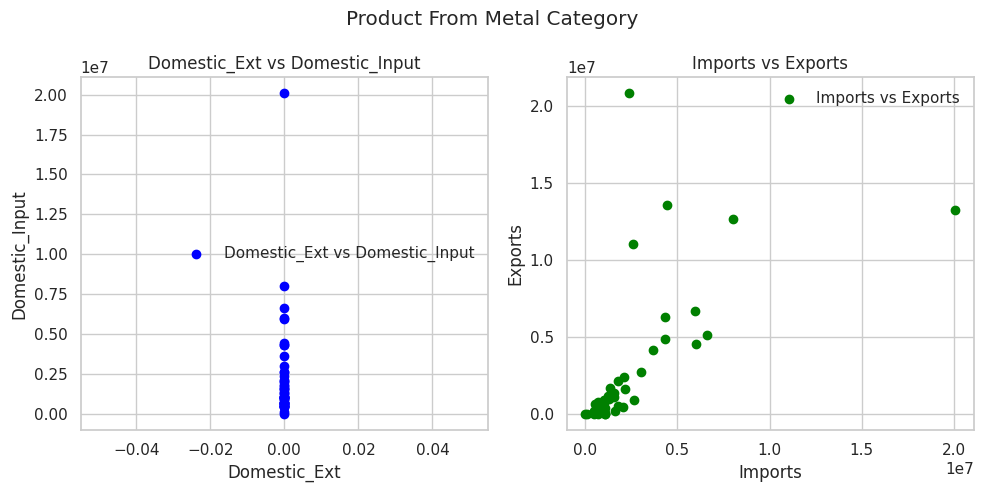

In [141]:
# Plotting Domestic_Ext vs Domestic_Input
plt.figure(figsize=(10, 5))
plt.suptitle("Product From Metal Category")
plt.subplot(1, 2, 1)
plt.scatter(clustering_data_pfm['Domestic_Ext'], clustering_data_pfm['Domestic_Input'], color='blue', label='Domestic_Ext vs Domestic_Input')
plt.title('Domestic_Ext vs Domestic_Input')
plt.xlabel('Domestic_Ext')
plt.ylabel('Domestic_Input')
plt.legend()

# Plotting Imports vs Exports
plt.subplot(1, 2, 2)
plt.scatter(clustering_data_pfm['Imports'], clustering_data_pfm['Exports'], color='green', label='Imports vs Exports')
plt.title('Imports vs Exports')
plt.xlabel('Imports')
plt.ylabel('Exports')
plt.legend()

plt.tight_layout()
plt.show()

##**Clustering**



In [142]:
clustering_data_fossil['Raw_imports'].fillna(0, inplace=True)
clustering_data_fossil['Raw_exports'].fillna(0, inplace=True)
clustering_data_metalore['Raw_imports'].fillna(0, inplace=True)
clustering_data_metalore['Raw_exports'].fillna(0, inplace=True)
clustering_data_nmm['Raw_imports'].fillna(0, inplace=True)
clustering_data_nmm['Raw_exports'].fillna(0, inplace=True)

### **Clustering for Fossil Fuel Material Category:**

**Standard Scaling:**

In [143]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import seaborn as sns
import matplotlib.pyplot as plt

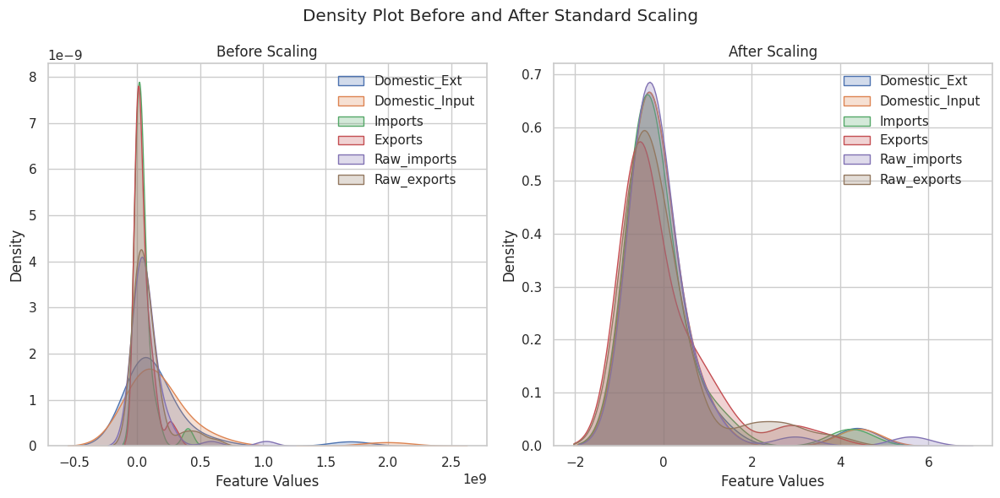

In [144]:
numeric_columns = clustering_data_fossil.columns[1:]  # Exclude the 'Country' column
# Extract the features for scaling
features_before_scaling = clustering_data_fossil[numeric_columns]


# Apply Standard scaling
scaler = StandardScaler()
features_after_scaling = scaler.fit_transform(features_before_scaling)

# Create DataFrames with scaled features
df_standard_scaled = pd.DataFrame(features_after_scaling, columns=numeric_columns)
df_before_scaling = pd.DataFrame(features_before_scaling, columns=numeric_columns)

# Visualize the density before and after scaling
plt.figure(figsize=(12, 6))
plt.suptitle('Density Plot Before and After Standard Scaling')

# Plotting before scaling
plt.subplot(1, 2, 1)
for column in numeric_columns:
    sns.kdeplot(df_before_scaling[column], label=column, fill=True)
plt.title('Before Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

# Plotting after scaling
plt.subplot(1, 2, 2)
for column in numeric_columns:
    sns.kdeplot(df_standard_scaled[column], label=column, fill=True)
plt.title('After Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()


In [145]:
clustering_data_fossil_scaled = df_standard_scaled
clustering_data_fossil_scaled.columns
clustering_data_fossil_scaled_kmeans = clustering_data_fossil_scaled.copy()
clustering_data_fossil_scaled_hier_agg = clustering_data_fossil_scaled.copy()
clustering_data_fossil_scaled_dbscan = clustering_data_fossil_scaled.copy()

**K-Means Clustering:**

In [146]:
from sklearn.cluster import KMeans
# Initialize and fit the K-Means model
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(clustering_data_fossil_scaled_kmeans)

KMeans(n_clusters=3, random_state=42)

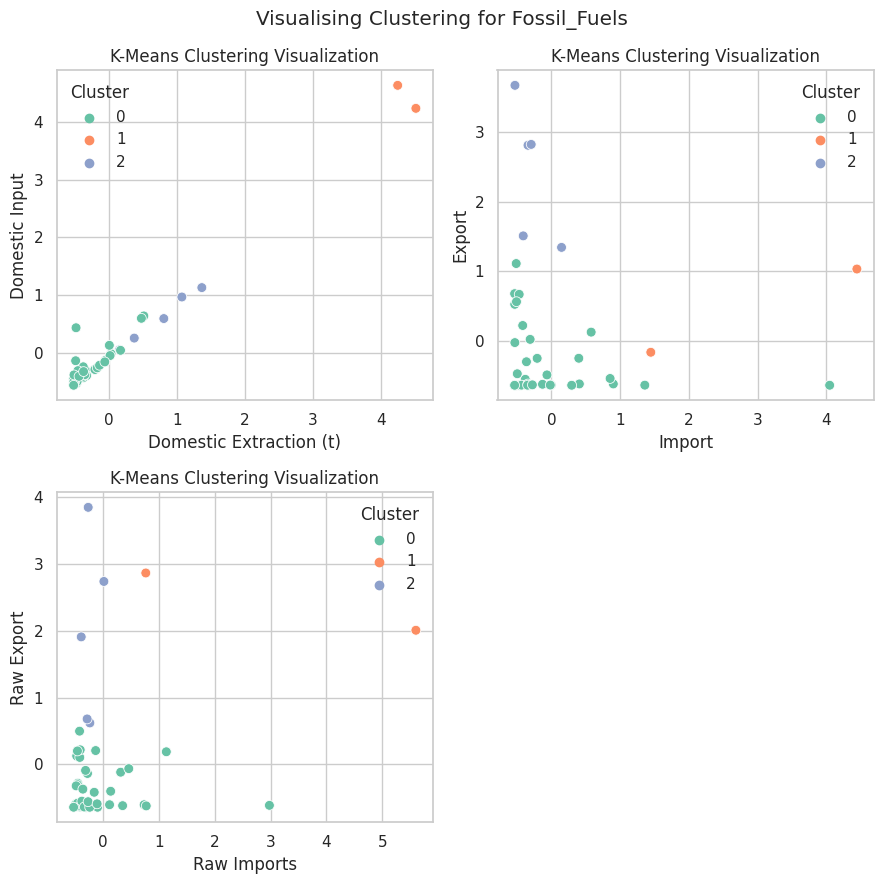

In [147]:
# Add cluster labels to the DataFrame
clustering_data_fossil_scaled_kmeans['Cluster'] = kmeans.labels_

# Plot the clusters in 2D
plt.figure(figsize=(9, 9))
plt.suptitle("Visualising Clustering for Fossil_Fuels")
plt.subplot(2,2,1)
sns.scatterplot(x =clustering_data_fossil_scaled_kmeans['Domestic_Ext'], y=clustering_data_fossil_scaled_kmeans['Domestic_Input'], hue=clustering_data_fossil_scaled_kmeans['Cluster'], palette='Set2', s=50)
plt.title('K-Means Clustering Visualization')
plt.xlabel('Domestic Extraction (t)')
plt.ylabel('Domestic Input')
plt.legend(title='Cluster')

plt.subplot(2,2,2)
sns.scatterplot(x =clustering_data_fossil_scaled_kmeans['Imports'], y=clustering_data_fossil_scaled_kmeans['Exports'], hue=clustering_data_fossil_scaled_kmeans['Cluster'], palette='Set2', s=50)
plt.title('K-Means Clustering Visualization')
plt.xlabel('Import')
plt.ylabel('Export')
plt.legend(title='Cluster')

plt.subplot(2,2,3)
sns.scatterplot(x =clustering_data_fossil_scaled_kmeans['Raw_imports'], y=clustering_data_fossil_scaled_kmeans['Raw_exports'], hue=clustering_data_fossil_scaled_kmeans['Cluster'], palette='Set2', s=50)
plt.title('K-Means Clustering Visualization')
plt.xlabel('Raw Imports')
plt.ylabel('Raw Export')
plt.legend(title='Cluster')

plt.tight_layout()
plt.show()


Silhouette Score: 0.6145


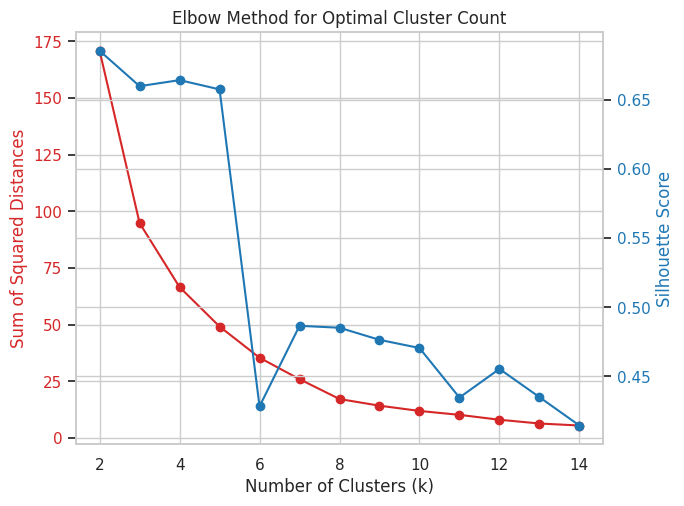

In [148]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

silhouette_scores = []
inertia_values = []

# Range of clusters
k_values = range(2, 15)

# Calculate silhouette scores and inertia values for different cluster counts
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(clustering_data_fossil_scaled_kmeans)

    silhouette_scores.append(silhouette_score(clustering_data_fossil_scaled_kmeans, kmeans.labels_))
    inertia_values.append(kmeans.inertia_)

# Extract features for silhouette score calculation
features_for_silhouette = clustering_data_fossil_scaled_kmeans.drop('Cluster', axis=1)
# Calculate silhouette score
silhouette_avg = silhouette_score(features_for_silhouette, clustering_data_fossil_scaled_kmeans['Cluster'])
# Print the silhouette score
print(f"Silhouette Score: {silhouette_avg:.4f}")

# Plotting
fig, ax1 = plt.subplots(figsize=(7,5))
# Plotting sum of squared distances (inertia)
ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Sum of Squared Distances', color='tab:red')
ax1.plot(k_values, inertia_values, color='tab:red', marker='o')
ax1.tick_params(axis='y', labelcolor='tab:red')
# Creating a second y-axis for silhouette scores
ax2 = ax1.twinx()
ax2.set_ylabel('Silhouette Score', color='tab:blue')
ax2.plot(k_values, silhouette_scores, color='tab:blue', marker='o')
ax2.tick_params(axis='y', labelcolor='tab:blue')
fig.tight_layout()
plt.title('Elbow Method for Optimal Cluster Count')
plt.show()

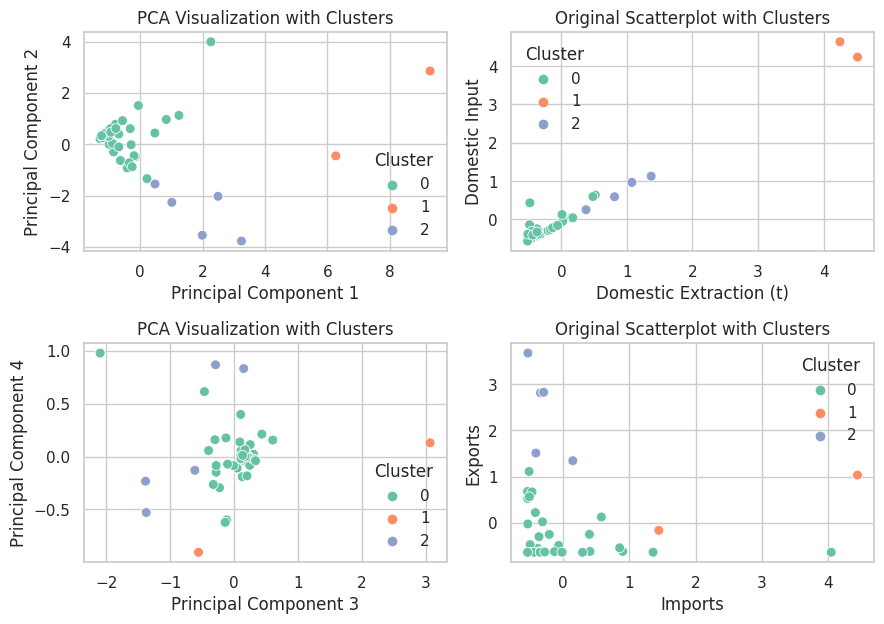

In [149]:
from sklearn.decomposition import PCA

# Extract the features for PCA (excluding the 'Cluster' column)
features = clustering_data_fossil_scaled_kmeans.drop('Cluster', axis=1)

# Initialize and fit the PCA model
pca = PCA(n_components=6, random_state=42)
pca_result = pca.fit_transform(features)

# Add PCA components to the DataFrame
clustering_data_fossil_scaled_kmeans['PCA1'] = pca_result[:, 0]
clustering_data_fossil_scaled_kmeans['PCA2'] = pca_result[:, 1]
clustering_data_fossil_scaled_kmeans['PCA3'] = pca_result[:, 2]
clustering_data_fossil_scaled_kmeans['PCA4'] = pca_result[:, 3]


# Plot the clusters in 2D with PCA
plt.figure(figsize=(9, 9))

# Scatterplot for PCA[1,2] components
plt.subplot(3, 2, 1)
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=clustering_data_fossil_scaled_kmeans, palette='Set2', s=50)
plt.title('PCA Visualization with Clusters')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')

# Original scatterplots with clusters
plt.subplot(3, 2, 2)
sns.scatterplot(x='Domestic_Ext', y='Domestic_Input', hue='Cluster', data=clustering_data_fossil_scaled_kmeans, palette='Set2', s=50)
plt.title('Original Scatterplot with Clusters')
plt.xlabel('Domestic Extraction (t)')
plt.ylabel('Domestic Input')
plt.legend(title='Cluster')

# Scatterplot for PCA[3,4] components
plt.subplot(3, 2, 3)
sns.scatterplot(x='PCA3', y='PCA4', hue='Cluster', data=clustering_data_fossil_scaled_kmeans, palette='Set2', s=50)
plt.title('PCA Visualization with Clusters')
plt.xlabel('Principal Component 3')
plt.ylabel('Principal Component 4')
plt.legend(title='Cluster')

# Original scatterplots with clusters
plt.subplot(3, 2, 4)
sns.scatterplot(x='Imports', y='Exports', hue='Cluster', data=clustering_data_fossil_scaled_kmeans, palette='Set2', s=50)
plt.title('Original Scatterplot with Clusters')
plt.xlabel('Imports')
plt.ylabel('Exports')
plt.legend(title='Cluster')

plt.tight_layout()
plt.show()


**Hierarchical Agglomerative Clustering:**

In [150]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering

X = clustering_data_fossil_scaled_hier_agg

# Initialize and fit the Hierarchical Agglomerative Clustering model
agg_cluster = AgglomerativeClustering(n_clusters=3)
clustering_data_fossil_scaled_hier_agg['Agg_Cluster'] = agg_cluster.fit_predict(X)

# Evaluate Agglomerative Clustering
agg_silhouette = silhouette_score(X, clustering_data_fossil_scaled_hier_agg['Agg_Cluster'])
print(f"Agglomerative Clustering Silhouette Score: {agg_silhouette:.4f}")

Agglomerative Clustering Silhouette Score: 0.6758


In [151]:
clustering_data_fossil_scaled_hier_agg.columns

Index(['Domestic_Ext', 'Domestic_Input', 'Imports', 'Exports', 'Raw_imports',
       'Raw_exports', 'Agg_Cluster'],
      dtype='object')

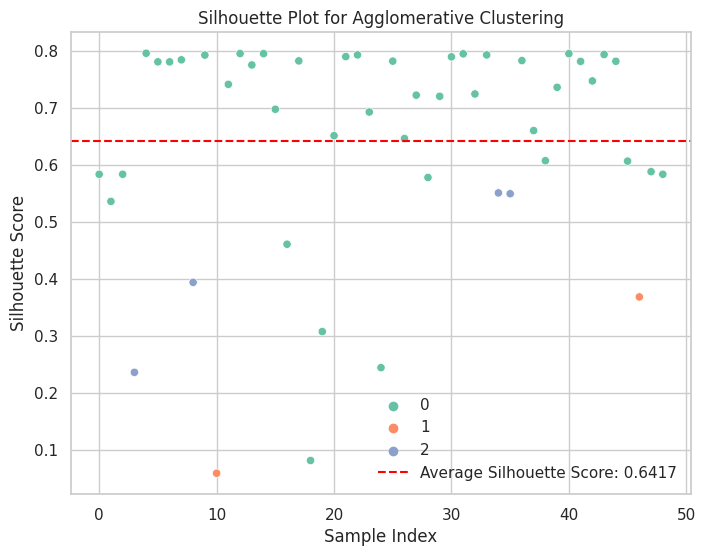

In [152]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_samples, silhouette_score

# Extract features for visualization
X_visualize = clustering_data_fossil_scaled_hier_agg.drop('Agg_Cluster', axis=1)

# Compute silhouette scores for each sample
silhouette_values = silhouette_samples(X_visualize, clustering_data_fossil_scaled_hier_agg['Agg_Cluster'])

# Compute the average silhouette score
agg_silhouette = silhouette_score(X_visualize, clustering_data_fossil_scaled_hier_agg['Agg_Cluster'])

# Plot silhouette plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=range(len(clustering_data_fossil_scaled_hier_agg)), y=silhouette_values, hue=clustering_data_fossil_scaled_hier_agg['Agg_Cluster'], palette='Set2')
plt.axhline(y=agg_silhouette, color="red", linestyle="--", label=f'Average Silhouette Score: {agg_silhouette:.4f}')
plt.title("Silhouette Plot for Agglomerative Clustering")
plt.xlabel("Sample Index")
plt.ylabel("Silhouette Score")
plt.legend()
plt.show()


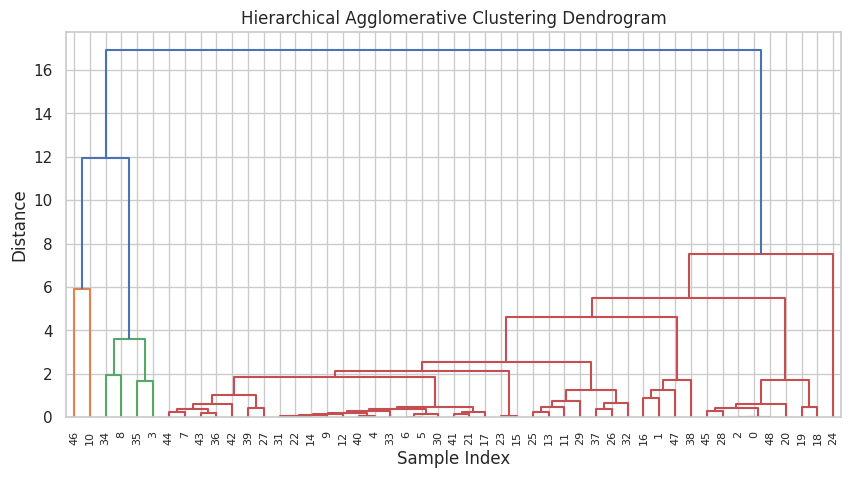

In [153]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage

# Fit Agglomerative Clustering
agg_cluster = AgglomerativeClustering(n_clusters=2)
agg_labels = agg_cluster.fit_predict(X)

# Calculate linkage matrix for dendrogram
linkage_matrix = linkage(X, method='ward')  # You can use other linkage methods like 'single', 'complete', etc.

# Plot the dendrogram
plt.figure(figsize=(10, 5))
dendrogram(linkage_matrix, orientation='top', labels=X.index, distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Agglomerative Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()


**DBSCAN:**

In [154]:
from sklearn.cluster import DBSCAN

X = clustering_data_fossil_scaled_dbscan

# Initialize and fit the DBSCAN model
dbscan = DBSCAN(eps=0.5, min_samples=5)
clustering_data_fossil_scaled_dbscan['DBSCAN_Cluster'] = dbscan.fit_predict(X)

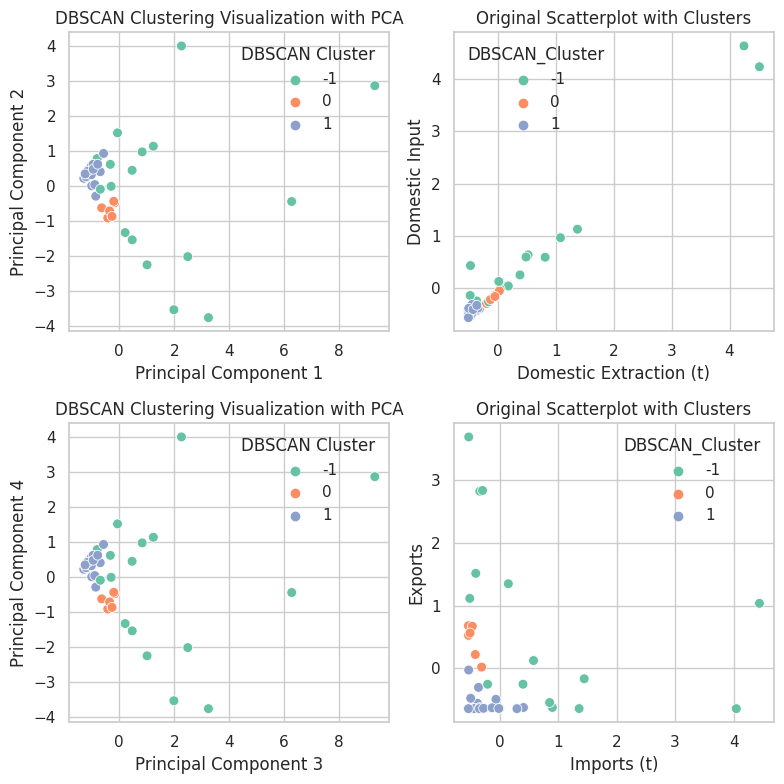

In [155]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Extract features for visualization
X_visualize = clustering_data_fossil_scaled_dbscan.drop('DBSCAN_Cluster', axis=1)

# Apply PCA for visualization
pca = PCA(n_components=2, random_state=42)
pca_result = pca.fit_transform(X_visualize)

# Add PCA components to the DataFrame
clustering_data_fossil_scaled_dbscan['PCA1'] = pca_result[:, 0]
clustering_data_fossil_scaled_dbscan['PCA2'] = pca_result[:, 1]
clustering_data_fossil_scaled_dbscan['PCA3'] = pca_result[:, 0]
clustering_data_fossil_scaled_dbscan['PCA4'] = pca_result[:, 1]

# Plot the DBSCAN clusters in 2D with PCA
plt.figure(figsize=(8, 8))

# Scatterplot for PCA[1,2] components
plt.subplot(2, 2, 1)
sns.scatterplot(x='PCA1', y='PCA2', hue='DBSCAN_Cluster', data=clustering_data_fossil_scaled_dbscan, palette='Set2', s=50)
plt.title("DBSCAN Clustering Visualization with PCA")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title='DBSCAN Cluster', loc='upper right')

# Original scatterplots with clusters
plt.subplot(2, 2, 2)
sns.scatterplot(x='Domestic_Ext', y='Domestic_Input', hue='DBSCAN_Cluster', data=clustering_data_fossil_scaled_dbscan, palette='Set2', s=50)
plt.title('Original Scatterplot with Clusters')
plt.xlabel('Domestic Extraction (t)')
plt.ylabel('Domestic Input')
plt.legend(title='DBSCAN_Cluster')

# Scatterplot for PCA[3,4] components
plt.subplot(2, 2, 3)
sns.scatterplot(x='PCA3', y='PCA4', hue='DBSCAN_Cluster', data=clustering_data_fossil_scaled_dbscan, palette='Set2', s=50)
plt.title("DBSCAN Clustering Visualization with PCA")
plt.xlabel("Principal Component 3")
plt.ylabel("Principal Component 4")
plt.legend(title='DBSCAN Cluster', loc='upper right')

# Original scatterplots with clusters
plt.subplot(2, 2, 4)
sns.scatterplot(x='Imports', y='Exports', hue='DBSCAN_Cluster', data=clustering_data_fossil_scaled_dbscan, palette='Set2', s=50)
plt.title('Original Scatterplot with Clusters')
plt.xlabel('Imports (t)')
plt.ylabel('Exports')
plt.legend(title='DBSCAN_Cluster')


plt.tight_layout()
plt.show()

**Summary:**
For K means at K = 3
  silhoette Score is 0.6145
  elbow is at 3
  PCA visualisation shows that the clusters are correcty formed.
For Hierarchical Agglomerative Clustering at k =3
  silhouette score is 0.6758
  Average silhouette in silhouette plot is 0.6457
  dendogram is visualised properly
For DBSCAN
  It is observed in both the PCA and normal visualisations that tha cluster accuracy is less than both kmeans and HAC

**K-Means:**
*   Number of Clusters (K = 3):
    *   Silhouette Score: 0.6145
    *   Elbow at K = 3
    *   PCA Visualization: Clusters are correctly formed.

**Hierarchical Agglomerative Clustering (HAC):**
*  Number of Clusters (K = 3):
    *   Silhouette Score: 0.6758
    *   Average Silhouette (Silhouette Plot): 0.6457
    *   Dendrogram: Properly visualized.

**DBSCAN**
*   Observations:
    *   Cluster accuracy is lower than both K-Means and HAC.
    *   PCA and normal visualizations indicate lower cluster accuracy.


**Comparison and Preference:**

1.   **Silhouette Score:**
      HAC (K = 3) has the highest silhouette score (0.6758), indicating better-defined clusters compared to K-Means (0.6145).
2.   **Elbow Method:**
      Both K-Means and HAC suggest K = 3 as the optimal number of clusters. However, the elbow method might be more subjective in this case.
1.   **Visualization:**
      PCA Visualization for K-Means shows correctly formed clusters.
      HAC is supported by a well-defined silhouette plot and a properly visualized dendrogram.
2.   **Preference:**
      Based on the observations, Hierarchical Agglomerative Clustering (HAC) is preferred over K-Means and DBSCAN.
      HAC exhibits higher silhouette scores, better-defined clusters, and proper visualizations in both silhouette plots and dendrograms.


### **Clustering For Metal Ore Category:**


**Standard Scaling**

In [156]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import seaborn as sns
import matplotlib.pyplot as plt

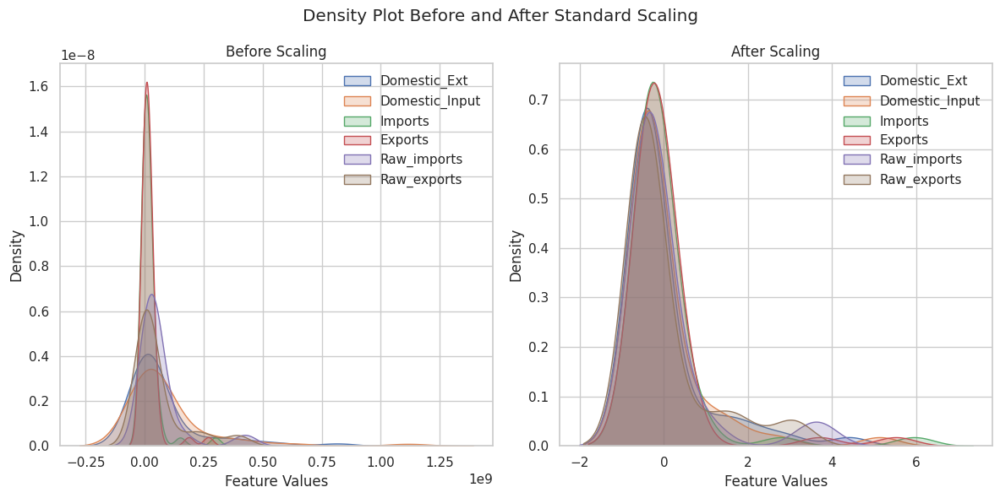

In [157]:
numeric_columns_metalore = clustering_data_metalore.columns[1:]  # Exclude the 'Country' column

# Extract the features for scaling
features_before_scaling_metalore = clustering_data_metalore[numeric_columns_metalore]

# Apply Standard scaling
scaler = StandardScaler()
features_after_scaling_metalore = scaler.fit_transform(features_before_scaling_metalore)

# Create DataFrames with scaled features
df_standard_scaled_metalore = pd.DataFrame(features_after_scaling_metalore, columns=numeric_columns_metalore)
df_before_scaling_metalore = pd.DataFrame(features_before_scaling_metalore, columns=numeric_columns_metalore)

# Visualize the density before and after scaling
plt.figure(figsize=(12, 6))
plt.suptitle('Density Plot Before and After Standard Scaling')

# Plotting before scaling
plt.subplot(1, 2, 1)
for column in numeric_columns_metalore:
    sns.kdeplot(df_before_scaling_metalore[column], label=column, fill=True)
plt.title('Before Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

# Plotting after scaling
plt.subplot(1, 2, 2)
for column in numeric_columns_metalore:
    sns.kdeplot(df_standard_scaled_metalore[column], label=column, fill=True)
plt.title('After Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()

In [158]:
clustering_data_metalore_scaled = df_standard_scaled_metalore
clustering_data_metalore_scaled.head()

,Domestic_Ext,Domestic_Input,Imports,Exports,Raw_imports,Raw_exports
0,-0.363715,-0.392297,-0.360207,-0.192889,-0.519050,-0.398429
1,0.215952,0.126519,-0.233691,0.502688,0.355003,0.307723
2,-0.363715,-0.392297,-0.360207,-0.192889,-0.519050,-0.398429
3,2.274327,1.845986,-0.301084,5.525631,-0.235399,3.069097
4,-0.448737,-0.433707,-0.232864,-0.314334,-0.436036,-0.497786


In [159]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
X = clustering_data_metalore_scaled
# Initialize and fit the Hierarchical Agglomerative Clustering model
agg_cluster_metalore = AgglomerativeClustering(n_clusters=3)
clustering_data_metalore_scaled['Agg_Cluster'] = agg_cluster_metalore.fit_predict(X)
test1 = clustering_data_metalore_scaled.copy()
# Evaluate Agglomerative Clustering
agg_silhouette_metalore = silhouette_score(X, clustering_data_metalore_scaled['Agg_Cluster'])
print(f"Agglomerative Clustering Silhouette Score: {agg_silhouette_metalore:.4f}")

Agglomerative Clustering Silhouette Score: 0.7180


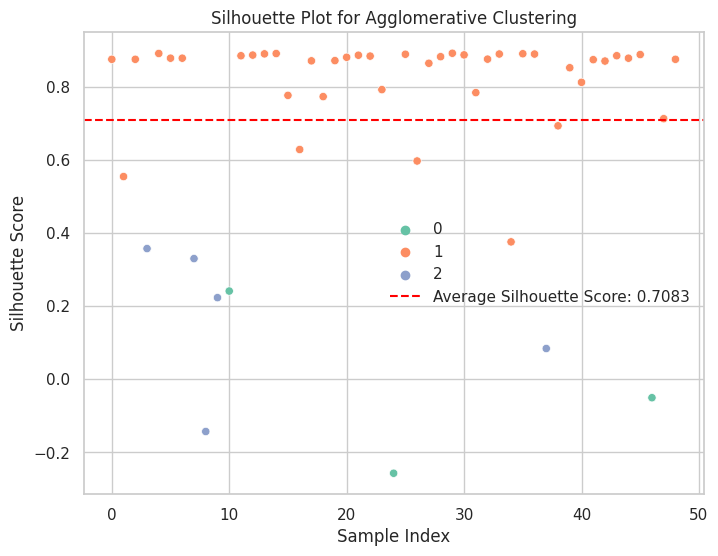

In [160]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_samples, silhouette_score

# Extract features for visualization
X_visualize_metalore = clustering_data_metalore_scaled.drop('Agg_Cluster', axis=1)

# Compute silhouette scores for each sample
silhouette_values_metalore = silhouette_samples(X_visualize_metalore, clustering_data_metalore_scaled['Agg_Cluster'])

# Compute the average silhouette score
agg_silhouette_metalore = silhouette_score(X_visualize_metalore, clustering_data_metalore_scaled['Agg_Cluster'])

# Plot silhouette plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=range(len(clustering_data_metalore_scaled)), y=silhouette_values_metalore, hue=clustering_data_metalore_scaled['Agg_Cluster'], palette='Set2')
plt.axhline(y=agg_silhouette_metalore, color="red", linestyle="--", label=f'Average Silhouette Score: {agg_silhouette_metalore:.4f}')
plt.title("Silhouette Plot for Agglomerative Clustering")
plt.xlabel("Sample Index")
plt.ylabel("Silhouette Score")
plt.legend()
plt.show()

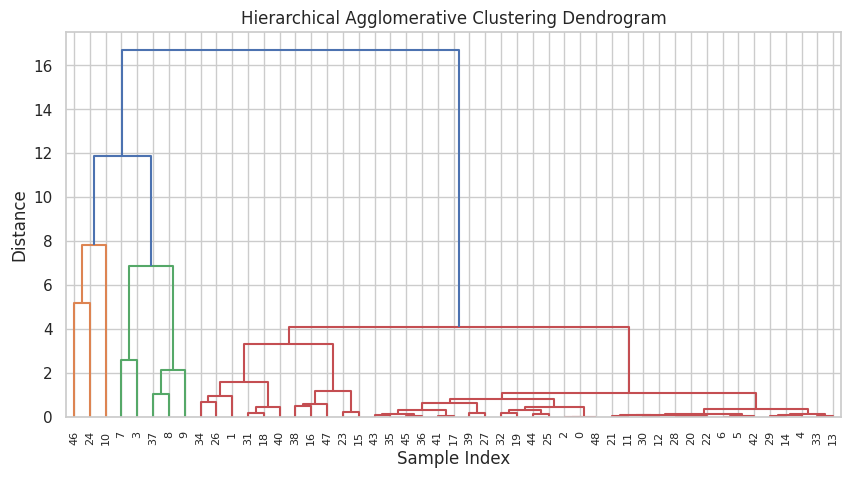

In [161]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage

# Fit Agglomerative Clustering
agg_cluster_metalore = AgglomerativeClustering(n_clusters=3)
agg_labels_metalore = agg_cluster_metalore.fit_predict(X)

# Calculate linkage matrix for dendrogram
linkage_matrix_metalore = linkage(X, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 5))
dendrogram(linkage_matrix_metalore, orientation='top', labels=X.index, distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Agglomerative Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

### **Clustering For Non_Metallic_Material Category:**

**Standard Scaling**

In [162]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import seaborn as sns
import matplotlib.pyplot as plt

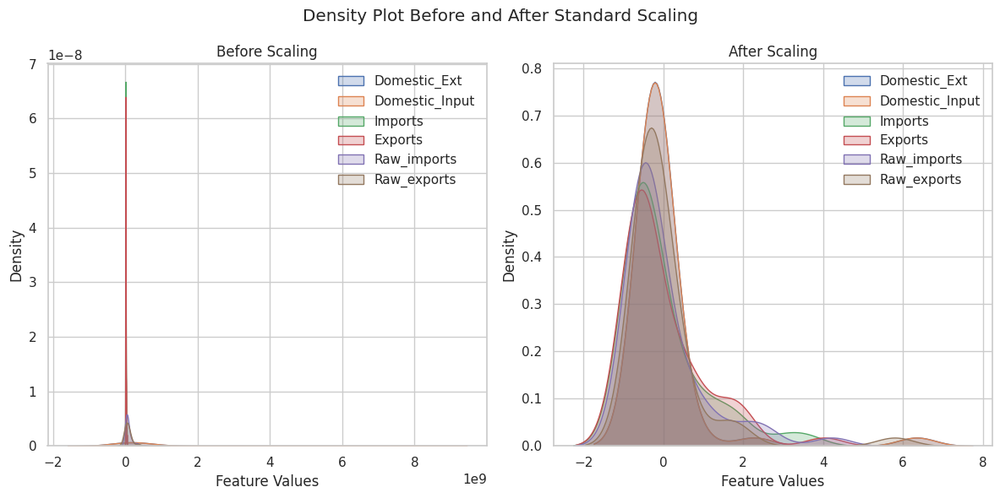

In [163]:
numeric_columns_nmm = clustering_data_nmm.columns[1:]  # Exclude the 'Country' column
# Extract the features for scaling
features_before_scaling_nmm = clustering_data_nmm[numeric_columns_nmm]

# Apply Standard scaling
scaler = StandardScaler()
features_after_scaling_nmm = scaler.fit_transform(features_before_scaling_nmm)

# Create DataFrames with scaled features
df_standard_scaled_nmm = pd.DataFrame(features_after_scaling_nmm, columns=numeric_columns_nmm)
df_before_scaling_nmm = pd.DataFrame(features_before_scaling_nmm, columns=numeric_columns_nmm)

# Visualize the density before and after scaling
plt.figure(figsize=(12, 6))
plt.suptitle('Density Plot Before and After Standard Scaling')

# Plotting before scaling
plt.subplot(1, 2, 1)
for column in numeric_columns_nmm:
    sns.kdeplot(df_before_scaling_nmm[column], label=column, fill=True)
plt.title('Before Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

# Plotting after scaling
plt.subplot(1, 2, 2)
for column in numeric_columns_nmm:
    sns.kdeplot(df_standard_scaled_nmm[column], label=column, fill=True)
plt.title('After Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()

In [164]:
clustering_data_nmm_scaled = df_standard_scaled_nmm
clustering_data_nmm_scaled.head()

,Domestic_Ext,Domestic_Input,Imports,Exports,Raw_imports,Raw_exports
0,-0.306224,-0.310614,-0.732142,-0.748129,-0.686539,-0.502144
1,0.787470,0.792223,0.972573,0.126578,0.928603,1.608676
2,-0.306224,-0.310614,-0.732142,-0.748129,-0.686539,-0.502144
3,-0.215756,-0.217183,-0.283766,0.069595,-0.184993,-0.341249
4,-0.290543,-0.292815,-0.431038,-0.420344,-0.455818,-0.308624


In [165]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
X = clustering_data_nmm_scaled
# Initialize and fit the Hierarchical Agglomerative Clustering model
agg_cluster_nmm = AgglomerativeClustering(n_clusters=4)
clustering_data_nmm_scaled['Agg_Cluster'] = agg_cluster_nmm.fit_predict(X)

# Evaluate Agglomerative Clustering
agg_silhouette_nmm = silhouette_score(X, clustering_data_nmm_scaled['Agg_Cluster'])
print(f"Agglomerative Clustering Silhouette Score: {agg_silhouette_nmm:.4f}")

Agglomerative Clustering Silhouette Score: 0.6029


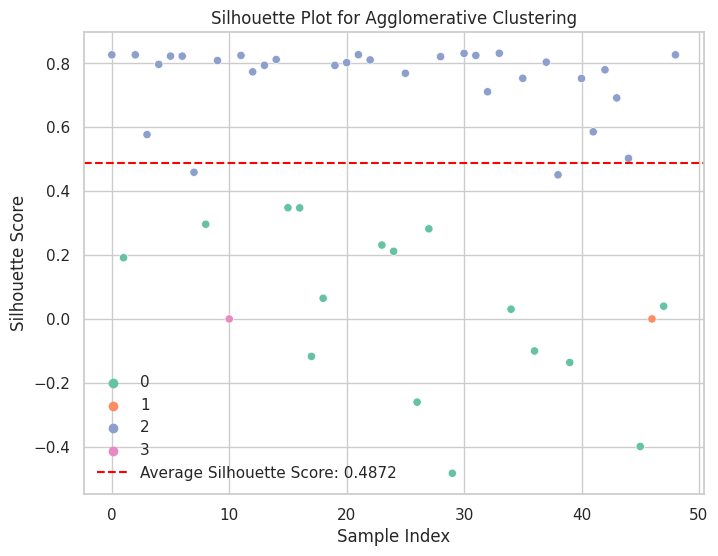

In [166]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_samples, silhouette_score

# Extract features for visualization
X_visualize_nmm = clustering_data_nmm_scaled.drop('Agg_Cluster', axis=1)

# Compute silhouette scores for each sample
silhouette_values_nmm = silhouette_samples(X_visualize_nmm, clustering_data_nmm_scaled['Agg_Cluster'])

# Compute the average silhouette score
agg_silhouette_nmm = silhouette_score(X_visualize_nmm, clustering_data_nmm_scaled['Agg_Cluster'])

# Plot silhouette plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=range(len(clustering_data_nmm_scaled)), y=silhouette_values_nmm, hue=clustering_data_nmm_scaled['Agg_Cluster'], palette='Set2')
plt.axhline(y=agg_silhouette_nmm, color="red", linestyle="--", label=f'Average Silhouette Score: {agg_silhouette_nmm:.4f}')
plt.title("Silhouette Plot for Agglomerative Clustering")
plt.xlabel("Sample Index")
plt.ylabel("Silhouette Score")
plt.legend()
plt.show()

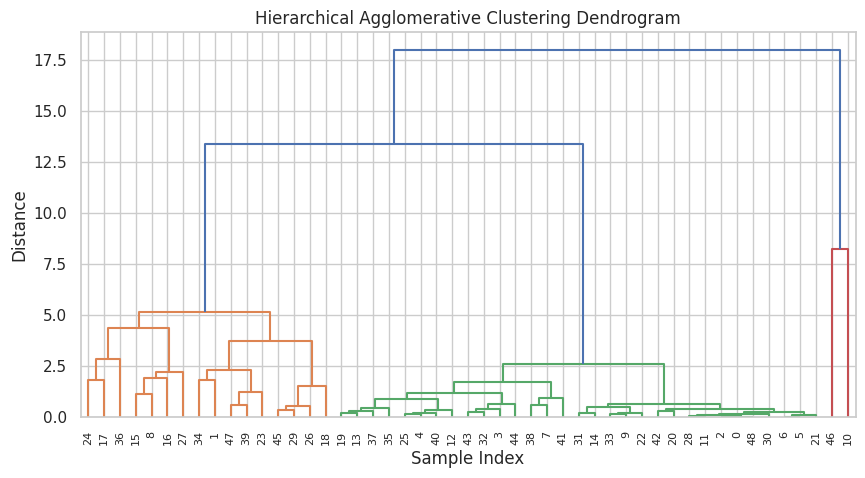

In [167]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage

# Fit Agglomerative Clustering
agg_cluster_nmm = AgglomerativeClustering(n_clusters=4)
agg_labels_nmm = agg_cluster_nmm.fit_predict(X)

# Calculate linkage matrix for dendrogram
linkage_matrix_nmm = linkage(X, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 5))
dendrogram(linkage_matrix_nmm, orientation='top', labels=X.index, distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Agglomerative Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

### **Clustering For Mixed and Complex Products Category:**

**Standard Scaling**

In [168]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import seaborn as sns
import matplotlib.pyplot as plt

<ipython-input-169-19d45d3026ca>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_before_scaling_mp[column], label=column, fill=True)
<ipython-input-169-19d45d3026ca>:31: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_standard_scaled_mp[column], label=column, fill=True)


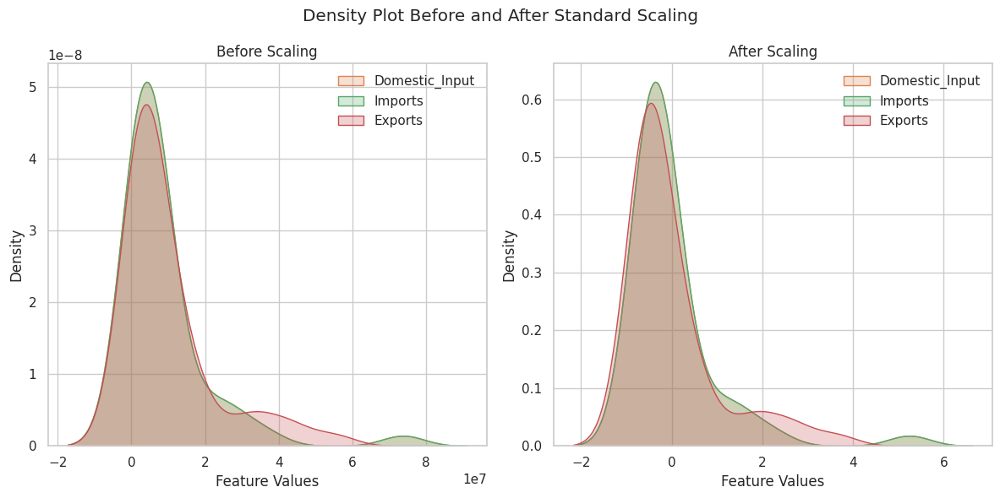

In [169]:
numeric_columns_mp = clustering_data_mp.columns[1:]  # Exclude the 'Country' column
# Extract the features for scaling
features_before_scaling_mp = clustering_data_mp[numeric_columns_mp]

# Apply Standard scaling
scaler = StandardScaler()
features_after_scaling_mp = scaler.fit_transform(features_before_scaling_mp)

# Create DataFrames with scaled features
df_standard_scaled_mp = pd.DataFrame(features_after_scaling_mp, columns=numeric_columns_mp)
df_before_scaling_mp = pd.DataFrame(features_before_scaling_mp, columns=numeric_columns_mp)

# Visualize the density before and after scaling
plt.figure(figsize=(12, 6))
plt.suptitle('Density Plot Before and After Standard Scaling')

# Plotting before scaling
plt.subplot(1, 2, 1)
for column in numeric_columns_mp:
    sns.kdeplot(df_before_scaling_mp[column], label=column, fill=True)
plt.title('Before Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

# Plotting after scaling
plt.subplot(1, 2, 2)
for column in numeric_columns_mp:
    sns.kdeplot(df_standard_scaled_mp[column], label=column, fill=True)
plt.title('After Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()

In [170]:
clustering_data_mp_scaled = df_standard_scaled_mp
clustering_data_mp_scaled.head()

,Domestic_Ext,Domestic_Input,Imports,Exports
0,0.0,-0.640005,-0.640005,-0.549085
1,0.0,0.094024,0.094024,0.206594
2,0.0,-0.640005,-0.640005,-0.549085
3,0.0,-0.282407,-0.282407,-0.430662
4,0.0,-0.385927,-0.385927,-0.367365


In [171]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
X = clustering_data_mp_scaled
# Initialize and fit the Hierarchical Agglomerative Clustering model
agg_cluster_mp = AgglomerativeClustering(n_clusters=2)
clustering_data_mp_scaled['Agg_Cluster'] = agg_cluster_mp.fit_predict(X)

# Evaluate Agglomerative Clustering
agg_silhouette_mp = silhouette_score(X, clustering_data_mp_scaled['Agg_Cluster'])
print(f"Agglomerative Clustering Silhouette Score: {agg_silhouette_mp:.4f}")

Agglomerative Clustering Silhouette Score: 0.7267


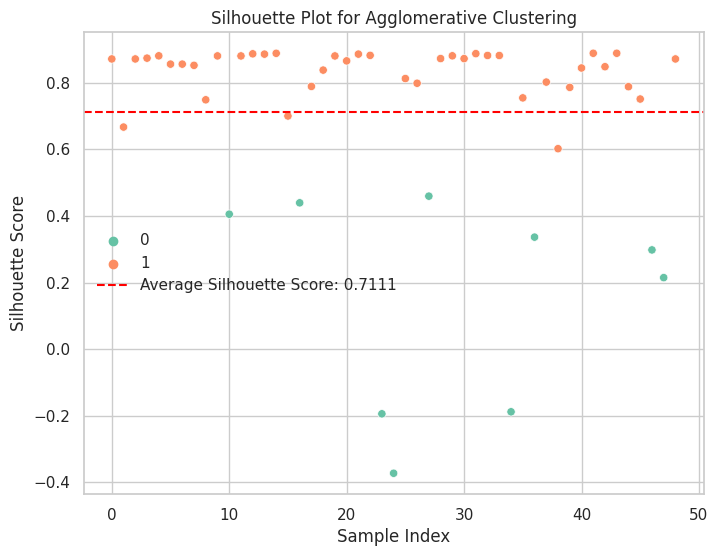

In [172]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_samples, silhouette_score

# Extract features for visualization
X_visualize_mp = clustering_data_mp_scaled.drop('Agg_Cluster', axis=1)

# Compute silhouette scores for each sample
silhouette_values_mp = silhouette_samples(X_visualize_mp, clustering_data_mp_scaled['Agg_Cluster'])

# Compute the average silhouette score
agg_silhouette_mp = silhouette_score(X_visualize_mp, clustering_data_mp_scaled['Agg_Cluster'])

# Plot silhouette plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=range(len(clustering_data_mp_scaled)), y=silhouette_values_mp, hue=clustering_data_mp_scaled['Agg_Cluster'], palette='Set2')
plt.axhline(y=agg_silhouette_mp, color="red", linestyle="--", label=f'Average Silhouette Score: {agg_silhouette_mp:.4f}')
plt.title("Silhouette Plot for Agglomerative Clustering")
plt.xlabel("Sample Index")
plt.ylabel("Silhouette Score")
plt.legend()
plt.show()

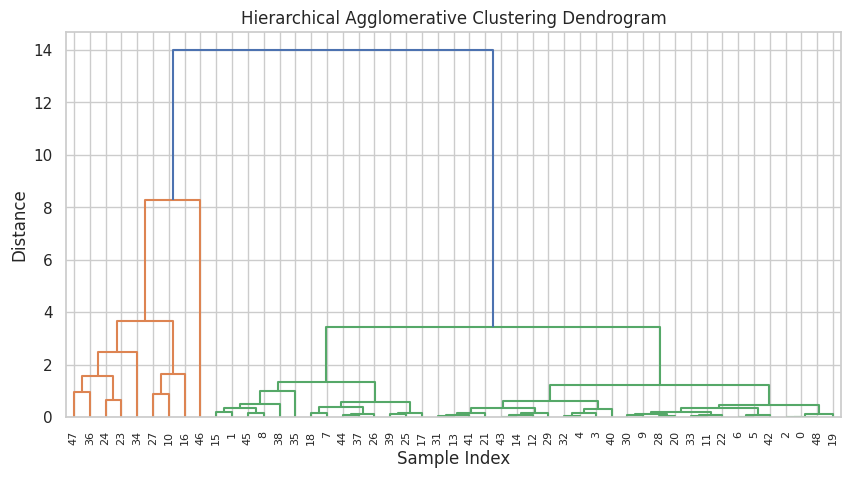

In [173]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage

# Fit Agglomerative Clustering
agg_cluster_mp = AgglomerativeClustering(n_clusters=2)
agg_labels_mp = agg_cluster_mp.fit_predict(X)

# Calculate linkage matrix for dendrogram
linkage_matrix_mp = linkage(X, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 5))
dendrogram(linkage_matrix_mp, orientation='top', labels=X.index, distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Agglomerative Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

### **Clustering For Products from Metal Category:**

**Standard Scaling**

In [174]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import seaborn as sns
import matplotlib.pyplot as plt

<ipython-input-175-6dd0a8faab4c>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_before_scaling_pfm[column], label=column, fill=True)
<ipython-input-175-6dd0a8faab4c>:31: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_standard_scaled_pfm[column], label=column, fill=True)


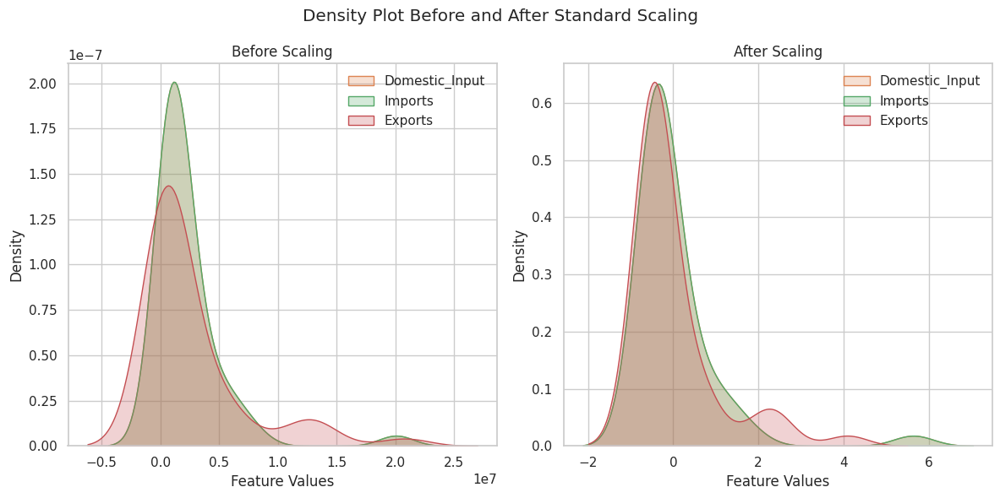

In [175]:
numeric_columns_pfm = clustering_data_pfm.columns[1:]  # Exclude the 'Country' column
# Extract the features for scaling
features_before_scaling_pfm = clustering_data_pfm[numeric_columns_pfm]

# Apply Standard scaling
scaler = StandardScaler()
features_after_scaling_pfm = scaler.fit_transform(features_before_scaling_pfm)

# Create DataFrames with scaled features
df_standard_scaled_pfm = pd.DataFrame(features_after_scaling_pfm, columns=numeric_columns_pfm)
df_before_scaling_pfm = pd.DataFrame(features_before_scaling_pfm, columns=numeric_columns_pfm)

# Visualize the density before and after scaling
plt.figure(figsize=(12, 6))
plt.suptitle('Density Plot Before and After Standard Scaling')

# Plotting before scaling
plt.subplot(1, 2, 1)
for column in numeric_columns_pfm:
    sns.kdeplot(df_before_scaling_pfm[column], label=column, fill=True)
plt.title('Before Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

# Plotting after scaling
plt.subplot(1, 2, 2)
for column in numeric_columns_pfm:
    sns.kdeplot(df_standard_scaled_pfm[column], label=column, fill=True)
plt.title('After Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()

In [176]:
clustering_data_pfm_scaled = df_standard_scaled_pfm
clustering_data_pfm_scaled.head()

,Domestic_Ext,Domestic_Input,Imports,Exports
0,0.0,-0.507037,-0.507037,-0.580318
1,0.0,-0.308995,-0.308995,-0.368856
2,0.0,-0.507037,-0.507037,-0.580318
3,0.0,-0.079150,-0.079150,-0.487853
4,0.0,-0.383210,-0.383210,-0.592486


In [177]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
X = clustering_data_pfm_scaled
# Initialize and fit the Hierarchical Agglomerative Clustering model
agg_cluster_pfm = AgglomerativeClustering(n_clusters=3)
clustering_data_pfm_scaled['Agg_Cluster'] = agg_cluster_pfm.fit_predict(X)

# Evaluate Agglomerative Clustering
agg_silhouette_pfm = silhouette_score(X, clustering_data_pfm_scaled['Agg_Cluster'])
print(f"Agglomerative Clustering Silhouette Score: {agg_silhouette_pfm:.4f}")

Agglomerative Clustering Silhouette Score: 0.7374


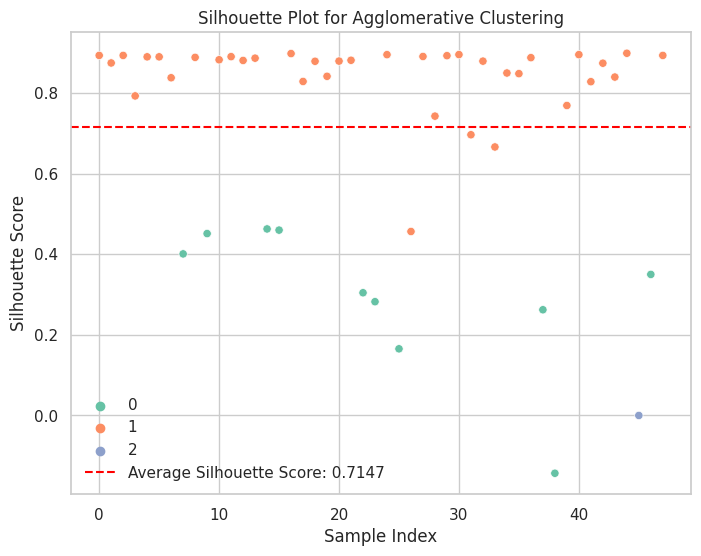

In [178]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_samples, silhouette_score

# Extract features for visualization
X_visualize_pfm = clustering_data_pfm_scaled.drop('Agg_Cluster', axis=1)

# Compute silhouette scores for each sample
silhouette_values_pfm = silhouette_samples(X_visualize_pfm, clustering_data_pfm_scaled['Agg_Cluster'])

# Compute the average silhouette score
agg_silhouette_pfm = silhouette_score(X_visualize_pfm, clustering_data_pfm_scaled['Agg_Cluster'])

# Plot silhouette plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=range(len(clustering_data_pfm_scaled)), y=silhouette_values_pfm, hue=clustering_data_pfm_scaled['Agg_Cluster'], palette='Set2')
plt.axhline(y=agg_silhouette_pfm, color="red", linestyle="--", label=f'Average Silhouette Score: {agg_silhouette_pfm:.4f}')
plt.title("Silhouette Plot for Agglomerative Clustering")
plt.xlabel("Sample Index")
plt.ylabel("Silhouette Score")
plt.legend()
plt.show()

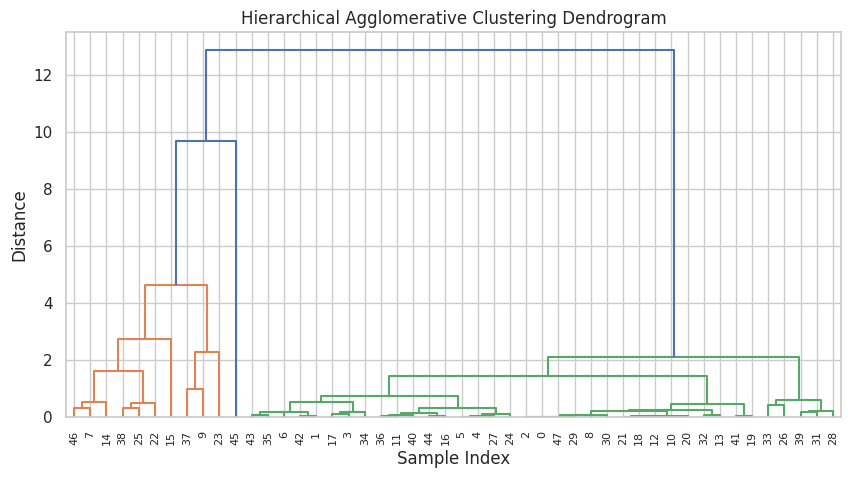

In [179]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage

# Fit Agglomerative Clustering
agg_cluster_pfm = AgglomerativeClustering(n_clusters=3)
agg_labels_pfm = agg_cluster_pfm.fit_predict(X)

# Calculate linkage matrix for dendrogram
linkage_matrix_pfm = linkage(X, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 5))
dendrogram(linkage_matrix_pfm, orientation='top', labels=X.index, distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Agglomerative Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

##**Model Testing:**

In [180]:
arm_domestic_ext_metalore = armenia_metalore_df['Domestic Extraction']
arm_domestic_input_metalore = armenia_metalore_df['Domestic Material Input']
arm_imports_metalore = armenia_metalore_df['Imports']
arm_exports_metalore = armenia_metalore_df['Exports']
arm_raw_imports_metalore = armenia_metalore_df['Raw Material Equivalents of imports']
arm_raw_exports_metalore = armenia_metalore_df['Raw Material Equivalents of exports']


por_domestic_ext_metalore = portugal_metalore_df['Domestic Extraction']
por_domestic_input_metalore = portugal_metalore_df['Domestic Material Input']
por_imports_metalore = portugal_metalore_df['Imports']
por_exports_metalore = portugal_metalore_df['Exports']
por_raw_imports_metalore = portugal_metalore_df['Raw Material Equivalents of imports']
por_raw_exports_metalore = portugal_metalore_df['Raw Material Equivalents of exports']


ukr_domestic_ext_metalore = ukraine_metalore_df['Domestic Extraction']
ukr_domestic_input_metalore = ukraine_metalore_df['Domestic Material Input']
ukr_imports_metalore = ukraine_metalore_df['Imports']
ukr_exports_metalore = ukraine_metalore_df['Exports']
ukr_raw_imports_metalore = ukraine_metalore_df['Raw Material Equivalents of imports']
ukr_raw_exports_metalore = ukraine_metalore_df['Raw Material Equivalents of exports']

In [181]:
#######  ARMENIA
arm_means_data_metalore = {
    'Country': 'Armenia',
    'Domestic_Ext': arm_domestic_ext_metalore.mean(),
    'Domestic_Input': arm_domestic_input_metalore.mean(),
    'Imports': arm_imports_metalore.mean(),
    'Exports': arm_exports_metalore.mean(),
    'Raw_imports': arm_raw_imports_metalore.mean(),
    'Raw_exports': arm_raw_exports_metalore.mean()
}
# Create a new dataframe
testing_data_metalore = pd.DataFrame([arm_means_data_metalore])

#######  UKRAINE
ukr_means_data_metalore = {
    'Country': 'Ukraine',
    'Domestic_Ext': ukr_domestic_ext_metalore.mean(),
    'Domestic_Input': ukr_domestic_input_metalore.mean(),
    'Imports': ukr_imports_metalore.mean(),
    'Exports': ukr_exports_metalore.mean(),
    'Raw_imports': ukr_raw_imports_metalore.mean(),
    'Raw_exports': ukr_raw_exports_metalore.mean()
}
testing_data_metalore = testing_data_metalore.append(ukr_means_data_metalore, ignore_index=True)

#######  PORTUGAL
por_means_data_metalore = {
    'Country': 'Portugal',
    'Domestic_Ext': por_domestic_ext_metalore.mean(),
    'Domestic_Input': por_domestic_input_metalore.mean(),
    'Imports': por_imports_metalore.mean(),
    'Exports': por_exports_metalore.mean(),
    'Raw_imports': por_raw_imports_metalore.mean(),
    'Raw_exports': por_raw_exports_metalore.mean()
}
testing_data_metalore = testing_data_metalore.append(por_means_data_metalore, ignore_index=True)

In [182]:
testing_data_metalore.fillna(0, inplace=True)
testing_data_metalore

,Country,Domestic_Ext,Domestic_Input,Imports,Exports,Raw_imports,Raw_exports
0,Armenia,8182739.14,8245642.08,62902.96,96001.74,1038917.32,8161272.20
1,Ukraine,37873376.46,43040775.88,5167399.44,25999362.10,7829149.84,36154824.80
2,Portugal,2423507.22,4987134.56,2563627.32,1403390.00,9209225.20,2234693.14


In [183]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import seaborn as sns
import matplotlib.pyplot as plt

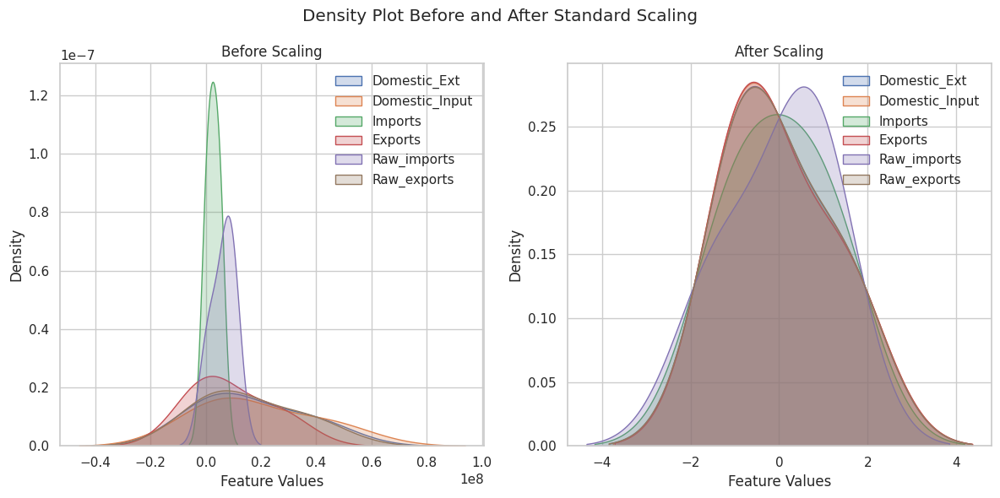

In [184]:
test_numeric_columns_metalore = testing_data_metalore.columns[1:]  # Exclude the 'Country' column
test_numeric_columns_metalore
# Extract the features for scaling
test_features_before_scaling_metalore = testing_data_metalore[test_numeric_columns_metalore]

# Apply Standard scaling
scaler = StandardScaler()
test_features_after_scaling_metalore = scaler.fit_transform(test_features_before_scaling_metalore)

# Create DataFrames with scaled features
test_df_standard_scaled_metalore = pd.DataFrame(test_features_after_scaling_metalore, columns=test_numeric_columns_metalore)
test_df_before_scaling_metalore = pd.DataFrame(test_features_before_scaling_metalore, columns=test_numeric_columns_metalore)

# Visualize the density before and after scaling
plt.figure(figsize=(12, 6))
plt.suptitle('Density Plot Before and After Standard Scaling')

# Plotting before scaling
plt.subplot(1, 2, 1)
for column in test_numeric_columns_metalore:
    sns.kdeplot(test_df_before_scaling_metalore[column], label=column, fill=True)
plt.title('Before Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

# Plotting after scaling
plt.subplot(1, 2, 2)
for column in test_numeric_columns_metalore:
    sns.kdeplot(test_df_standard_scaled_metalore[column], label=column, fill=True)
plt.title('After Scaling')
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()

In [187]:
test_data_metalore_scaled = test_df_standard_scaled_metalore
test_data_metalore_scaled

,Domestic_Ext,Domestic_Input,Imports,Exports,Raw_imports,Raw_exports
0,-0.513569,-0.610392,-1.216421,-0.761261,-1.396500,-0.497259
1,1.397918,1.409988,1.232903,1.412794,0.505014,1.395168
2,-0.884349,-0.799597,-0.016482,-0.651533,0.891486,-0.897909


In [190]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import accuracy_score

# Initialize the Hierarchical Agglomerative Clustering model
agg_cluster = AgglomerativeClustering(n_clusters=3)

# Extract features for clustering from the test DataFrame
X_test_features = test_data_metalore_scaled[['Domestic_Ext', 'Domestic_Input', 'Imports', 'Exports', 'Raw_imports', 'Raw_exports']]

# Fit and predict clusters for the test data
predicted_clusters = agg_cluster.fit_predict(X_test_features)


if 'Actual_Clusters' in testing_data_metalore.columns:
    actual_clusters = test_data_metalore_scaled['Actual_Clusters']
    accuracy = accuracy_score(actual_clusters, predicted_clusters)
    print(f"Accuracy: {accuracy * 100:.2f}%")

# Display the predicted clusters for the test data
test_data_metalore_scaled['Predicted_Cluster'] = predicted_clusters

test_data_metalore_scaled

,Domestic_Ext,Domestic_Input,Imports,Exports,Raw_imports,Raw_exports,Predicted_Cluster
0,-0.513569,-0.610392,-1.216421,-0.761261,-1.396500,-0.497259,2
1,1.397918,1.409988,1.232903,1.412794,0.505014,1.395168,1
2,-0.884349,-0.799597,-0.016482,-0.651533,0.891486,-0.897909,0


## **Note for Evaluator:**

As, it is already been observed that some steps like
1. Outlier detection
2. Feature Engineering

are missing from the project. here is my explaination on this.

This dataset is fetched from The World Bank Global Data and the structure of the dataset was not feasible for proper interpretation of the extracted dataframes. Which resulted in extracting required part of dataframe from the dataset repeatatively for 50 countries.
The nature of data is such that, tempering/changing the data for outliers will directly have significant impact on the accuracy of data. Thus, such steps has to be avoided.

## **Conclusion:**

We delved into the intricate world of global trade in raw materials through a detailed exploration of historical data. This study, using exploratory data analysis (EDA), is designed to assist policymakers, economists, and environmentalists in making well-informed decisions.

**Key Observations:**

*   **Global Trade Trends:**
      Global imports experienced a sudden surge between 1996 and 2003, reaching a peak in 2011, while global exports showed a steady flow within the range of 1.3 to 2.3 tons, with a peak at 2.5 tons.

*   **Dominant Material Categories:**
      The top three dominant material categories were identified as Fossil Fuels, Metal Ores, and Biomass.

*   **Raw Imports and Exports:**
      The major players in raw material imports included the USA, Japan, and China. For raw exports, China, the USA, and Canada took the lead.

*   **Trade Balance:**
      Countries like Afghanistan, Chile, France, Norway, and Sweden demonstrated balanced trade, while Japan, Australia, China, Saudi Arabia, and the United States displayed significant deviations in trade balance.

*   **Biomass Dependency:**
      Some countries exhibited heavy dependency on biomass imports or exports, including Argentina, Pakistan, Bangladesh, Egypt, and Iran.

*   **High-Impact Materials:**
      Noteworthy materials with high exports were products from Biomass and non-metallic minerals, while products from Fossil Fuels and Biomass stood out in terms of high imports.

*   **Environmentally Sensitive Exports:**
      Afghanistan, Nigeria, Australia, and Iraq were identified as top countries exporting environmentally sensitive raw materials.


*   **Top Import-Reliant Countries:**
      The United States of America, Japan, China, Germany, and Italy were among the top countries heavily reliant on raw material imports.


*   **Preferred Clustering Approach:**
      After a thorough assessment of clustering models, Hierarchical Agglomerative Clustering **(HAC)** emerged as the preferred method. This choice is based on its superior performance in terms of silhouette scores, well-defined clusters, and the ability to capture nuanced trade patterns among countries.